Kévin TANG

Yann VINCENT

---

## <span style='color:#0d5874'> Generative Adversarial Networks
    
---

<span style='color:Red'>**L’objectif de cette séance de TP est d’illustrer par la pratique le fonctionnement des réseaux de neurones génératifs antagonistes (ou Generative Adversarial Networks, GAN). Cette séance est un peu moins guidée que les précédentes.**</span>

Ce TP s'effectue individuellement ou en binome. Veuillez respecter les consignes suivantes pour le rendu de votre travail :

* Renommez le selon le format suivant : "DL_2023_TP_GAN_prenom1_nom1_prenom2_nom2.ipynb".
* Veillez à ce que votre nom et prénom soient complétés dans la cellule ci-dessous.
* Veillez à avoir bien exécuté toutes les cellules de code et que les résultats soient tous bien visible dans le notebook sans nécessiter une ré-exécution.
* Partagez le notebook avec hana.sebia@univ-lyon1.fr


    

Veuillez compléter vos noms et prénoms ci-dessous :

*   **Prenom 1** : Kevin
*   **Nom 1** : TANG
*   **Prenom 2** : Yann
*   **Nom 2** : VINCENT

---
<span style='color:#0d5874'> **Exercice 1** </span>

---


Rappelons pour commencer le principe des réseaux génératifs antagonistes. Ce modèle génératif met en compétition deux réseaux de neurones $D$ et $G$ que l’on appellera par la suite le discriminateur et le générateur, respectivement.

**Note** : on trouve parfois dans la litérature une analogie avec la falsification d’œuvres d’art. $D$ est alors appelé le « critique » et $G$ est appelé le « faussaire ». L’objectif de $G$ est de transformer un bruit aléatoire $z$ en un échantillon $ \hat{x} $  le plus similaire possible aux observations réelles $x \in X $.
À l’inverse, l’objectif de $D$ est d’apprendre à reconnaître les « faux » échantillons $ \hat{x} $  des vraies observations $x$.

Pour implémenter un tel modèle, commençons par importer quelques bibliothèques et sous-modules utiles de PyTorch.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
import numpy as np

**Jeux de données jouet : Points sur un cercle**

Dans un premier temps, considérons un jeu de données simple : des points répartis le long du cercle unité. Une façon d’obtenir ces points est d’échantilloner uniformément selon une loi normale et de diviser chaque vecteur par sa norme pour le rendre unitaire :

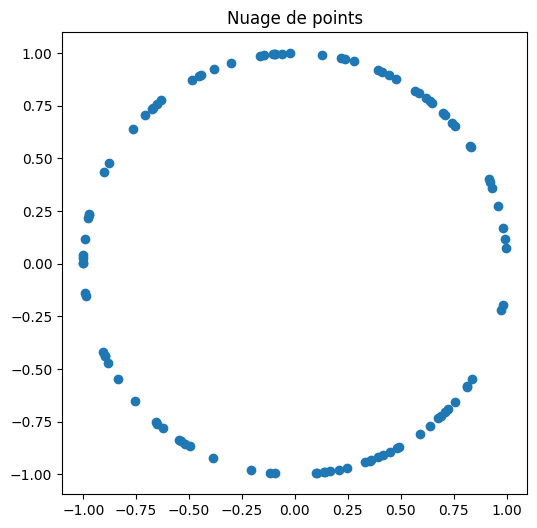

In [ ]:
X = np.random.randn(100, 2)
X /= np.linalg.norm(X, axis=1)[:, None].repeat(2, axis=1)


fig = plt.figure(figsize=(6, 6))
plt.scatter(X[:,0], X[:,1])
plt.title("Nuage de points") and plt.show()

On définit ici les paramètres du problème (dimension n des données d’entrée, ici n=2, et dimension de l’espace latent). Ils pourront être modifiés par la suite ci-besoin.

In [ ]:
data_dim = X.shape[-1]
hidden_dim = 10

---
<span style='color:Green'>**Question**</span>

Écrire en utilisant l’interface [nn.Sequential](https://pytorch.org/docs/stable/generated/torch.nn.Sequential.html) de PyTorch:

- un générateur $G$ entièrement connecté à 3 couches qui projette un vecteur z de l’espace latent de dimension hidden_dim vers un échantillon de dimension data_dim (dimension des données d’entrée),

- un discriminateur $D$ entièrement connecté à 3 couches qui à partir d’un vecteur de données (réel ou faux) produit en sortie un valeur entre 0 et 1 (obtenue en passant le score dans une sigmoïde).

---

In [ ]:
generator = nn.Sequential(
    nn.Linear(hidden_dim, 128),
    nn.ReLU(),
    nn.Linear(128, 256),
    nn.ReLU(),
    nn.Linear(256, data_dim),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Linear(data_dim, 256),
    nn.ReLU(),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Linear(128, 1),
    nn.Sigmoid()
)

Pour créer le jeu d’apprentissage, torch dispose d’une fonction bien pratique qui permet de transformer automatiquement une matrice d’observation en Dataset. Nous pouvons créer le DataLoader dans la foulée :

In [ ]:
from torch.utils import data

dataset = data.TensorDataset(torch.Tensor(X))
dataloader = data.DataLoader(dataset, batch_size=100)

(modifiez le paramètre batch_size si jamais vous ne disposez pas de suffisamment de mémoire ou si les calculs sont trop lents)

L’apprentissage des poids des réseaux $D$ et $G$ se fait par des mises à jour séparées. Nous aurons donc besoin de deux optimiseurs différents, un qui porte sur les paramètres du générateur et l’autre qui portent sur les paramètres du discriminateur :

In [ ]:
G_optimizer = torch.optim.Adam(generator.parameters())
D_optimizer = torch.optim.Adam(discriminator.parameters())

---
<span style='color:Green'>**Question**</span>

Compléter la boucle d’apprentissage ci-dessous, et notamment le calcul des fonctions de coût pour le générateur et pour le discriminateur. On rappelle que :

le discriminateur cherche à maximiser $L_D = \log D(x) + \log{(1 - D(\hat{x}))}$ où $x$ sont des données réelles et $\hat{x}$  des données générées ($\hat{x} = G(z)$), c’est-à-dire que la sortie de la sigmoïde du discriminateur doit valoir 1 pour les données réelles et 0 pour les données fausses,

le générateur cherche à minimiser $L_G=\log(1−D(\hat{x}))=\log(1−D(G(z))$, c’est à dire tromper le discriminateur en le poussant à prédire que des données fausses sont réelles.

L’algorithme d’apprentissage du GAN est donc le suivant :

- Tant que la convergence n’est pas atteinte

- Tirer un batch $x$ de données réelles

- Tirer un bruit aléatoire $ z \in \mathcal{N}(0,1)$

- Générer des fausses données $G(z)$

- Générer les labels pour les données réelles et synthétiques

- Calculer la fonction de coût de $G$ sur les données synthétiques

- Faire un pas d’optimisation sur $G$

- Calculer la fonction de coût de $D$ sur les données réelles + fausses

- Faire un pas d’optimisation de $D$

- On rappelle que la méthode .backward() permet de rétropropager les gradients d’un tenseur et que optimizer.step() permet ensuite de réaliser un pas de descente de gradient (mise à jour des poids).

**Attention:** il ne faut pas rétropropager le gradient dans $G$ lorsque vous réalisez une itération sur $D$. Cela peut se faire à l’aide de la méthode .detach() qui permet de signifier à PyTorch que vous n’aurez pas besoin du gradient pour le tenseur concerné.

---

In [ ]:
from tqdm.notebook import tqdm, trange

In [ ]:
for epoch in trange(10000):
    for real_data, in dataloader:
        # Échantillonne des codes au hasard dans l'espace latent
        z = torch.randn(real_data.size(0), hidden_dim)

        # Classe "faux" = 0
        fake_labels = torch.zeros(real_data.size(0), 1)

        # Classe "vrai" = 1
        real_labels = torch.ones(real_data.size(0), 1)


        # Entraîne le générateur
        G_optimizer.zero_grad()
        fake_data = generator(z)
        output_fake = discriminator(fake_data)
        loss_G = torch.nn.functional.binary_cross_entropy(output_fake, real_labels)
        loss_G.backward()
        G_optimizer.step()

        # Entraîne le discriminateur
        D_optimizer.zero_grad()
        output_real = discriminator(real_data)
        loss_real = torch.nn.functional.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(fake_data.detach())
        loss_fake = torch.nn.functional.binary_cross_entropy(output_fake, fake_labels)
        loss_D = loss_real + loss_fake
        loss_D.backward()
        D_optimizer.step()


  0%|          | 0/10000 [00:00<?, ?it/s]

---
<span style='color:Green'>**Question**</span>

Tirez aléatoirement des vecteurs z de bruit selon une loi normale. Générez les points associés et visualisez côte à côte le nuage de points réel et le nuage de points synthétique.

---

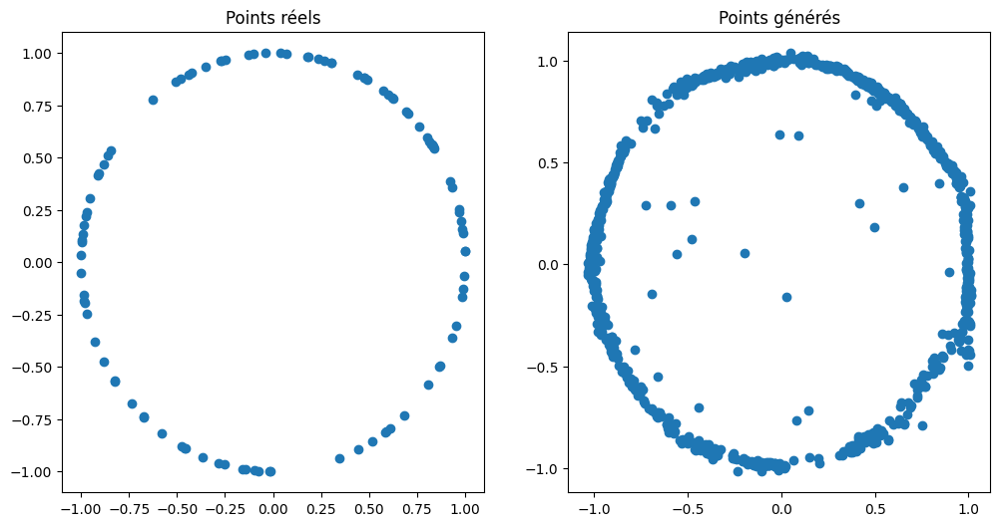

In [ ]:
# Résultat prof

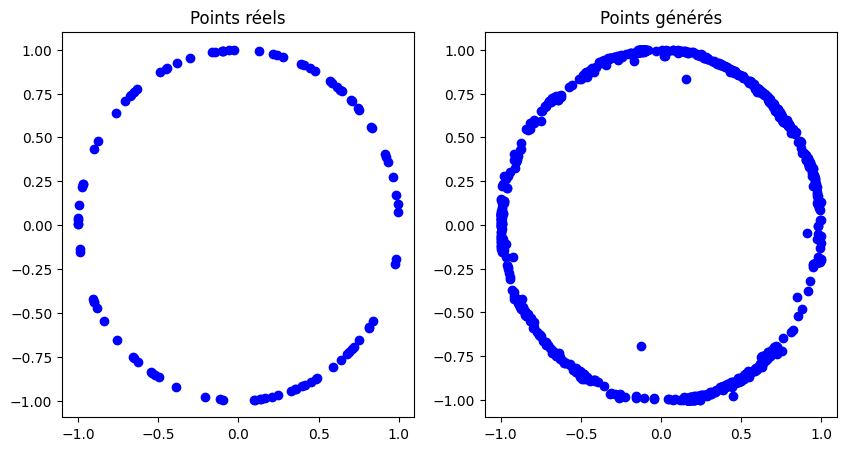

In [ ]:
# Nombre de points à générer
num_points = 1000

# Génère des vecteurs de bruit aléatoire z selon une loi normale
noise = torch.randn(num_points, hidden_dim)

generated_data = generator(noise).detach().numpy()

plt.figure(figsize=(10,5))

real_data = next(iter(dataloader))[0].numpy()
plt.subplot(1,2,1)
plt.scatter(real_data[:,0], real_data[:,1], color='blue', label='Real Data')
plt.title('Points réels')

plt.subplot(1,2,2)
plt.scatter(generated_data[:,0], generated_data[:,1], color='blue', label='Generated Data')
plt.title('Points générés')

plt.show()

---
<span style='color:Green'>**Question**</span>

Colorez les points générés en fonction de la classe (“real” ou “fake”) prédite par le discriminateur. On mettera le seuil à 0.5.

---

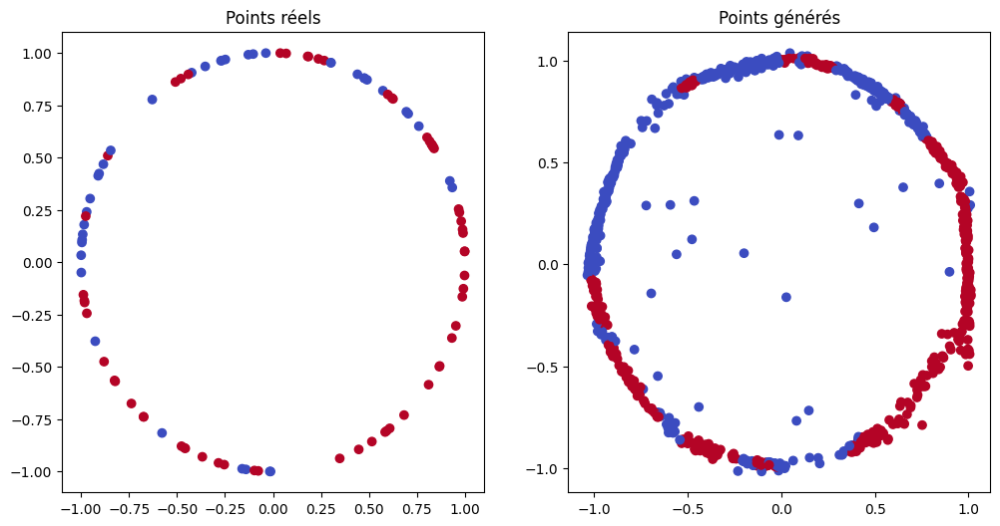

In [ ]:
# Résultat prof

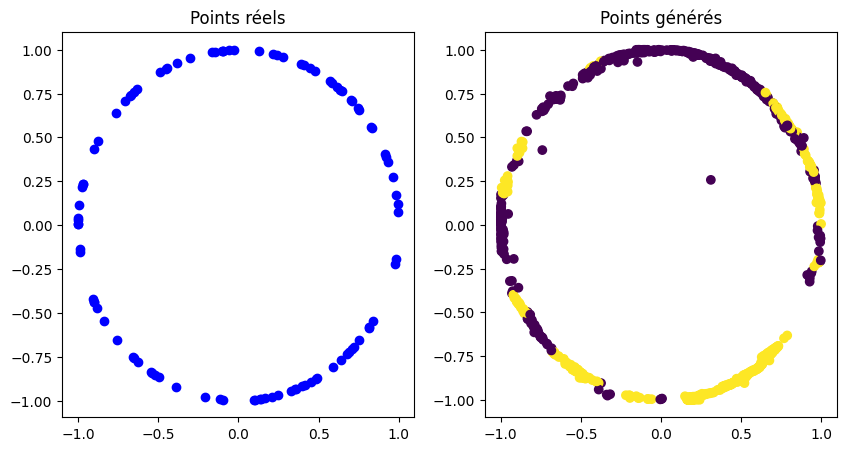

In [ ]:
# Nombre de points à générer
num_points = 1000

# Génère des vecteurs de bruit aléatoire z selon une loi normale
noise = torch.randn(num_points, hidden_dim)

generated_data = generator(noise).detach().numpy()

with torch.no_grad():
  discriminator_output = discriminator(torch.Tensor(generated_data))

predicted_labels = (discriminator_output.numpy() > 0.5).astype(int)

plt.figure(figsize=(10,5))

# Points réels
real_data = next(iter(dataloader))[0].numpy()
plt.subplot(1,2,1)
plt.scatter(real_data[:,0], real_data[:,1], color='blue', label='Real Data')
plt.title('Points réels')

# Points synthétiques
plt.subplot(1,2,2)
plt.scatter(generated_data[:,0], generated_data[:,1], c=predicted_labels, cmap='viridis', label='Generated Data')
plt.title('Points générés')

plt.show()

---
<span style='color:Green'>**Question (Optionnelle)**</span>


Repmlaçez le jeu de données $X$ défini plus haut par les deux demi-lunes ou le swiss roll ci-dessous et répondez aux mêmes questions.

---



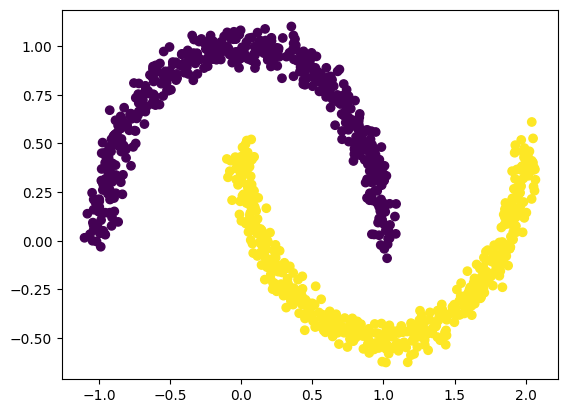

In [ ]:
from sklearn import datasets

X, y = datasets.make_moons(n_samples=1000, noise=0.05)
plt.scatter(X[:,0], X[:, 1], c=y)
plt.show()

In [ ]:
data_dim = X.shape[-1]
hidden_dim = 10

generator = nn.Sequential(
    nn.Linear(hidden_dim, 128),
    nn.ReLU(),
    nn.Linear(128, 256),
    nn.ReLU(),
    nn.Linear(256, data_dim),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Linear(data_dim, 256),
    nn.ReLU(),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Linear(128, 1),
    nn.Sigmoid()
)

In [ ]:
dataset = data.TensorDataset(torch.Tensor(X))
dataloader = data.DataLoader(dataset, batch_size=100)

G_optimizer = torch.optim.Adam(generator.parameters())
D_optimizer = torch.optim.Adam(discriminator.parameters())

In [ ]:
for epoch in trange(10000):
    for real_data, in dataloader:
        # Échantillonne des codes au hasard dans l'espace latent
        z = torch.randn(real_data.size(0), hidden_dim)

        # Classe "faux" = 0
        fake_labels = torch.zeros(real_data.size(0), 1)

        # Classe "vrai" = 1
        real_labels = torch.ones(real_data.size(0), 1)


        # Entraîne le générateur
        G_optimizer.zero_grad()
        fake_data = generator(z)
        output_fake = discriminator(fake_data)
        loss_G = torch.nn.functional.binary_cross_entropy(output_fake, real_labels)
        loss_G.backward()
        G_optimizer.step()

        # Entraîne le discriminateur
        D_optimizer.zero_grad()
        output_real = discriminator(real_data)
        loss_real = torch.nn.functional.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(fake_data.detach())
        loss_fake = torch.nn.functional.binary_cross_entropy(output_fake, fake_labels)
        loss_D = loss_real + loss_fake
        loss_D.backward()
        D_optimizer.step()

  0%|          | 0/10000 [00:00<?, ?it/s]

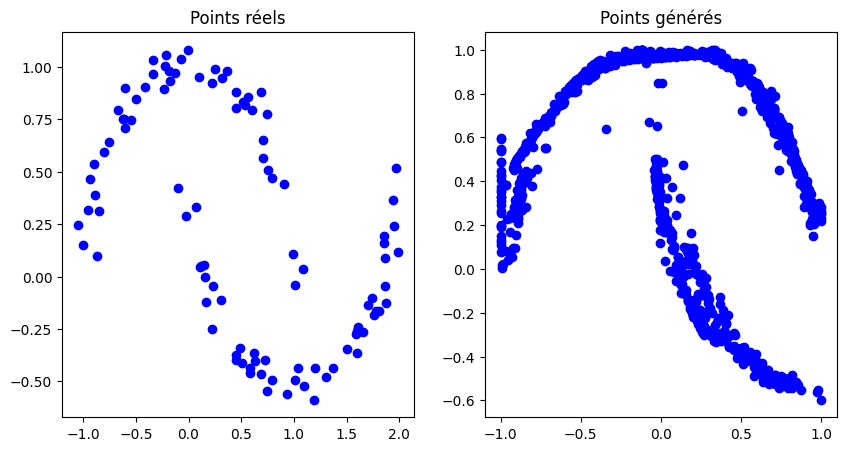

In [ ]:
# Nombre de points à générer
num_points = 1000

# Génère des vecteurs de bruit aléatoire z selon une loi normale
noise = torch.randn(num_points, hidden_dim)

generated_data = generator(noise).detach().numpy()

plt.figure(figsize=(10,5))

real_data = next(iter(dataloader))[0].numpy()
plt.subplot(1,2,1)
plt.scatter(real_data[:,0], real_data[:,1], color='blue', label='Real Data')
plt.title('Points réels')

plt.subplot(1,2,2)
plt.scatter(generated_data[:,0], generated_data[:,1], color='blue', label='Generated Data')
plt.title('Points générés')

plt.show()

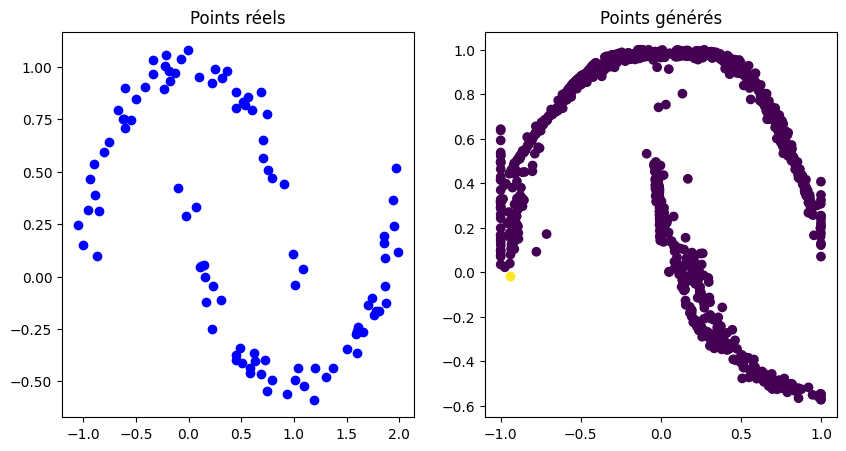

In [ ]:
# Nombre de points à générer
num_points = 1000

# Génère des vecteurs de bruit aléatoire z selon une loi normale
noise = torch.randn(num_points, hidden_dim)

generated_data = generator(noise).detach().numpy()

with torch.no_grad():
  discriminator_output = discriminator(torch.Tensor(generated_data))

predicted_labels = (discriminator_output.numpy() > 0.5).astype(int)

plt.figure(figsize=(10,5))

# Points réels
real_data = next(iter(dataloader))[0].numpy()
plt.subplot(1,2,1)
plt.scatter(real_data[:,0], real_data[:,1], color='blue', label='Real Data')
plt.title('Points réels')

# Points synthétiques
plt.subplot(1,2,2)
plt.scatter(generated_data[:,0], generated_data[:,1], c=predicted_labels, cmap='viridis', label='Generated Data')
plt.title('Points générés')

plt.show()

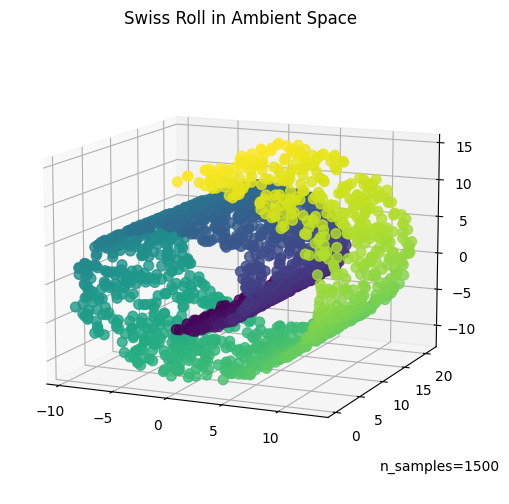

In [ ]:
# Générer des données Swiss Roll
X, y = datasets.make_swiss_roll(n_samples=2000, noise=0.05)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")
fig.add_axes(ax)
ax.scatter( X[:, 0], X[:, 1], X[:, 2], c=y, s=50, alpha=0.8)
ax.set_title("Swiss Roll in Ambient Space")
ax.view_init(azim=-66, elev=12)
_ = ax.text2D(0.8, 0.05, s="n_samples=1500", transform=ax.transAxes)

---
<span style='color:#0d5874'> **Exercice 2 : Génération de chiffres manuscrits avec MNIST** </span>

---

On va reprendre le code précédent et l’adapter à la dimensionalité de MNIST. On rappelle qu’une image de MNIST est de dimensions 28×28, c’est-à-dire un vecteur de dimension 784 une fois aplati. On va implémenter un GAN conditionnel sur MNIST. On utilisera comme vecteur de conditionnement y la classe du chiffre sous forme de vecteur suivant l’encodage one-hot.

On commence par récupérer charger le jeu de données :


In [2]:
from torch.utils import data
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor

train_mnist = MNIST(root="./data/", train=True, download=True, transform=ToTensor())
mnist_loader = data.DataLoader(train_mnist, shuffle=True, batch_size=128, num_workers=1)
device = "cuda" if torch.cuda.is_available else "cpu" # Utilise le GPU si disponible

100%|██████████| 9912422/9912422 [00:00<00:00, 292422200.81it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 32354619.08it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 186417191.75it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 18108867.65it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



---
<span style='color:Green'>**Question**</span>

On voudrait que le générateur produise des images de 28x28 pixels, et donc un vecteur applati de 784. On utilisera 100 comme dimension de l'espace latent + 10 qui correspond à l'encodage one-hot du label.  

On définit le génerateur et discriminateur comme suit :

Générateur :

1. Linear(in_features=hidden_dim + 10, out_features=1024) ReLU()
2. Linear(in_features=1024, out_features=1024) ReLU()
3. Linear(in_features=1024, out_features=data_dim) Sigmoid()


Discriminateur :

1. Linear(in_features=data_dim + 10, out_features=64) LeakyReLU() Dropout()
2. Linear(in_features=64, out_features=64) Dropout() LeakyReLU()
3. Linear(in_features=64, out_features=1) Sigmoid()


---


In [3]:
hidden_dim = 100
data_dim = 784

generator = nn.Sequential(
    nn.Linear(in_features=hidden_dim + 10, out_features=1024),
    nn.ReLU(),
    nn.Linear(in_features=1024, out_features=1024),
    nn.ReLU(),
    nn.Linear(in_features=1024, out_features=data_dim),
    nn.Sigmoid()
)

discriminator = nn.Sequential(
    nn.Linear(in_features=data_dim + 10, out_features=64),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.Linear(in_features=64, out_features=64),
    nn.Dropout(),
    nn.LeakyReLU(),
    nn.Linear(in_features=64, out_features=1),
    nn.Sigmoid()
)

---
<span style='color:Green'>**Question**</span>

- A quoi sert l'utilisation des Dropout() dans le discriminateur?
- C'est quoi la différence entre une ReLU() et la LeakyReLU() ?

Définissez les optimiseurs dont on a besoin pour l'apprentissage. Le learning rate est à choisir judicieusement.

---

**A quoi sert l'utilisation des Dropout() dans le discriminateur?**

 Le Dropout est une technique de régularisation utilisée pour prévenir le surajustement dans les réseaux de neurones. Il consiste à aléatoirement "désactiver" un certain pourcentage de neurones pendant l'entraînement. Cela force le modèle à être plus résilient et à ne pas trop dépendre de certains neurones spécifiques. Dans le cas du discriminateur GAN, l'utilisation de Dropout peut aider à éviter que le modèle ne mémorise trop les données d'entraînement, favorisant ainsi une meilleure généralisation.

**C'est quoi la différence entre une ReLU() et la LeakyReLU() ?**

La Leaky ReLU est une variante de ReLU qui permet à une petite pente, généralement un petit coefficient alpha, pour les valeurs négatives. Mathématiquement, LeakyReLU(x, alpha) = max(alpha * x, x). L'introduction de cette petite pente aide à surmonter certains des problèmes associés à ReLU, comme la "mort des neurones" (les neurones qui ne sont jamais activés).

In [4]:
G_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002)
D_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002)

On vous fournit la fonction plot_image qui prend en paramètre le générateur, un bruit z et le chiffre qu'on veut générer (0 par défaut). Dans cette fonction, on concatène le label du digit qu'on veut générer au z sous forme encodée. On met ce bruit en entrée de notre générateur qui génère des images de zéro par défaut. Le résultat est réorganisé sous une forme 2D.

**Note :** le z devra être de taille 10 x hidden_dim, on génère 10 images à la fois

In [5]:
def plot_images(generator, z, digit=0):
    c = torch.zeros((10, 10))
    c[:, digit] = 1.
    z = torch.concat((z, c), dim=1)
    z = z.to(device)
    with torch.no_grad():
        samples = generator(z)
    fig, axis = plt.subplots(1, 10, figsize=(15, 10))
    for idx, sample in enumerate(samples):
        sample = sample.to("cpu").numpy().reshape(28, 28)
        axis[idx].imshow(sample, cmap="gray")
        axis[idx].axis("off")
    plt.show()

---
<span style='color:Green'>**Question**</span>

Compléter la boucle d'apprentissage ci-dessous. Vous pouvez utiliser la fonction ‘F.one_hot‘ pour l'encodage des labels. Le processus est le même que tout à l'heure.

Pour chaque epoch, on affiche le résultat du génerateur appliqué au z_display.

---

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 0.987, Generator: 1.732


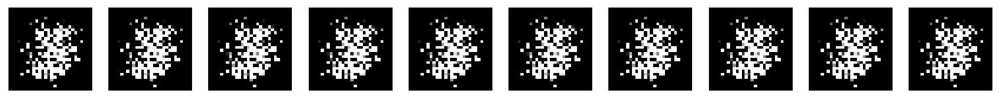

Epoch 1; Discriminator: 0.909, Generator: 2.732


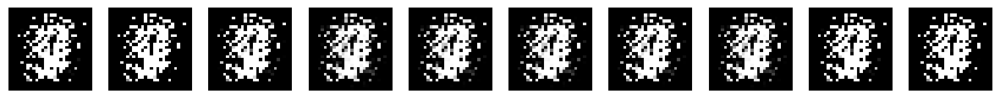

Epoch 2; Discriminator: 0.666, Generator: 2.039


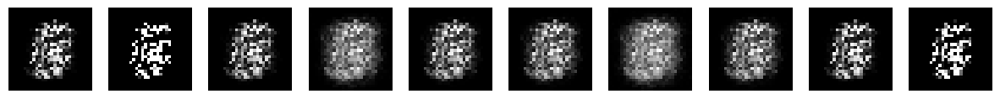

Epoch 3; Discriminator: 0.721, Generator: 1.417


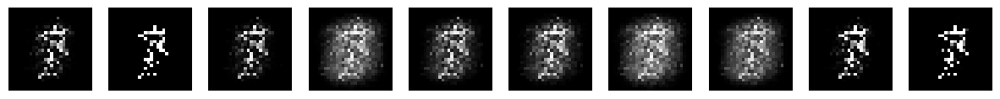

Epoch 4; Discriminator: 0.521, Generator: 2.201


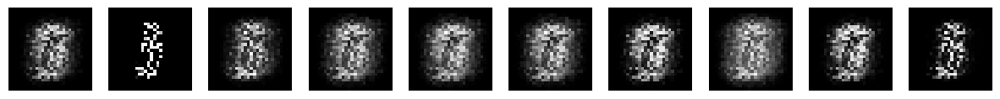

Epoch 5; Discriminator: 0.636, Generator: 2.082


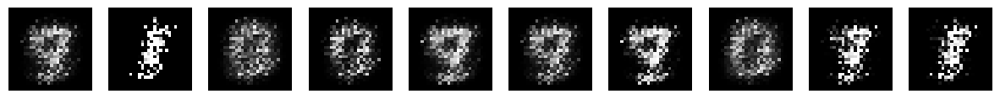

Epoch 6; Discriminator: 0.629, Generator: 2.333


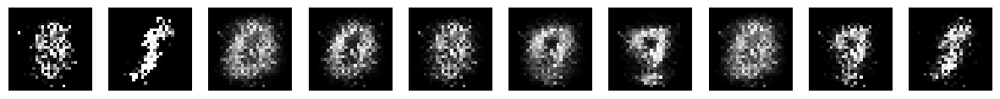

Epoch 7; Discriminator: 0.648, Generator: 1.867


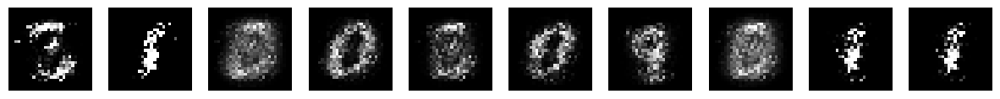

Epoch 8; Discriminator: 0.711, Generator: 1.847


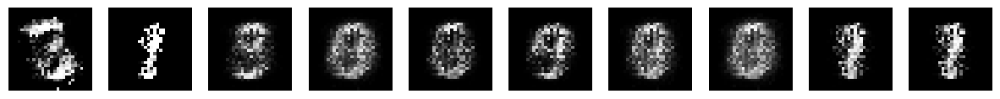

Epoch 9; Discriminator: 0.886, Generator: 1.593


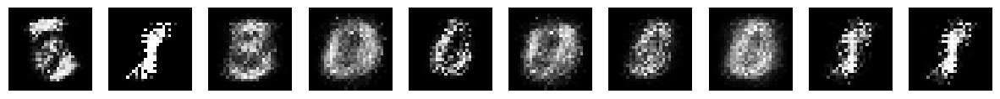

Epoch 10; Discriminator: 0.783, Generator: 1.769


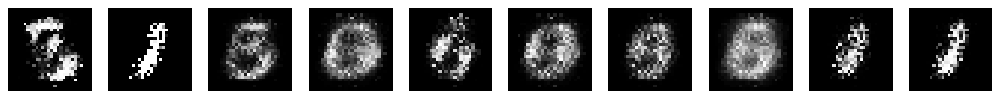

Epoch 11; Discriminator: 0.756, Generator: 1.659


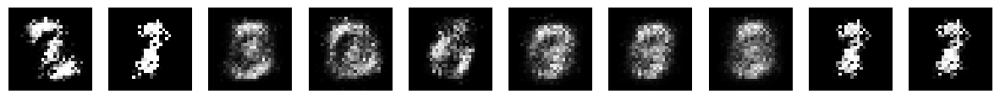

Epoch 12; Discriminator: 0.992, Generator: 1.311


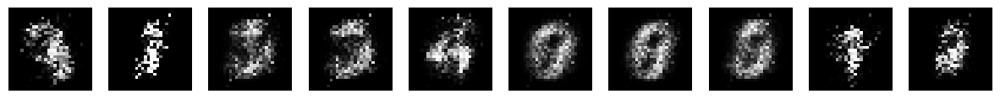

Epoch 13; Discriminator: 0.982, Generator: 1.168


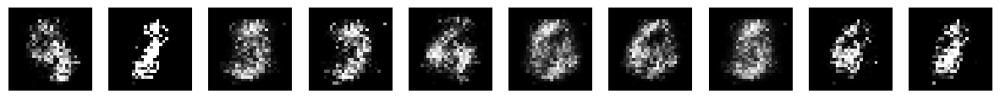

Epoch 14; Discriminator: 1.095, Generator: 1.086


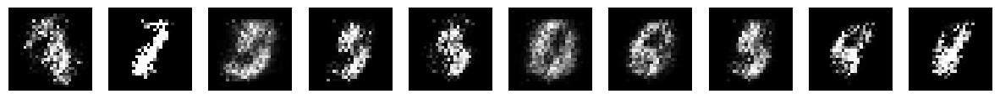

Epoch 15; Discriminator: 0.972, Generator: 1.097


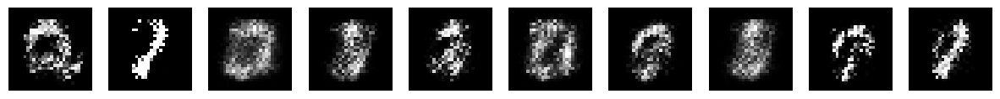

Epoch 16; Discriminator: 1.121, Generator: 1.068


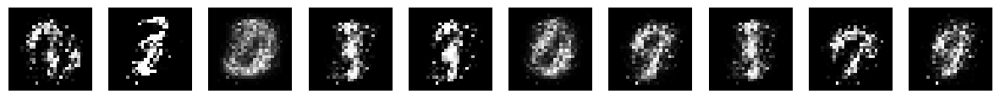

Epoch 17; Discriminator: 1.236, Generator: 1.159


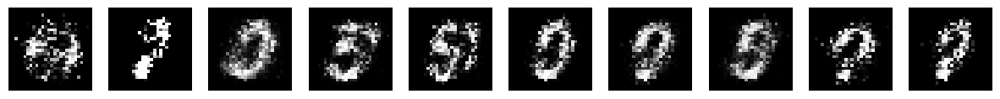

Epoch 18; Discriminator: 1.226, Generator: 0.988


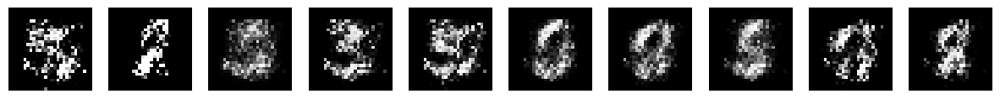

Epoch 19; Discriminator: 1.102, Generator: 0.943


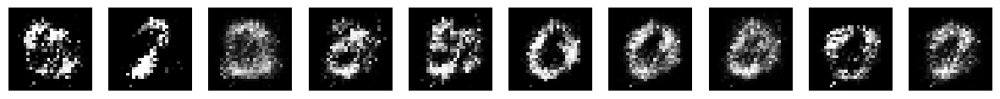

Epoch 20; Discriminator: 1.306, Generator: 0.767


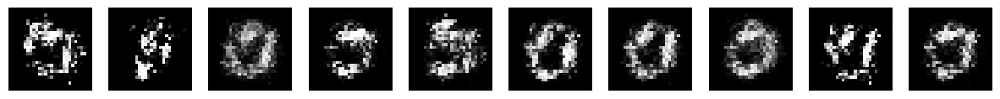

Epoch 21; Discriminator: 1.339, Generator: 0.812


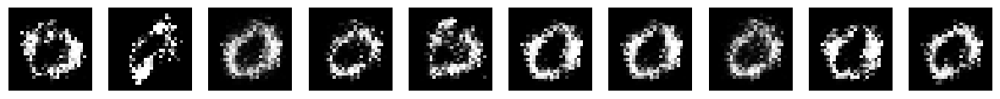

Epoch 22; Discriminator: 1.295, Generator: 0.739


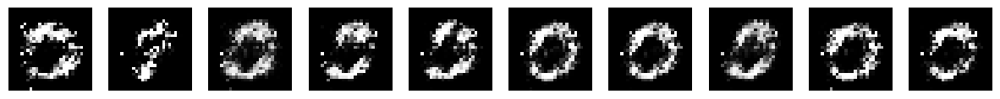

Epoch 23; Discriminator: 1.328, Generator: 0.782


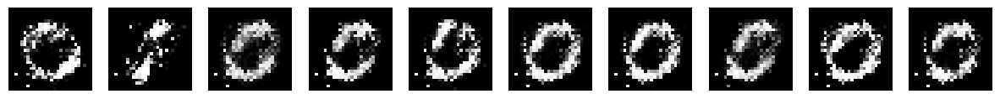

Epoch 24; Discriminator: 1.321, Generator: 0.751


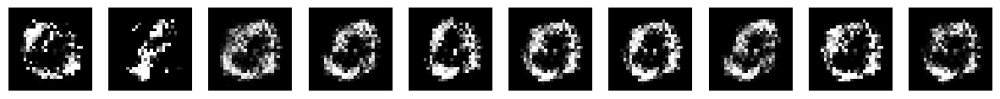

Epoch 25; Discriminator: 1.348, Generator: 0.692


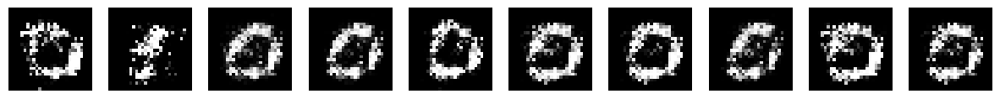

Epoch 26; Discriminator: 1.363, Generator: 0.646


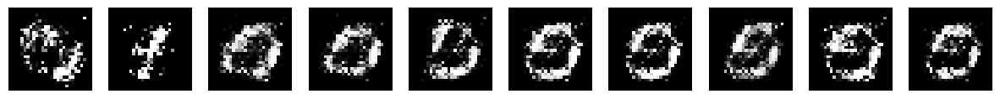

Epoch 27; Discriminator: 1.379, Generator: 0.723


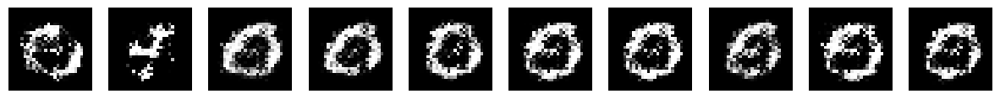

Epoch 28; Discriminator: 1.398, Generator: 0.722


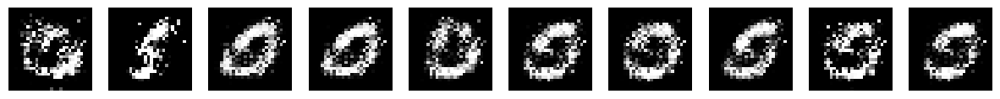

Epoch 29; Discriminator: 1.351, Generator: 0.742


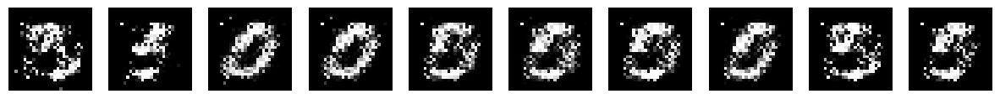

Epoch 30; Discriminator: 1.313, Generator: 0.856


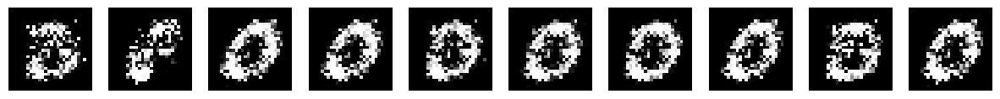

Epoch 31; Discriminator: 1.330, Generator: 0.705


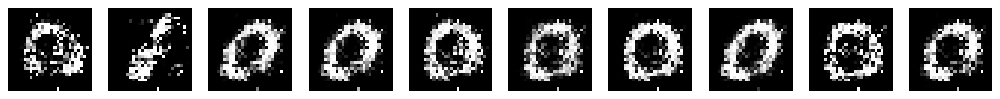

Epoch 32; Discriminator: 1.453, Generator: 0.761


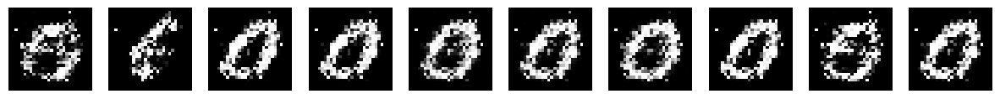

Epoch 33; Discriminator: 1.436, Generator: 0.707


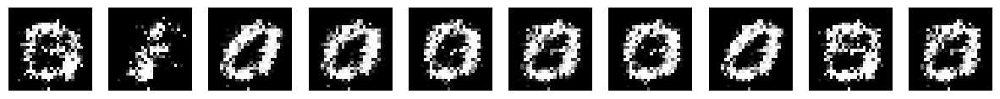

Epoch 34; Discriminator: 1.341, Generator: 0.761


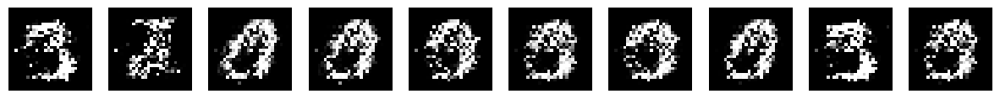

Epoch 35; Discriminator: 1.375, Generator: 0.749


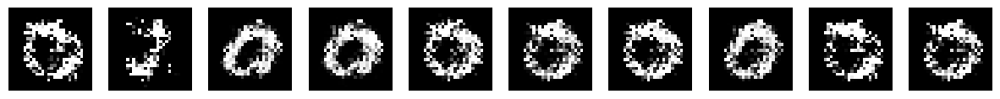

Epoch 36; Discriminator: 1.343, Generator: 0.753


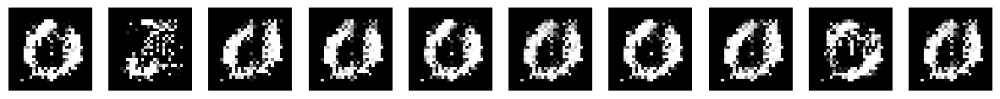

Epoch 37; Discriminator: 1.401, Generator: 0.727


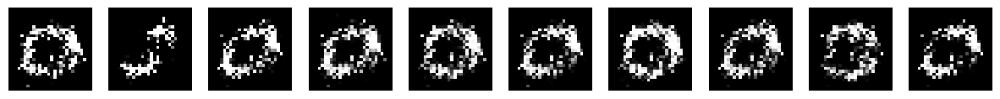

Epoch 38; Discriminator: 1.387, Generator: 0.708


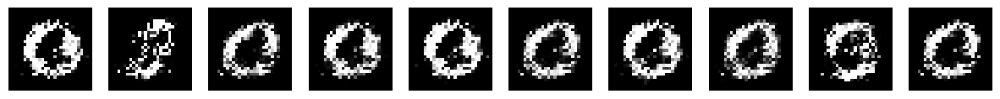

Epoch 39; Discriminator: 1.295, Generator: 0.829


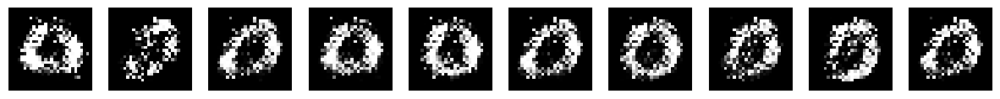

Epoch 40; Discriminator: 1.372, Generator: 0.772


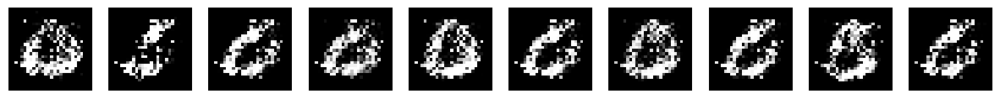

Epoch 41; Discriminator: 1.348, Generator: 0.732


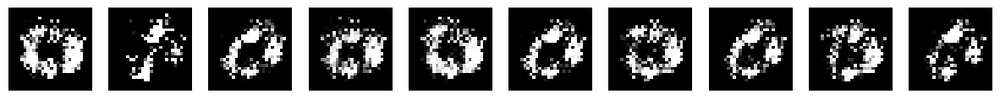

Epoch 42; Discriminator: 1.379, Generator: 0.718


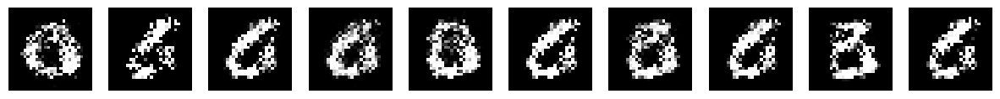

Epoch 43; Discriminator: 1.357, Generator: 0.764


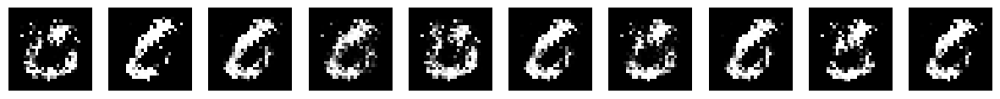

Epoch 44; Discriminator: 1.375, Generator: 0.696


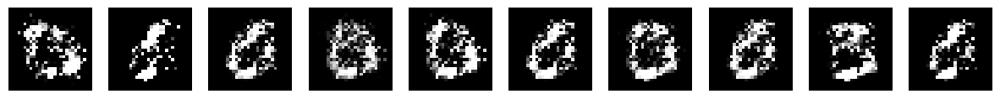

Epoch 45; Discriminator: 1.347, Generator: 0.722


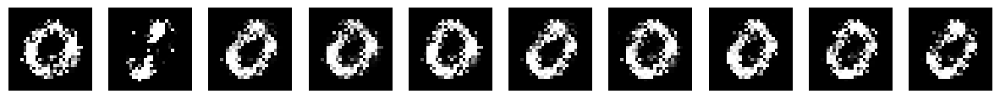

Epoch 46; Discriminator: 1.324, Generator: 0.731


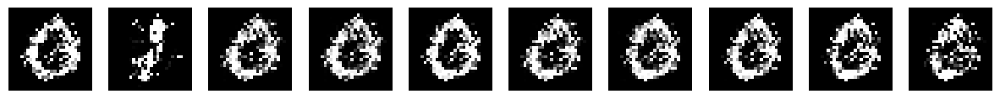

Epoch 47; Discriminator: 1.362, Generator: 0.690


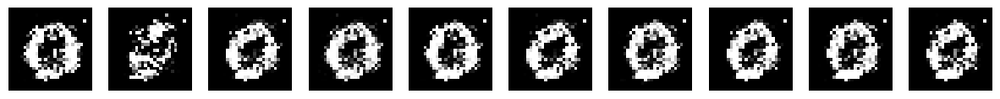

Epoch 48; Discriminator: 1.347, Generator: 0.752


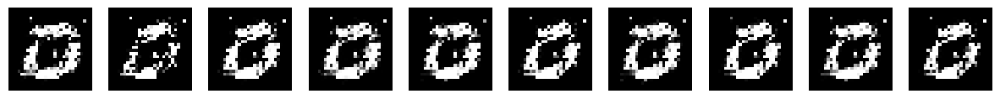

Epoch 49; Discriminator: 1.369, Generator: 0.732


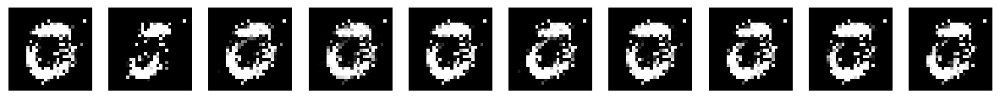

Epoch 50; Discriminator: 1.282, Generator: 0.761


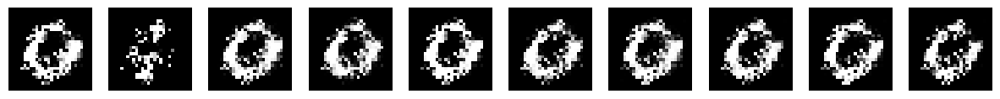

Epoch 51; Discriminator: 1.381, Generator: 0.805


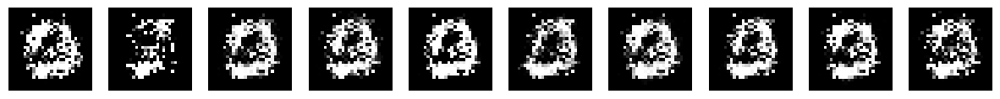

Epoch 52; Discriminator: 1.361, Generator: 0.814


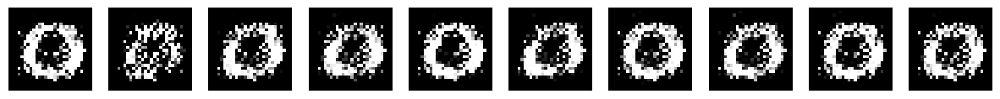

Epoch 53; Discriminator: 1.323, Generator: 0.773


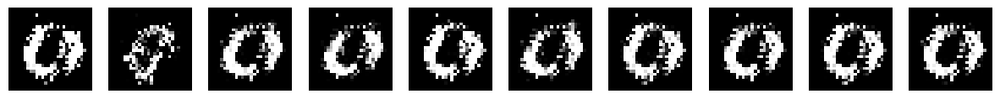

Epoch 54; Discriminator: 1.238, Generator: 0.664


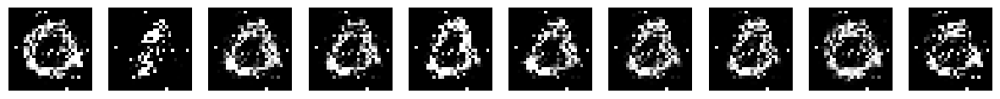

Epoch 55; Discriminator: 1.261, Generator: 0.895


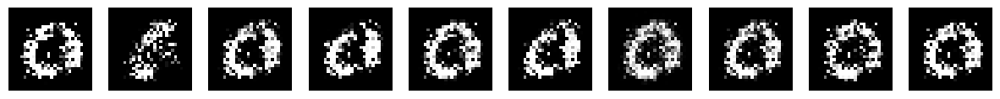

Epoch 56; Discriminator: 1.313, Generator: 0.765


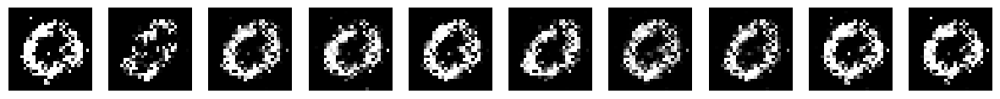

Epoch 57; Discriminator: 1.094, Generator: 0.789


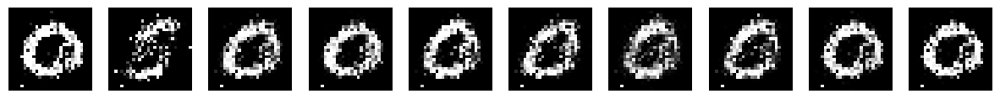

Epoch 58; Discriminator: 1.251, Generator: 0.798


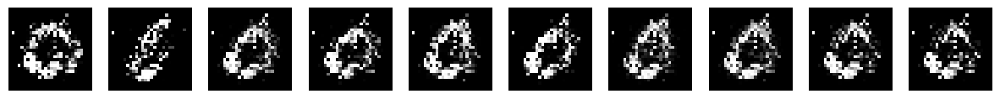

Epoch 59; Discriminator: 1.487, Generator: 0.702


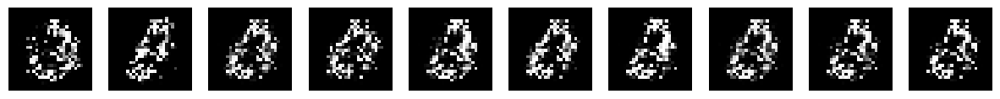

Epoch 60; Discriminator: 1.403, Generator: 0.757


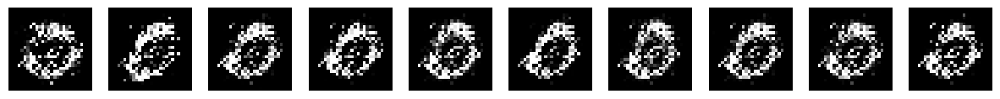

Epoch 61; Discriminator: 1.373, Generator: 0.715


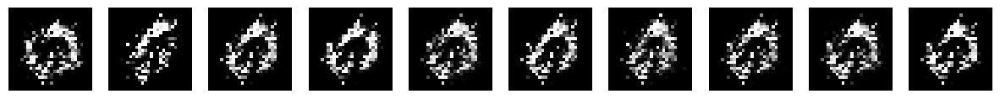

Epoch 62; Discriminator: 1.394, Generator: 0.726


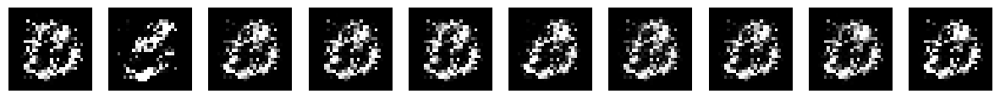

Epoch 63; Discriminator: 1.367, Generator: 0.779


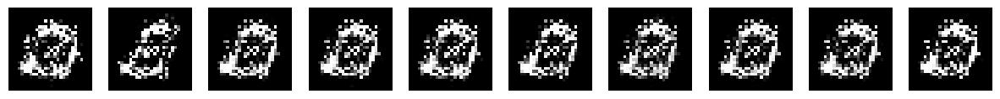

Epoch 64; Discriminator: 1.361, Generator: 0.704


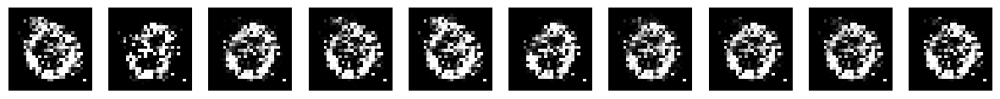

Epoch 65; Discriminator: 1.341, Generator: 0.735


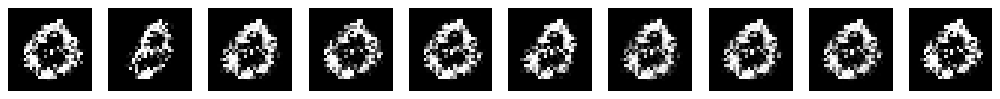

Epoch 66; Discriminator: 1.367, Generator: 0.754


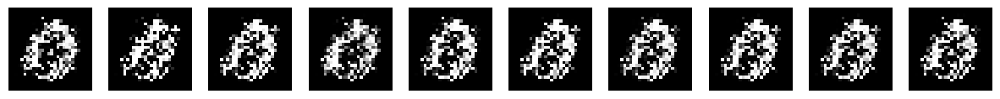

Epoch 67; Discriminator: 1.389, Generator: 0.743


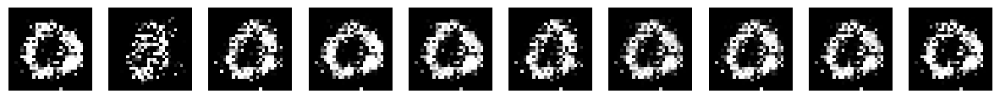

Epoch 68; Discriminator: 1.304, Generator: 0.835


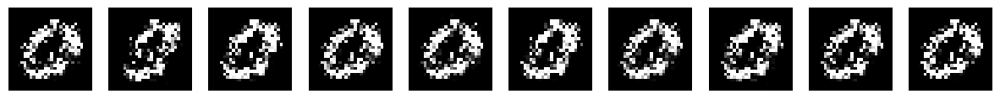

Epoch 69; Discriminator: 1.346, Generator: 0.700


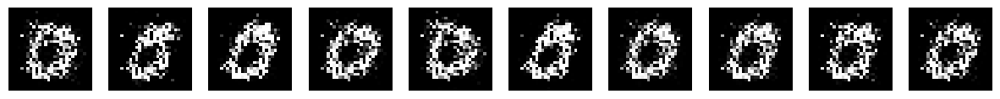

Epoch 70; Discriminator: 1.338, Generator: 0.705


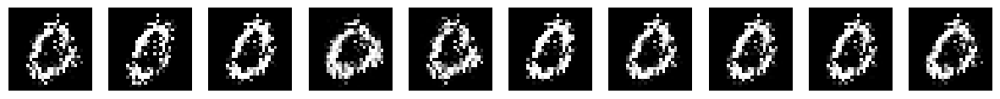

Epoch 71; Discriminator: 1.385, Generator: 0.687


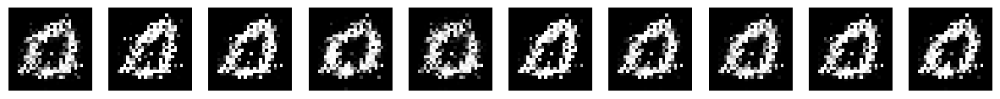

Epoch 72; Discriminator: 1.393, Generator: 0.683


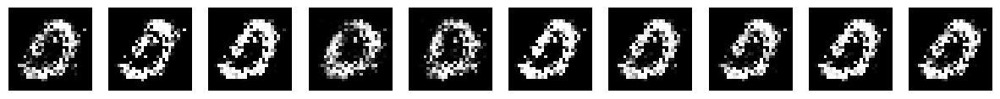

Epoch 73; Discriminator: 1.371, Generator: 0.729


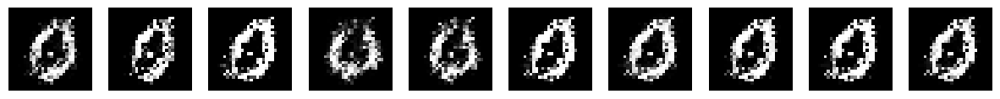

Epoch 74; Discriminator: 1.355, Generator: 0.753


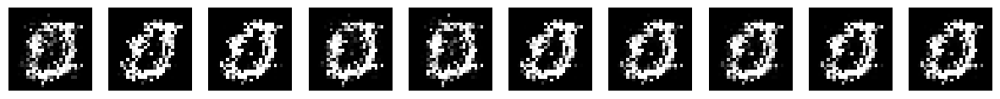

Epoch 75; Discriminator: 1.304, Generator: 0.848


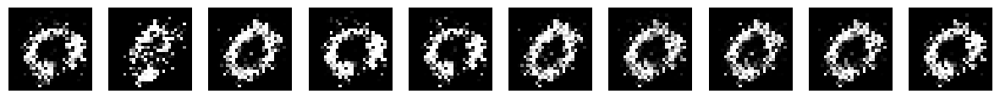

Epoch 76; Discriminator: 1.276, Generator: 0.722


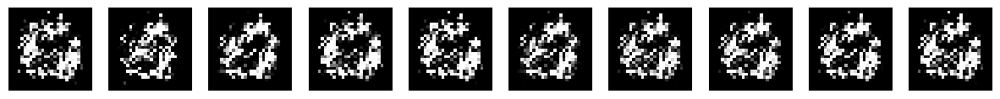

Epoch 77; Discriminator: 1.366, Generator: 0.716


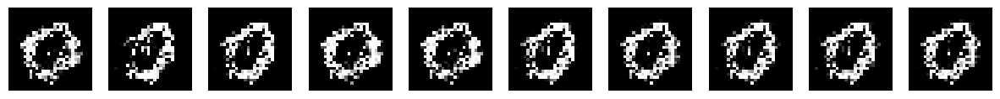

Epoch 78; Discriminator: 1.390, Generator: 0.694


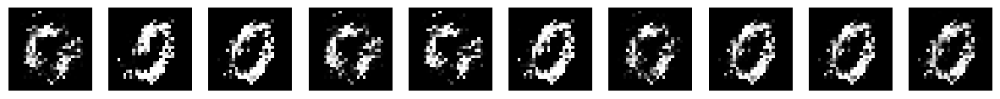

Epoch 79; Discriminator: 1.340, Generator: 0.757


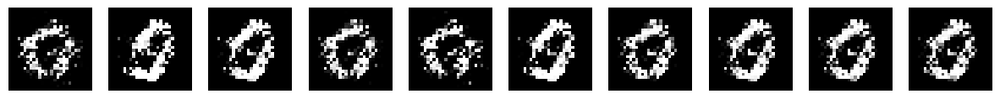

Epoch 80; Discriminator: 1.282, Generator: 0.767


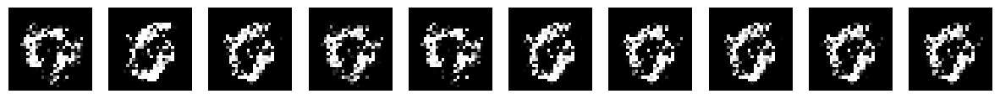

Epoch 81; Discriminator: 1.240, Generator: 0.925


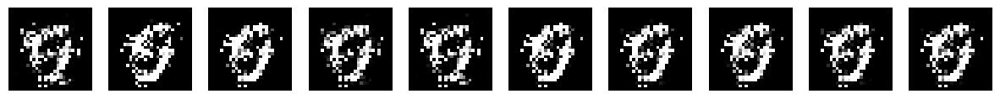

Epoch 82; Discriminator: 1.402, Generator: 0.723


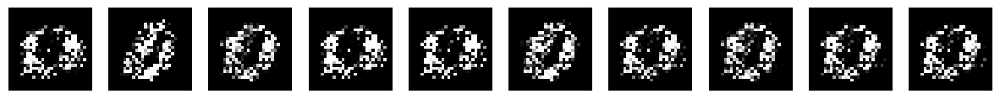

Epoch 83; Discriminator: 1.396, Generator: 0.765


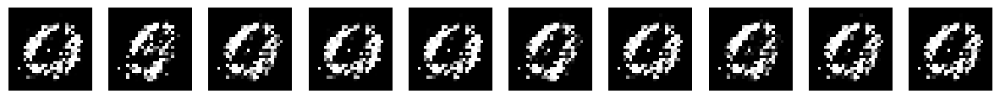

Epoch 84; Discriminator: 1.267, Generator: 0.739


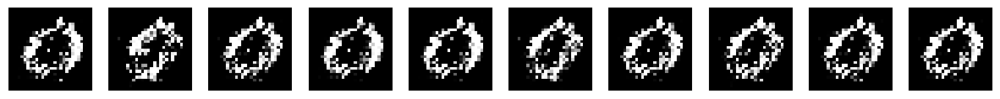

Epoch 85; Discriminator: 1.379, Generator: 0.744


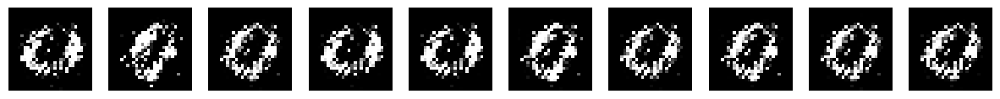

Epoch 86; Discriminator: 1.375, Generator: 0.722


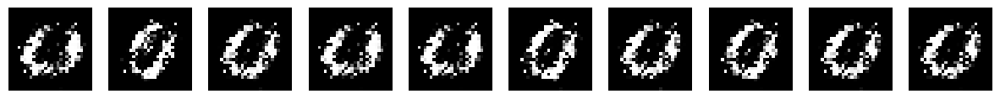

Epoch 87; Discriminator: 1.347, Generator: 0.726


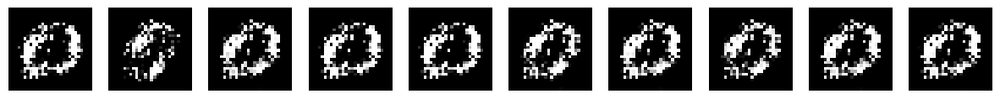

Epoch 88; Discriminator: 1.383, Generator: 0.728


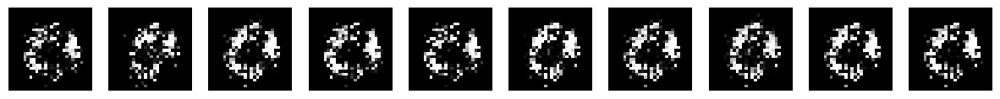

Epoch 89; Discriminator: 1.286, Generator: 0.942


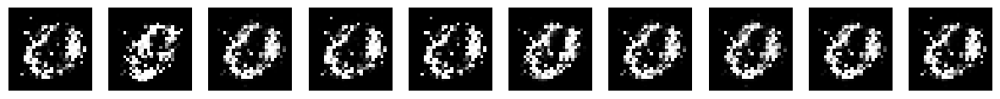

Epoch 90; Discriminator: 1.257, Generator: 0.795


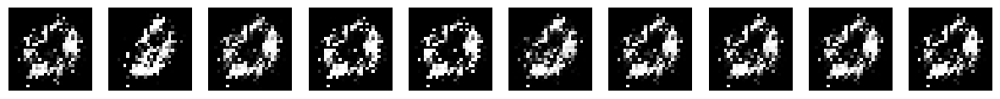

Epoch 91; Discriminator: 1.285, Generator: 0.742


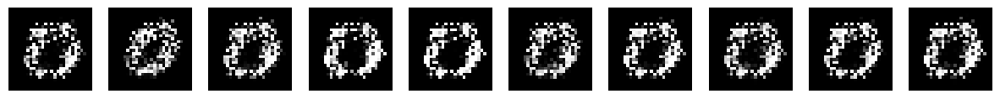

Epoch 92; Discriminator: 1.378, Generator: 0.701


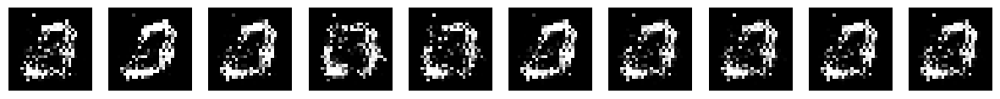

Epoch 93; Discriminator: 1.364, Generator: 0.693


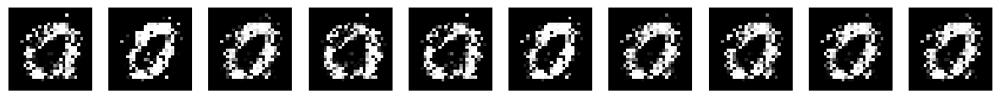

Epoch 94; Discriminator: 1.237, Generator: 0.789


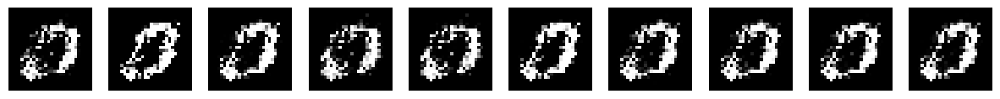

Epoch 95; Discriminator: 1.376, Generator: 0.713


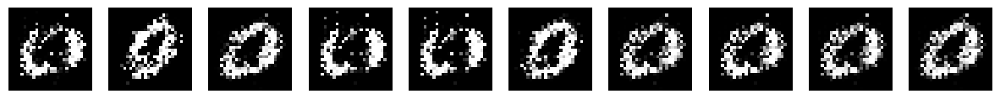

Epoch 96; Discriminator: 1.355, Generator: 0.708


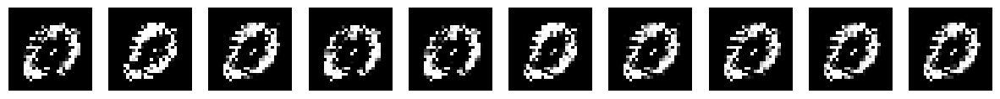

Epoch 97; Discriminator: 1.218, Generator: 0.804


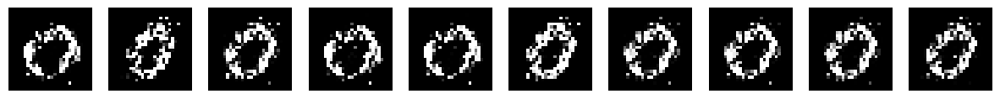

Epoch 98; Discriminator: 1.325, Generator: 0.762


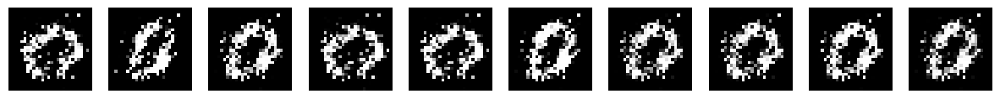

Epoch 99; Discriminator: 1.323, Generator: 0.818


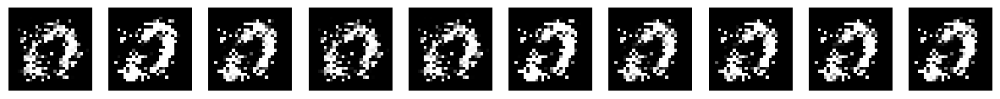

In [ ]:
from tqdm.notebook import trange, tqdm

device = "cuda" if torch.cuda.is_available else "cpu"


# Génerer un z de la taille 10 x hidden_dimension
z_display = torch.randn(10, hidden_dim)

generator = generator.to(device)
discriminator = discriminator.to(device)


for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display)
    #Chiffre 0 par défaut

---
<span style='color:Green'>**Question**</span>

Une fois le modèle entraîné, utiliser la fonction ‘plot_images‘ pour générer différents chiffres puis conclure

**Note :** Vous pouvez adapter le nombre d'epoch plus haut pour avoir de meilleurs résultats

---

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.217, Generator: 1.638


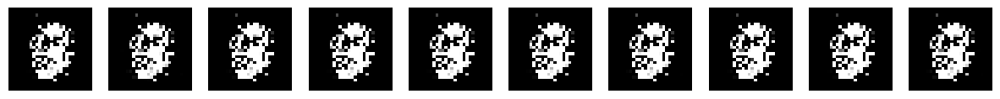

Epoch 1; Discriminator: 0.403, Generator: 3.051


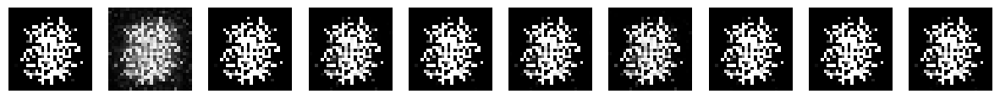

Epoch 2; Discriminator: 0.522, Generator: 2.085


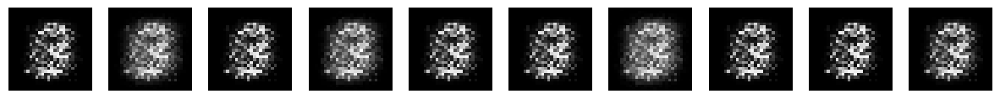

Epoch 3; Discriminator: 0.660, Generator: 1.318


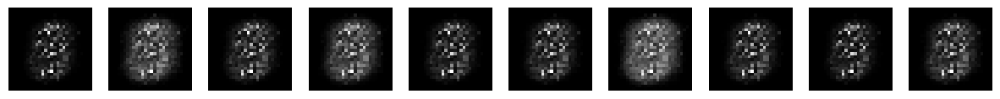

Epoch 4; Discriminator: 0.528, Generator: 2.207


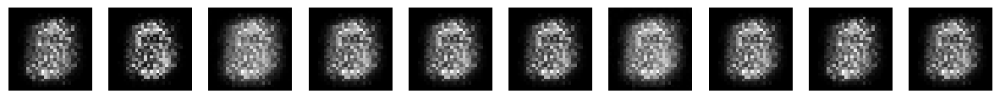

Epoch 5; Discriminator: 0.731, Generator: 2.109


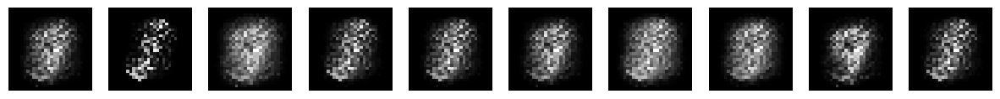

Epoch 6; Discriminator: 0.723, Generator: 1.832


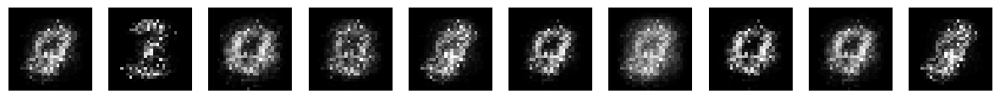

Epoch 7; Discriminator: 0.840, Generator: 1.672


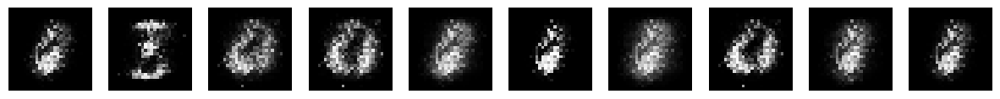

Epoch 8; Discriminator: 0.864, Generator: 1.638


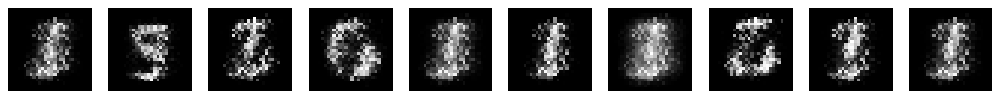

Epoch 9; Discriminator: 0.944, Generator: 1.790


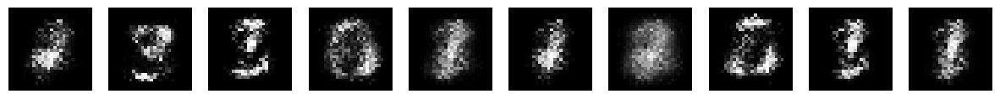

Epoch 10; Discriminator: 0.685, Generator: 1.679


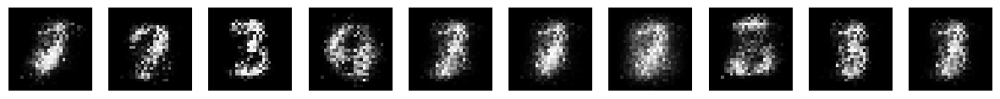

Epoch 11; Discriminator: 0.506, Generator: 1.976


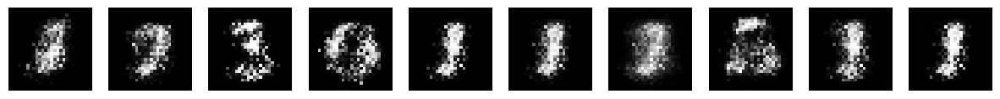

Epoch 12; Discriminator: 0.738, Generator: 1.635


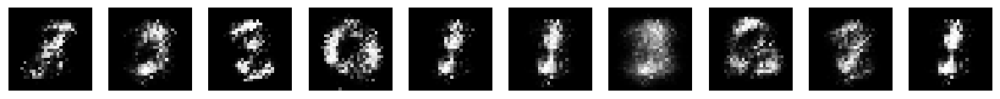

Epoch 13; Discriminator: 1.033, Generator: 1.389


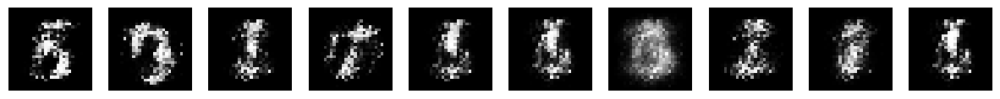

Epoch 14; Discriminator: 0.976, Generator: 1.198


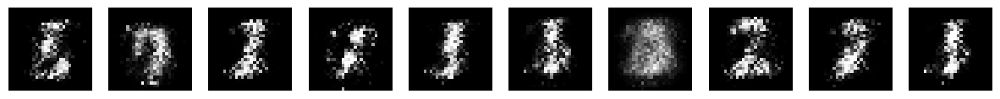

Epoch 15; Discriminator: 0.807, Generator: 1.318


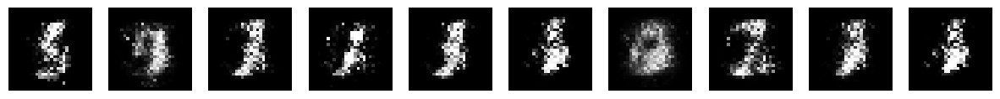

Epoch 16; Discriminator: 0.972, Generator: 1.519


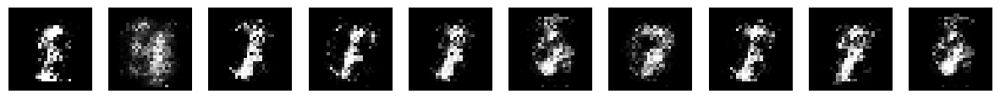

Epoch 17; Discriminator: 1.006, Generator: 1.168


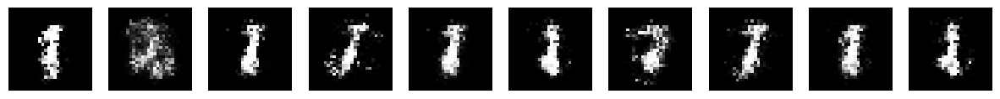

Epoch 18; Discriminator: 1.341, Generator: 0.924


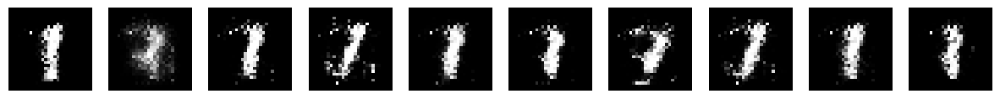

Epoch 19; Discriminator: 1.231, Generator: 0.870


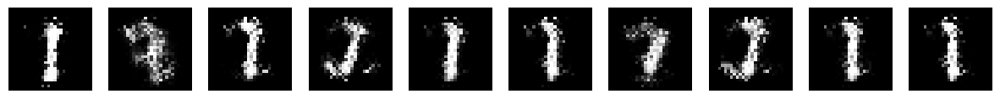

Epoch 20; Discriminator: 1.228, Generator: 1.000


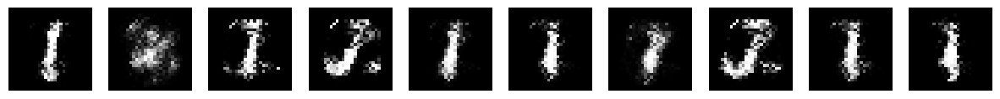

Epoch 21; Discriminator: 1.223, Generator: 0.820


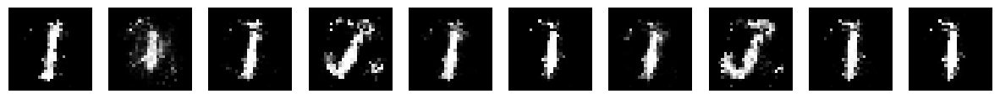

Epoch 22; Discriminator: 1.247, Generator: 0.833


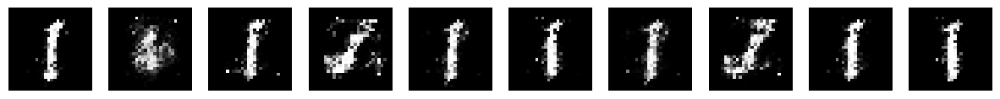

Epoch 23; Discriminator: 1.324, Generator: 0.814


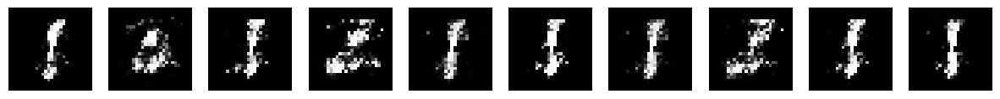

Epoch 24; Discriminator: 1.419, Generator: 0.747


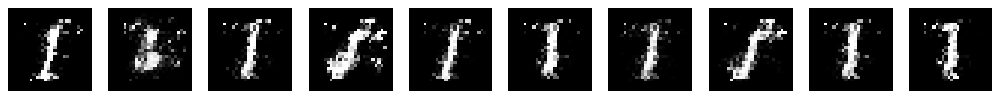

Epoch 25; Discriminator: 1.309, Generator: 0.739


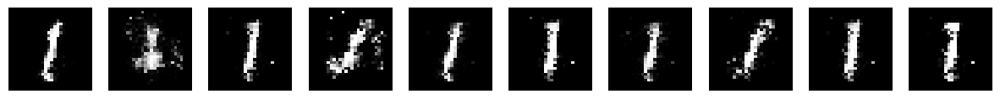

Epoch 26; Discriminator: 1.354, Generator: 0.744


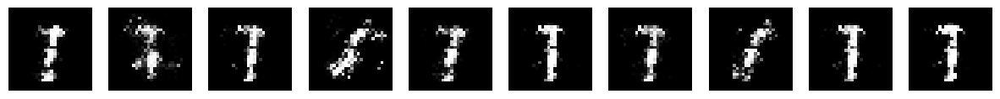

Epoch 27; Discriminator: 1.301, Generator: 0.817


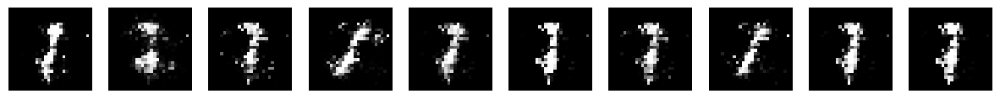

Epoch 28; Discriminator: 1.342, Generator: 0.758


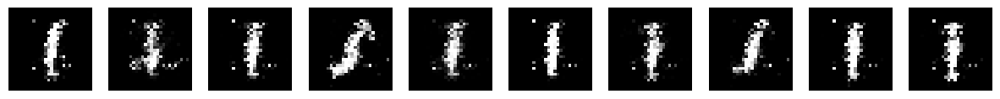

Epoch 29; Discriminator: 1.387, Generator: 0.788


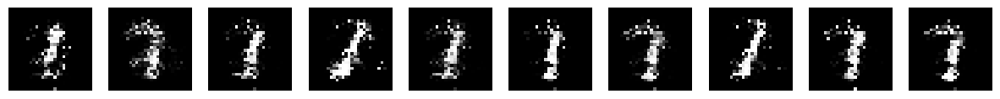

Epoch 30; Discriminator: 1.398, Generator: 0.721


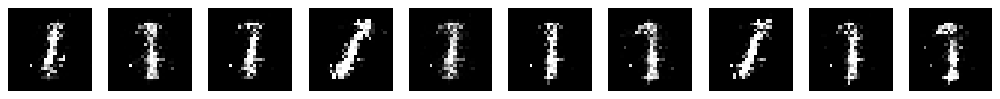

Epoch 31; Discriminator: 1.336, Generator: 0.731


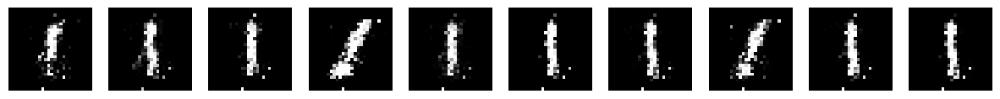

Epoch 32; Discriminator: 1.336, Generator: 0.789


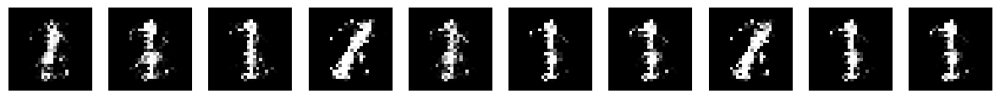

Epoch 33; Discriminator: 1.403, Generator: 0.723


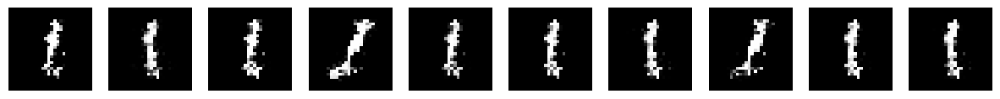

Epoch 34; Discriminator: 1.363, Generator: 0.691


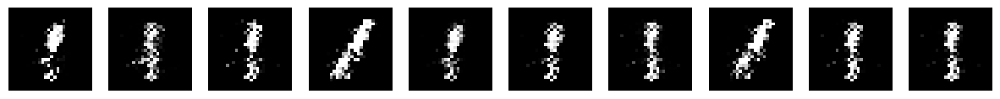

Epoch 35; Discriminator: 1.361, Generator: 0.764


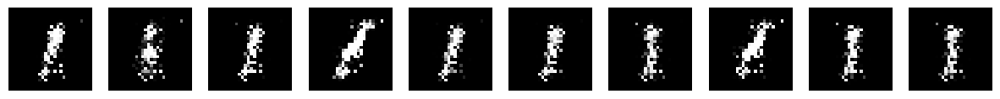

Epoch 36; Discriminator: 1.281, Generator: 0.805


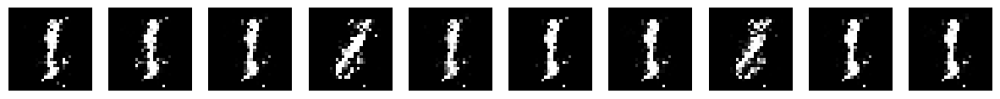

Epoch 37; Discriminator: 1.366, Generator: 0.729


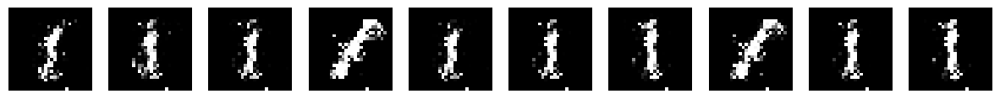

Epoch 38; Discriminator: 1.284, Generator: 0.694


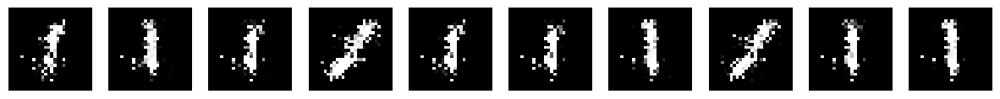

Epoch 39; Discriminator: 1.274, Generator: 0.828


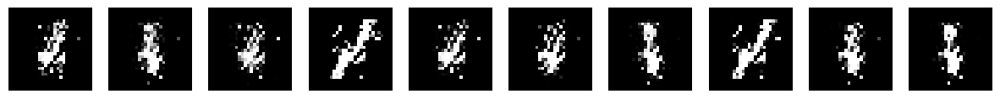

Epoch 40; Discriminator: 1.335, Generator: 0.680


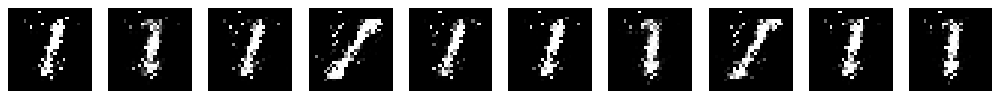

Epoch 41; Discriminator: 1.380, Generator: 0.677


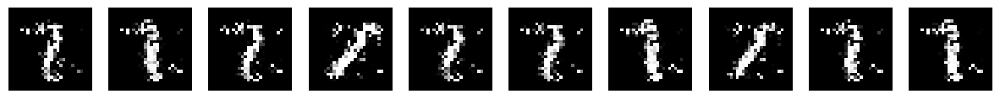

Epoch 42; Discriminator: 1.363, Generator: 0.789


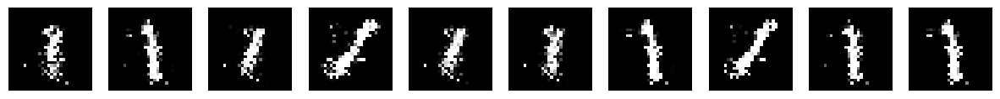

Epoch 43; Discriminator: 1.383, Generator: 0.688


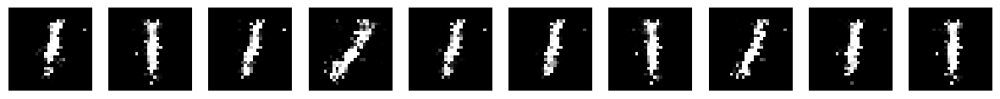

Epoch 44; Discriminator: 1.361, Generator: 0.685


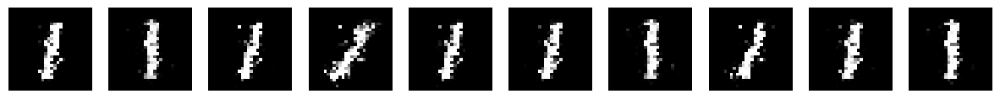

Epoch 45; Discriminator: 1.387, Generator: 0.710


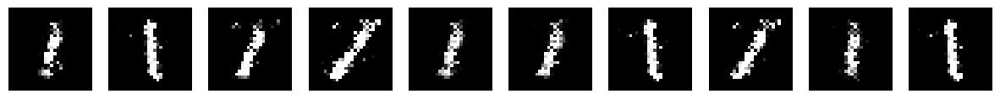

Epoch 46; Discriminator: 1.396, Generator: 0.656


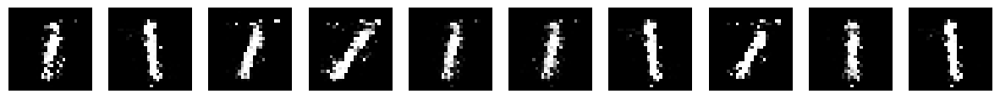

Epoch 47; Discriminator: 1.364, Generator: 0.819


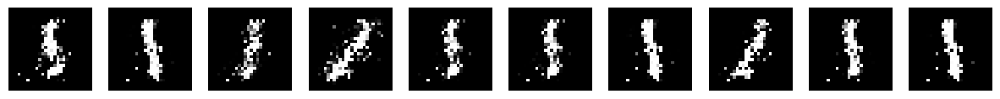

Epoch 48; Discriminator: 1.362, Generator: 0.736


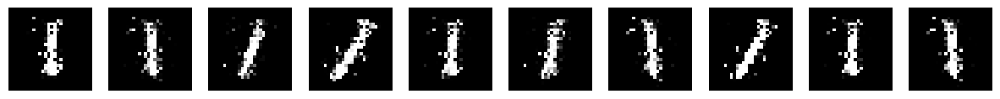

Epoch 49; Discriminator: 1.285, Generator: 0.673


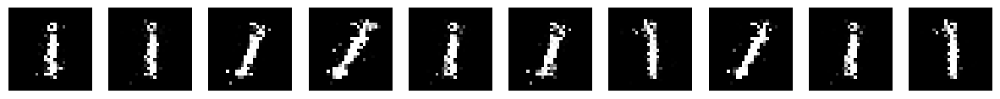

Epoch 50; Discriminator: 1.436, Generator: 0.722


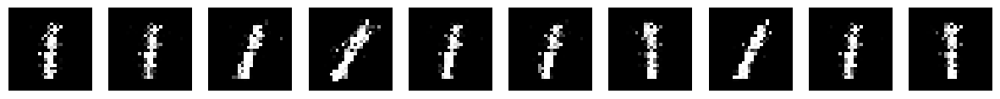

Epoch 51; Discriminator: 1.389, Generator: 0.692


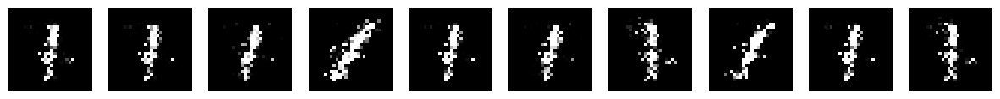

Epoch 52; Discriminator: 1.336, Generator: 0.665


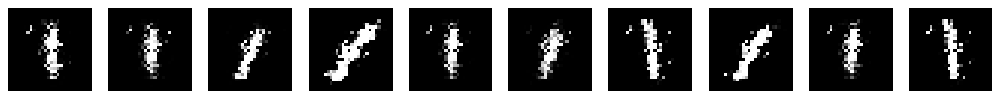

Epoch 53; Discriminator: 1.348, Generator: 0.802


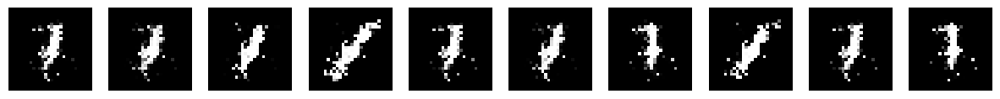

Epoch 54; Discriminator: 1.341, Generator: 0.747


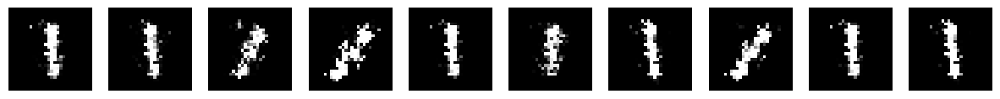

Epoch 55; Discriminator: 1.374, Generator: 0.725


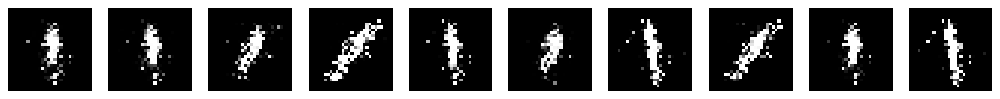

Epoch 56; Discriminator: 1.351, Generator: 0.769


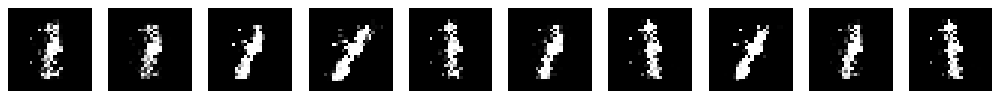

Epoch 57; Discriminator: 1.350, Generator: 0.865


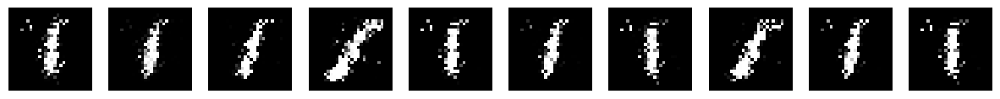

Epoch 58; Discriminator: 1.419, Generator: 0.713


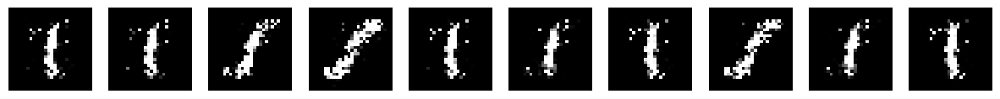

Epoch 59; Discriminator: 1.425, Generator: 0.753


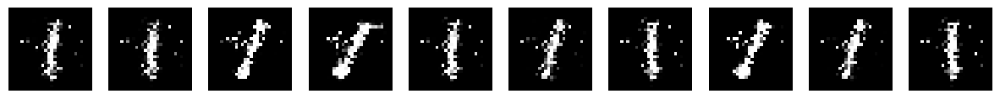

Epoch 60; Discriminator: 1.386, Generator: 0.758


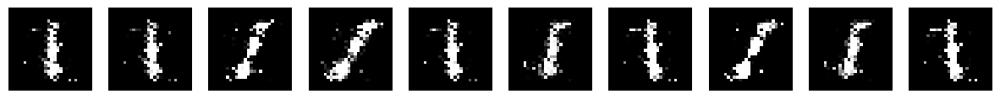

Epoch 61; Discriminator: 1.399, Generator: 0.675


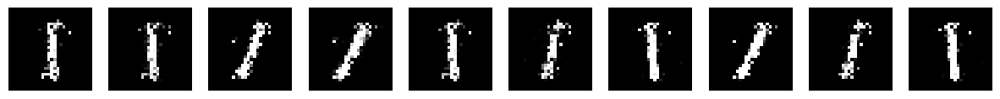

Epoch 62; Discriminator: 1.386, Generator: 0.726


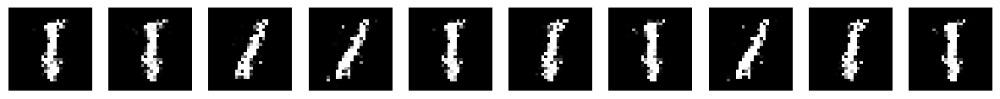

Epoch 63; Discriminator: 1.388, Generator: 0.709


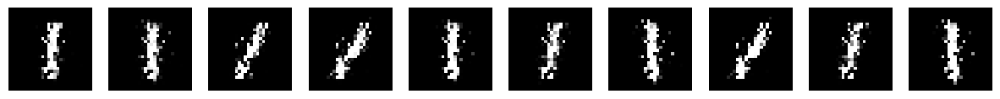

Epoch 64; Discriminator: 1.391, Generator: 0.724


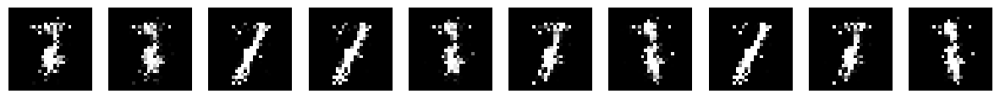

Epoch 65; Discriminator: 1.259, Generator: 0.764


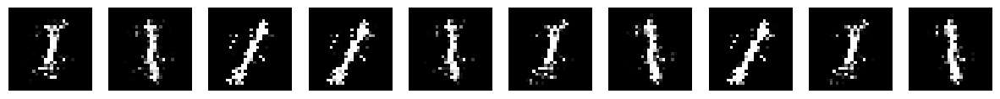

Epoch 66; Discriminator: 1.386, Generator: 0.646


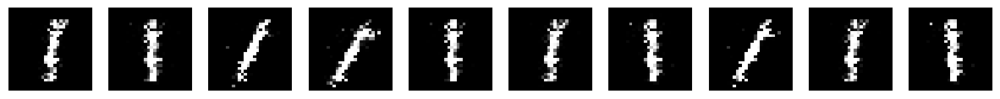

Epoch 67; Discriminator: 1.359, Generator: 0.751


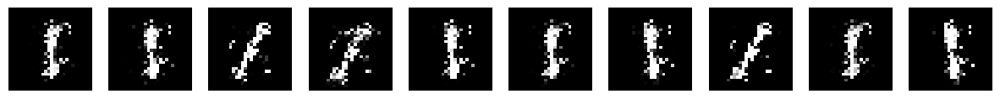

Epoch 68; Discriminator: 1.360, Generator: 0.701


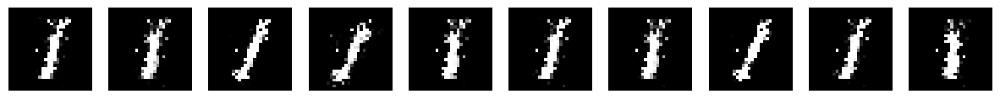

Epoch 69; Discriminator: 1.369, Generator: 0.729


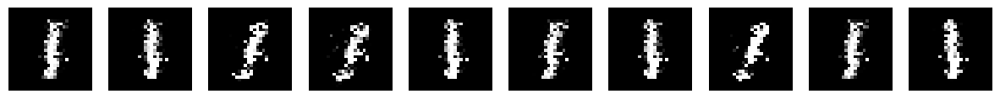

Epoch 70; Discriminator: 1.416, Generator: 0.759


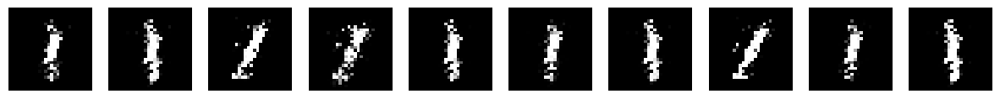

Epoch 71; Discriminator: 1.367, Generator: 0.680


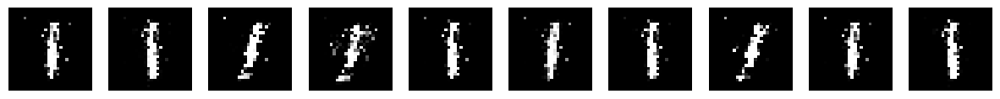

Epoch 72; Discriminator: 1.355, Generator: 0.698


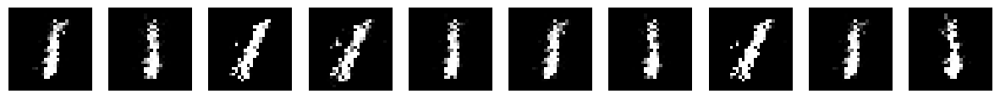

Epoch 73; Discriminator: 1.396, Generator: 0.718


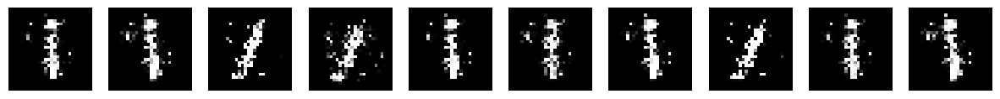

Epoch 74; Discriminator: 1.342, Generator: 0.692


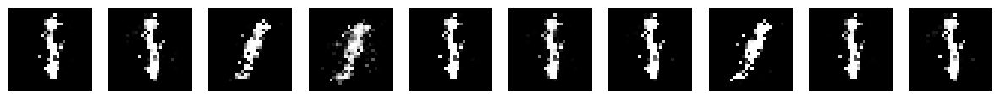

Epoch 75; Discriminator: 1.379, Generator: 0.714


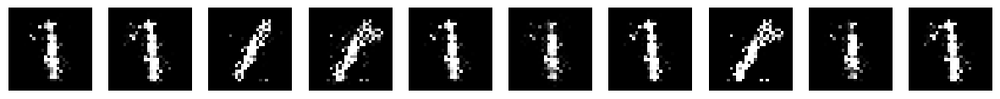

Epoch 76; Discriminator: 1.360, Generator: 0.725


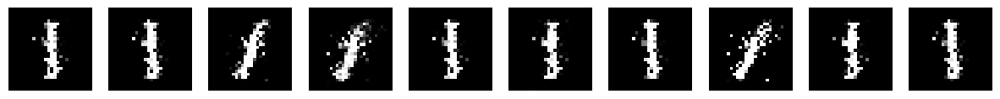

Epoch 77; Discriminator: 1.392, Generator: 0.727


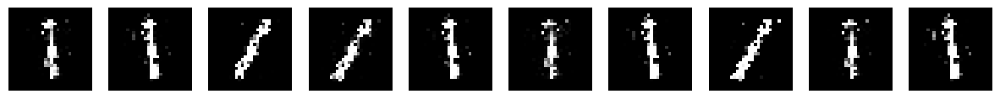

Epoch 78; Discriminator: 1.335, Generator: 0.776


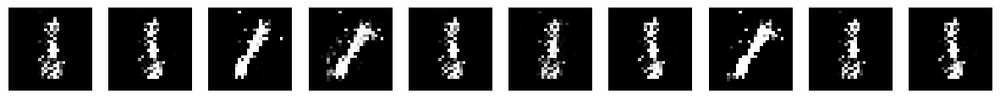

Epoch 79; Discriminator: 1.361, Generator: 0.763


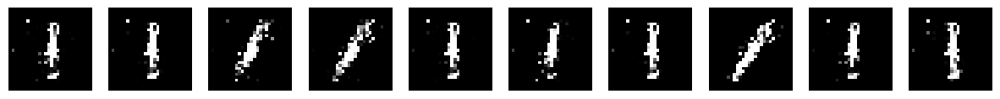

Epoch 80; Discriminator: 1.425, Generator: 0.705


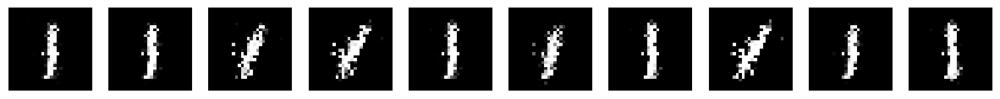

Epoch 81; Discriminator: 1.369, Generator: 0.686


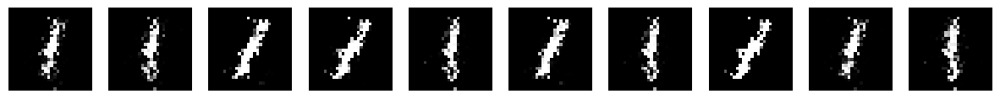

Epoch 82; Discriminator: 1.386, Generator: 0.711


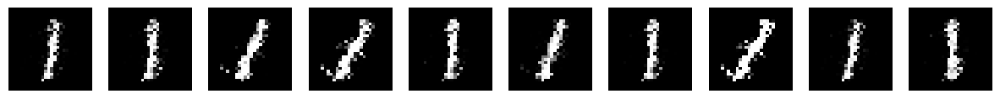

Epoch 83; Discriminator: 1.398, Generator: 0.700


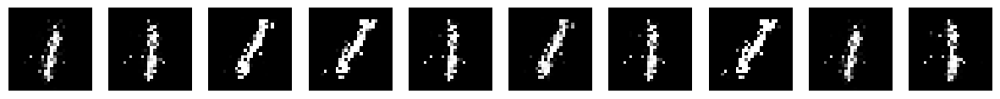

Epoch 84; Discriminator: 1.391, Generator: 0.684


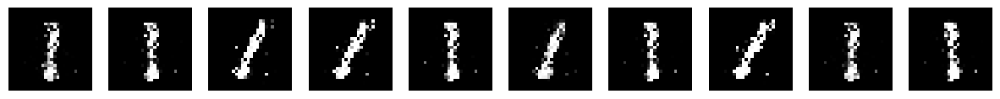

Epoch 85; Discriminator: 1.417, Generator: 0.676


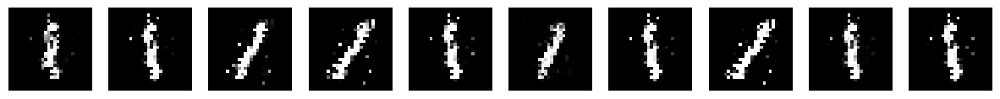

Epoch 86; Discriminator: 1.387, Generator: 0.717


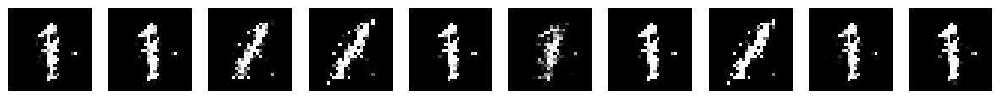

Epoch 87; Discriminator: 1.383, Generator: 0.714


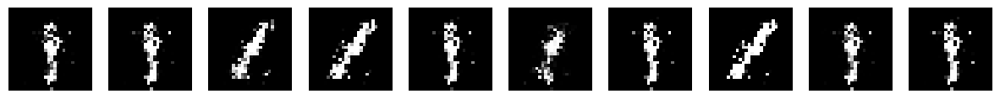

Epoch 88; Discriminator: 1.383, Generator: 0.687


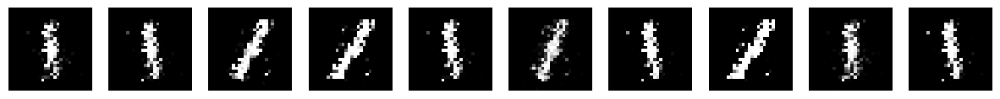

Epoch 89; Discriminator: 1.342, Generator: 0.706


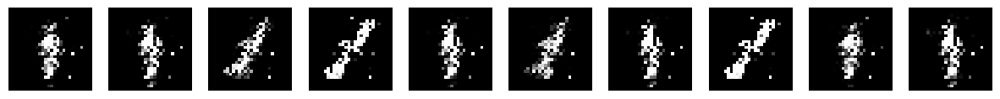

Epoch 90; Discriminator: 1.367, Generator: 0.730


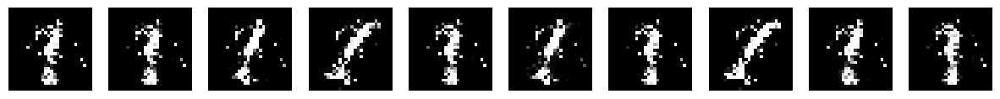

Epoch 91; Discriminator: 1.339, Generator: 0.737


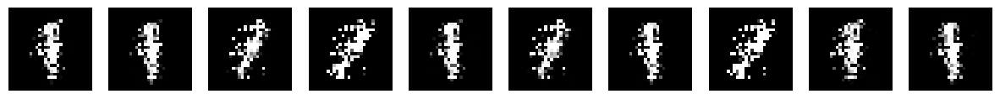

Epoch 92; Discriminator: 1.402, Generator: 0.723


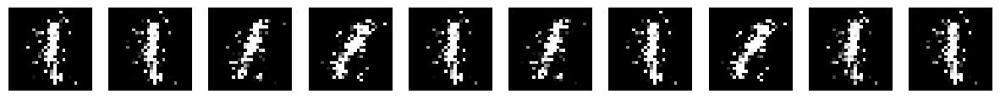

Epoch 93; Discriminator: 1.383, Generator: 0.717


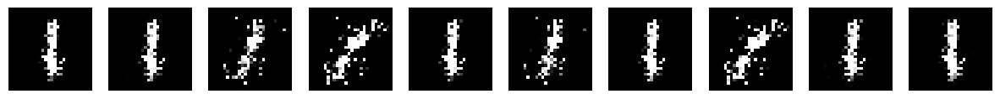

Epoch 94; Discriminator: 1.278, Generator: 0.821


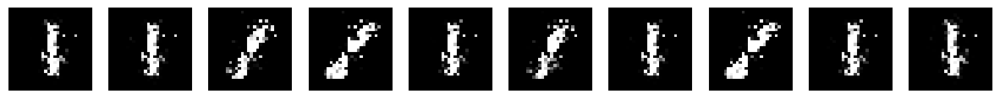

Epoch 95; Discriminator: 1.374, Generator: 0.767


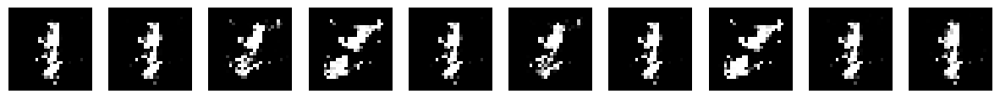

Epoch 96; Discriminator: 1.386, Generator: 0.694


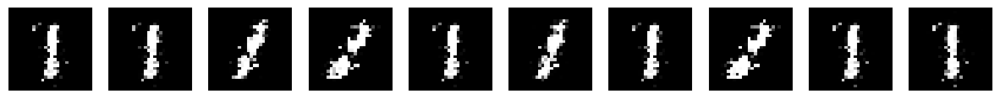

Epoch 97; Discriminator: 1.387, Generator: 0.691


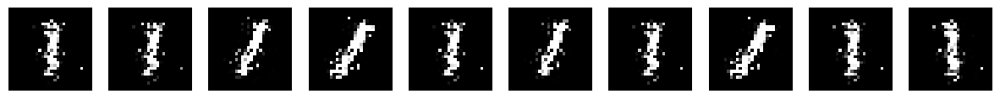

Epoch 98; Discriminator: 1.367, Generator: 0.698


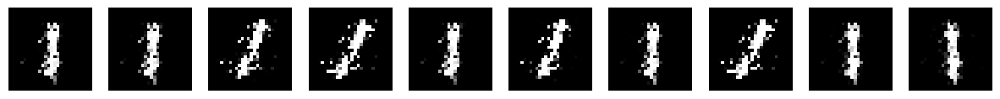

Epoch 99; Discriminator: 1.383, Generator: 0.717


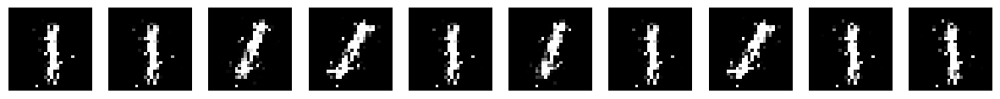

In [ ]:
#Chiffre 1

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=1)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.387, Generator: 0.686


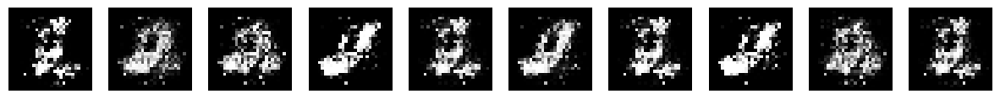

Epoch 1; Discriminator: 1.364, Generator: 0.698


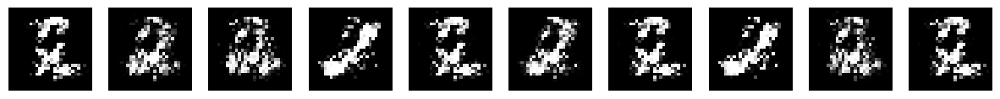

Epoch 2; Discriminator: 1.379, Generator: 0.724


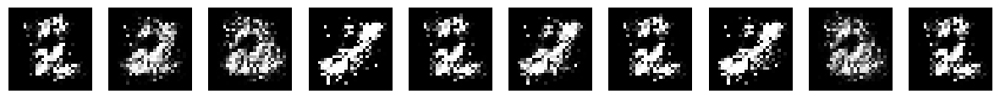

Epoch 3; Discriminator: 1.299, Generator: 0.712


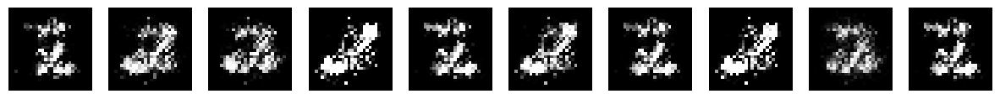

Epoch 4; Discriminator: 1.390, Generator: 0.704


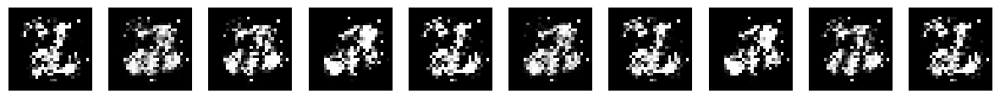

Epoch 5; Discriminator: 1.356, Generator: 0.729


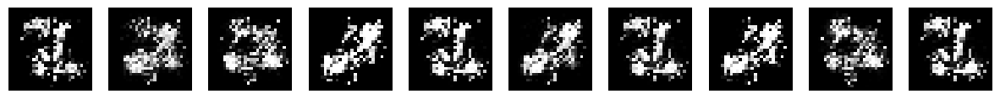

Epoch 6; Discriminator: 1.375, Generator: 0.750


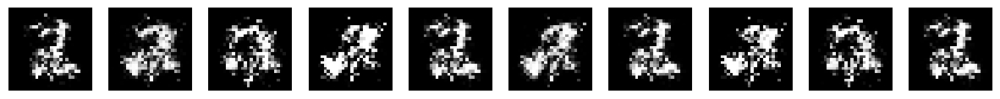

Epoch 7; Discriminator: 1.459, Generator: 0.727


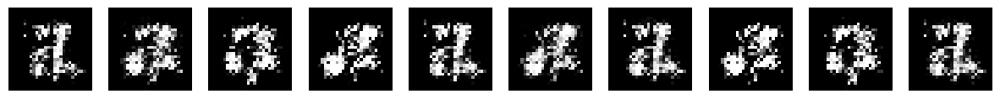

Epoch 8; Discriminator: 1.414, Generator: 0.755


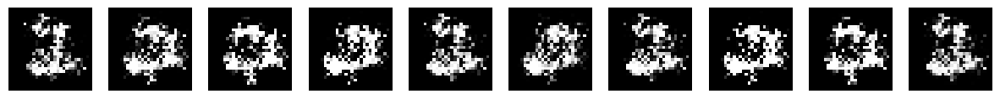

Epoch 9; Discriminator: 1.402, Generator: 0.733


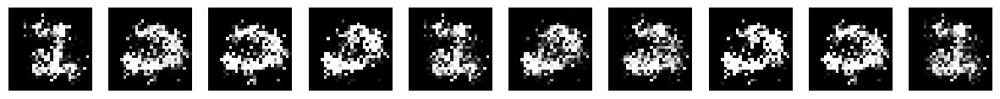

Epoch 10; Discriminator: 1.394, Generator: 0.676


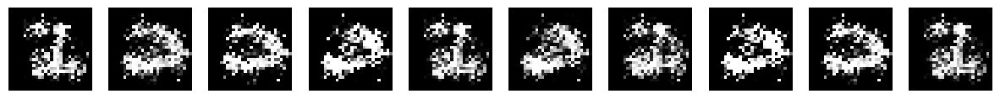

Epoch 11; Discriminator: 1.387, Generator: 0.700


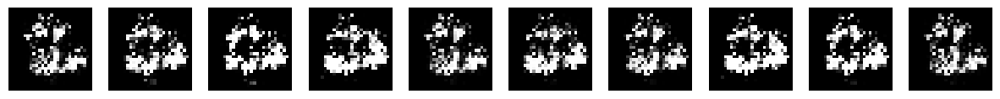

Epoch 12; Discriminator: 1.375, Generator: 0.736


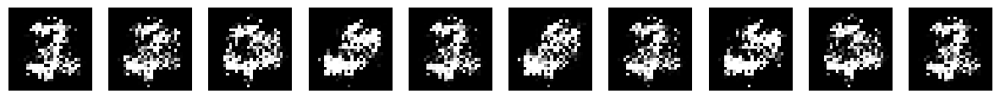

Epoch 13; Discriminator: 1.334, Generator: 0.664


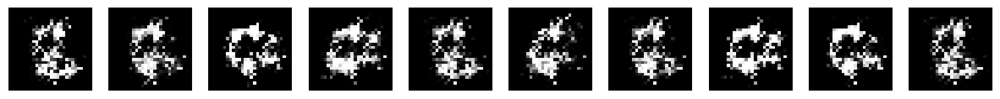

Epoch 14; Discriminator: 1.360, Generator: 0.720


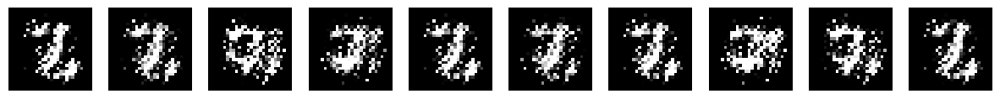

Epoch 15; Discriminator: 1.330, Generator: 0.692


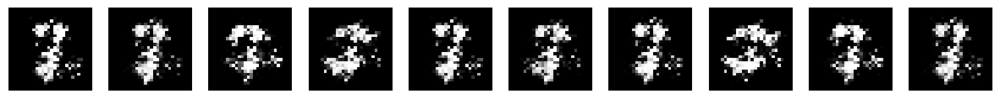

Epoch 16; Discriminator: 1.099, Generator: 0.783


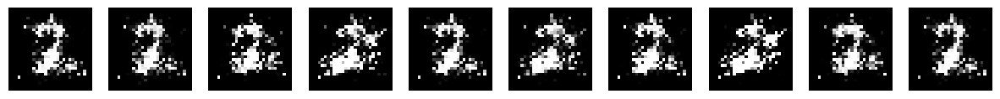

Epoch 17; Discriminator: 1.341, Generator: 0.704


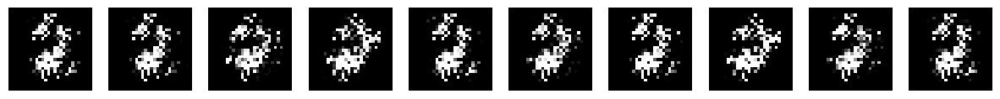

Epoch 18; Discriminator: 1.238, Generator: 0.764


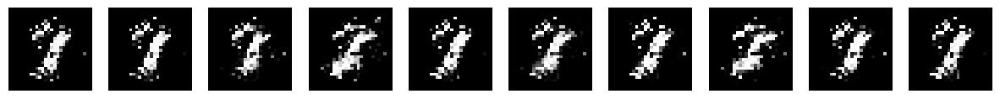

Epoch 19; Discriminator: 1.427, Generator: 0.724


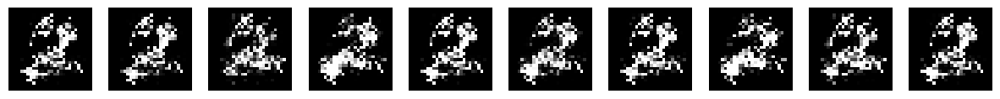

Epoch 20; Discriminator: 1.369, Generator: 0.829


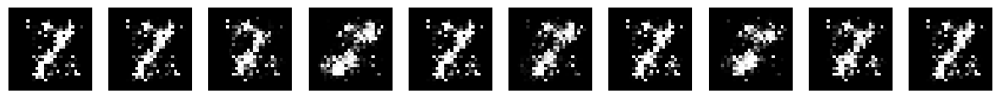

Epoch 21; Discriminator: 1.397, Generator: 0.764


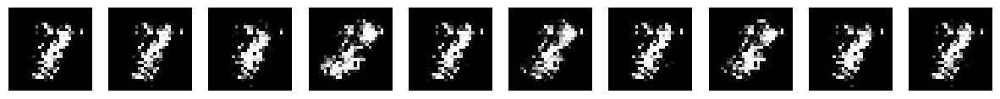

Epoch 22; Discriminator: 1.377, Generator: 0.705


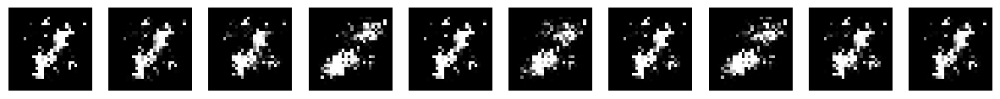

Epoch 23; Discriminator: 1.341, Generator: 0.731


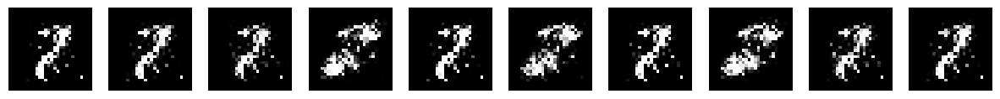

Epoch 24; Discriminator: 1.397, Generator: 0.727


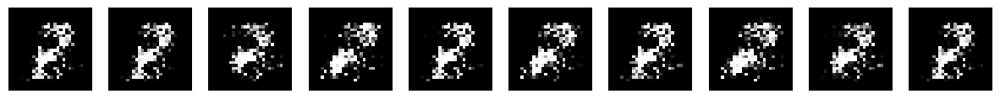

Epoch 25; Discriminator: 1.383, Generator: 0.710


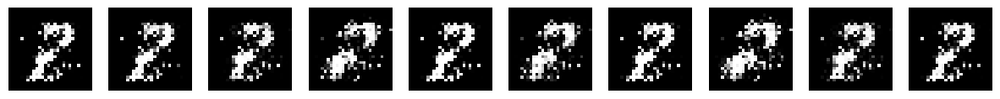

Epoch 26; Discriminator: 1.373, Generator: 0.714


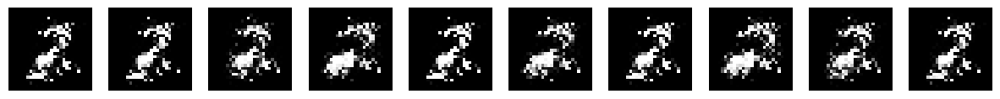

Epoch 27; Discriminator: 1.344, Generator: 0.733


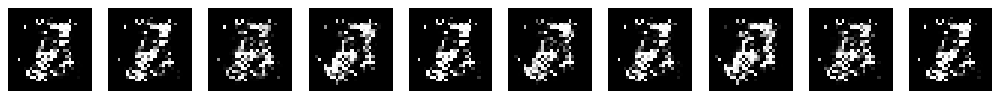

Epoch 28; Discriminator: 1.357, Generator: 0.723


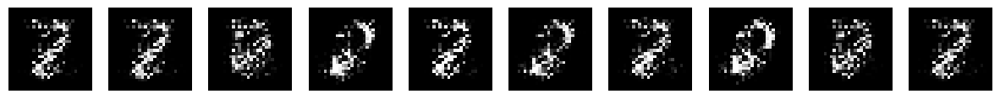

Epoch 29; Discriminator: 1.341, Generator: 0.678


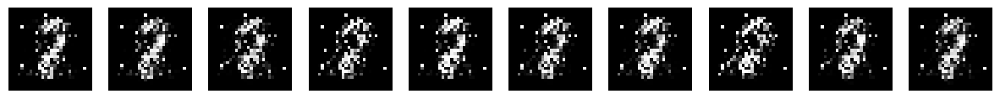

Epoch 30; Discriminator: 1.331, Generator: 0.693


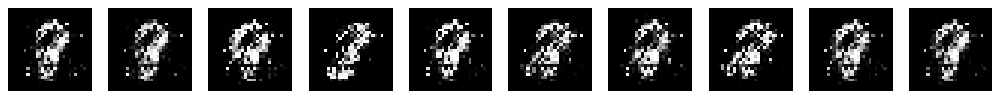

Epoch 31; Discriminator: 1.350, Generator: 0.740


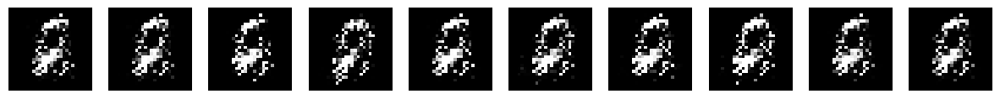

Epoch 32; Discriminator: 1.348, Generator: 0.711


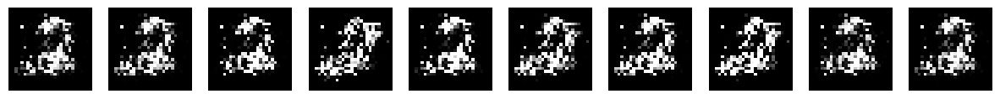

Epoch 33; Discriminator: 1.375, Generator: 0.735


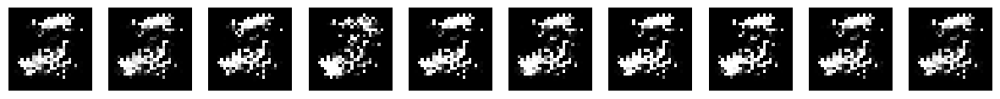

Epoch 34; Discriminator: 1.394, Generator: 0.719


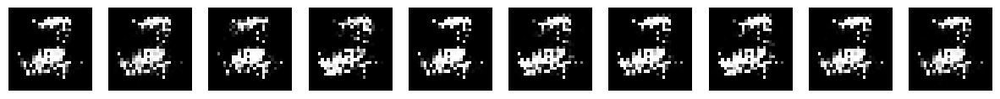

Epoch 35; Discriminator: 1.373, Generator: 0.722


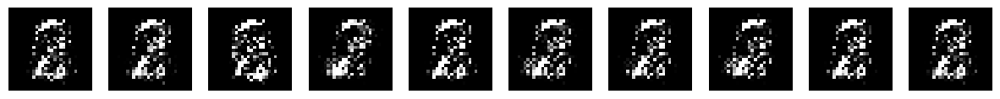

Epoch 36; Discriminator: 1.385, Generator: 0.781


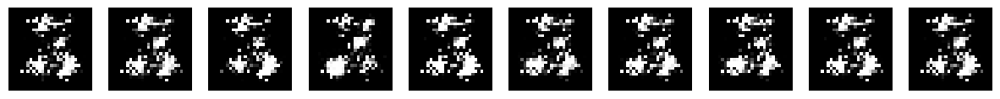

Epoch 37; Discriminator: 1.281, Generator: 0.803


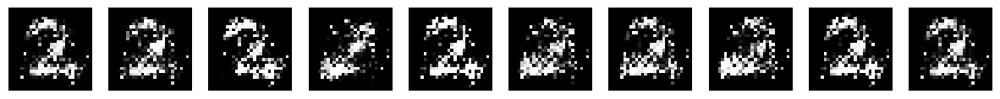

Epoch 38; Discriminator: 1.356, Generator: 0.750


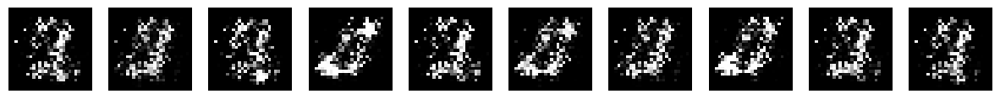

Epoch 39; Discriminator: 1.378, Generator: 0.731


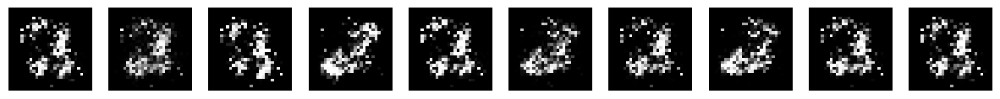

Epoch 40; Discriminator: 1.381, Generator: 0.688


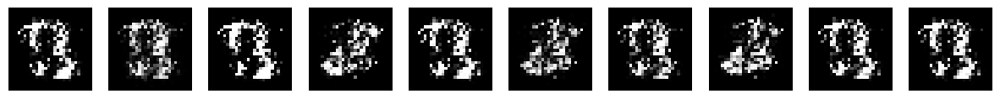

Epoch 41; Discriminator: 1.356, Generator: 0.710


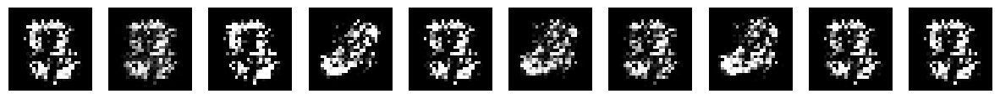

Epoch 42; Discriminator: 1.365, Generator: 0.711


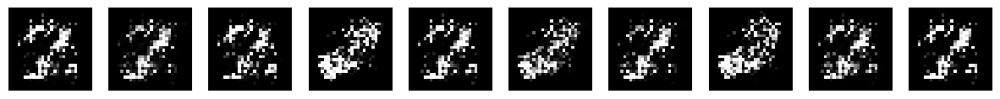

Epoch 43; Discriminator: 1.334, Generator: 0.681


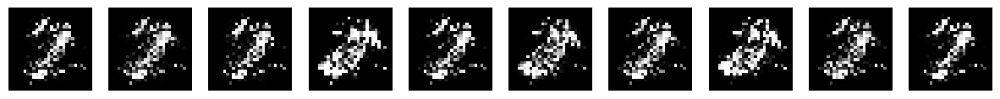

Epoch 44; Discriminator: 1.352, Generator: 0.678


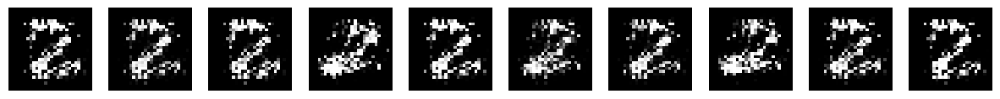

Epoch 45; Discriminator: 1.378, Generator: 0.700


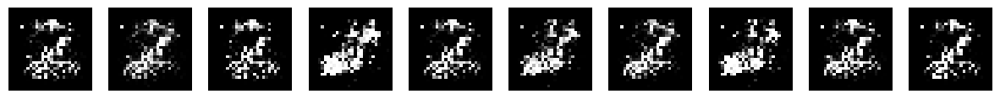

Epoch 46; Discriminator: 1.357, Generator: 0.714


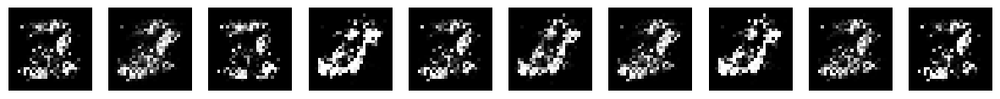

Epoch 47; Discriminator: 1.374, Generator: 0.763


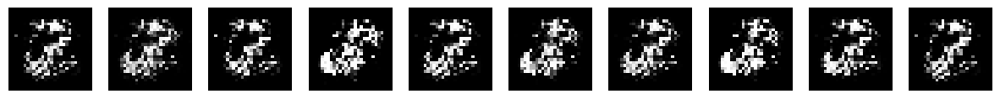

Epoch 48; Discriminator: 1.389, Generator: 0.691


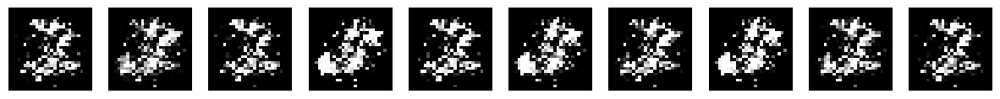

Epoch 49; Discriminator: 1.332, Generator: 0.744


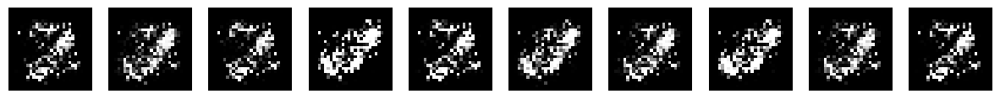

Epoch 50; Discriminator: 1.400, Generator: 0.702


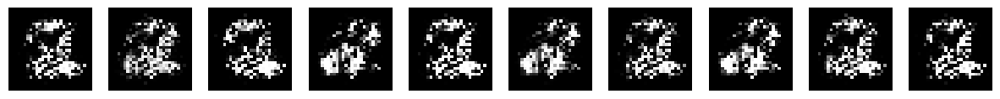

Epoch 51; Discriminator: 1.368, Generator: 0.748


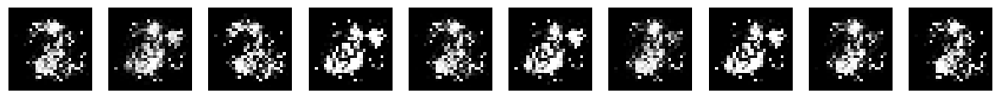

Epoch 52; Discriminator: 1.298, Generator: 0.709


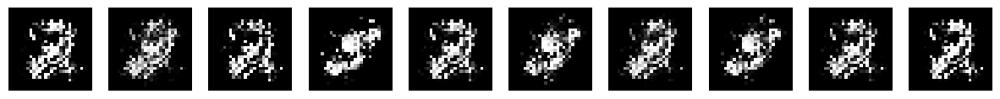

Epoch 53; Discriminator: 1.393, Generator: 0.730


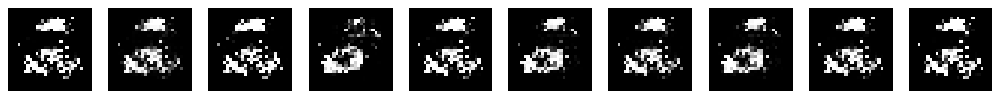

Epoch 54; Discriminator: 1.380, Generator: 0.682


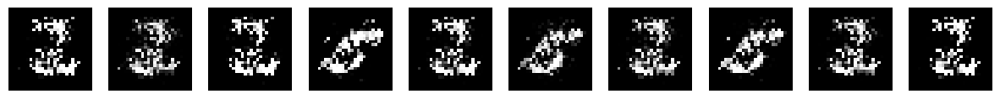

Epoch 55; Discriminator: 1.358, Generator: 0.713


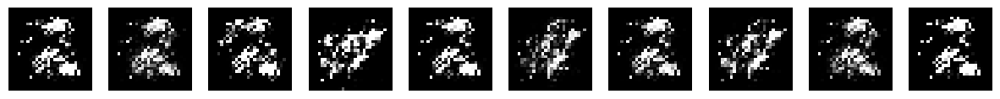

Epoch 56; Discriminator: 1.365, Generator: 0.676


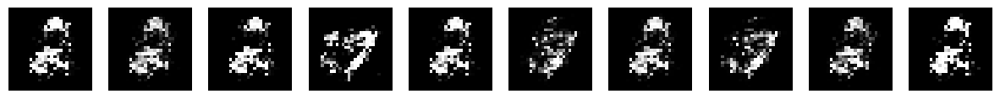

Epoch 57; Discriminator: 1.389, Generator: 0.742


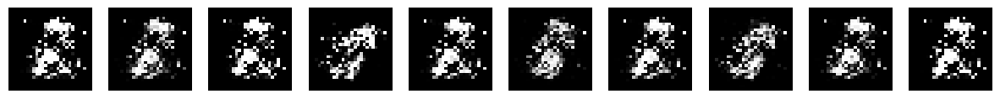

Epoch 58; Discriminator: 1.425, Generator: 0.715


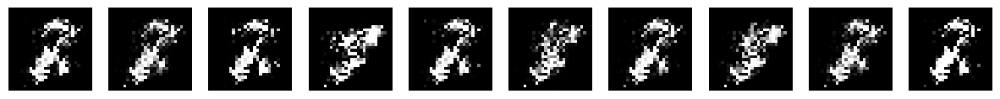

Epoch 59; Discriminator: 1.334, Generator: 0.766


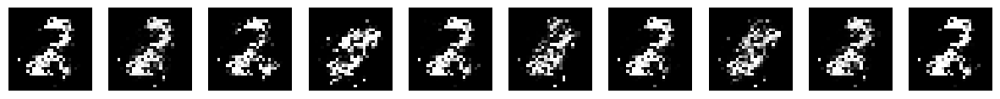

Epoch 60; Discriminator: 1.273, Generator: 0.735


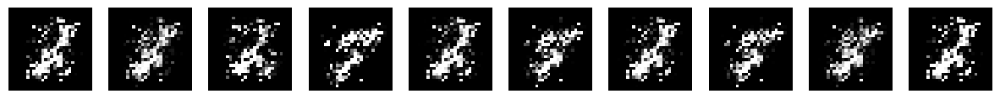

Epoch 61; Discriminator: 1.370, Generator: 0.701


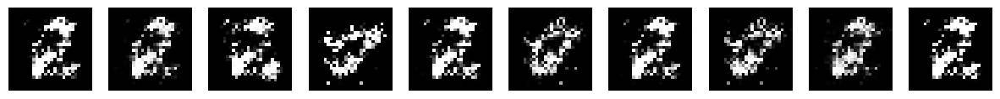

Epoch 62; Discriminator: 1.374, Generator: 0.744


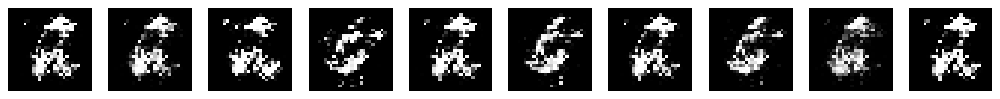

Epoch 63; Discriminator: 1.356, Generator: 0.730


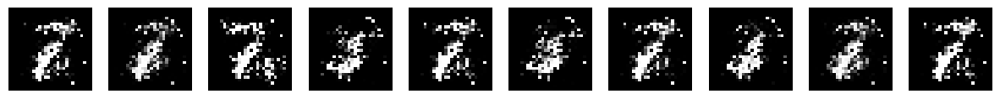

Epoch 64; Discriminator: 1.364, Generator: 0.748


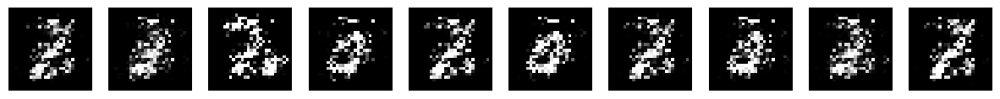

Epoch 65; Discriminator: 1.346, Generator: 0.705


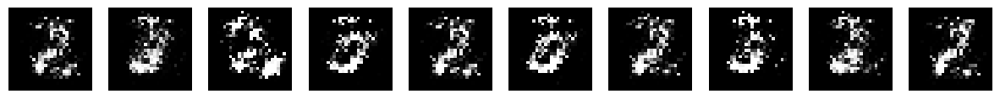

Epoch 66; Discriminator: 1.356, Generator: 0.680


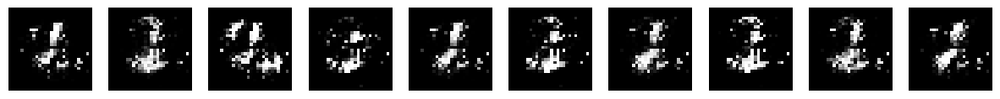

Epoch 67; Discriminator: 1.394, Generator: 0.730


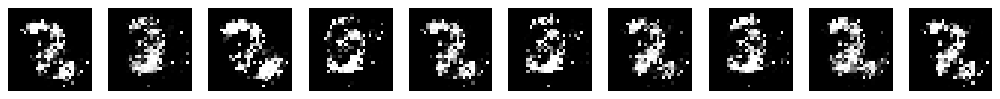

Epoch 68; Discriminator: 1.324, Generator: 0.735


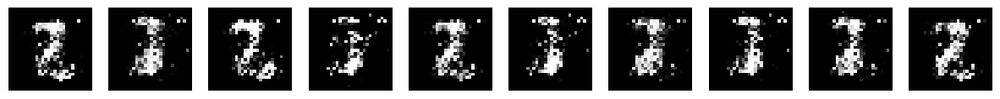

Epoch 69; Discriminator: 1.370, Generator: 0.744


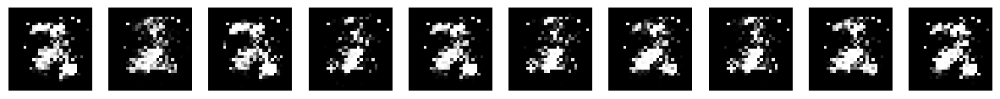

Epoch 70; Discriminator: 1.350, Generator: 0.736


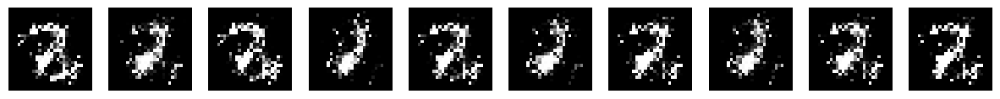

Epoch 71; Discriminator: 1.326, Generator: 0.789


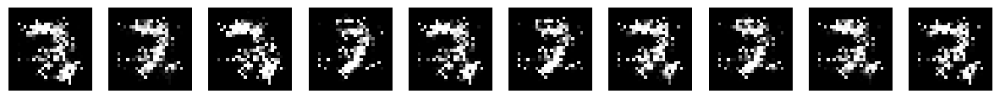

Epoch 72; Discriminator: 1.291, Generator: 0.813


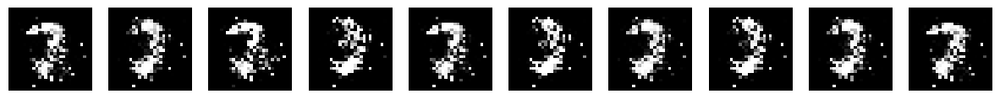

Epoch 73; Discriminator: 1.378, Generator: 0.749


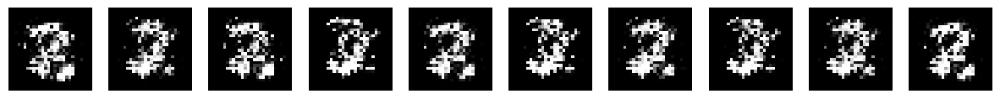

Epoch 74; Discriminator: 1.338, Generator: 0.748


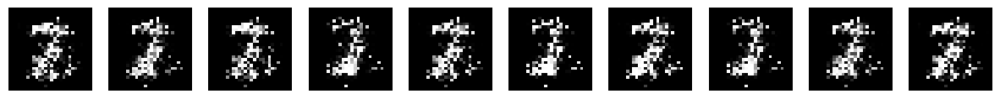

Epoch 75; Discriminator: 1.358, Generator: 0.766


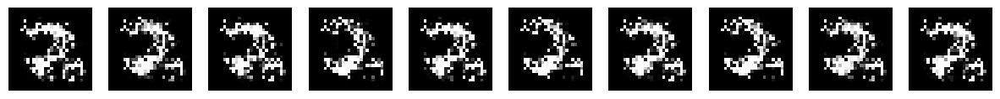

Epoch 76; Discriminator: 1.353, Generator: 0.767


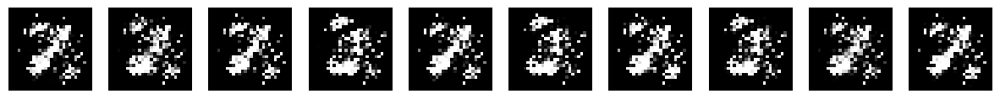

Epoch 77; Discriminator: 1.375, Generator: 0.728


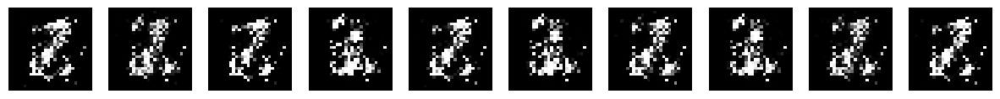

Epoch 78; Discriminator: 1.367, Generator: 0.734


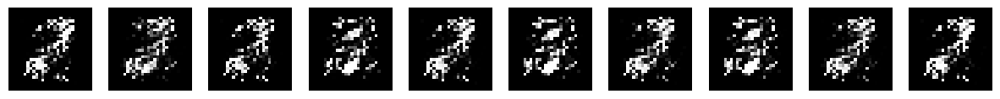

Epoch 79; Discriminator: 1.322, Generator: 0.727


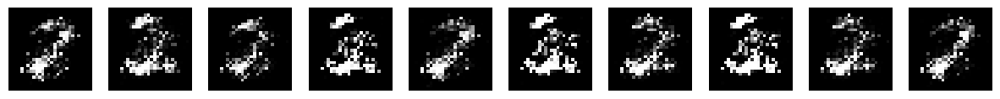

Epoch 80; Discriminator: 1.398, Generator: 0.713


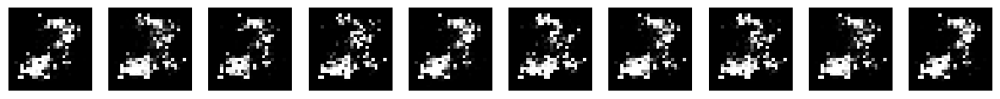

Epoch 81; Discriminator: 1.382, Generator: 0.695


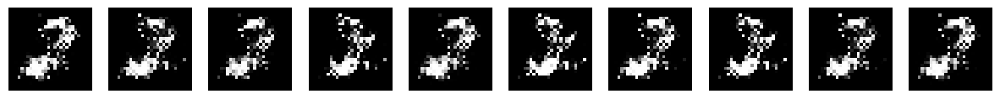

Epoch 82; Discriminator: 1.405, Generator: 0.707


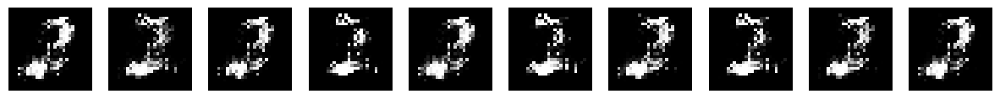

Epoch 83; Discriminator: 1.288, Generator: 0.745


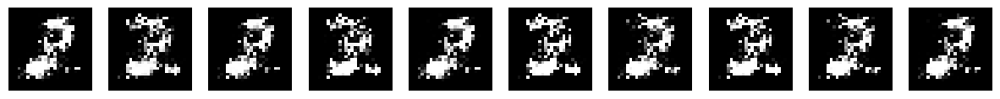

Epoch 84; Discriminator: 1.332, Generator: 0.740


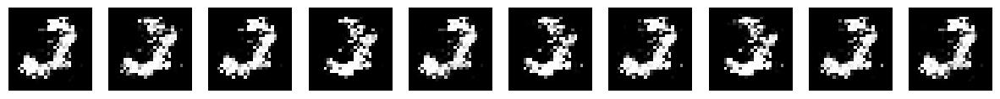

Epoch 85; Discriminator: 1.383, Generator: 0.770


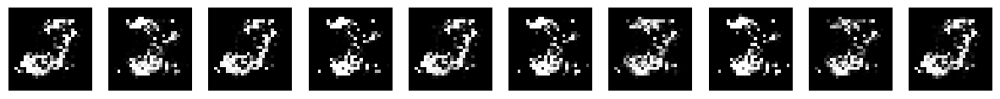

Epoch 86; Discriminator: 1.330, Generator: 0.736


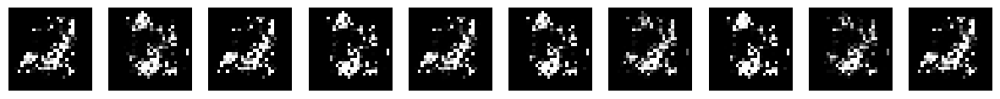

Epoch 87; Discriminator: 1.396, Generator: 0.761


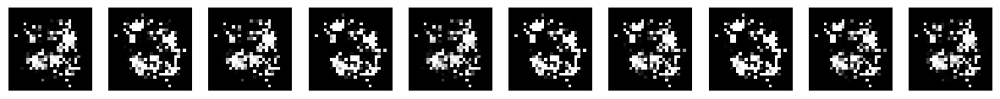

Epoch 88; Discriminator: 1.308, Generator: 0.786


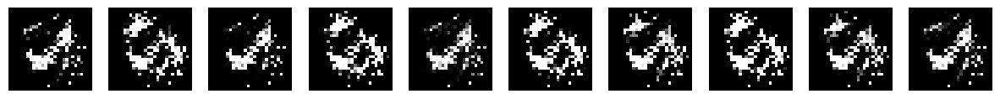

Epoch 89; Discriminator: 1.315, Generator: 0.767


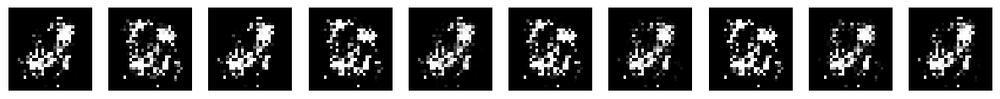

Epoch 90; Discriminator: 1.273, Generator: 0.735


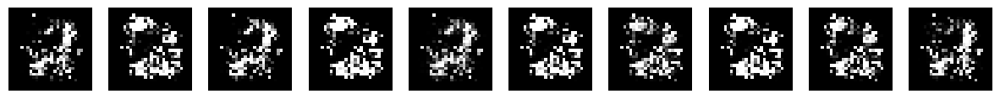

Epoch 91; Discriminator: 1.213, Generator: 0.853


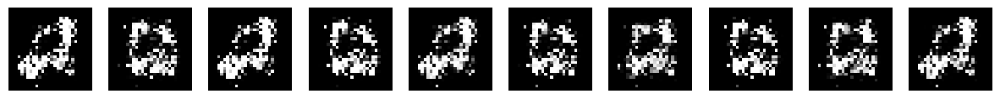

Epoch 92; Discriminator: 1.298, Generator: 0.762


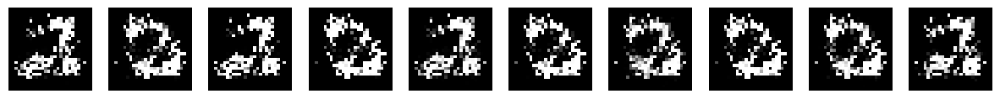

Epoch 93; Discriminator: 1.177, Generator: 0.791


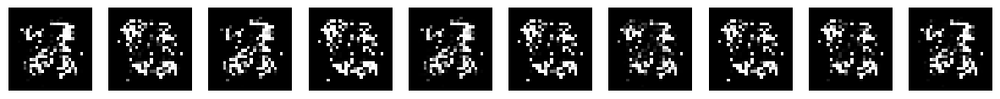

Epoch 94; Discriminator: 1.351, Generator: 0.871


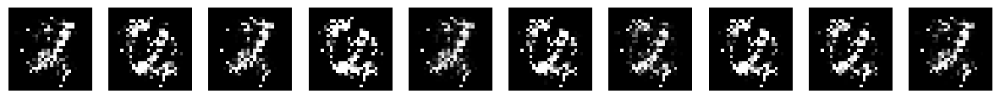

Epoch 95; Discriminator: 1.216, Generator: 0.774


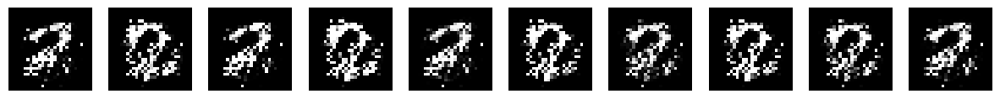

Epoch 96; Discriminator: 1.262, Generator: 0.868


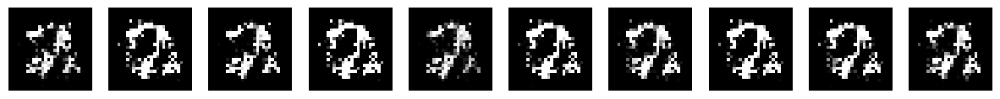

Epoch 97; Discriminator: 1.322, Generator: 0.785


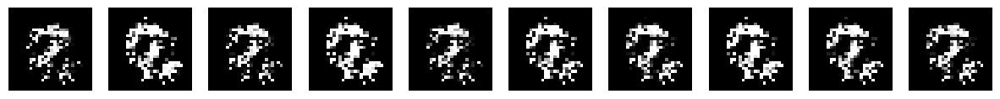

Epoch 98; Discriminator: 1.217, Generator: 0.757


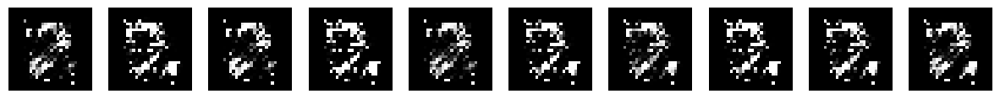

Epoch 99; Discriminator: 1.376, Generator: 0.757


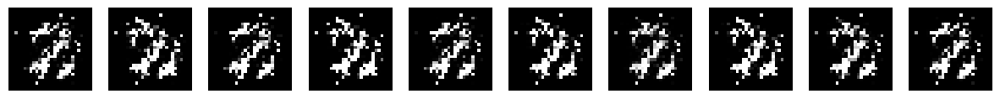

In [ ]:
# Chiffre 2

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=2)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.295, Generator: 0.779


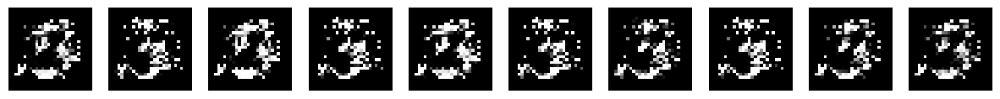

Epoch 1; Discriminator: 1.227, Generator: 0.783


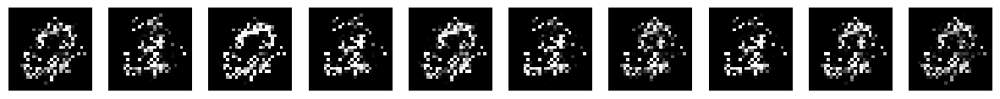

Epoch 2; Discriminator: 1.304, Generator: 0.930


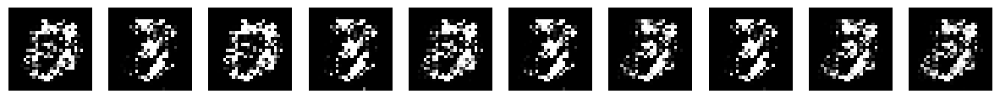

Epoch 3; Discriminator: 1.366, Generator: 0.757


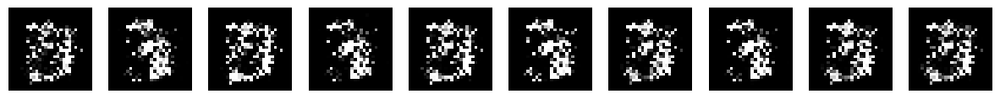

Epoch 4; Discriminator: 1.380, Generator: 0.751


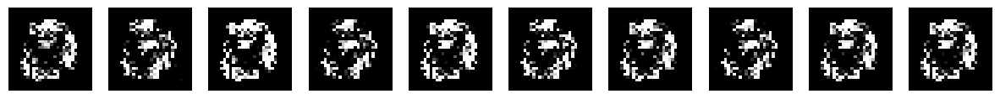

Epoch 5; Discriminator: 1.329, Generator: 0.783


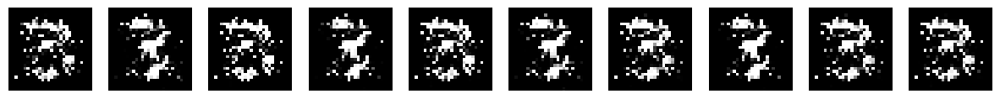

Epoch 6; Discriminator: 1.270, Generator: 0.767


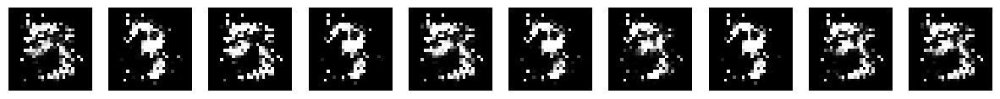

Epoch 7; Discriminator: 1.446, Generator: 0.720


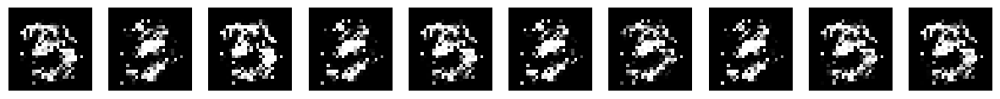

Epoch 8; Discriminator: 1.267, Generator: 0.750


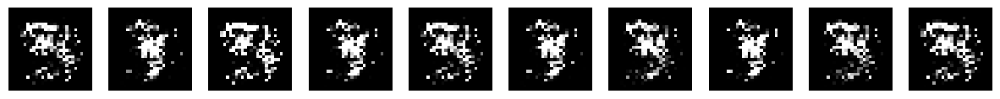

Epoch 9; Discriminator: 1.400, Generator: 0.713


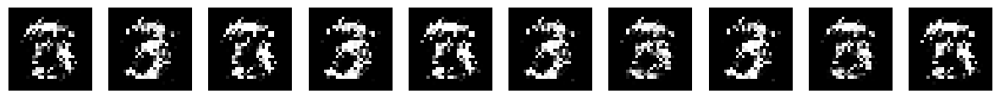

Epoch 10; Discriminator: 1.241, Generator: 0.876


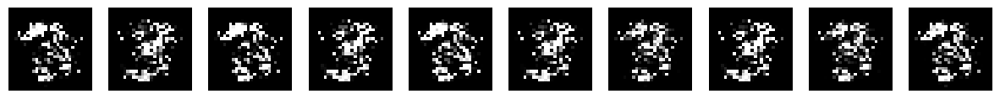

Epoch 11; Discriminator: 1.361, Generator: 0.834


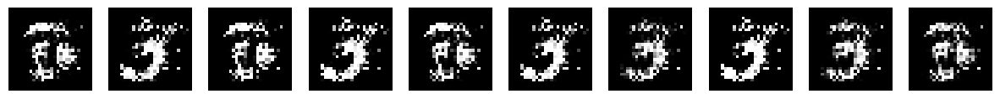

Epoch 12; Discriminator: 1.380, Generator: 0.743


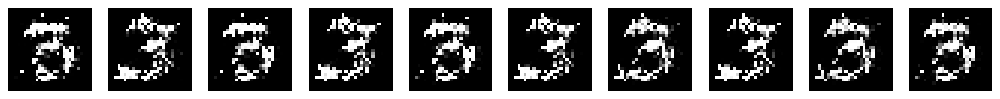

Epoch 13; Discriminator: 1.398, Generator: 0.689


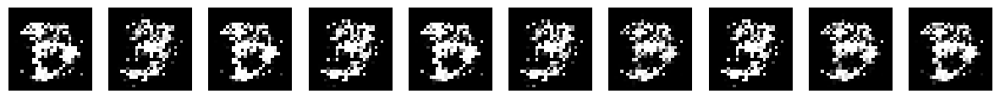

Epoch 14; Discriminator: 1.332, Generator: 0.780


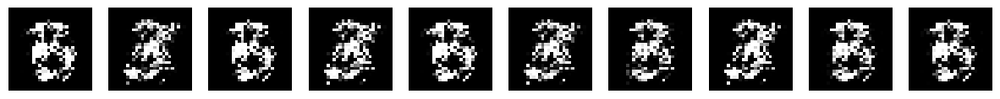

Epoch 15; Discriminator: 1.349, Generator: 0.781


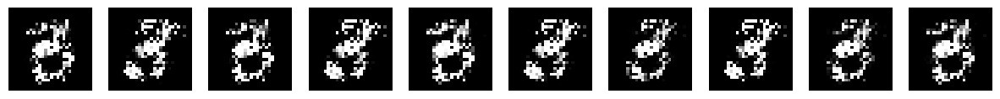

Epoch 16; Discriminator: 1.353, Generator: 0.734


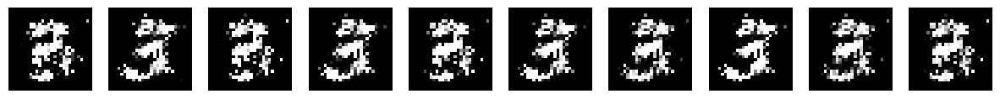

Epoch 17; Discriminator: 1.375, Generator: 0.768


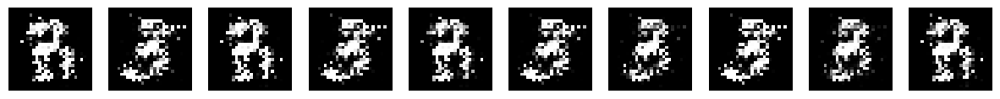

Epoch 18; Discriminator: 1.368, Generator: 0.728


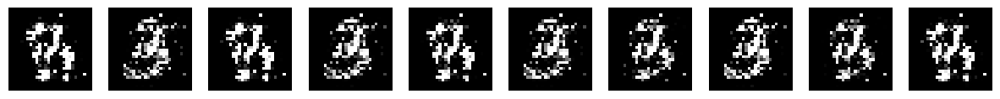

Epoch 19; Discriminator: 1.382, Generator: 0.721


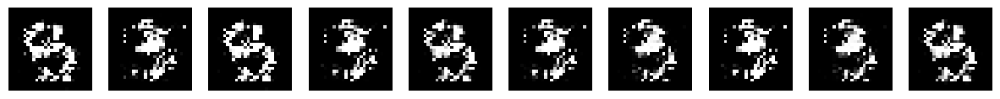

Epoch 20; Discriminator: 1.300, Generator: 0.753


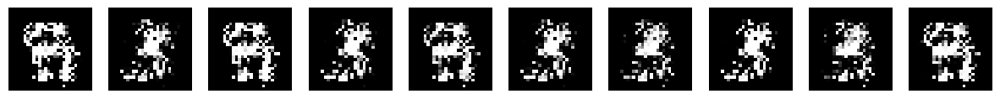

Epoch 21; Discriminator: 1.406, Generator: 0.760


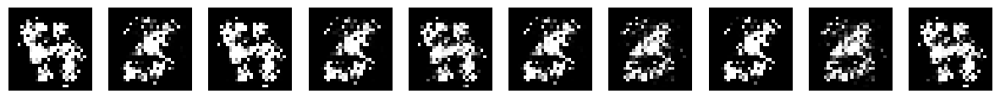

Epoch 22; Discriminator: 1.387, Generator: 0.736


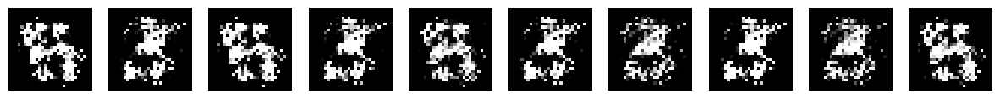

Epoch 23; Discriminator: 1.353, Generator: 0.703


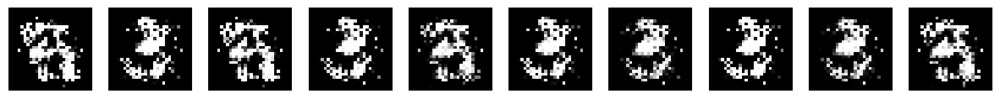

Epoch 24; Discriminator: 1.390, Generator: 0.713


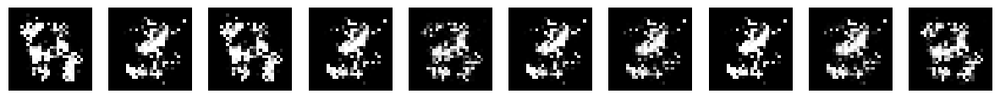

Epoch 25; Discriminator: 1.265, Generator: 0.757


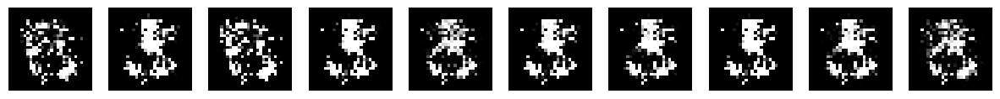

Epoch 26; Discriminator: 1.384, Generator: 0.730


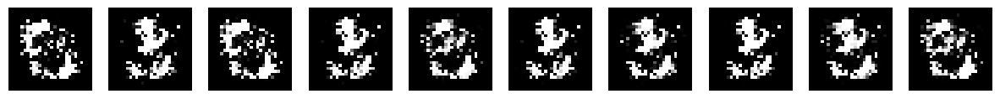

Epoch 27; Discriminator: 1.381, Generator: 0.733


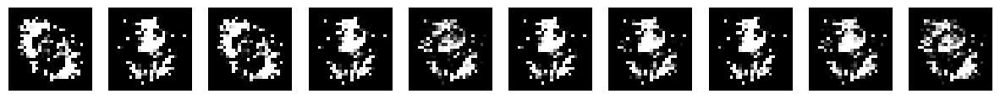

Epoch 28; Discriminator: 1.368, Generator: 0.789


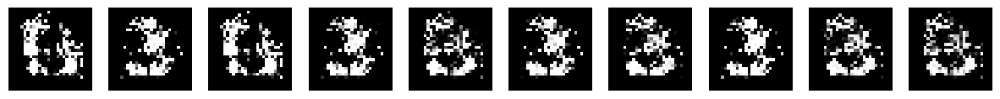

Epoch 29; Discriminator: 1.413, Generator: 0.696


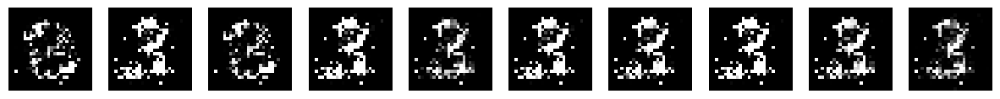

Epoch 30; Discriminator: 1.334, Generator: 0.733


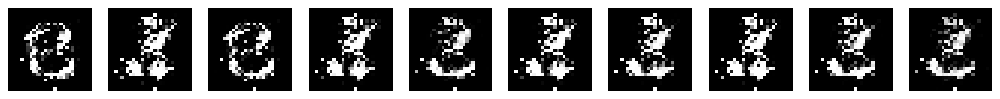

Epoch 31; Discriminator: 1.321, Generator: 0.762


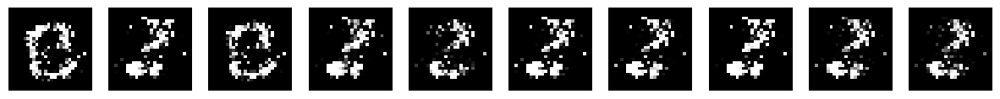

Epoch 32; Discriminator: 1.325, Generator: 0.763


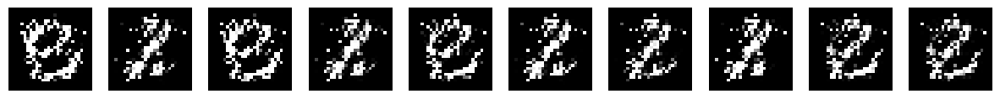

Epoch 33; Discriminator: 1.328, Generator: 0.836


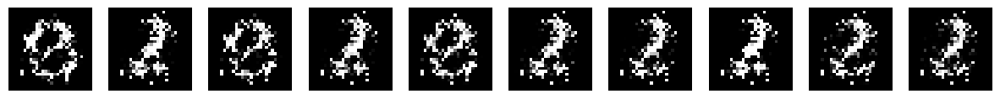

Epoch 34; Discriminator: 1.258, Generator: 0.812


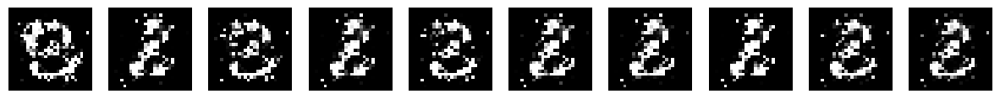

Epoch 35; Discriminator: 1.365, Generator: 0.733


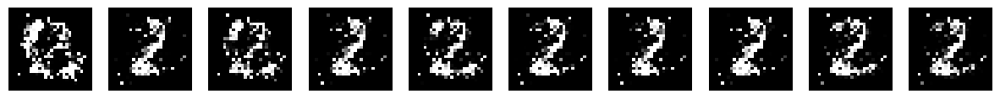

Epoch 36; Discriminator: 1.306, Generator: 0.768


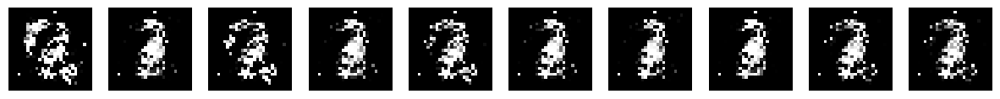

Epoch 37; Discriminator: 1.379, Generator: 0.813


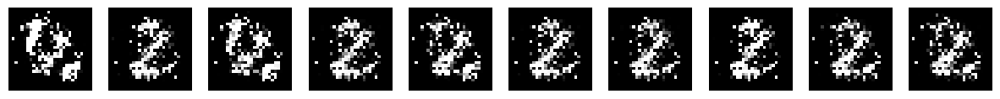

Epoch 38; Discriminator: 1.364, Generator: 0.852


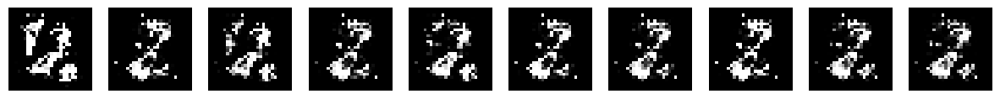

Epoch 39; Discriminator: 1.368, Generator: 0.730


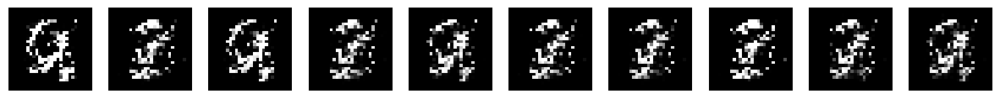

Epoch 40; Discriminator: 1.334, Generator: 0.734


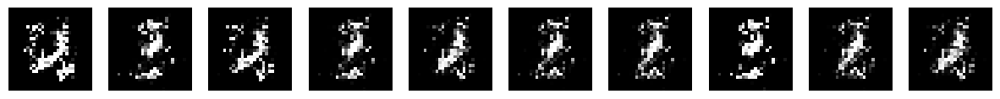

Epoch 41; Discriminator: 1.255, Generator: 0.818


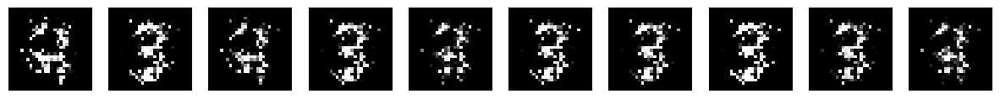

Epoch 42; Discriminator: 1.266, Generator: 0.866


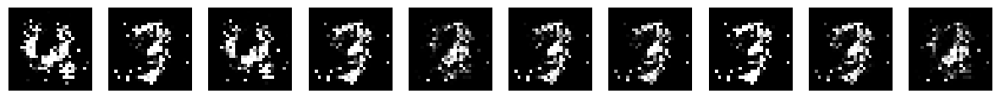

Epoch 43; Discriminator: 1.281, Generator: 0.813


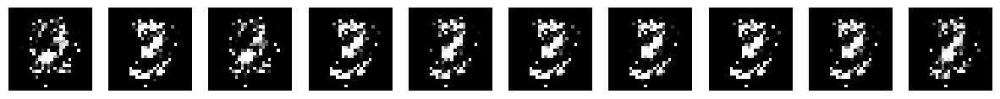

Epoch 44; Discriminator: 1.288, Generator: 0.844


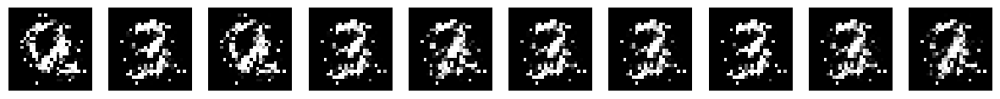

Epoch 45; Discriminator: 1.378, Generator: 0.814


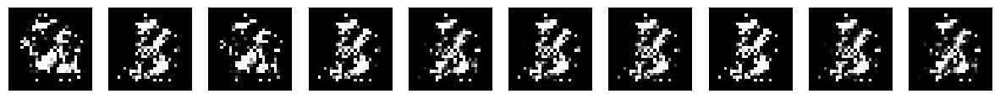

Epoch 46; Discriminator: 1.310, Generator: 0.795


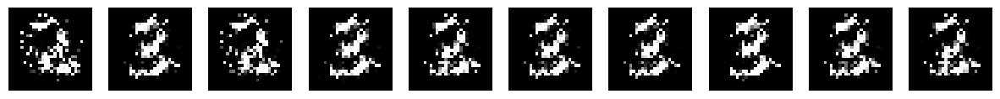

Epoch 47; Discriminator: 1.333, Generator: 0.741


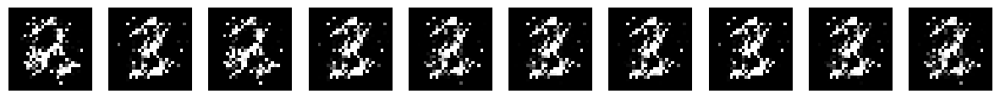

Epoch 48; Discriminator: 1.340, Generator: 0.823


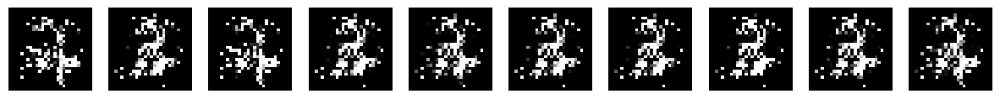

Epoch 49; Discriminator: 1.261, Generator: 0.851


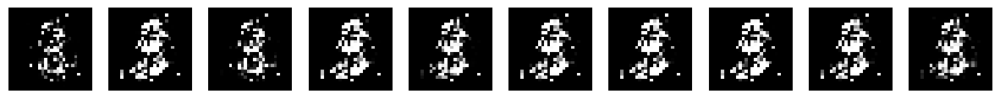

Epoch 50; Discriminator: 1.195, Generator: 0.831


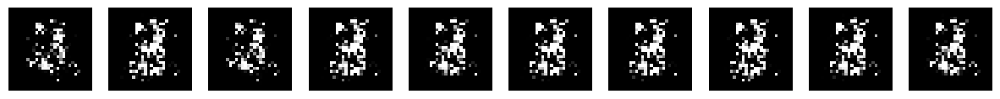

Epoch 51; Discriminator: 1.158, Generator: 0.932


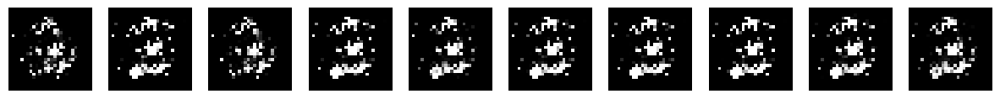

Epoch 52; Discriminator: 1.194, Generator: 0.847


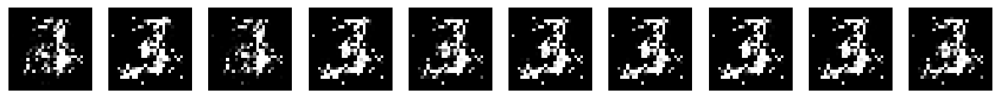

Epoch 53; Discriminator: 1.220, Generator: 0.937


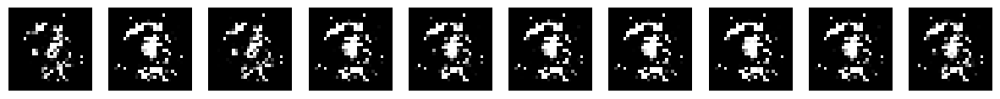

Epoch 54; Discriminator: 1.285, Generator: 0.834


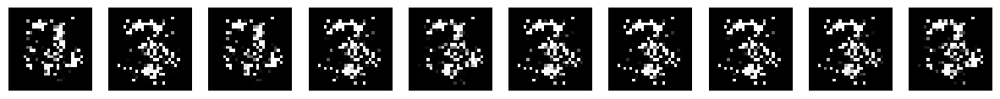

Epoch 55; Discriminator: 1.334, Generator: 0.810


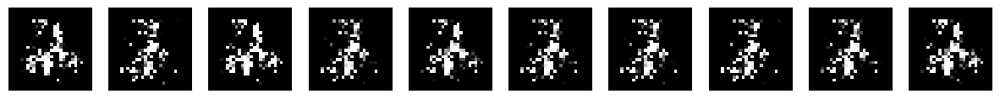

Epoch 56; Discriminator: 1.325, Generator: 0.772


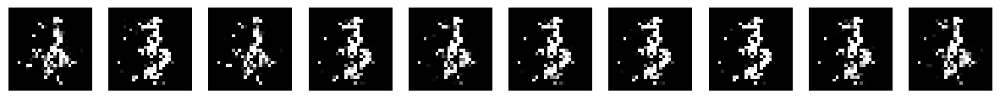

Epoch 57; Discriminator: 1.366, Generator: 0.794


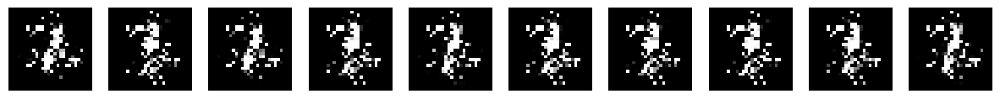

Epoch 58; Discriminator: 1.267, Generator: 0.832


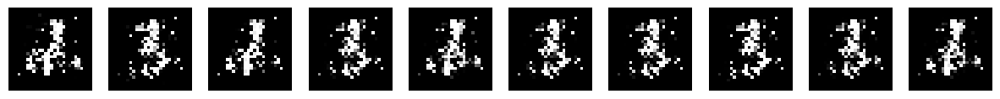

Epoch 59; Discriminator: 1.324, Generator: 0.825


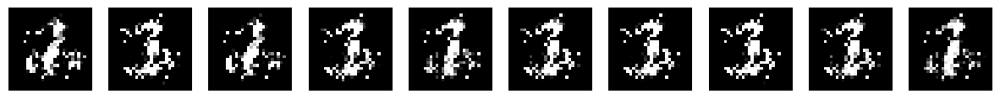

Epoch 60; Discriminator: 1.319, Generator: 0.752


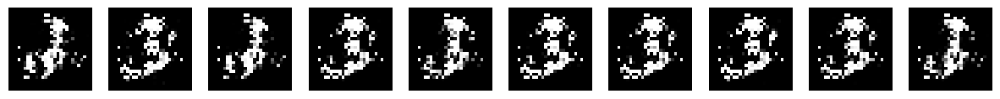

Epoch 61; Discriminator: 1.181, Generator: 0.814


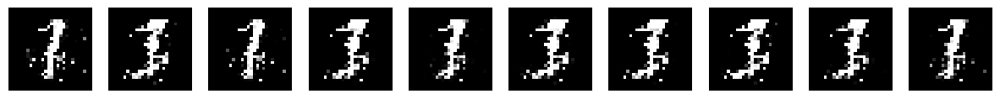

Epoch 62; Discriminator: 1.255, Generator: 0.940


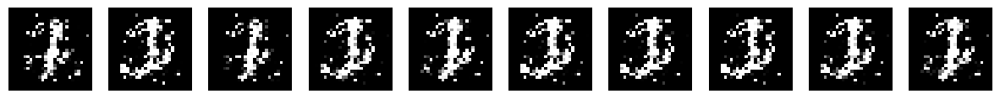

Epoch 63; Discriminator: 1.283, Generator: 0.860


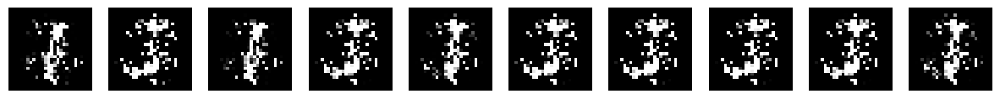

Epoch 64; Discriminator: 0.959, Generator: 0.923


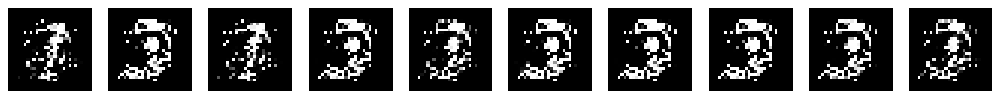

Epoch 65; Discriminator: 1.178, Generator: 0.964


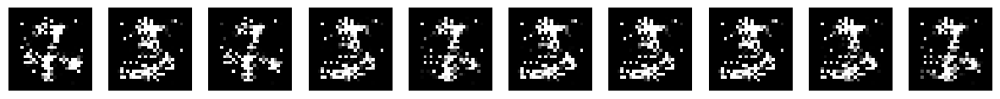

Epoch 66; Discriminator: 1.276, Generator: 0.803


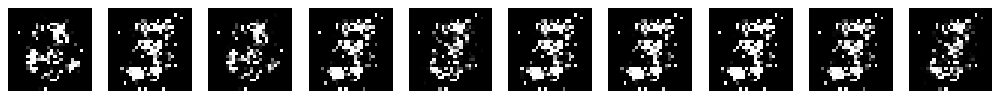

Epoch 67; Discriminator: 1.334, Generator: 0.798


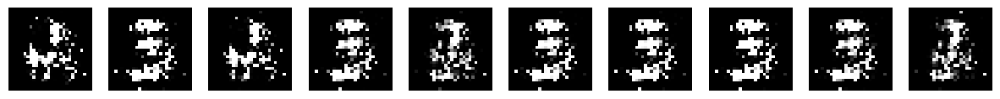

Epoch 68; Discriminator: 1.286, Generator: 0.769


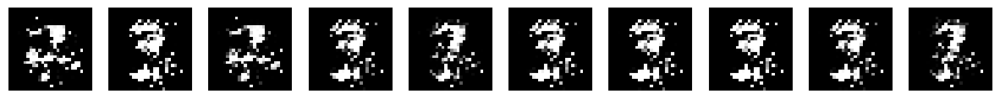

Epoch 69; Discriminator: 1.353, Generator: 0.783


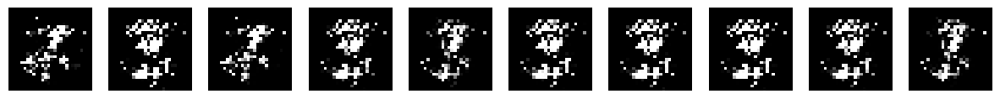

Epoch 70; Discriminator: 1.317, Generator: 0.754


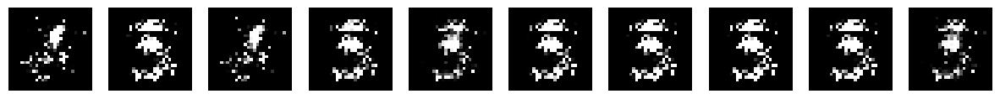

Epoch 71; Discriminator: 1.312, Generator: 0.775


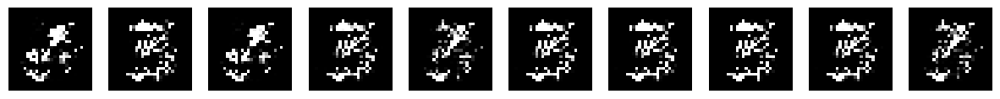

Epoch 72; Discriminator: 1.282, Generator: 0.894


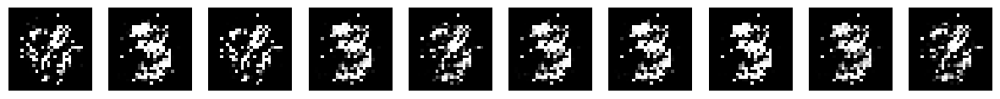

Epoch 73; Discriminator: 1.192, Generator: 0.894


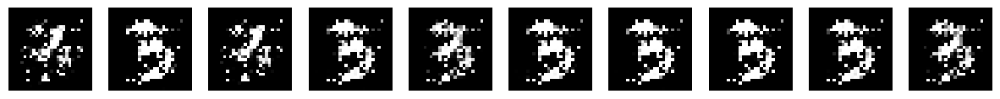

Epoch 74; Discriminator: 1.285, Generator: 0.860


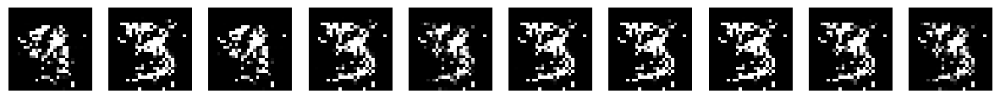

Epoch 75; Discriminator: 1.253, Generator: 0.778


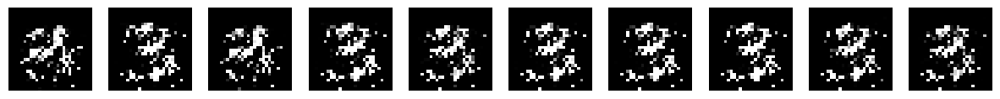

Epoch 76; Discriminator: 1.276, Generator: 0.960


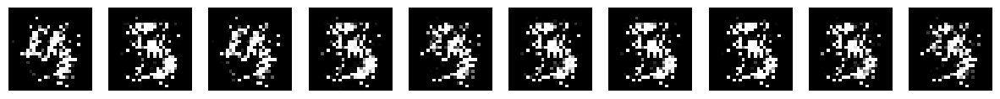

Epoch 77; Discriminator: 1.327, Generator: 1.022


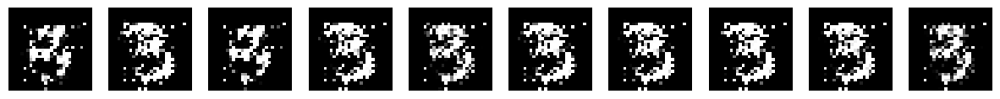

Epoch 78; Discriminator: 1.326, Generator: 0.813


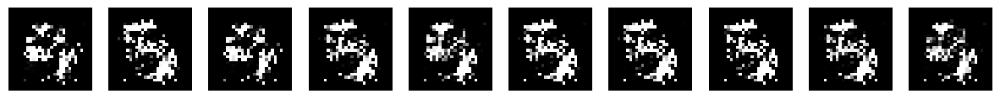

Epoch 79; Discriminator: 1.298, Generator: 0.733


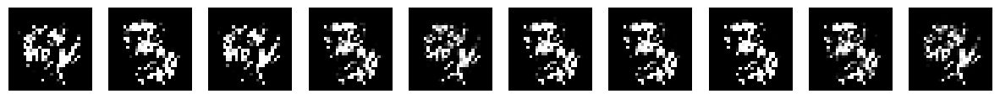

Epoch 80; Discriminator: 1.384, Generator: 0.784


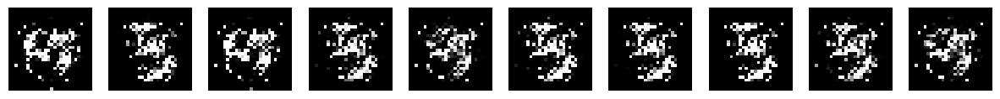

Epoch 81; Discriminator: 1.327, Generator: 0.753


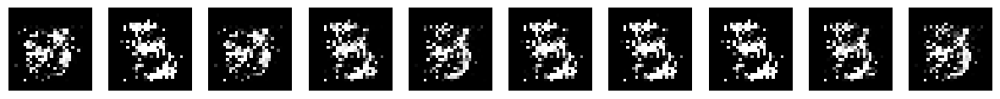

Epoch 82; Discriminator: 1.357, Generator: 0.769


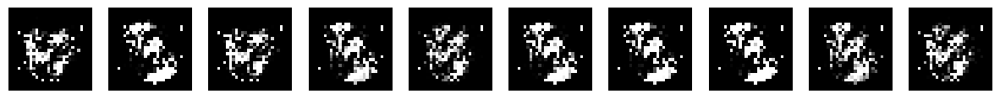

Epoch 83; Discriminator: 1.188, Generator: 0.787


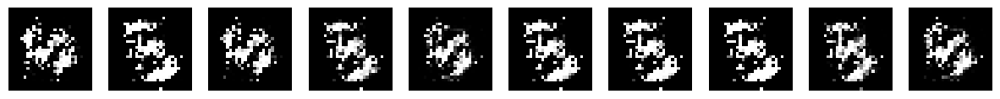

Epoch 84; Discriminator: 1.348, Generator: 0.733


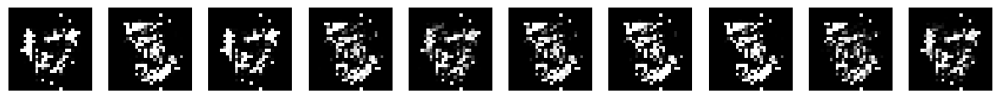

Epoch 85; Discriminator: 1.298, Generator: 0.820


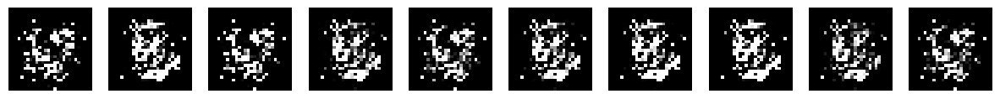

Epoch 86; Discriminator: 1.336, Generator: 0.884


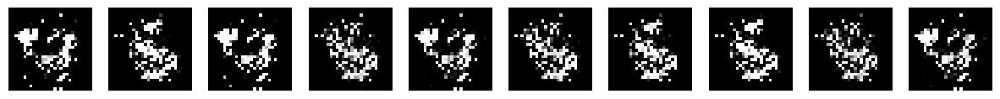

Epoch 87; Discriminator: 1.381, Generator: 0.849


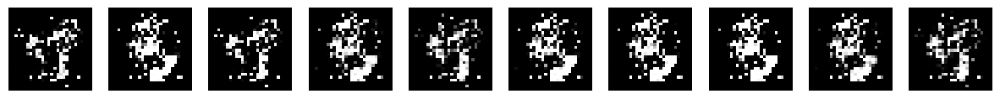

Epoch 88; Discriminator: 1.329, Generator: 0.839


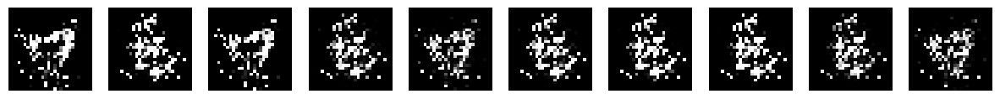

Epoch 89; Discriminator: 1.270, Generator: 0.848


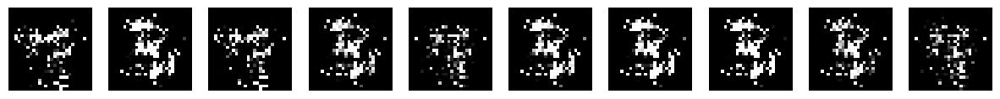

Epoch 90; Discriminator: 1.377, Generator: 0.770


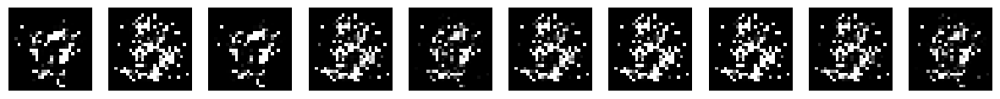

Epoch 91; Discriminator: 1.144, Generator: 0.818


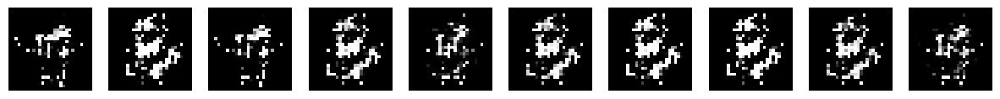

Epoch 92; Discriminator: 1.236, Generator: 0.876


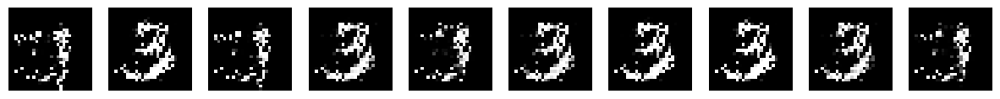

Epoch 93; Discriminator: 1.207, Generator: 0.957


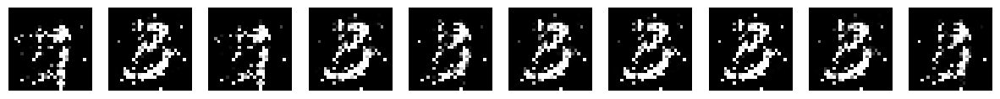

Epoch 94; Discriminator: 1.228, Generator: 0.971


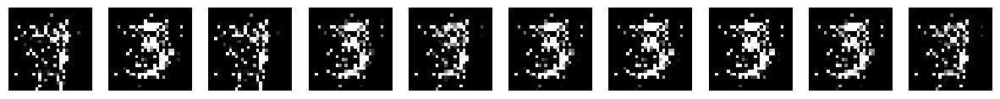

Epoch 95; Discriminator: 1.143, Generator: 1.111


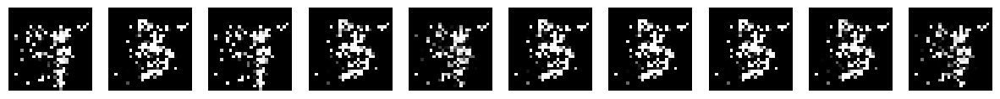

Epoch 96; Discriminator: 1.139, Generator: 0.940


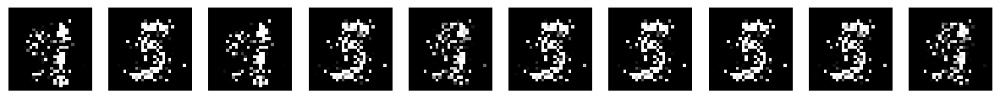

Epoch 97; Discriminator: 1.173, Generator: 1.048


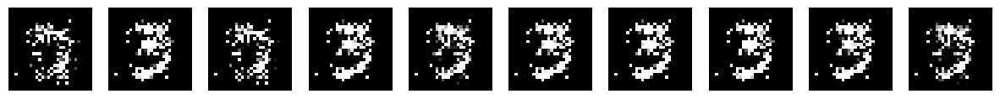

Epoch 98; Discriminator: 1.382, Generator: 0.883


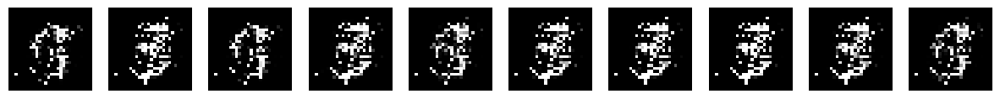

Epoch 99; Discriminator: 1.361, Generator: 0.883


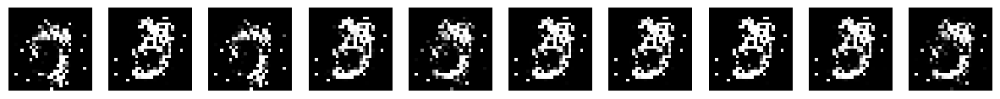

In [ ]:
# Chiffre 3

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=3)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.207, Generator: 0.821


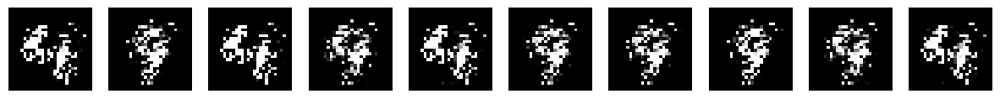

Epoch 1; Discriminator: 1.394, Generator: 0.899


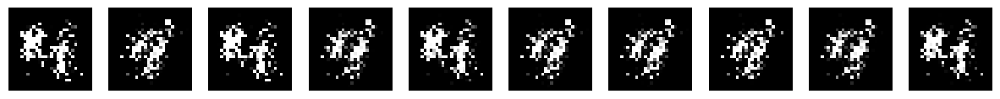

Epoch 2; Discriminator: 1.381, Generator: 0.881


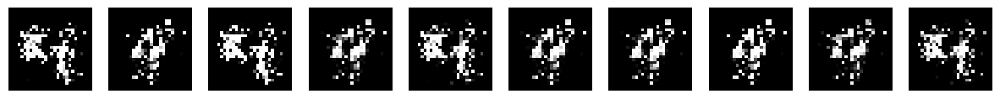

Epoch 3; Discriminator: 1.403, Generator: 0.837


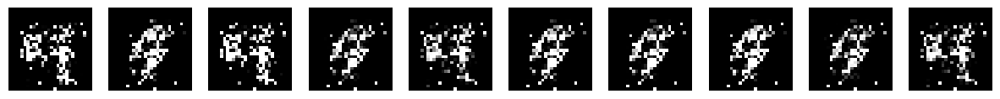

Epoch 4; Discriminator: 1.246, Generator: 0.771


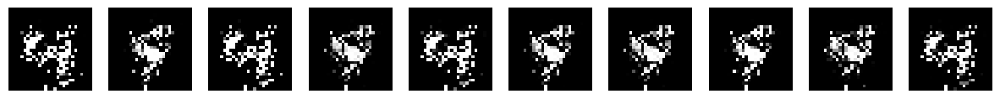

Epoch 5; Discriminator: 1.208, Generator: 0.793


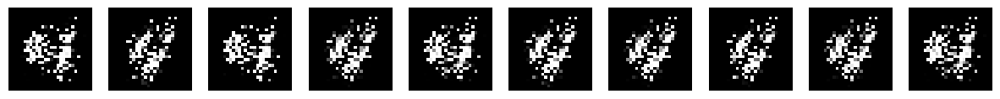

Epoch 6; Discriminator: 1.405, Generator: 0.813


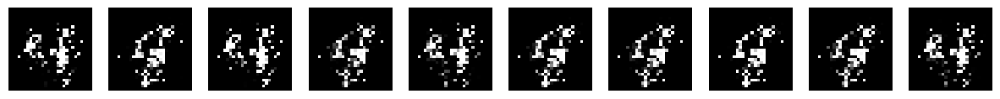

Epoch 7; Discriminator: 1.314, Generator: 0.758


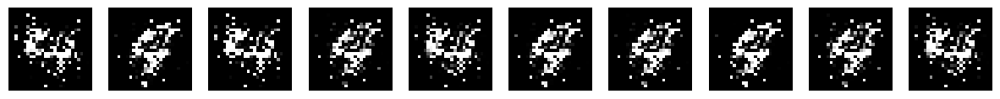

Epoch 8; Discriminator: 1.315, Generator: 0.781


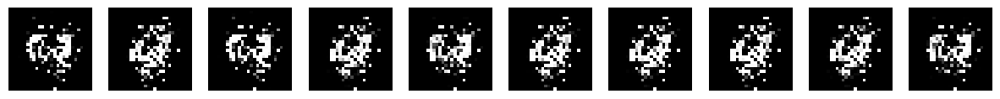

Epoch 9; Discriminator: 1.271, Generator: 0.936


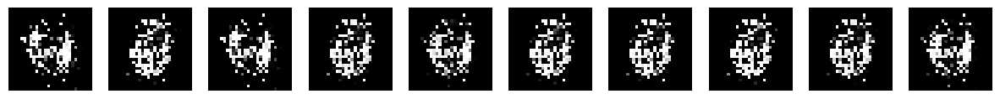

Epoch 10; Discriminator: 1.314, Generator: 0.918


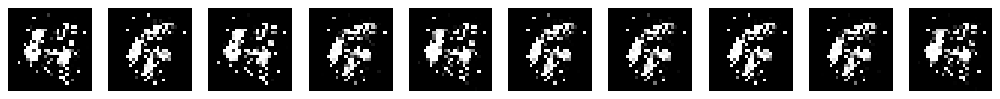

Epoch 11; Discriminator: 1.344, Generator: 0.776


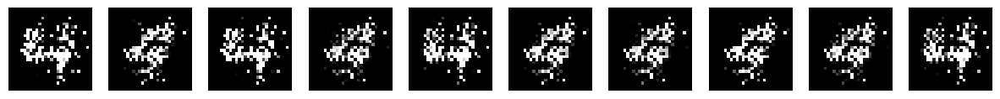

Epoch 12; Discriminator: 1.283, Generator: 0.801


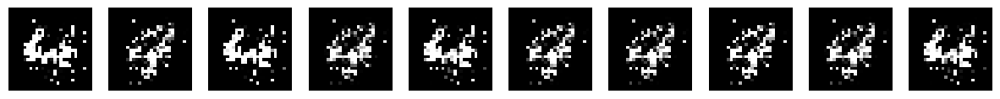

Epoch 13; Discriminator: 1.224, Generator: 0.731


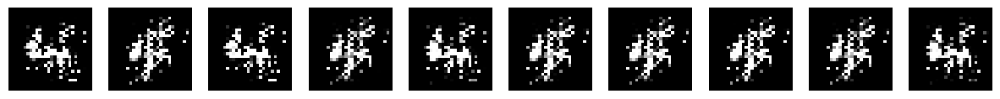

Epoch 14; Discriminator: 1.373, Generator: 0.760


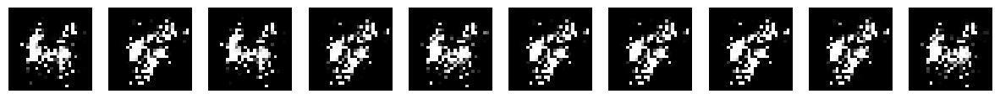

Epoch 15; Discriminator: 1.347, Generator: 0.753


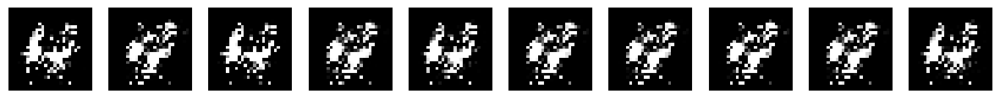

Epoch 16; Discriminator: 1.339, Generator: 0.740


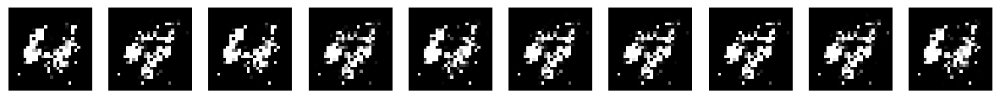

Epoch 17; Discriminator: 1.361, Generator: 0.753


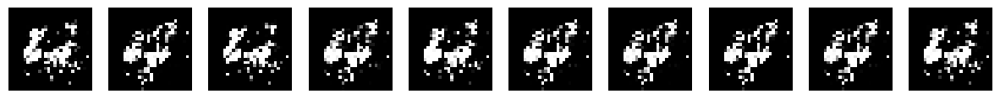

Epoch 18; Discriminator: 1.384, Generator: 0.711


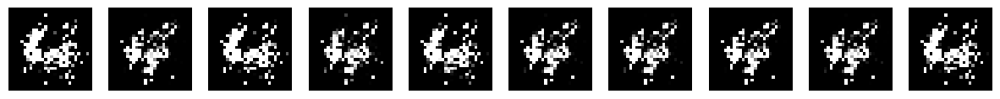

Epoch 19; Discriminator: 1.274, Generator: 0.706


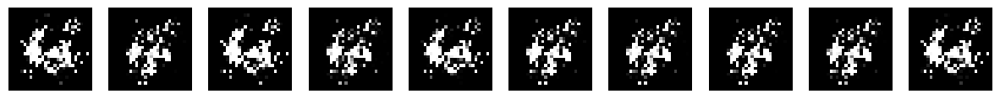

Epoch 20; Discriminator: 1.358, Generator: 0.757


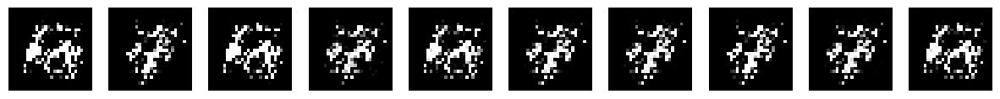

Epoch 21; Discriminator: 1.363, Generator: 0.713


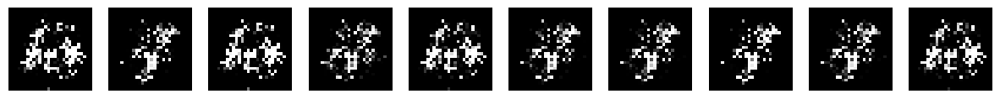

Epoch 22; Discriminator: 1.395, Generator: 0.779


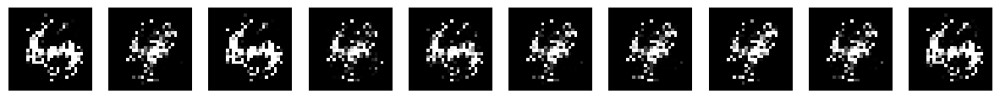

Epoch 23; Discriminator: 1.371, Generator: 0.727


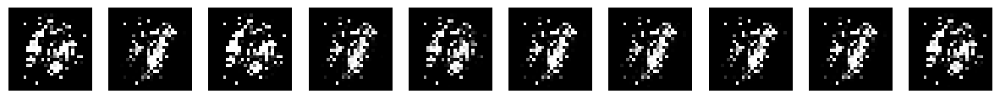

Epoch 24; Discriminator: 1.396, Generator: 0.772


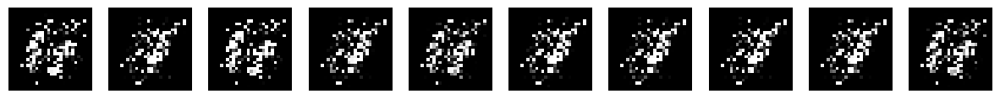

Epoch 25; Discriminator: 1.373, Generator: 0.743


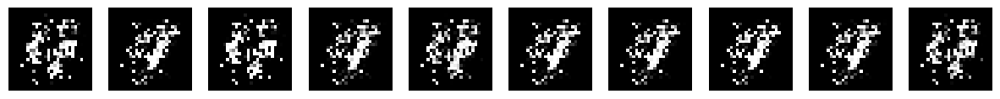

Epoch 26; Discriminator: 1.352, Generator: 0.760


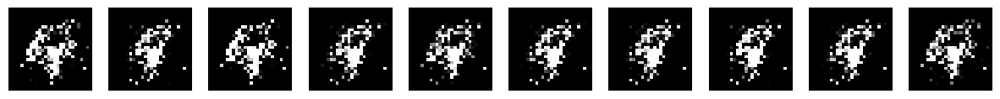

Epoch 27; Discriminator: 1.330, Generator: 0.786


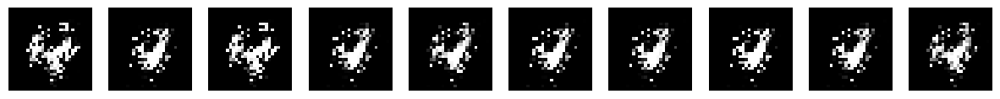

Epoch 28; Discriminator: 1.361, Generator: 0.774


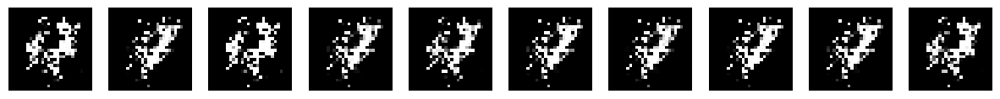

Epoch 29; Discriminator: 1.324, Generator: 0.711


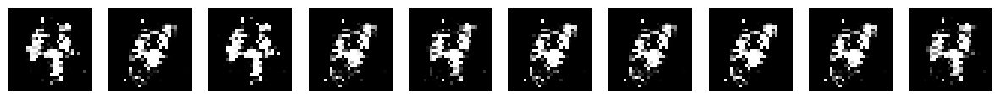

Epoch 30; Discriminator: 1.374, Generator: 0.765


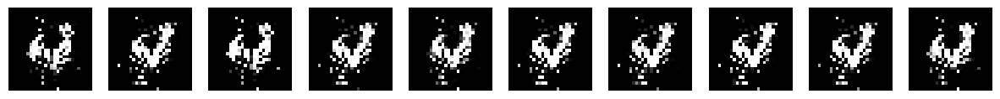

Epoch 31; Discriminator: 1.350, Generator: 0.791


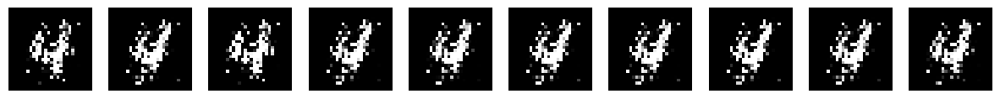

Epoch 32; Discriminator: 1.229, Generator: 0.780


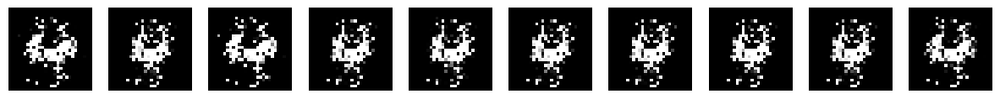

Epoch 33; Discriminator: 1.295, Generator: 0.808


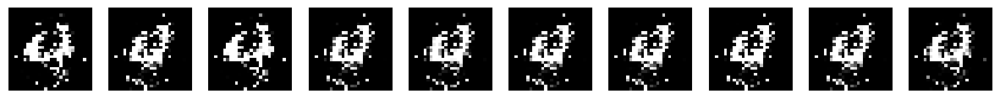

Epoch 34; Discriminator: 1.408, Generator: 0.769


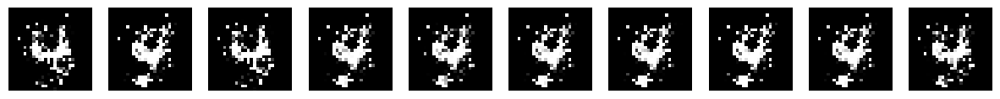

Epoch 35; Discriminator: 1.369, Generator: 0.767


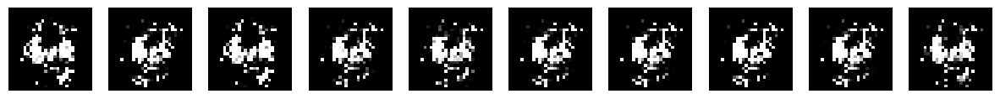

Epoch 36; Discriminator: 1.364, Generator: 0.729


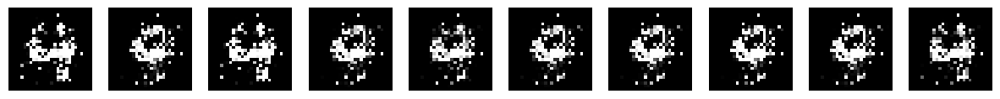

Epoch 37; Discriminator: 1.346, Generator: 0.743


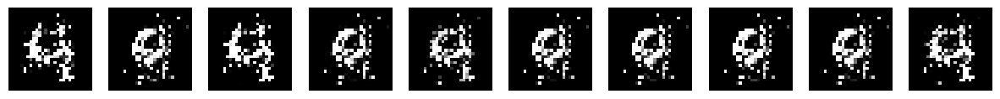

Epoch 38; Discriminator: 1.281, Generator: 0.800


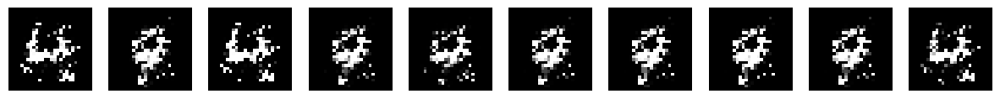

Epoch 39; Discriminator: 1.295, Generator: 0.830


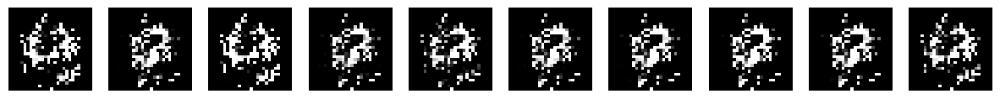

Epoch 40; Discriminator: 1.363, Generator: 0.782


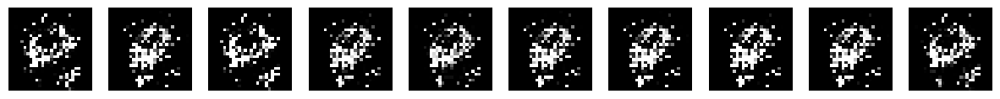

Epoch 41; Discriminator: 1.330, Generator: 0.798


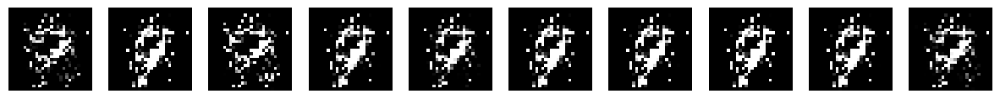

Epoch 42; Discriminator: 1.364, Generator: 0.810


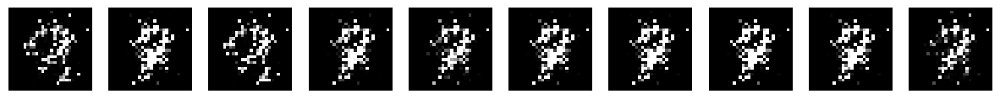

Epoch 43; Discriminator: 1.354, Generator: 0.769


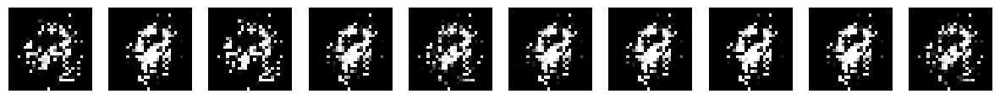

Epoch 44; Discriminator: 1.316, Generator: 0.782


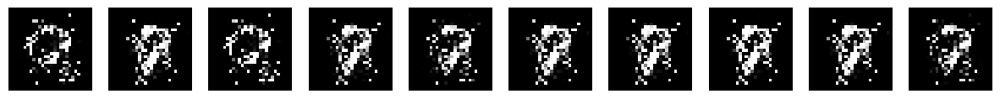

Epoch 45; Discriminator: 1.352, Generator: 0.764


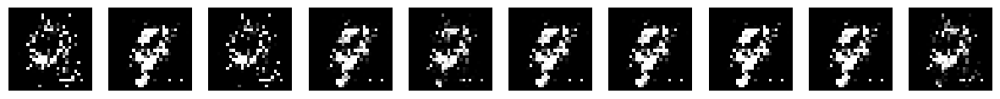

Epoch 46; Discriminator: 1.324, Generator: 0.764


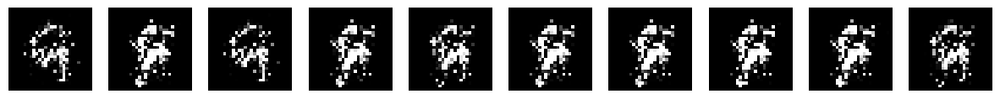

Epoch 47; Discriminator: 1.304, Generator: 0.766


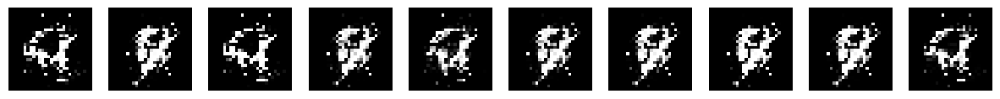

Epoch 48; Discriminator: 1.386, Generator: 0.806


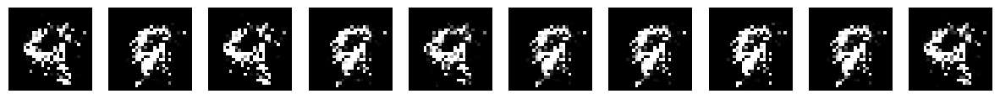

Epoch 49; Discriminator: 1.301, Generator: 0.791


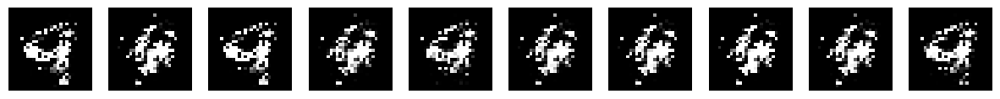

Epoch 50; Discriminator: 1.397, Generator: 0.799


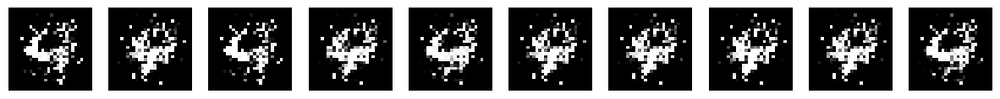

Epoch 51; Discriminator: 1.326, Generator: 0.831


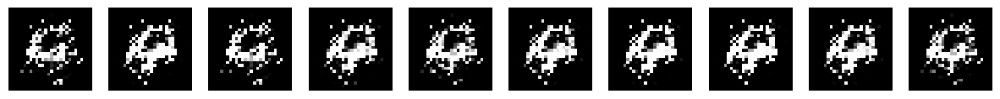

Epoch 52; Discriminator: 1.116, Generator: 1.058


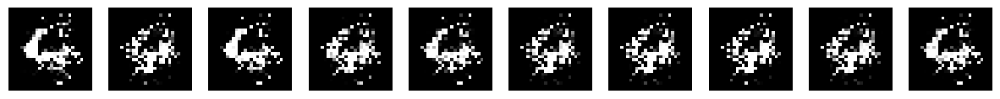

Epoch 53; Discriminator: 1.208, Generator: 1.072


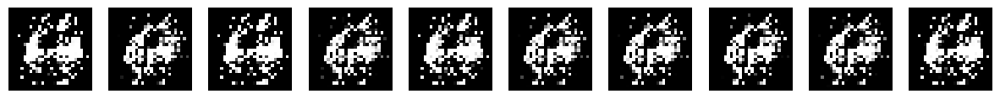

Epoch 54; Discriminator: 1.342, Generator: 0.858


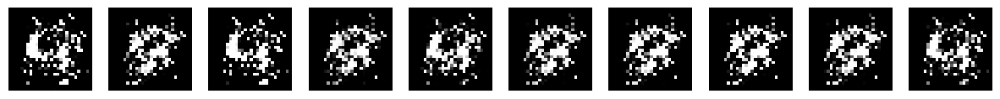

Epoch 55; Discriminator: 1.209, Generator: 0.778


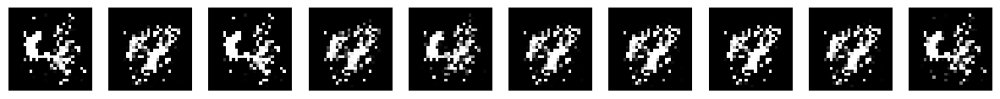

Epoch 56; Discriminator: 1.241, Generator: 0.823


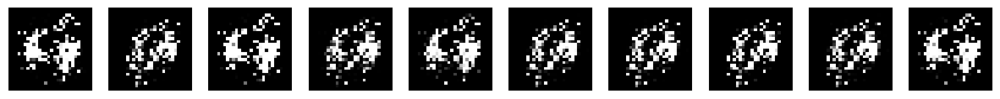

Epoch 57; Discriminator: 1.312, Generator: 0.840


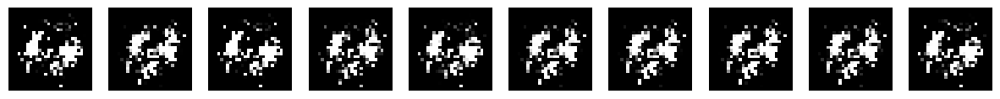

Epoch 58; Discriminator: 1.133, Generator: 0.905


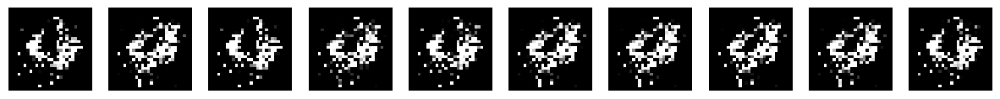

Epoch 59; Discriminator: 1.333, Generator: 0.837


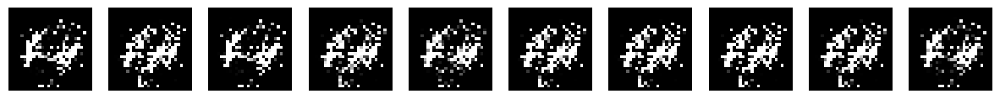

Epoch 60; Discriminator: 1.391, Generator: 0.769


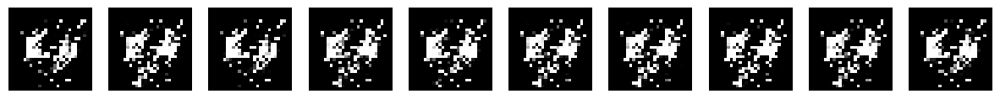

Epoch 61; Discriminator: 1.281, Generator: 0.776


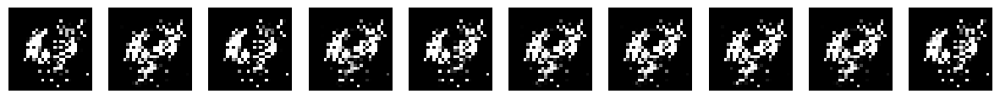

Epoch 62; Discriminator: 1.377, Generator: 0.745


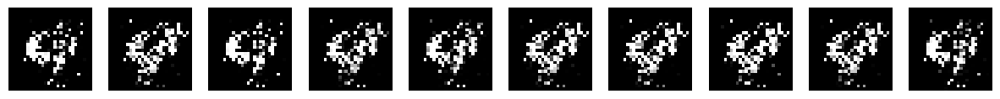

Epoch 63; Discriminator: 1.326, Generator: 0.739


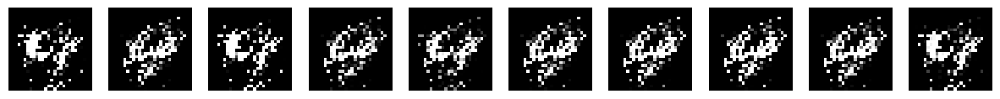

Epoch 64; Discriminator: 1.330, Generator: 0.747


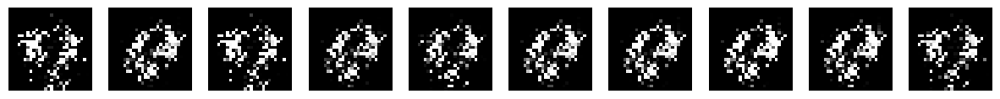

Epoch 65; Discriminator: 1.343, Generator: 0.787


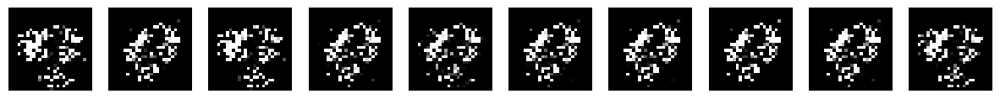

Epoch 66; Discriminator: 1.353, Generator: 0.758


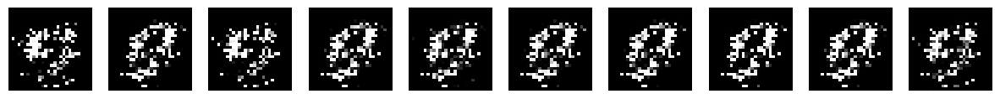

Epoch 67; Discriminator: 1.344, Generator: 0.760


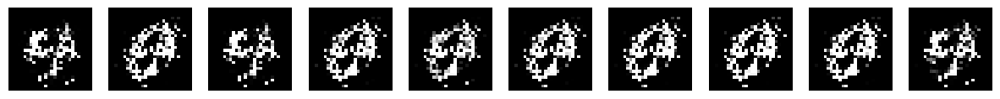

Epoch 68; Discriminator: 1.331, Generator: 0.796


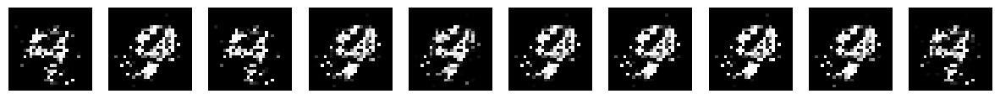

Epoch 69; Discriminator: 1.333, Generator: 0.796


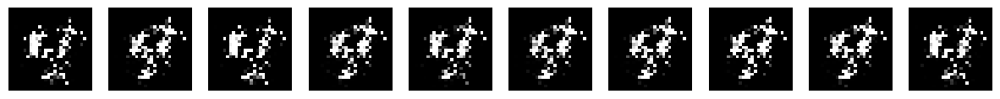

Epoch 70; Discriminator: 1.350, Generator: 0.722


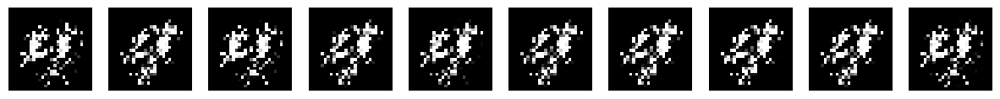

Epoch 71; Discriminator: 1.283, Generator: 0.746


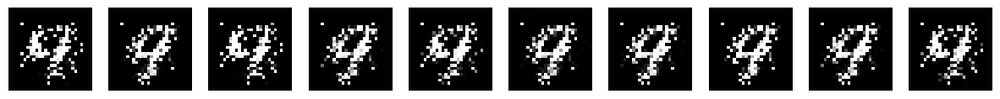

Epoch 72; Discriminator: 1.376, Generator: 0.759


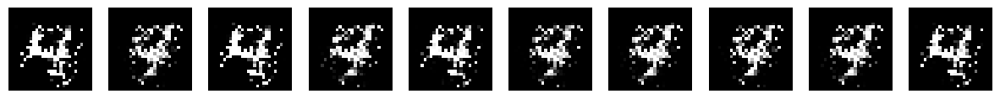

Epoch 73; Discriminator: 1.371, Generator: 0.772


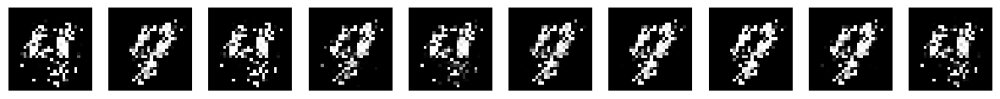

Epoch 74; Discriminator: 1.368, Generator: 0.757


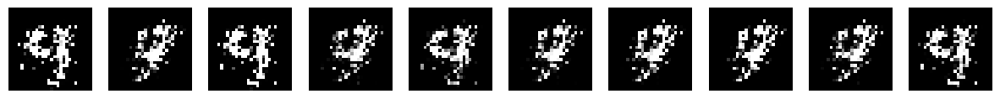

Epoch 75; Discriminator: 1.363, Generator: 0.756


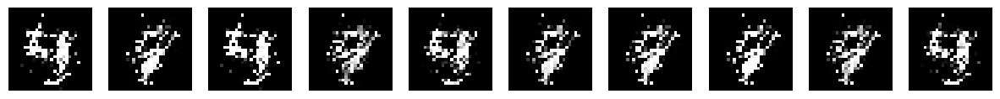

Epoch 76; Discriminator: 1.381, Generator: 0.718


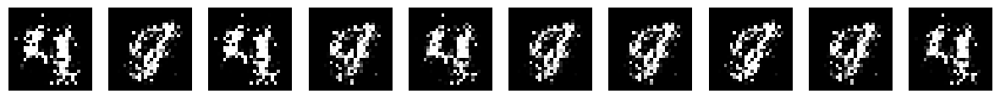

Epoch 77; Discriminator: 1.400, Generator: 0.748


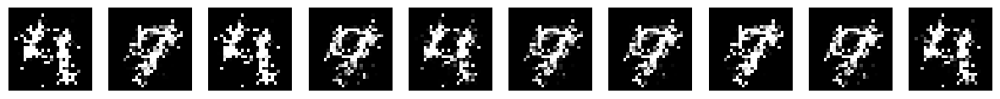

Epoch 78; Discriminator: 1.386, Generator: 0.703


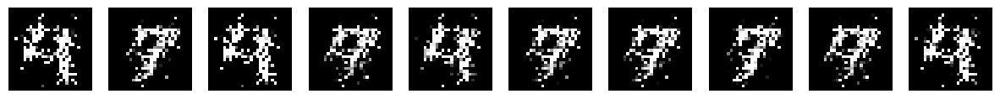

Epoch 79; Discriminator: 1.348, Generator: 0.703


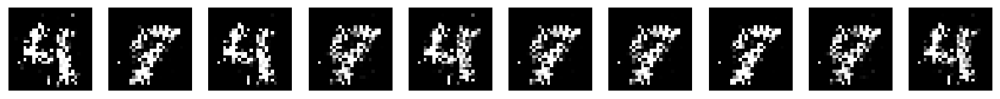

Epoch 80; Discriminator: 1.398, Generator: 0.720


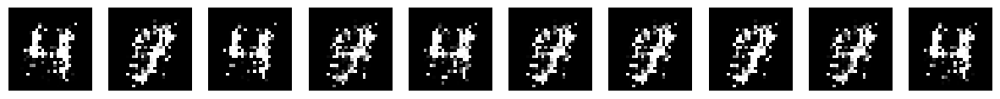

Epoch 81; Discriminator: 1.349, Generator: 0.699


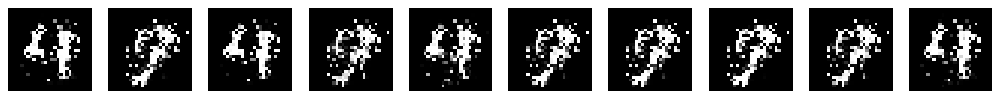

Epoch 82; Discriminator: 1.360, Generator: 0.732


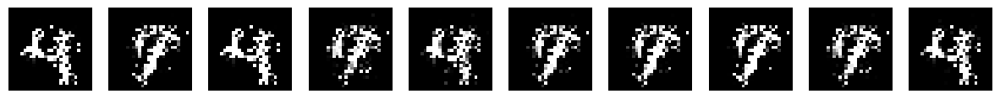

Epoch 83; Discriminator: 1.352, Generator: 0.730


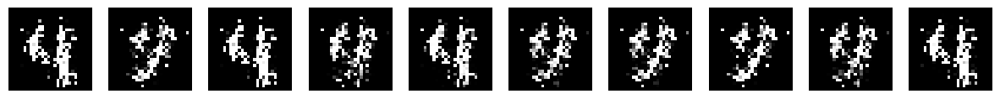

Epoch 84; Discriminator: 1.392, Generator: 0.828


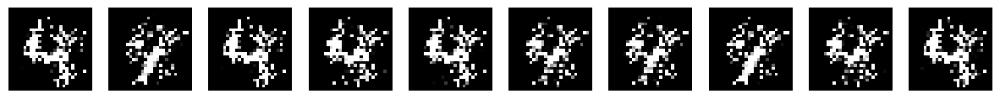

Epoch 85; Discriminator: 1.340, Generator: 0.777


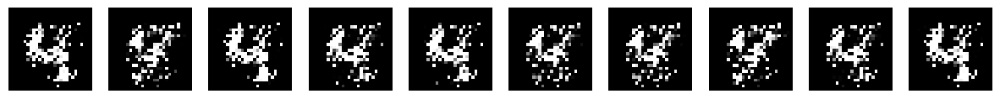

Epoch 86; Discriminator: 1.366, Generator: 0.770


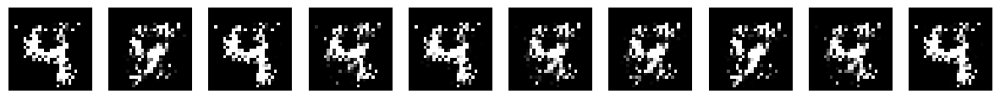

Epoch 87; Discriminator: 1.337, Generator: 0.780


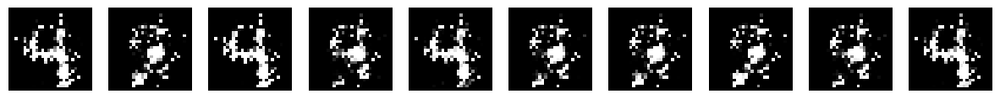

Epoch 88; Discriminator: 1.335, Generator: 0.728


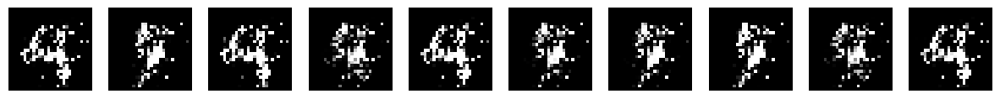

Epoch 89; Discriminator: 1.273, Generator: 0.765


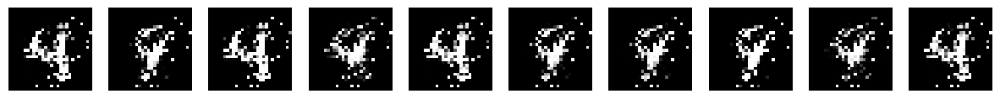

Epoch 90; Discriminator: 1.373, Generator: 0.792


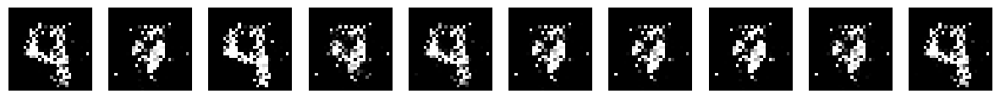

Epoch 91; Discriminator: 1.306, Generator: 0.746


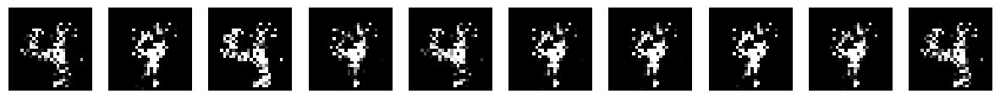

Epoch 92; Discriminator: 1.313, Generator: 0.732


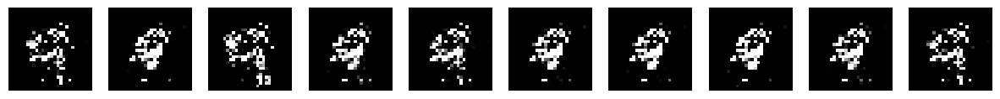

Epoch 93; Discriminator: 1.304, Generator: 0.790


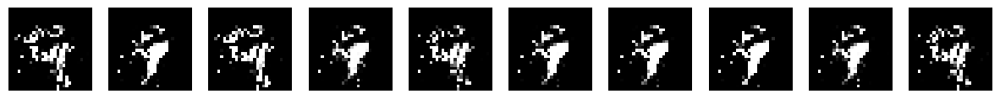

Epoch 94; Discriminator: 1.257, Generator: 0.811


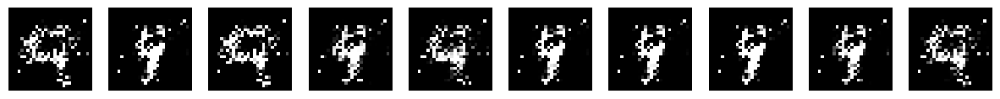

Epoch 95; Discriminator: 1.345, Generator: 0.818


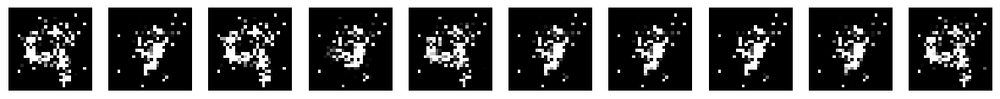

Epoch 96; Discriminator: 1.395, Generator: 0.776


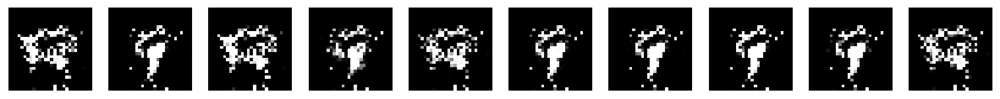

Epoch 97; Discriminator: 1.374, Generator: 0.746


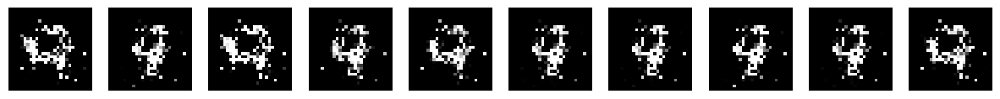

Epoch 98; Discriminator: 1.374, Generator: 0.737


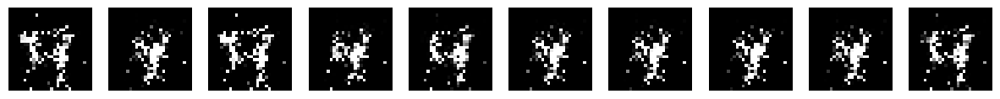

Epoch 99; Discriminator: 1.363, Generator: 0.752


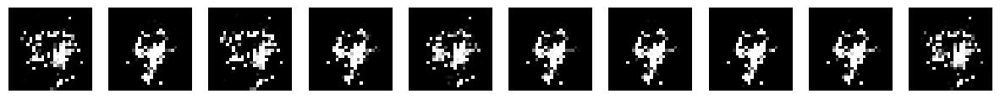

In [ ]:
# Chiffre 4

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=4)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.408, Generator: 0.747


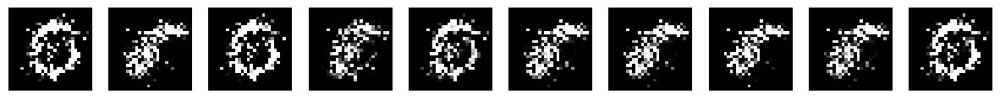

Epoch 1; Discriminator: 1.333, Generator: 0.773


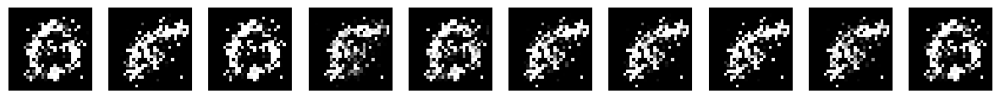

Epoch 2; Discriminator: 1.302, Generator: 0.728


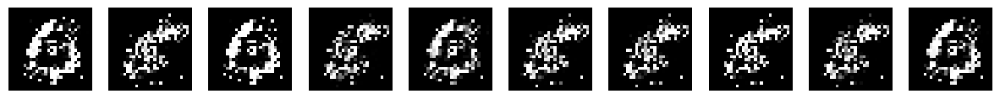

Epoch 3; Discriminator: 1.399, Generator: 0.779


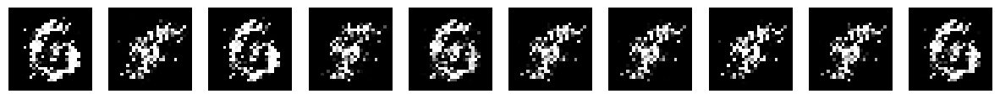

Epoch 4; Discriminator: 1.375, Generator: 0.793


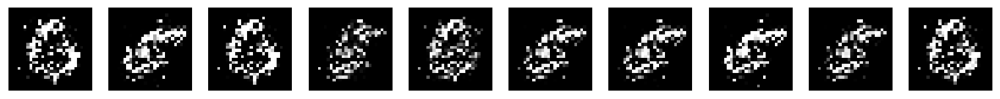

Epoch 5; Discriminator: 1.234, Generator: 0.715


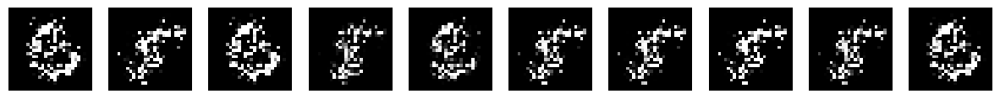

Epoch 6; Discriminator: 1.344, Generator: 0.780


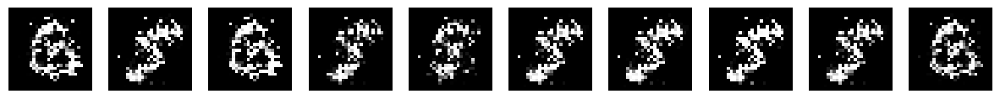

Epoch 7; Discriminator: 1.332, Generator: 0.779


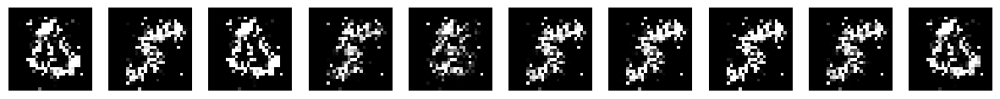

Epoch 8; Discriminator: 1.286, Generator: 0.773


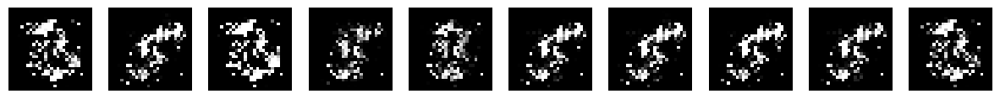

Epoch 9; Discriminator: 1.316, Generator: 0.746


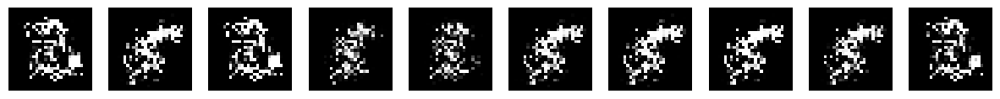

Epoch 10; Discriminator: 1.348, Generator: 0.761


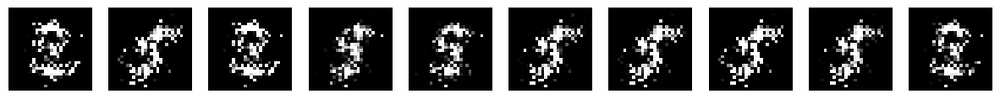

Epoch 11; Discriminator: 1.272, Generator: 0.727


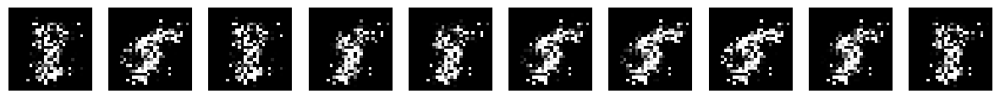

Epoch 12; Discriminator: 1.379, Generator: 0.801


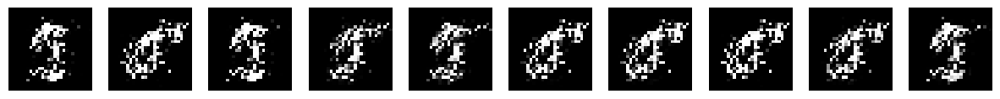

Epoch 13; Discriminator: 1.374, Generator: 0.754


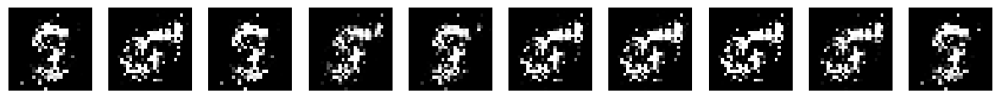

Epoch 14; Discriminator: 1.324, Generator: 0.778


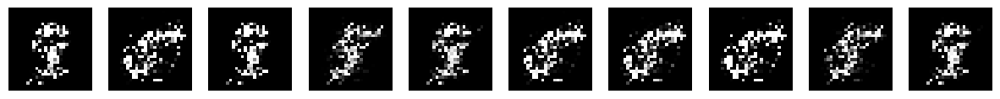

Epoch 15; Discriminator: 1.372, Generator: 0.734


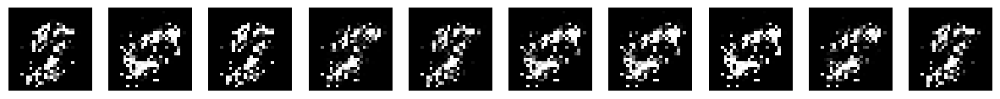

Epoch 16; Discriminator: 1.370, Generator: 0.764


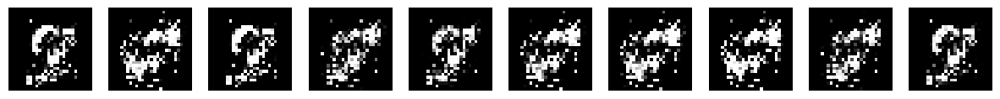

Epoch 17; Discriminator: 1.316, Generator: 0.801


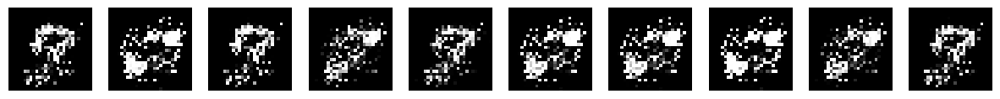

Epoch 18; Discriminator: 1.372, Generator: 0.756


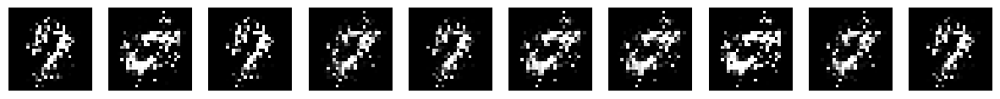

Epoch 19; Discriminator: 1.332, Generator: 0.760


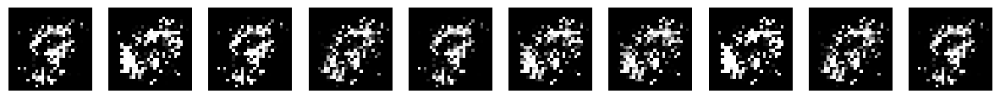

Epoch 20; Discriminator: 1.301, Generator: 0.776


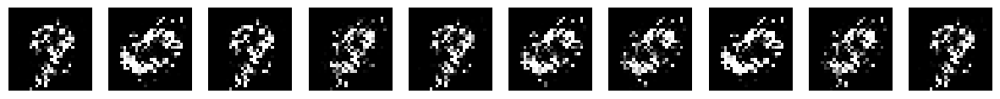

Epoch 21; Discriminator: 1.374, Generator: 0.773


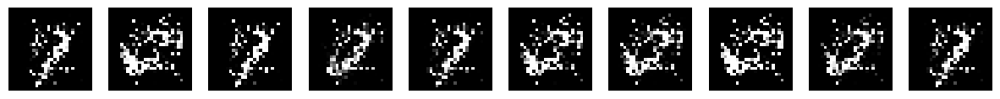

Epoch 22; Discriminator: 1.241, Generator: 0.721


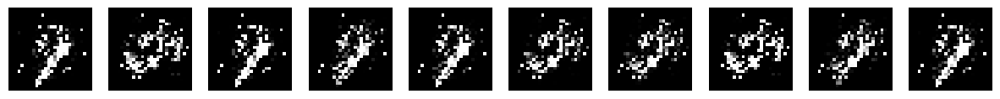

Epoch 23; Discriminator: 1.310, Generator: 0.829


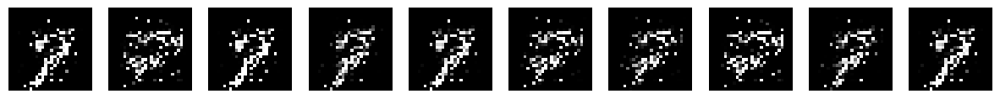

Epoch 24; Discriminator: 1.255, Generator: 0.802


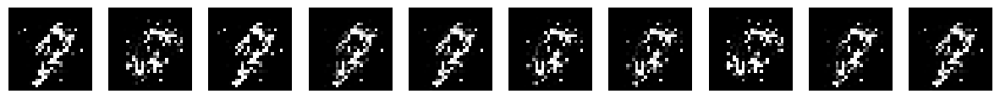

Epoch 25; Discriminator: 1.307, Generator: 0.880


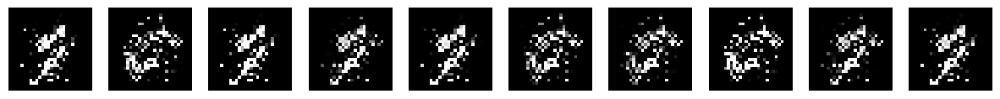

Epoch 26; Discriminator: 1.228, Generator: 0.834


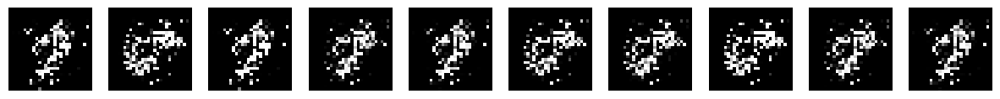

Epoch 27; Discriminator: 1.280, Generator: 0.786


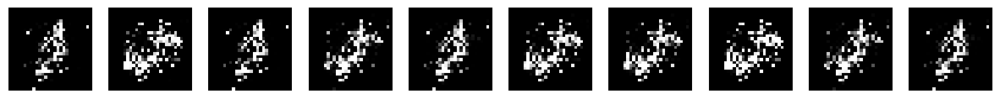

Epoch 28; Discriminator: 1.258, Generator: 0.768


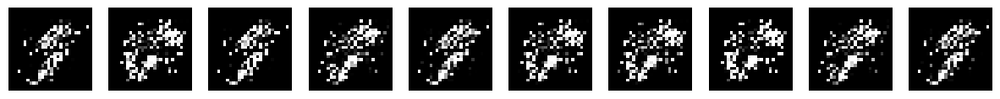

Epoch 29; Discriminator: 1.400, Generator: 0.751


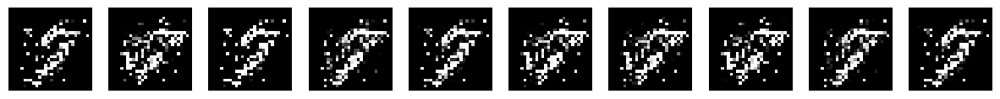

Epoch 30; Discriminator: 1.407, Generator: 0.746


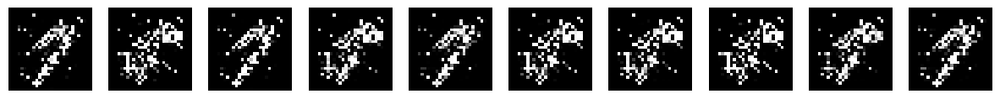

Epoch 31; Discriminator: 1.248, Generator: 0.761


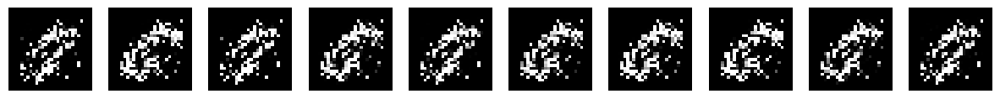

Epoch 32; Discriminator: 1.298, Generator: 0.852


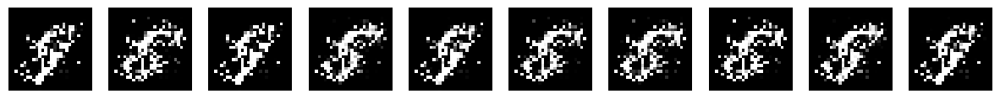

Epoch 33; Discriminator: 1.344, Generator: 0.782


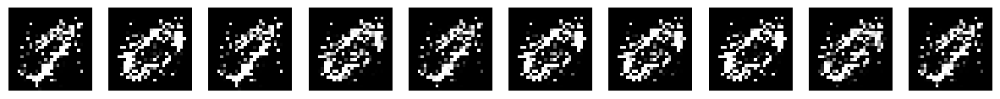

Epoch 34; Discriminator: 1.192, Generator: 0.879


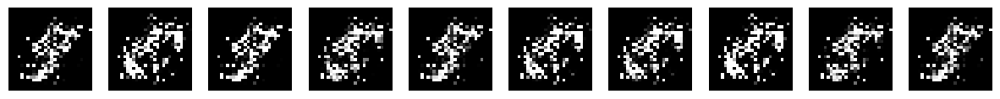

Epoch 35; Discriminator: 1.412, Generator: 0.774


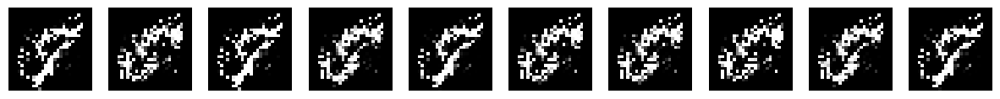

Epoch 36; Discriminator: 1.305, Generator: 0.707


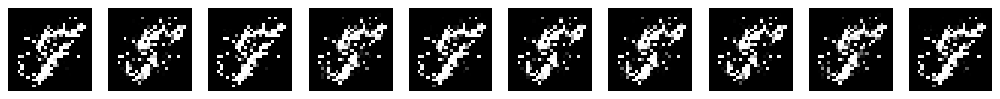

Epoch 37; Discriminator: 1.321, Generator: 0.771


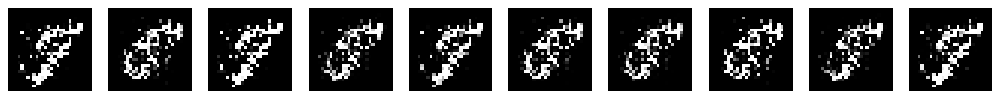

Epoch 38; Discriminator: 1.298, Generator: 0.788


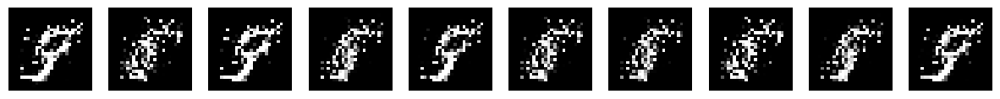

Epoch 39; Discriminator: 1.281, Generator: 0.805


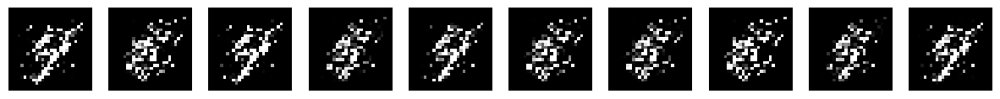

Epoch 40; Discriminator: 1.292, Generator: 0.764


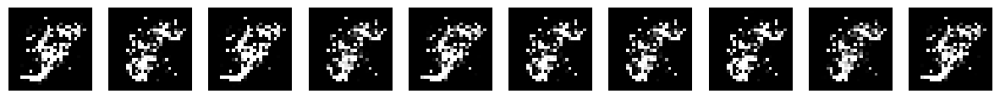

Epoch 41; Discriminator: 1.380, Generator: 0.735


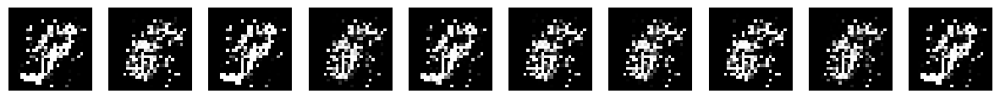

Epoch 42; Discriminator: 1.373, Generator: 0.746


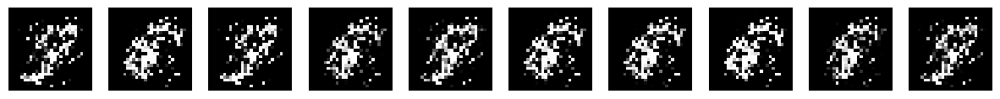

Epoch 43; Discriminator: 1.289, Generator: 0.760


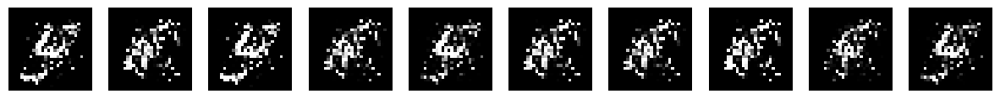

Epoch 44; Discriminator: 1.425, Generator: 0.758


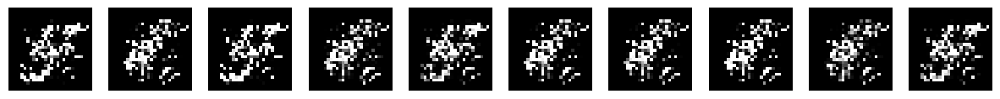

Epoch 45; Discriminator: 1.380, Generator: 0.734


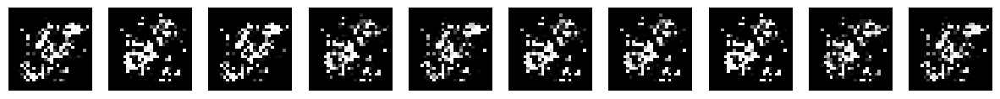

Epoch 46; Discriminator: 1.330, Generator: 0.790


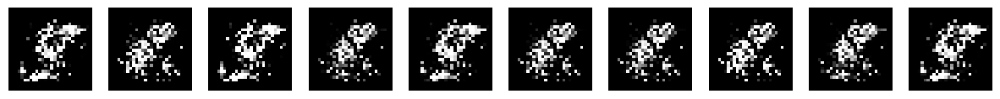

Epoch 47; Discriminator: 1.328, Generator: 0.783


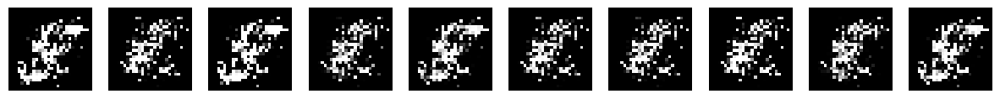

Epoch 48; Discriminator: 1.309, Generator: 0.755


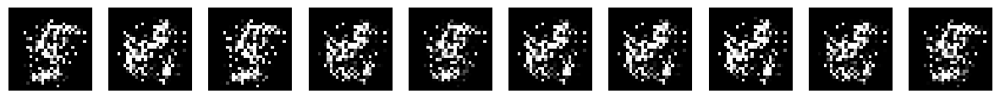

Epoch 49; Discriminator: 1.351, Generator: 0.730


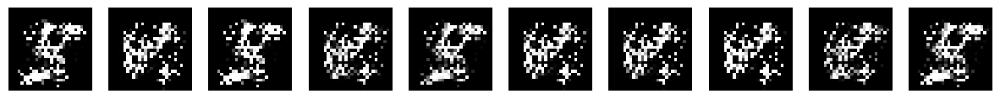

Epoch 50; Discriminator: 1.396, Generator: 0.697


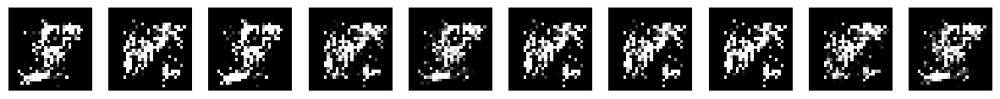

Epoch 51; Discriminator: 1.291, Generator: 0.749


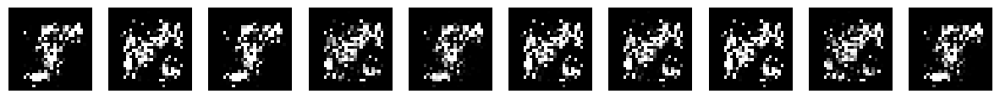

Epoch 52; Discriminator: 1.270, Generator: 0.815


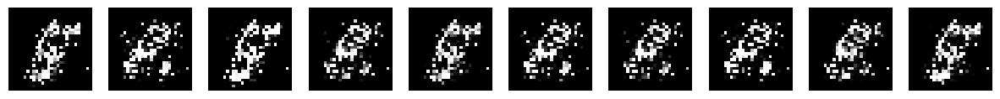

Epoch 53; Discriminator: 1.328, Generator: 0.748


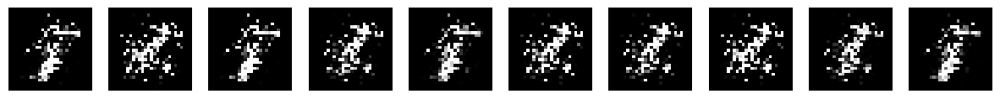

Epoch 54; Discriminator: 1.257, Generator: 0.752


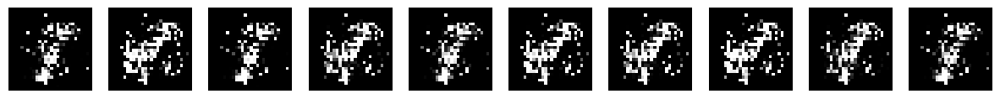

Epoch 55; Discriminator: 1.289, Generator: 0.854


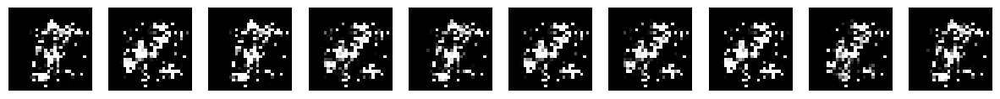

Epoch 56; Discriminator: 1.207, Generator: 0.866


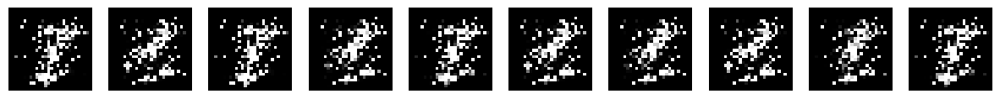

Epoch 57; Discriminator: 1.190, Generator: 0.838


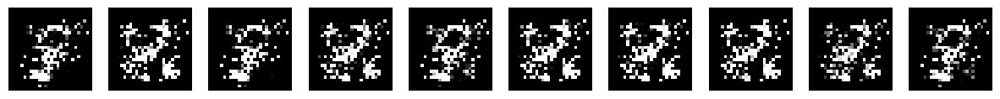

Epoch 58; Discriminator: 1.105, Generator: 0.984


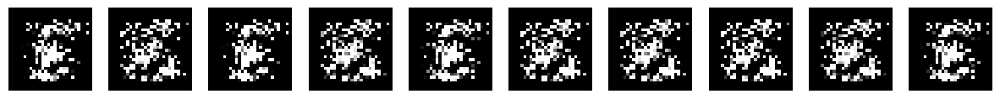

Epoch 59; Discriminator: 1.132, Generator: 1.194


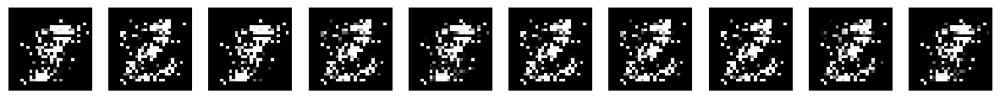

Epoch 60; Discriminator: 1.038, Generator: 1.149


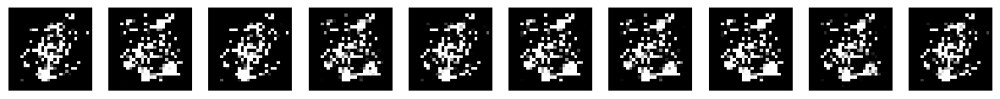

Epoch 61; Discriminator: 1.012, Generator: 1.069


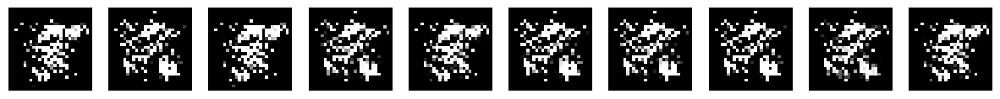

Epoch 62; Discriminator: 1.195, Generator: 1.381


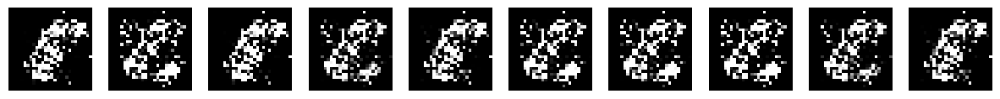

Epoch 63; Discriminator: 1.126, Generator: 1.060


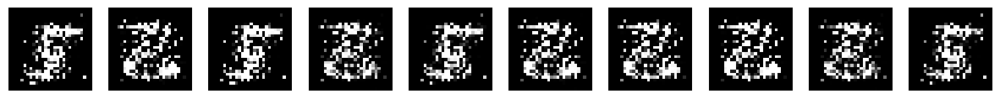

Epoch 64; Discriminator: 1.313, Generator: 0.911


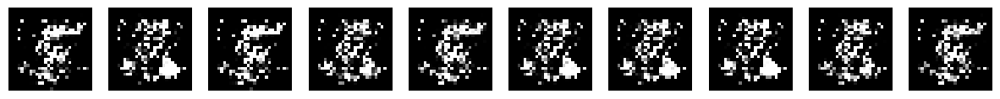

Epoch 65; Discriminator: 1.311, Generator: 0.818


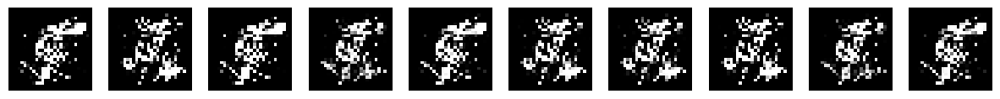

Epoch 66; Discriminator: 1.340, Generator: 0.792


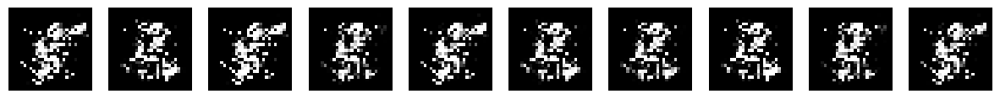

Epoch 67; Discriminator: 1.223, Generator: 0.781


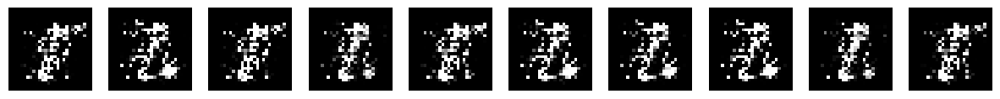

Epoch 68; Discriminator: 1.292, Generator: 0.880


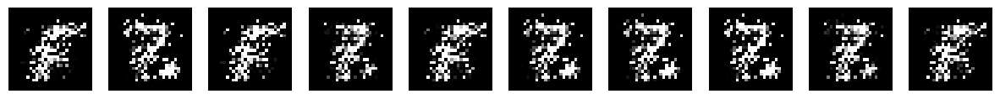

Epoch 69; Discriminator: 1.303, Generator: 0.810


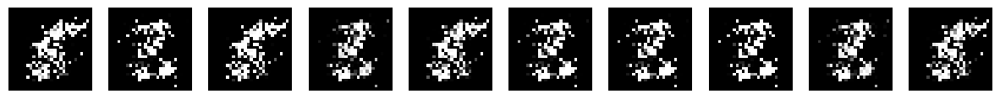

Epoch 70; Discriminator: 1.370, Generator: 0.791


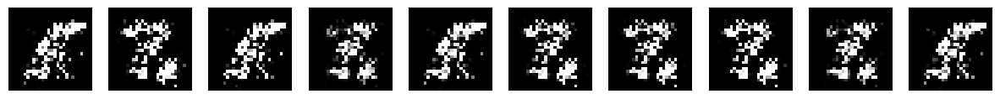

Epoch 71; Discriminator: 1.352, Generator: 0.735


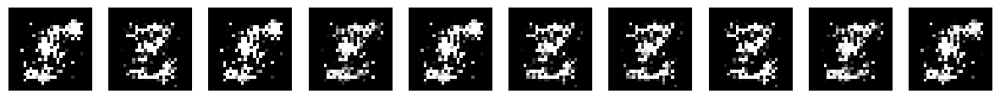

Epoch 72; Discriminator: 1.391, Generator: 0.740


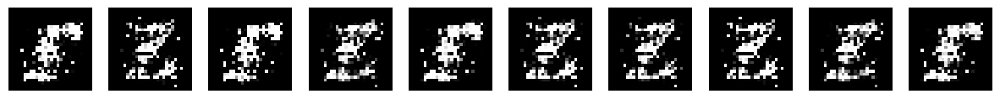

Epoch 73; Discriminator: 1.393, Generator: 0.723


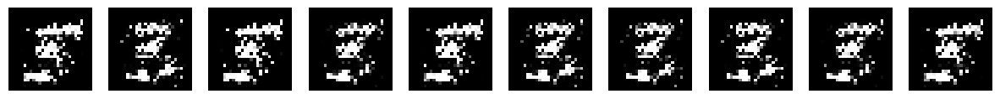

Epoch 74; Discriminator: 1.395, Generator: 0.743


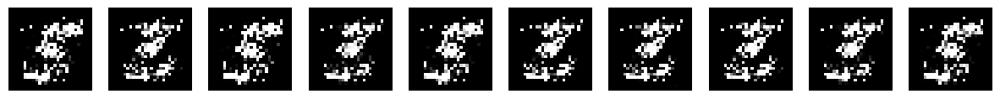

Epoch 75; Discriminator: 1.365, Generator: 0.706


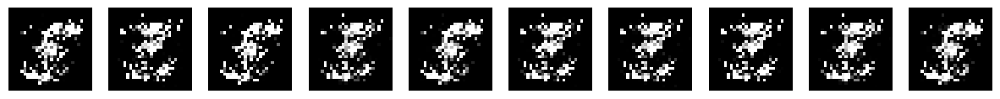

Epoch 76; Discriminator: 1.354, Generator: 0.705


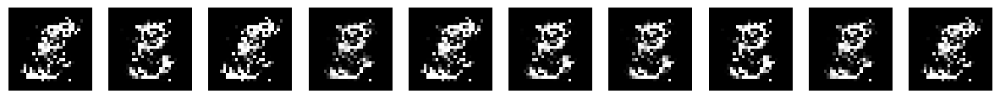

Epoch 77; Discriminator: 1.310, Generator: 0.931


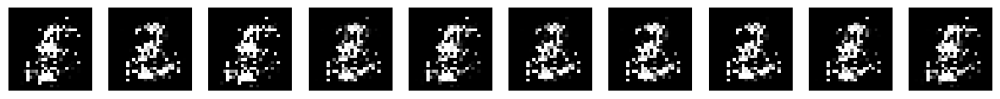

Epoch 78; Discriminator: 1.275, Generator: 0.863


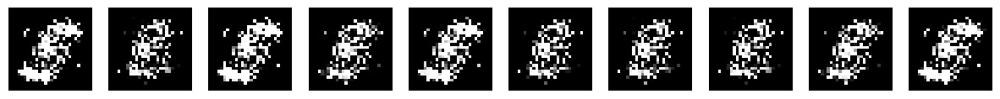

Epoch 79; Discriminator: 1.359, Generator: 0.869


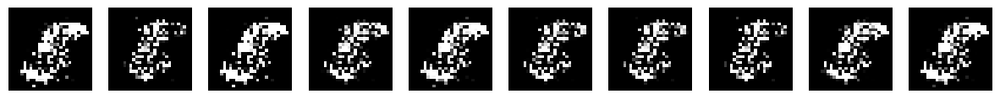

Epoch 80; Discriminator: 1.322, Generator: 0.761


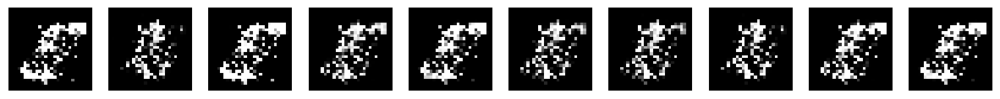

Epoch 81; Discriminator: 1.324, Generator: 0.749


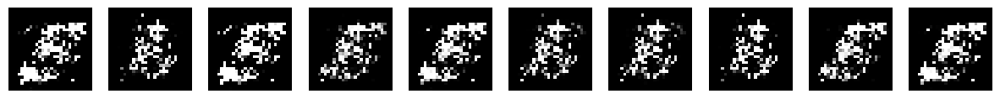

Epoch 82; Discriminator: 1.262, Generator: 0.826


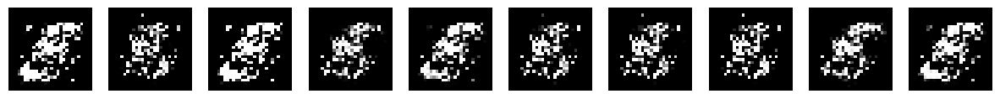

Epoch 83; Discriminator: 1.336, Generator: 0.761


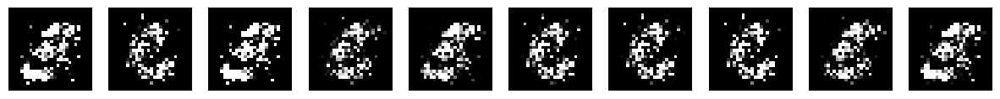

Epoch 84; Discriminator: 1.335, Generator: 0.720


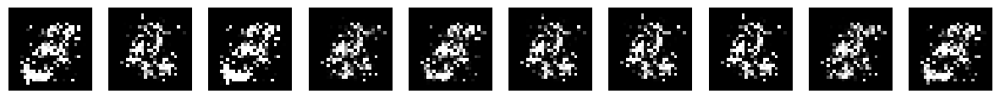

Epoch 85; Discriminator: 1.281, Generator: 0.781


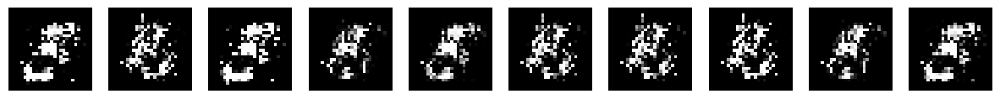

Epoch 86; Discriminator: 1.338, Generator: 0.751


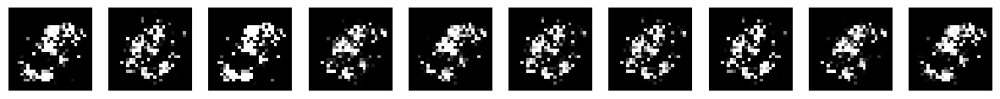

Epoch 87; Discriminator: 1.311, Generator: 0.745


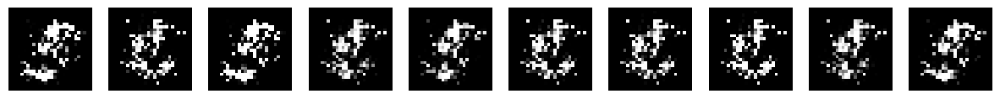

Epoch 88; Discriminator: 1.354, Generator: 0.735


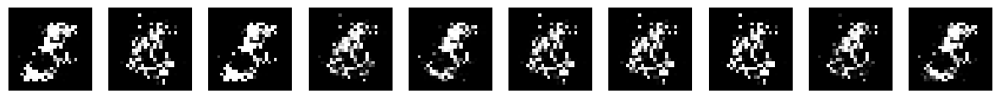

Epoch 89; Discriminator: 1.318, Generator: 0.753


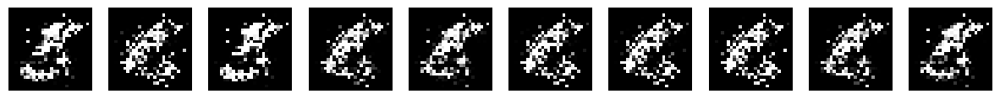

Epoch 90; Discriminator: 1.339, Generator: 0.766


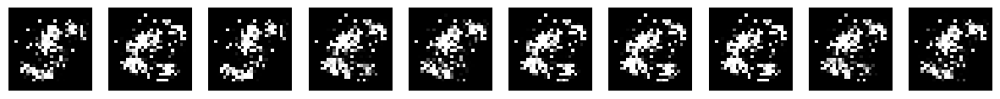

Epoch 91; Discriminator: 1.312, Generator: 0.739


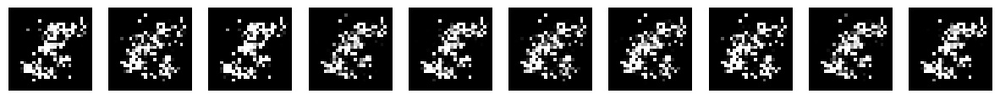

Epoch 92; Discriminator: 1.300, Generator: 0.782


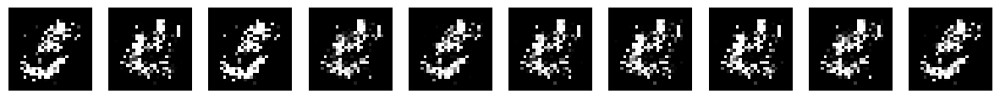

Epoch 93; Discriminator: 1.317, Generator: 0.796


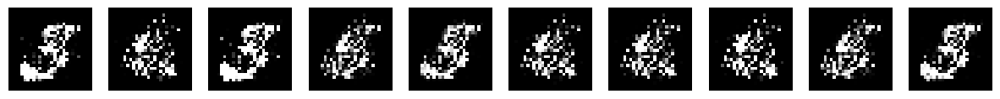

Epoch 94; Discriminator: 1.334, Generator: 0.717


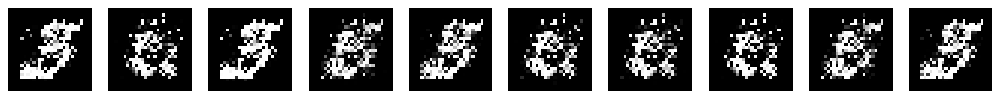

Epoch 95; Discriminator: 1.350, Generator: 0.763


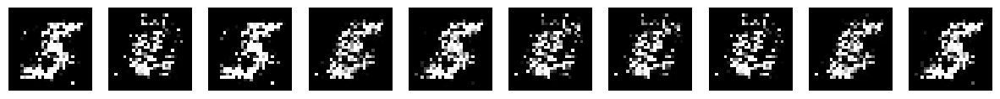

Epoch 96; Discriminator: 1.342, Generator: 0.786


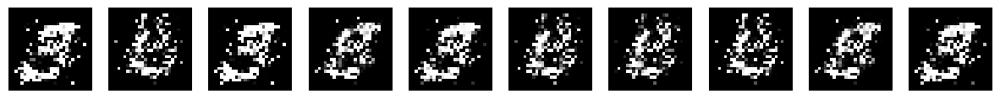

Epoch 97; Discriminator: 1.337, Generator: 0.750


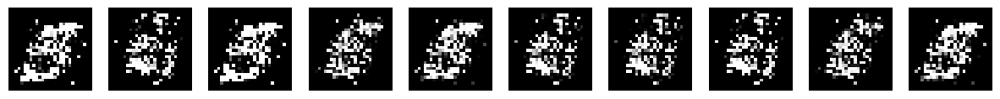

Epoch 98; Discriminator: 1.329, Generator: 0.722


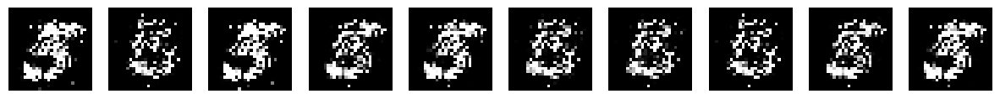

Epoch 99; Discriminator: 1.374, Generator: 0.778


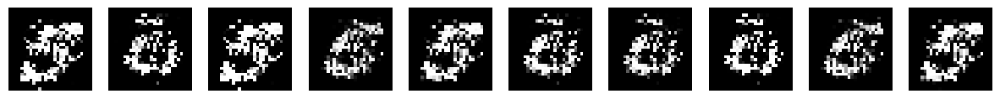

In [ ]:
# Chiffre 5

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=5)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 0.731, Generator: 2.968


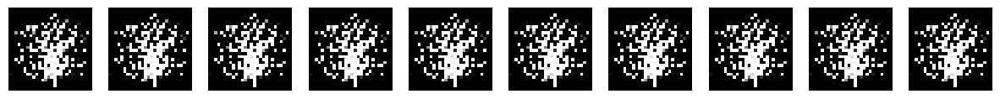

Epoch 1; Discriminator: 0.456, Generator: 2.666


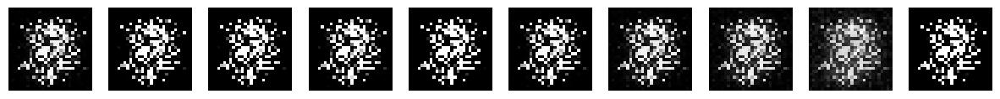

Epoch 2; Discriminator: 0.938, Generator: 1.247


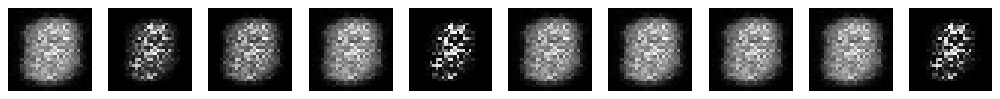

Epoch 3; Discriminator: 0.936, Generator: 0.930


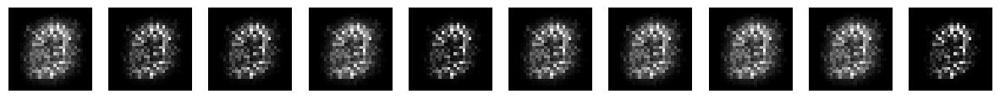

Epoch 4; Discriminator: 0.855, Generator: 1.614


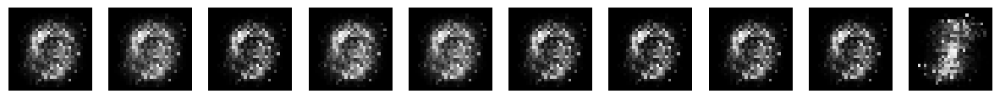

Epoch 5; Discriminator: 0.617, Generator: 1.956


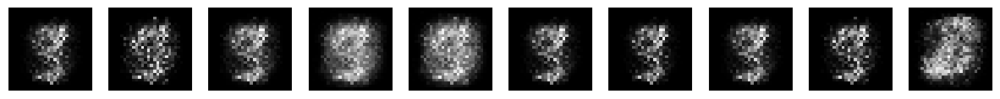

Epoch 6; Discriminator: 0.645, Generator: 1.391


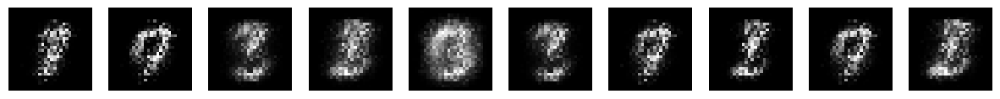

Epoch 7; Discriminator: 0.869, Generator: 1.727


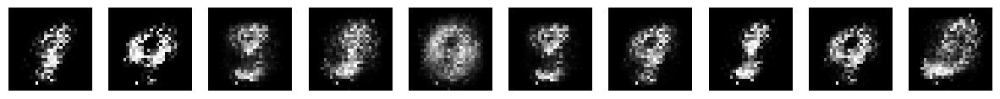

Epoch 8; Discriminator: 0.805, Generator: 1.450


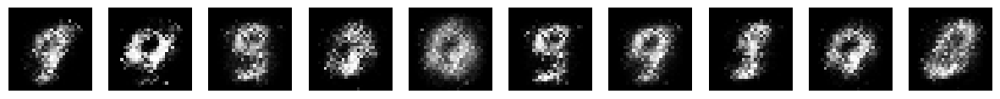

Epoch 9; Discriminator: 0.736, Generator: 1.358


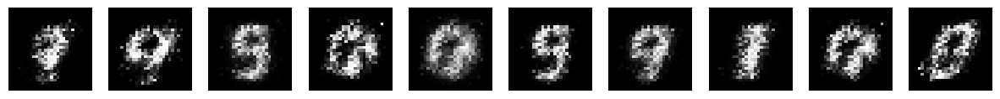

Epoch 10; Discriminator: 0.903, Generator: 1.545


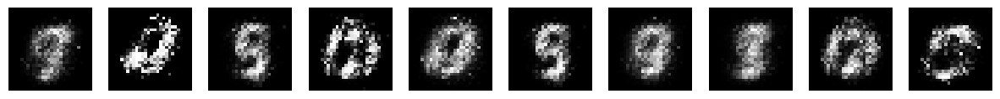

Epoch 11; Discriminator: 0.920, Generator: 1.091


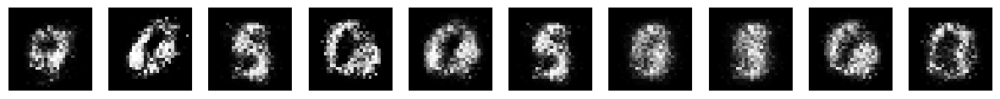

Epoch 12; Discriminator: 1.001, Generator: 1.344


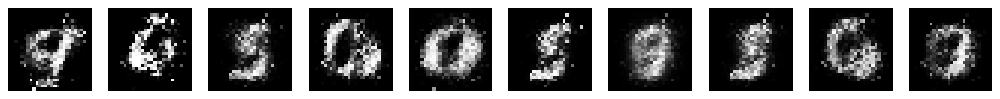

Epoch 13; Discriminator: 0.937, Generator: 1.205


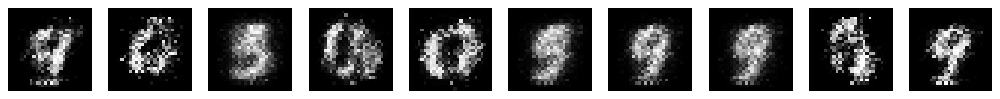

Epoch 14; Discriminator: 1.118, Generator: 1.050


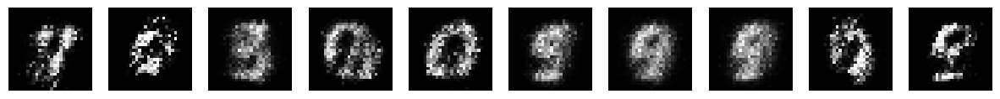

Epoch 15; Discriminator: 1.227, Generator: 0.933


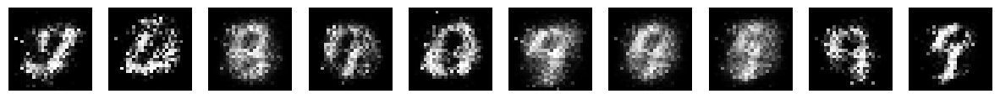

Epoch 16; Discriminator: 1.161, Generator: 0.868


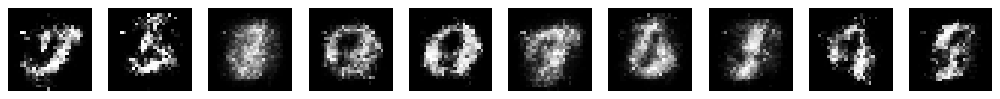

Epoch 17; Discriminator: 1.242, Generator: 0.908


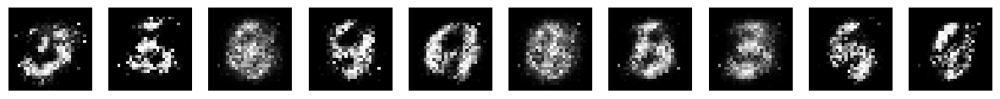

Epoch 18; Discriminator: 1.299, Generator: 0.900


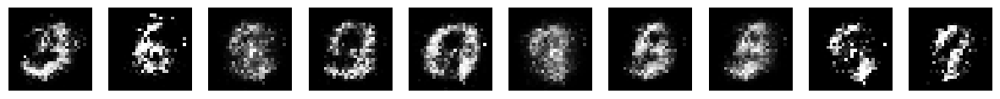

Epoch 19; Discriminator: 1.248, Generator: 0.826


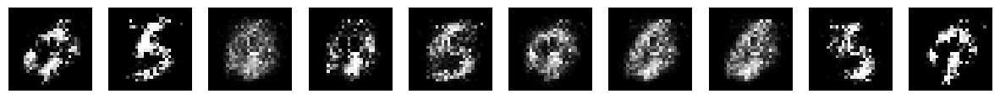

Epoch 20; Discriminator: 1.285, Generator: 0.811


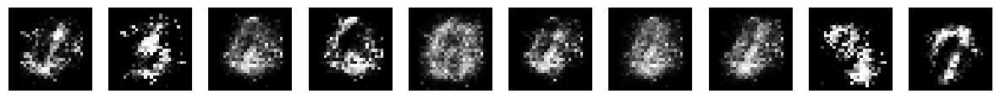

Epoch 21; Discriminator: 1.378, Generator: 0.753


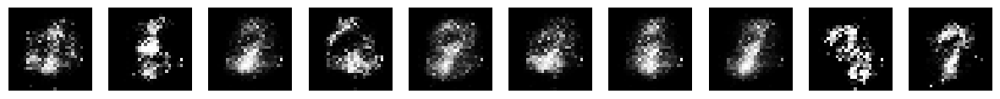

Epoch 22; Discriminator: 1.312, Generator: 0.825


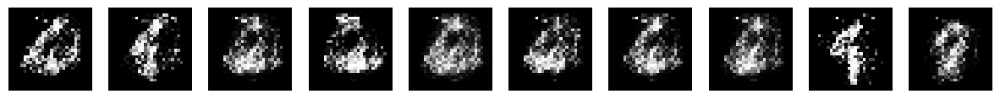

Epoch 23; Discriminator: 1.312, Generator: 0.738


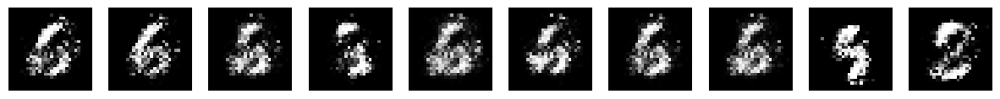

Epoch 24; Discriminator: 1.303, Generator: 0.727


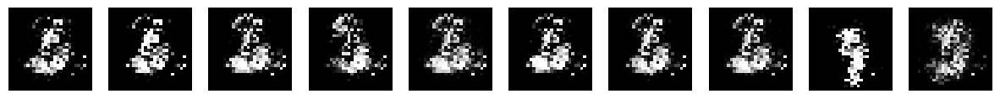

Epoch 25; Discriminator: 1.397, Generator: 0.747


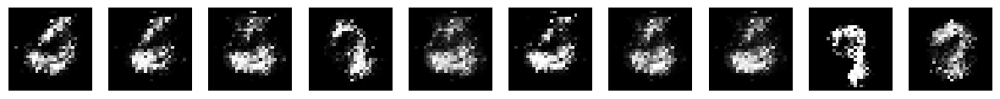

Epoch 26; Discriminator: 1.340, Generator: 0.734


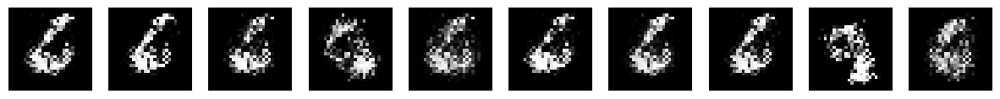

Epoch 27; Discriminator: 1.347, Generator: 0.749


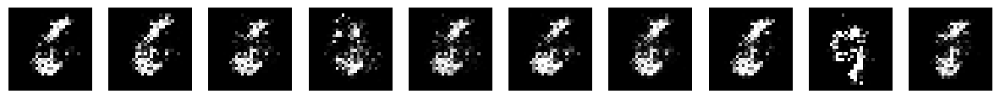

Epoch 28; Discriminator: 1.394, Generator: 0.826


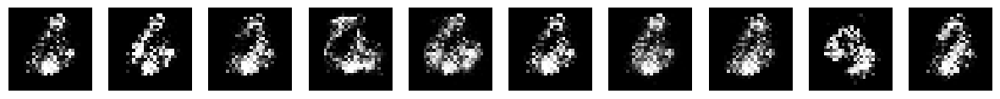

Epoch 29; Discriminator: 1.423, Generator: 0.660


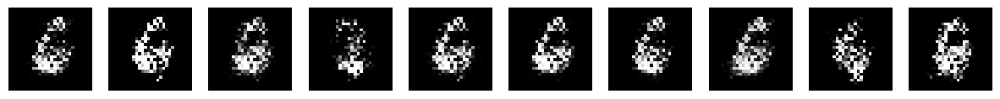

Epoch 30; Discriminator: 1.347, Generator: 0.733


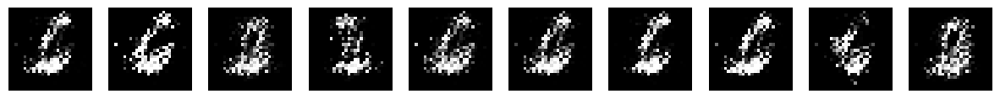

Epoch 31; Discriminator: 1.321, Generator: 0.707


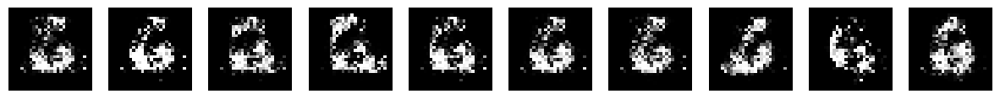

Epoch 32; Discriminator: 1.379, Generator: 0.680


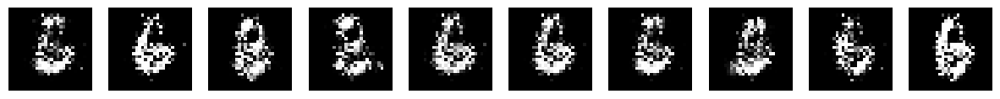

Epoch 33; Discriminator: 1.368, Generator: 0.756


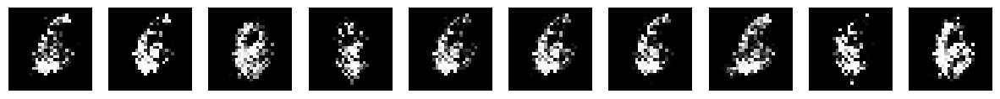

Epoch 34; Discriminator: 1.286, Generator: 0.956


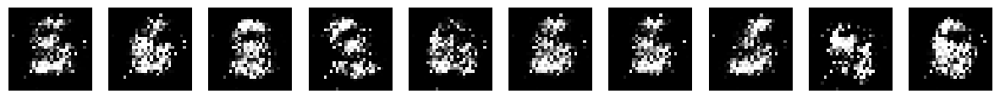

Epoch 35; Discriminator: 1.387, Generator: 0.700


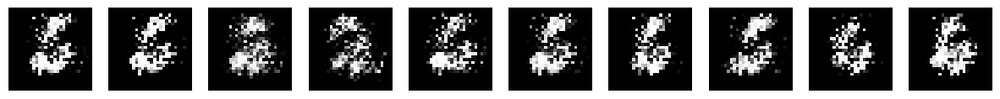

Epoch 36; Discriminator: 1.321, Generator: 0.782


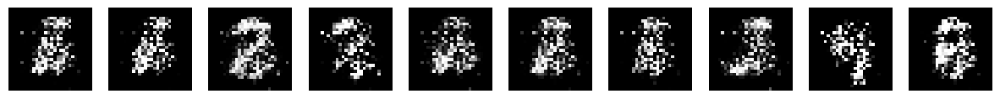

Epoch 37; Discriminator: 1.400, Generator: 0.758


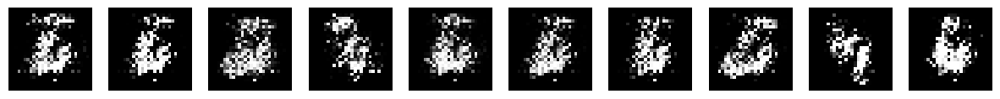

Epoch 38; Discriminator: 1.245, Generator: 0.718


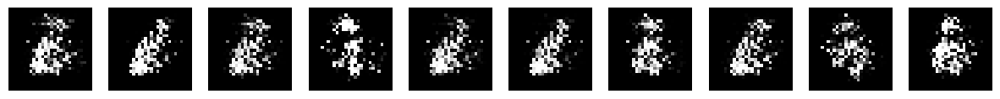

Epoch 39; Discriminator: 1.394, Generator: 0.798


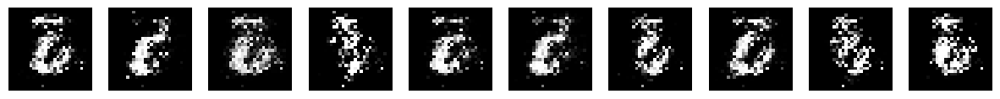

Epoch 40; Discriminator: 1.249, Generator: 0.877


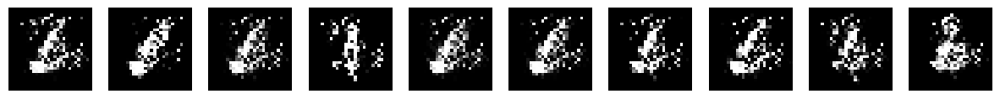

Epoch 41; Discriminator: 1.347, Generator: 0.767


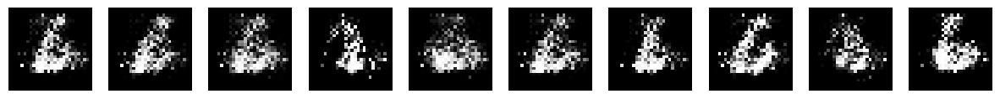

Epoch 42; Discriminator: 1.363, Generator: 0.789


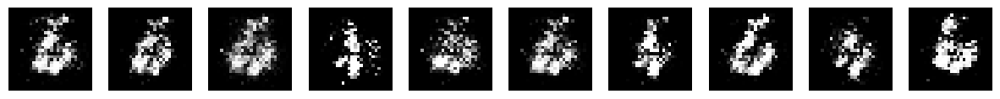

Epoch 43; Discriminator: 1.402, Generator: 0.748


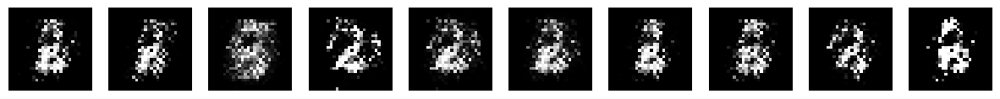

Epoch 44; Discriminator: 1.419, Generator: 0.733


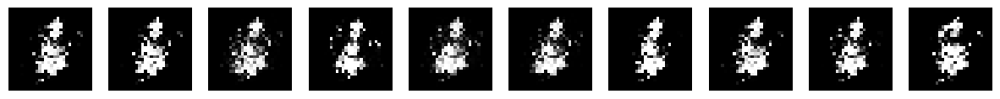

Epoch 45; Discriminator: 1.308, Generator: 0.641


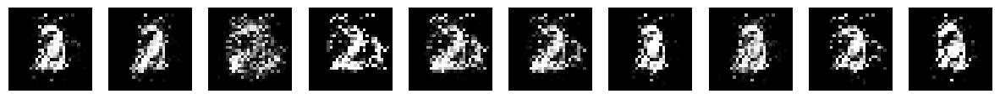

Epoch 46; Discriminator: 1.317, Generator: 0.743


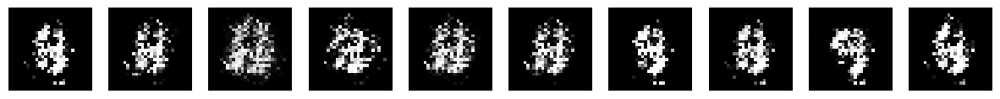

Epoch 47; Discriminator: 1.424, Generator: 0.723


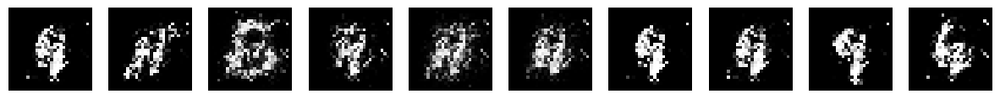

Epoch 48; Discriminator: 1.334, Generator: 0.727


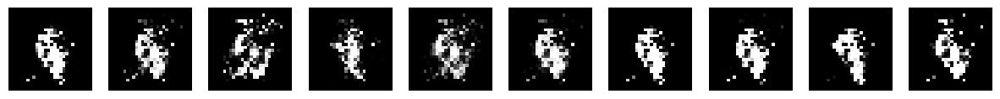

Epoch 49; Discriminator: 1.379, Generator: 0.763


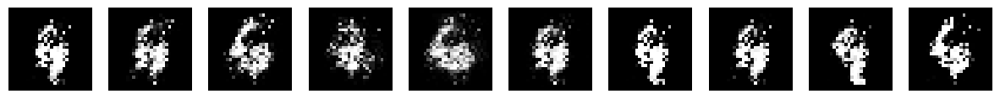

Epoch 50; Discriminator: 1.416, Generator: 0.798


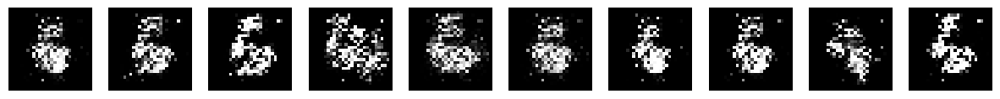

Epoch 51; Discriminator: 1.335, Generator: 0.836


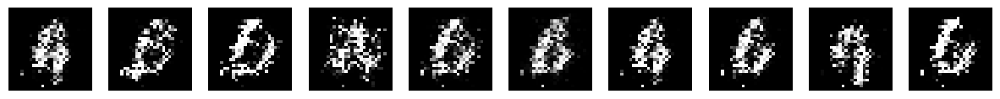

Epoch 52; Discriminator: 1.332, Generator: 0.862


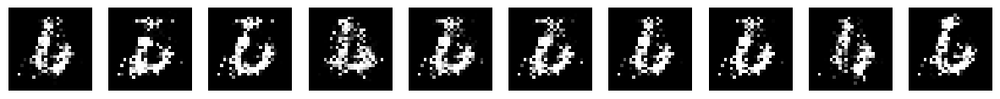

Epoch 53; Discriminator: 1.345, Generator: 0.704


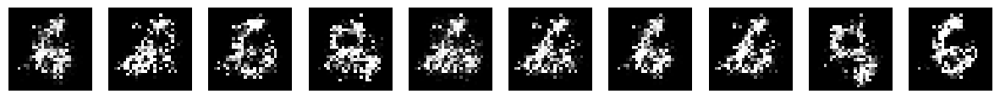

Epoch 54; Discriminator: 1.445, Generator: 0.691


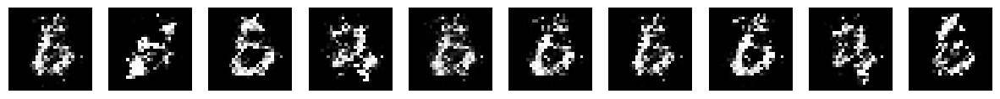

Epoch 55; Discriminator: 1.379, Generator: 0.751


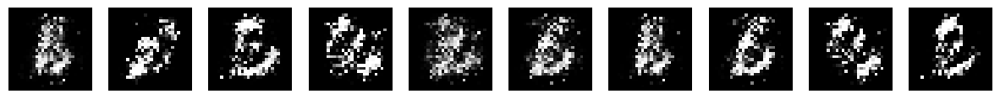

Epoch 56; Discriminator: 1.342, Generator: 0.650


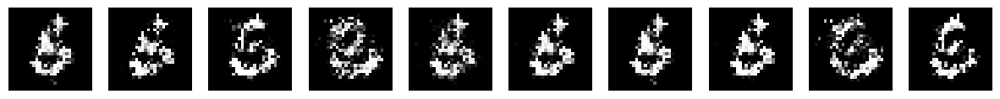

Epoch 57; Discriminator: 1.354, Generator: 0.793


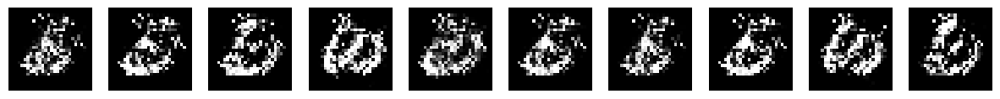

Epoch 58; Discriminator: 1.375, Generator: 0.731


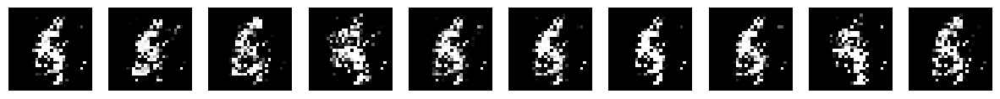

Epoch 59; Discriminator: 1.318, Generator: 0.774


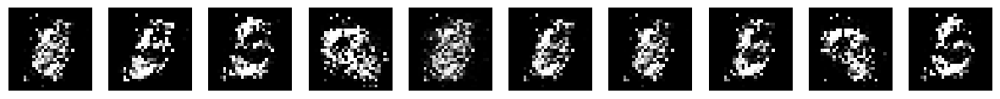

Epoch 60; Discriminator: 1.364, Generator: 0.770


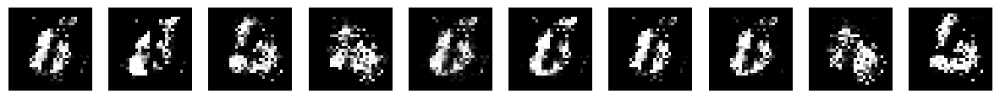

Epoch 61; Discriminator: 1.406, Generator: 0.772


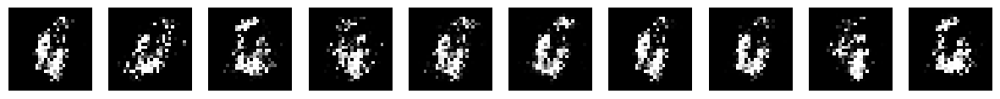

Epoch 62; Discriminator: 1.339, Generator: 0.762


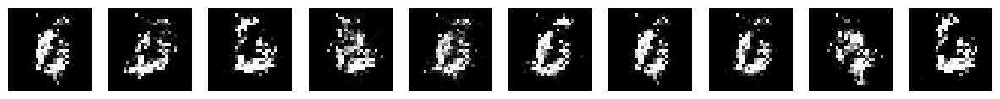

Epoch 63; Discriminator: 1.403, Generator: 0.679


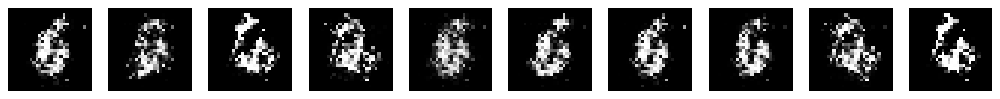

Epoch 64; Discriminator: 1.441, Generator: 0.713


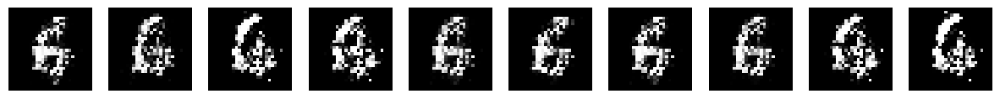

Epoch 65; Discriminator: 1.377, Generator: 0.706


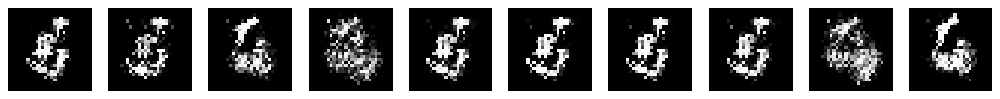

Epoch 66; Discriminator: 1.369, Generator: 0.660


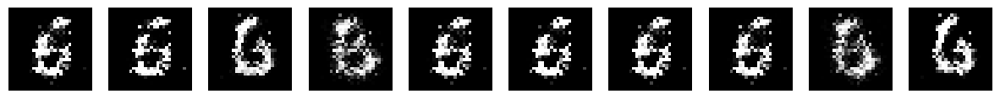

Epoch 67; Discriminator: 1.345, Generator: 0.747


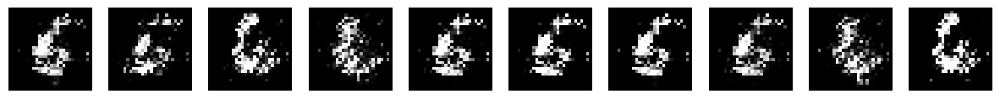

Epoch 68; Discriminator: 1.370, Generator: 0.686


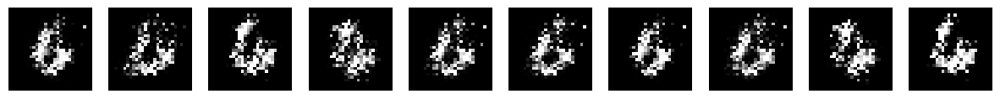

Epoch 69; Discriminator: 1.358, Generator: 0.702


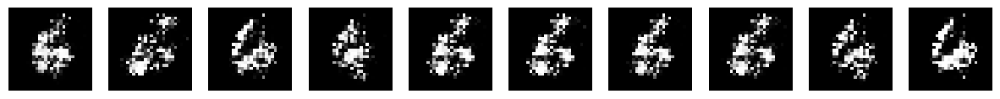

Epoch 70; Discriminator: 1.370, Generator: 0.673


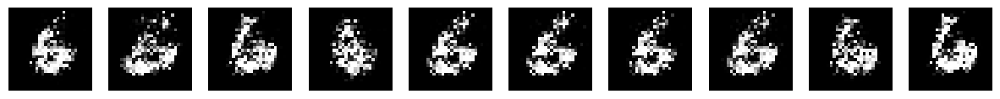

Epoch 71; Discriminator: 1.395, Generator: 0.730


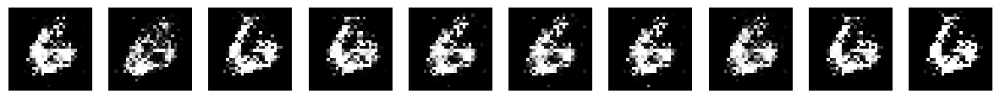

Epoch 72; Discriminator: 1.398, Generator: 0.764


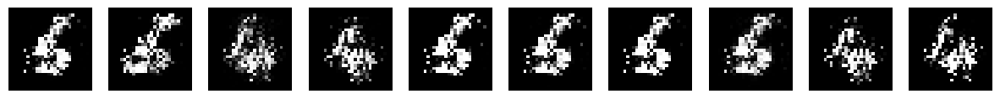

Epoch 73; Discriminator: 1.382, Generator: 0.702


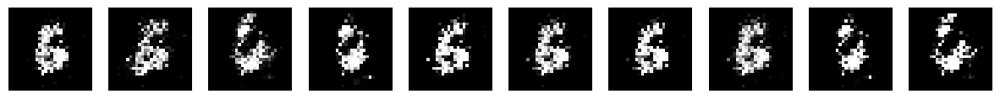

Epoch 74; Discriminator: 1.366, Generator: 0.661


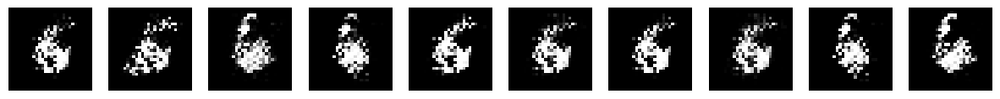

Epoch 75; Discriminator: 1.365, Generator: 0.742


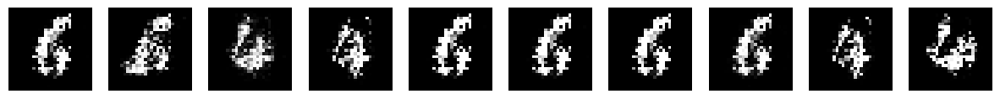

Epoch 76; Discriminator: 1.327, Generator: 0.804


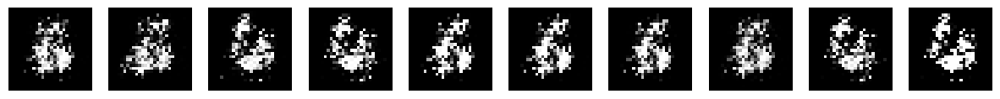

Epoch 77; Discriminator: 1.410, Generator: 0.693


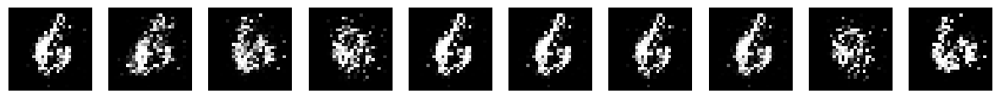

Epoch 78; Discriminator: 1.370, Generator: 0.698


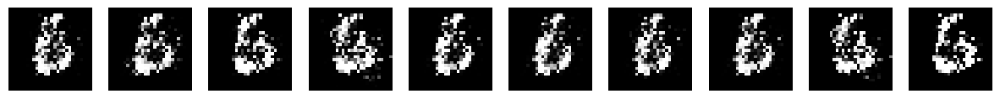

Epoch 79; Discriminator: 1.368, Generator: 0.706


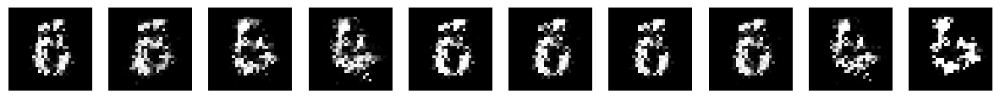

Epoch 80; Discriminator: 1.371, Generator: 0.724


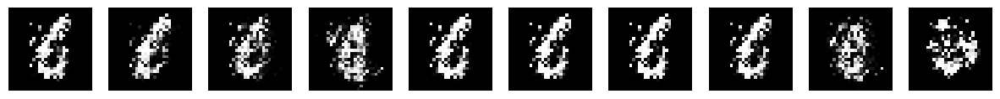

Epoch 81; Discriminator: 1.406, Generator: 0.768


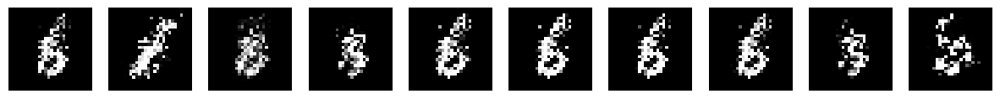

Epoch 82; Discriminator: 1.353, Generator: 0.694


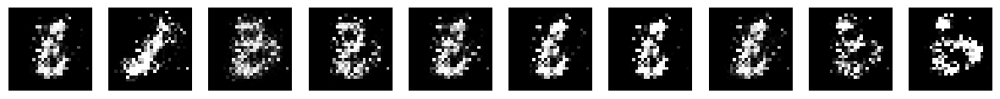

Epoch 83; Discriminator: 1.375, Generator: 0.731


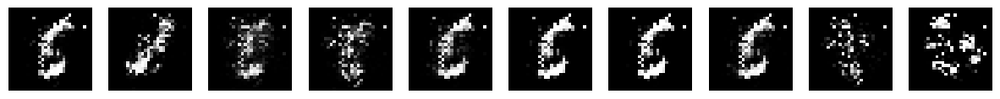

Epoch 84; Discriminator: 1.361, Generator: 0.715


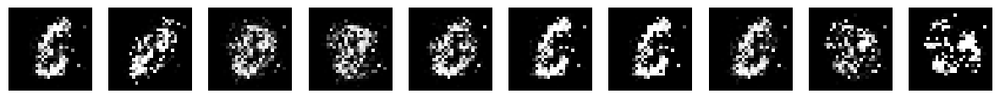

Epoch 85; Discriminator: 1.385, Generator: 0.699


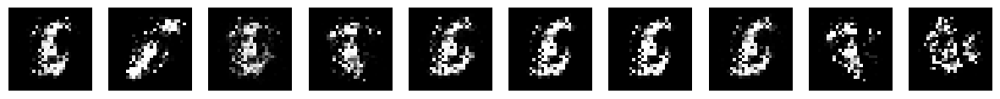

Epoch 86; Discriminator: 1.344, Generator: 0.690


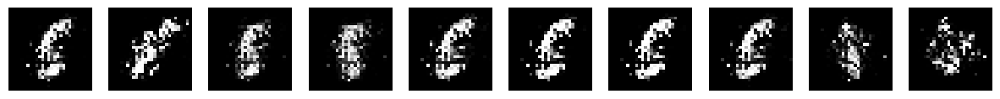

Epoch 87; Discriminator: 1.312, Generator: 0.684


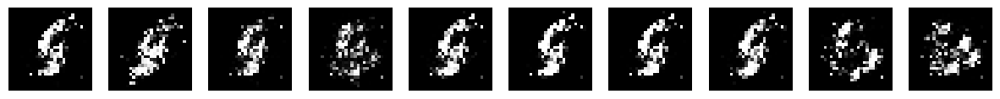

Epoch 88; Discriminator: 1.382, Generator: 0.727


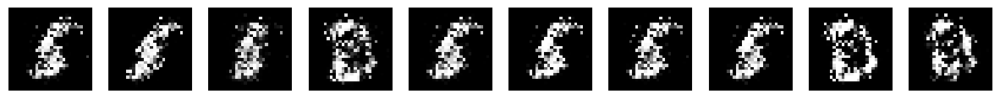

Epoch 89; Discriminator: 1.415, Generator: 0.739


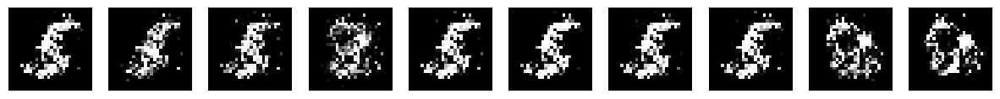

Epoch 90; Discriminator: 1.403, Generator: 0.681


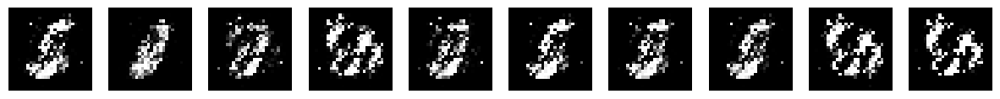

Epoch 91; Discriminator: 1.338, Generator: 0.740


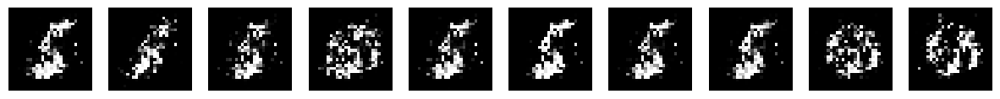

Epoch 92; Discriminator: 1.361, Generator: 0.716


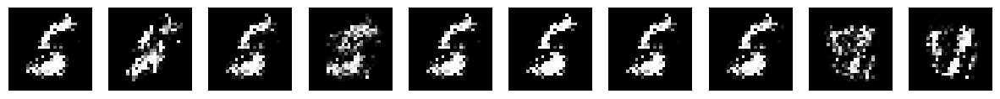

Epoch 93; Discriminator: 1.386, Generator: 0.671


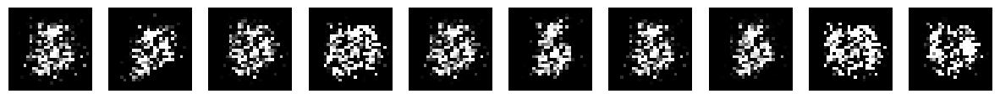

Epoch 94; Discriminator: 1.392, Generator: 0.725


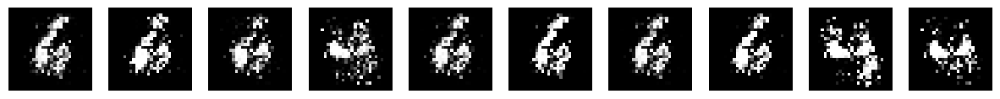

Epoch 95; Discriminator: 1.363, Generator: 0.699


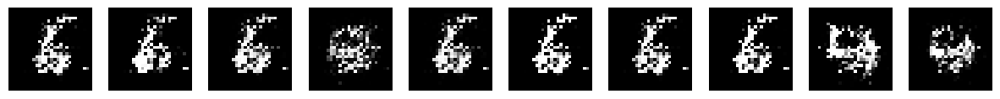

Epoch 96; Discriminator: 1.353, Generator: 0.730


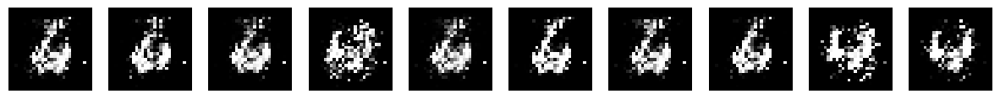

Epoch 97; Discriminator: 1.399, Generator: 0.723


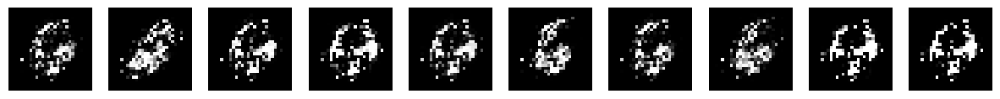

Epoch 98; Discriminator: 1.359, Generator: 0.748


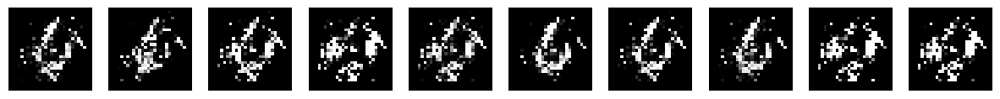

Epoch 99; Discriminator: 1.400, Generator: 0.717


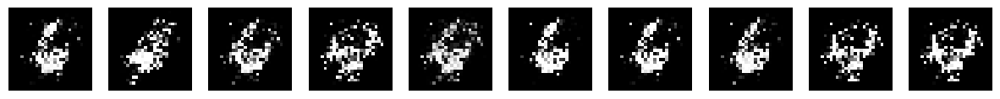

In [8]:
# Chiffre 6

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=6)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 0.809, Generator: 1.951


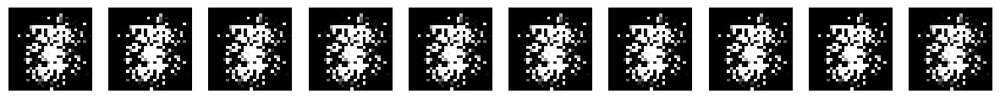

Epoch 1; Discriminator: 0.776, Generator: 1.893


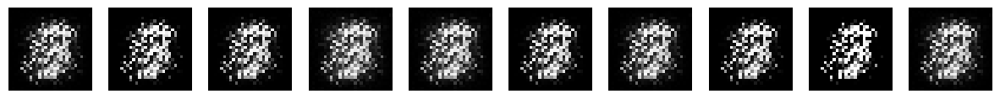

Epoch 2; Discriminator: 0.968, Generator: 1.012


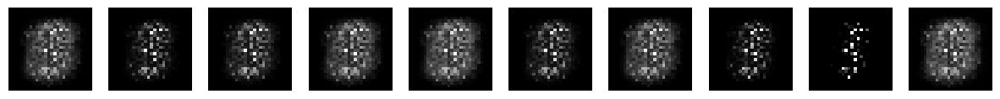

Epoch 3; Discriminator: 0.510, Generator: 1.907


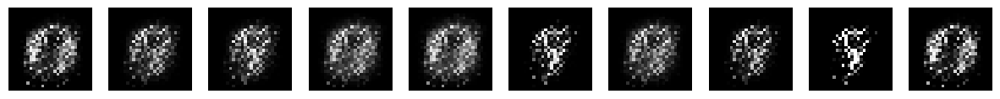

Epoch 4; Discriminator: 0.549, Generator: 1.709


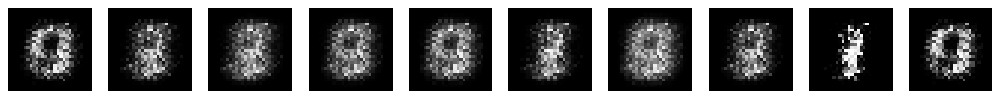

Epoch 5; Discriminator: 0.613, Generator: 2.167


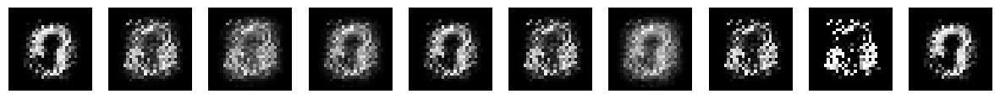

Epoch 6; Discriminator: 0.715, Generator: 1.507


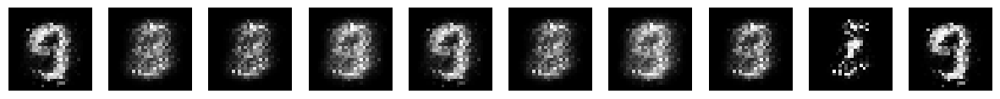

Epoch 7; Discriminator: 0.755, Generator: 1.520


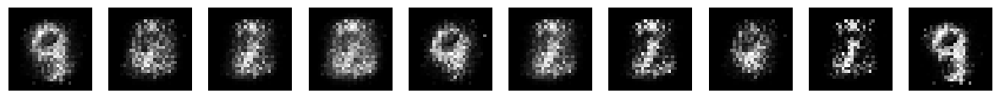

Epoch 8; Discriminator: 1.269, Generator: 1.320


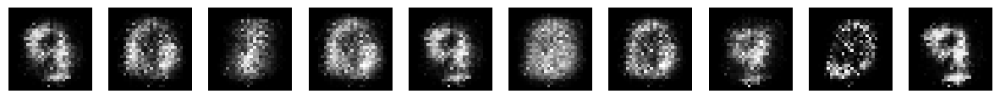

Epoch 9; Discriminator: 0.983, Generator: 1.411


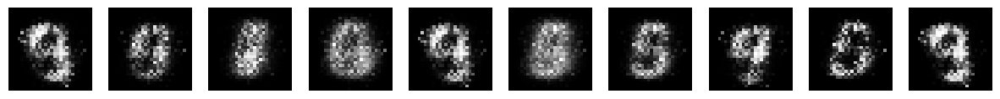

Epoch 10; Discriminator: 0.992, Generator: 1.097


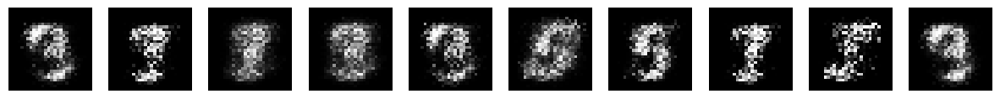

Epoch 11; Discriminator: 1.079, Generator: 1.611


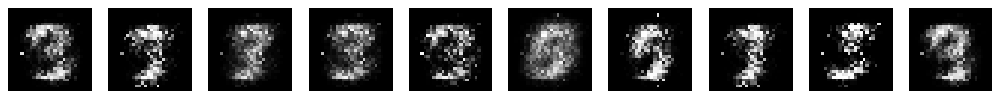

Epoch 12; Discriminator: 1.090, Generator: 1.228


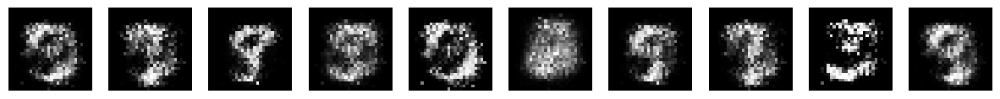

Epoch 13; Discriminator: 0.946, Generator: 1.155


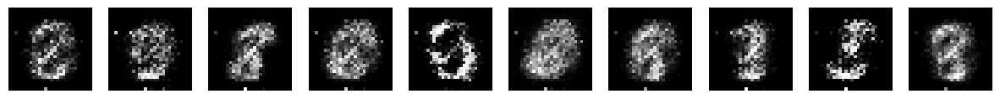

Epoch 14; Discriminator: 1.133, Generator: 1.138


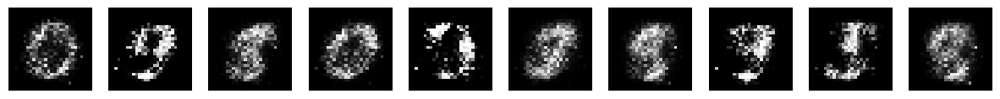

Epoch 15; Discriminator: 1.033, Generator: 1.082


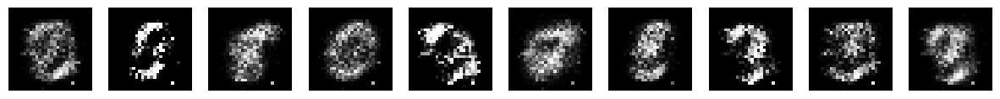

Epoch 16; Discriminator: 1.031, Generator: 1.044


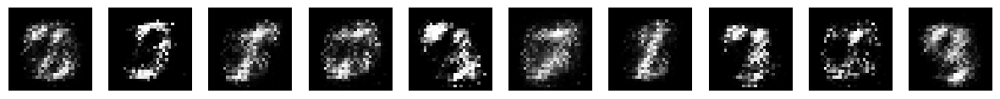

Epoch 17; Discriminator: 1.146, Generator: 1.039


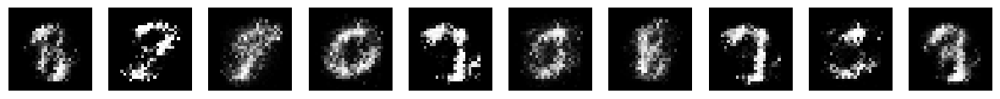

Epoch 18; Discriminator: 1.260, Generator: 0.939


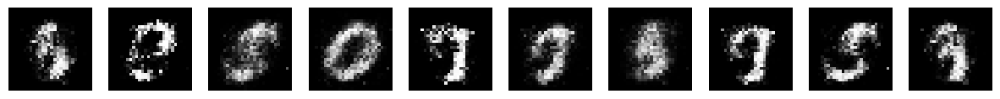

Epoch 19; Discriminator: 1.290, Generator: 0.818


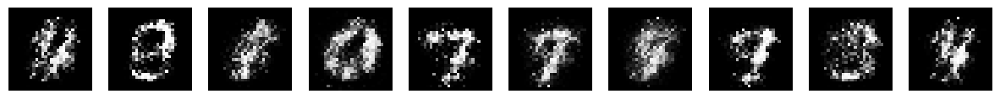

Epoch 20; Discriminator: 1.337, Generator: 0.735


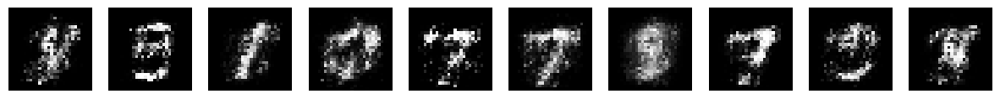

Epoch 21; Discriminator: 1.424, Generator: 0.746


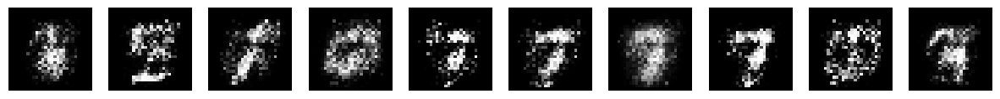

Epoch 22; Discriminator: 1.388, Generator: 0.715


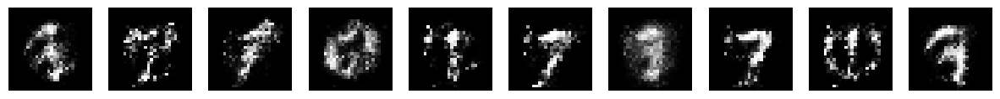

Epoch 23; Discriminator: 1.340, Generator: 0.741


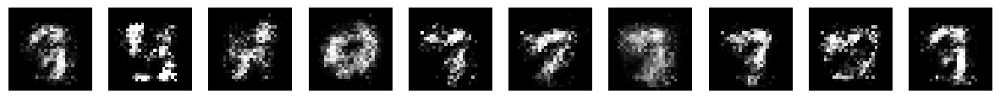

Epoch 24; Discriminator: 1.354, Generator: 0.680


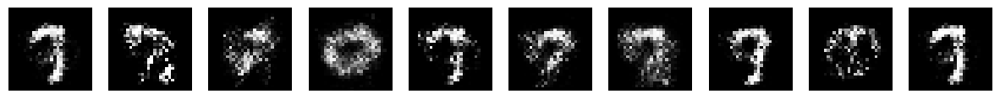

Epoch 25; Discriminator: 1.387, Generator: 0.697


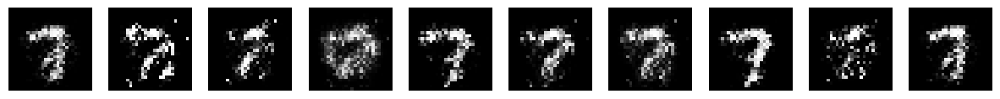

Epoch 26; Discriminator: 1.388, Generator: 0.747


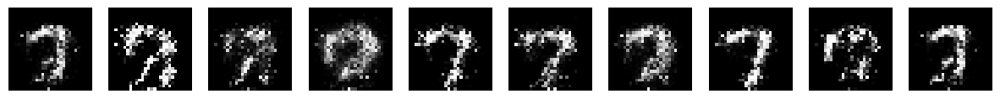

Epoch 27; Discriminator: 1.350, Generator: 0.722


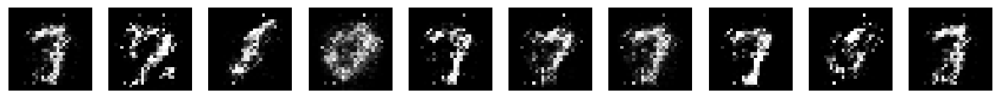

Epoch 28; Discriminator: 1.386, Generator: 0.862


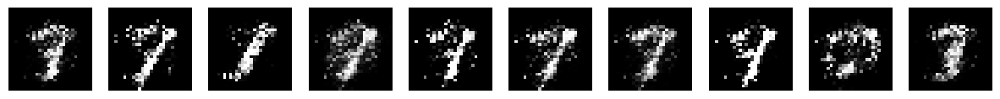

Epoch 29; Discriminator: 1.276, Generator: 0.878


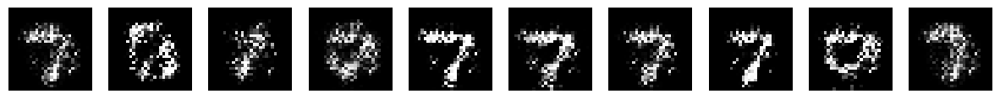

Epoch 30; Discriminator: 1.375, Generator: 0.770


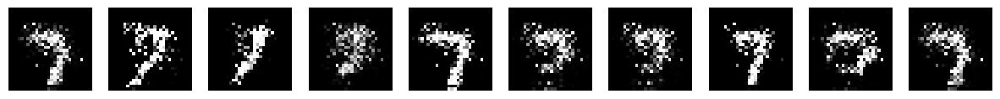

Epoch 31; Discriminator: 1.312, Generator: 0.738


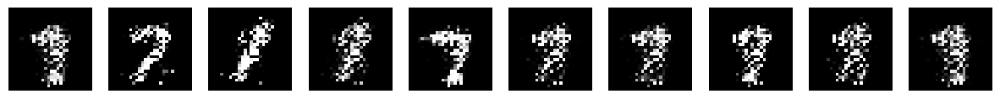

Epoch 32; Discriminator: 1.351, Generator: 0.797


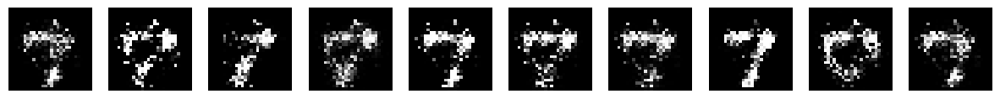

Epoch 33; Discriminator: 1.353, Generator: 0.719


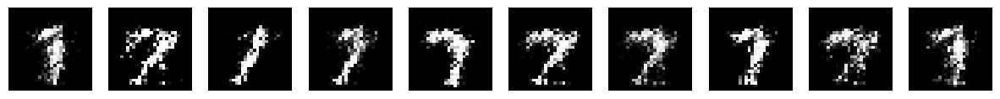

Epoch 34; Discriminator: 1.333, Generator: 0.703


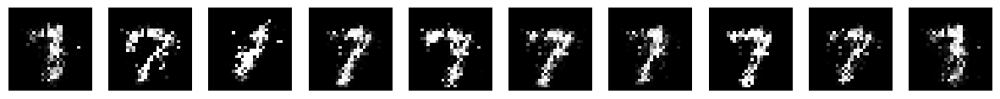

Epoch 35; Discriminator: 1.398, Generator: 0.752


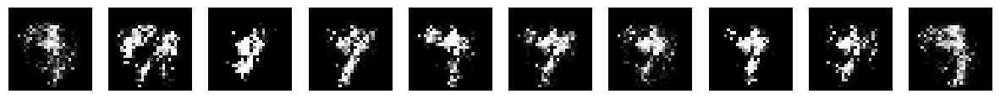

Epoch 36; Discriminator: 1.315, Generator: 0.663


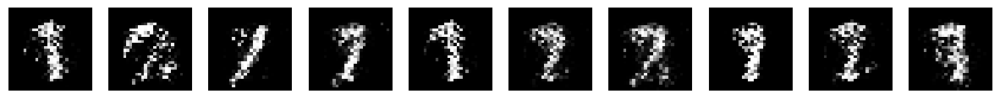

Epoch 37; Discriminator: 1.343, Generator: 0.716


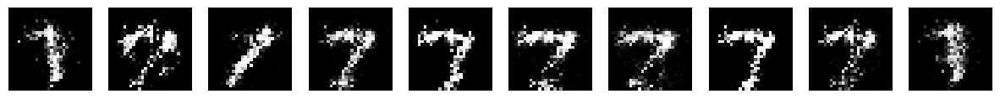

Epoch 38; Discriminator: 1.357, Generator: 0.731


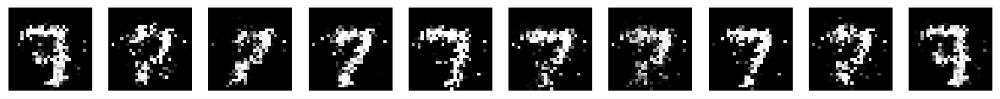

Epoch 39; Discriminator: 1.357, Generator: 0.758


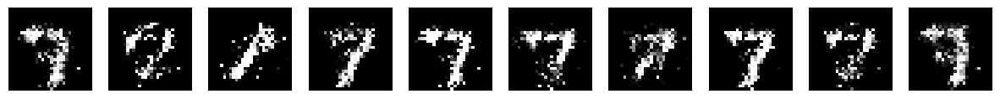

Epoch 40; Discriminator: 1.365, Generator: 0.764


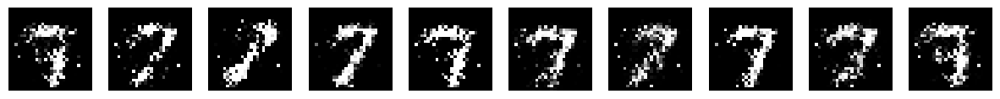

Epoch 41; Discriminator: 1.377, Generator: 0.699


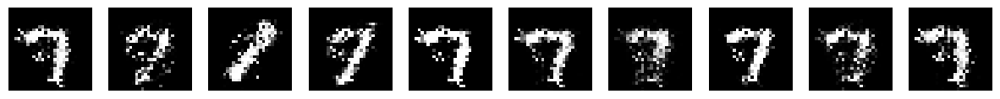

Epoch 42; Discriminator: 1.361, Generator: 0.728


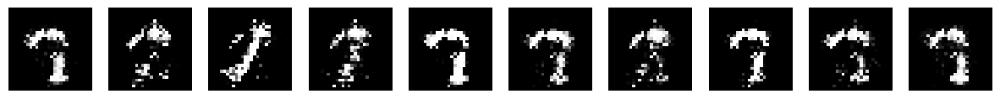

Epoch 43; Discriminator: 1.346, Generator: 0.772


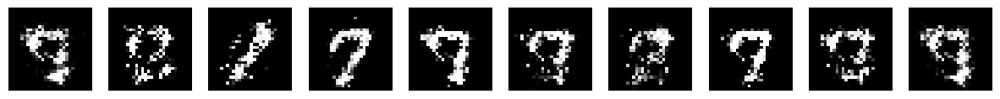

Epoch 44; Discriminator: 1.343, Generator: 0.743


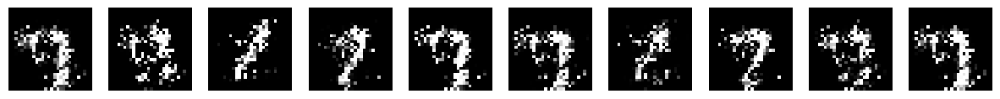

Epoch 45; Discriminator: 1.355, Generator: 0.691


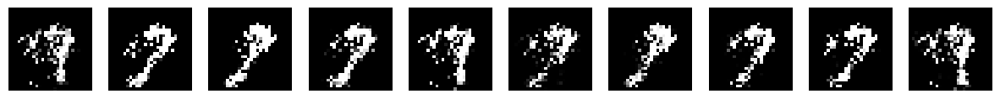

Epoch 46; Discriminator: 1.299, Generator: 0.764


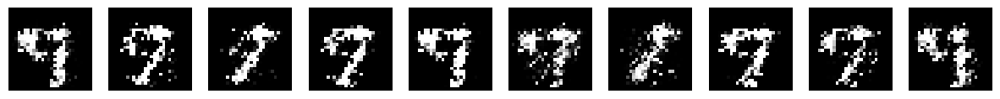

Epoch 47; Discriminator: 1.315, Generator: 0.897


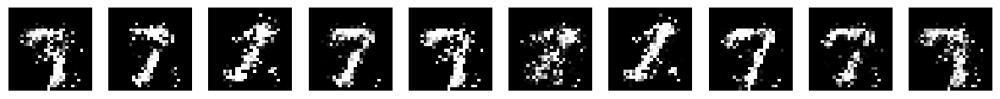

Epoch 48; Discriminator: 1.303, Generator: 0.813


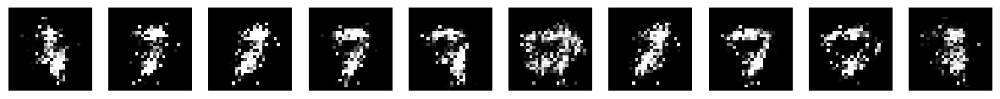

Epoch 49; Discriminator: 1.386, Generator: 0.778


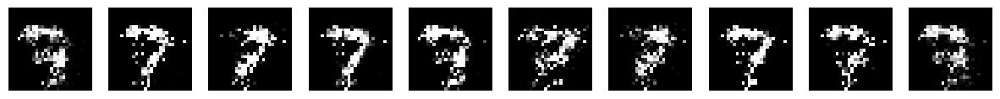

Epoch 50; Discriminator: 1.357, Generator: 0.702


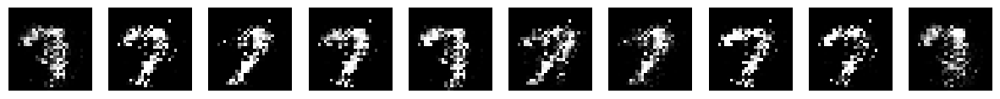

Epoch 51; Discriminator: 1.366, Generator: 0.735


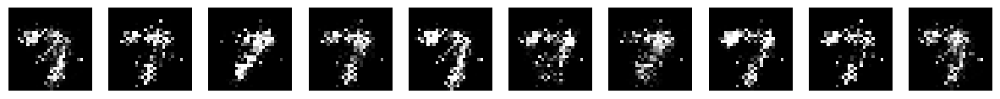

Epoch 52; Discriminator: 1.249, Generator: 0.739


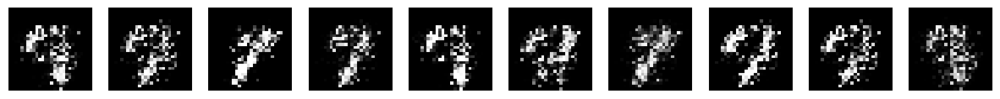

Epoch 53; Discriminator: 1.398, Generator: 0.720


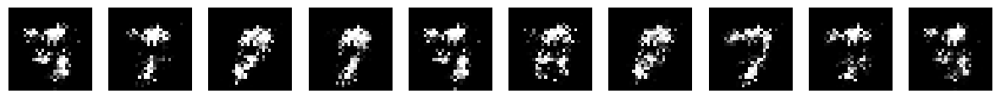

Epoch 54; Discriminator: 1.390, Generator: 0.693


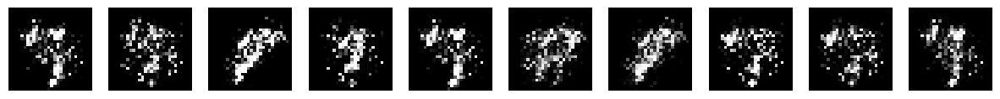

Epoch 55; Discriminator: 1.382, Generator: 0.747


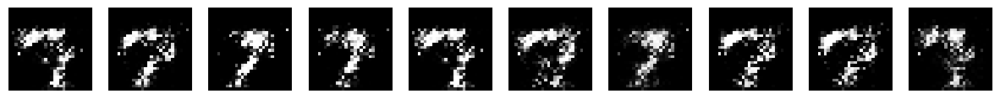

Epoch 56; Discriminator: 1.375, Generator: 0.667


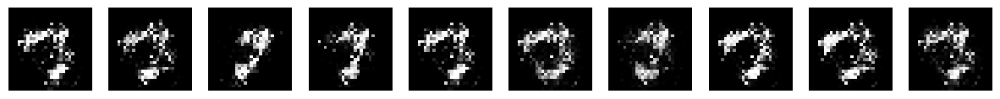

Epoch 57; Discriminator: 1.394, Generator: 0.709


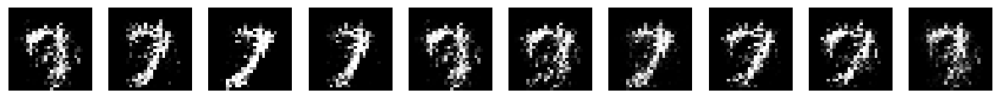

Epoch 58; Discriminator: 1.340, Generator: 0.753


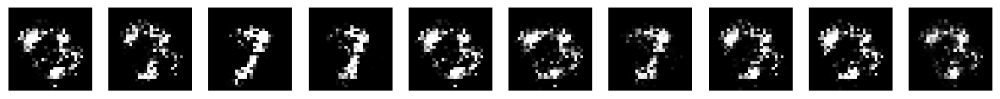

Epoch 59; Discriminator: 1.390, Generator: 0.707


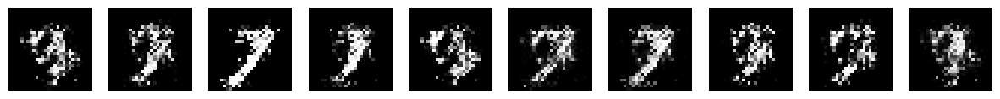

Epoch 60; Discriminator: 1.411, Generator: 0.636


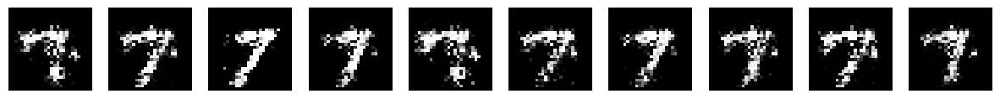

Epoch 61; Discriminator: 1.390, Generator: 0.710


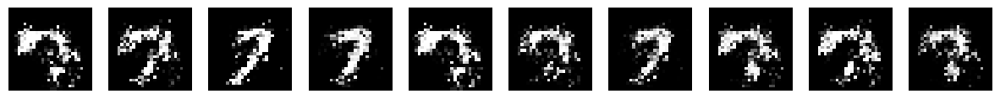

Epoch 62; Discriminator: 1.385, Generator: 0.641


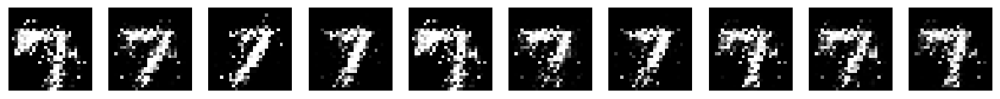

Epoch 63; Discriminator: 1.391, Generator: 0.709


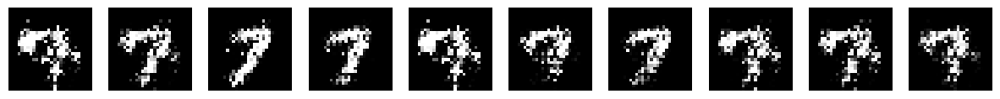

Epoch 64; Discriminator: 1.400, Generator: 0.655


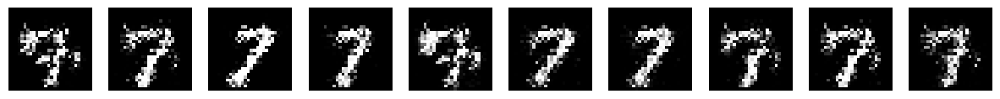

Epoch 65; Discriminator: 1.390, Generator: 0.726


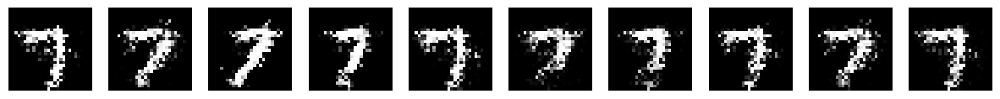

Epoch 66; Discriminator: 1.350, Generator: 0.698


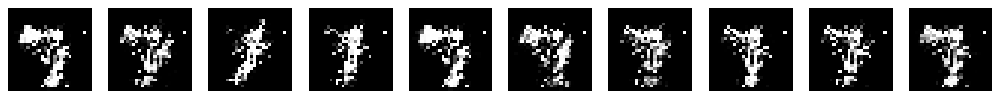

Epoch 67; Discriminator: 1.328, Generator: 0.714


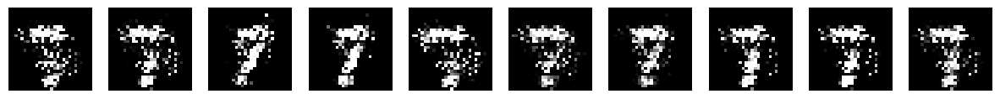

Epoch 68; Discriminator: 1.365, Generator: 0.857


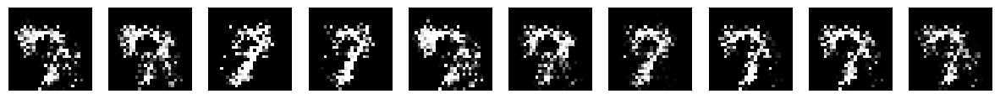

Epoch 69; Discriminator: 1.412, Generator: 0.744


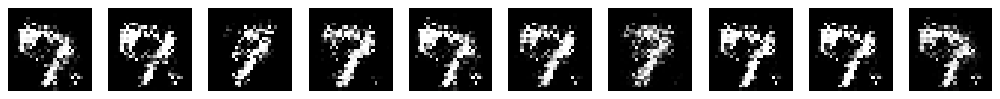

Epoch 70; Discriminator: 1.391, Generator: 0.714


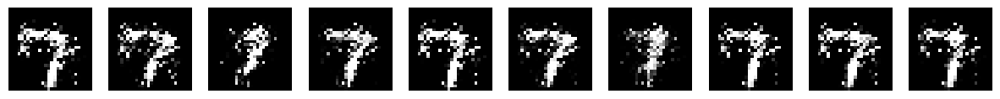

Epoch 71; Discriminator: 1.387, Generator: 0.703


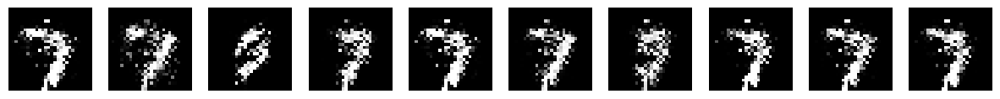

Epoch 72; Discriminator: 1.385, Generator: 0.726


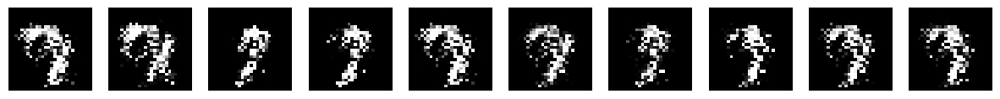

Epoch 73; Discriminator: 1.380, Generator: 0.693


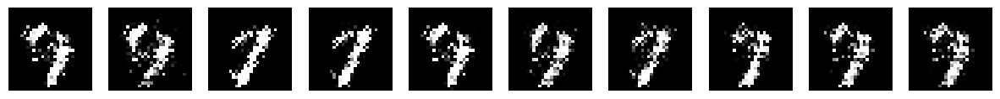

Epoch 74; Discriminator: 1.388, Generator: 0.715


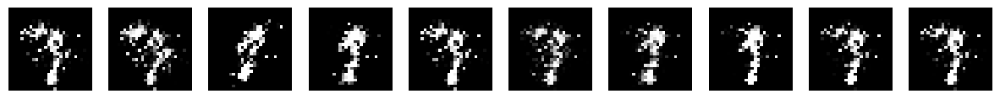

Epoch 75; Discriminator: 1.319, Generator: 0.725


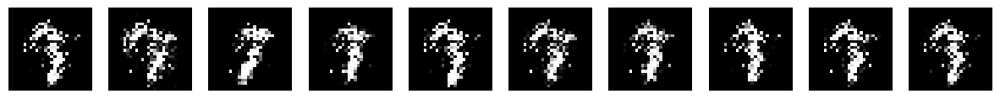

Epoch 76; Discriminator: 1.346, Generator: 0.821


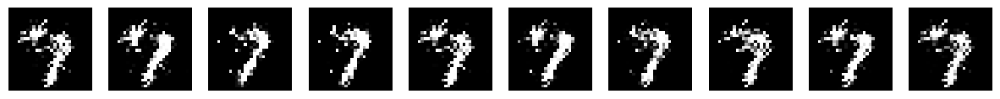

Epoch 77; Discriminator: 1.388, Generator: 0.749


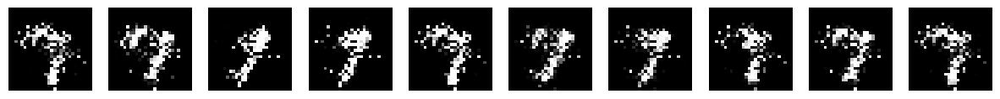

Epoch 78; Discriminator: 1.400, Generator: 0.714


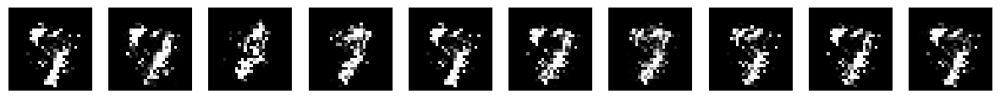

Epoch 79; Discriminator: 1.390, Generator: 0.710


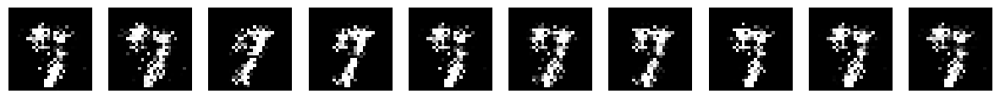

Epoch 80; Discriminator: 1.308, Generator: 0.751


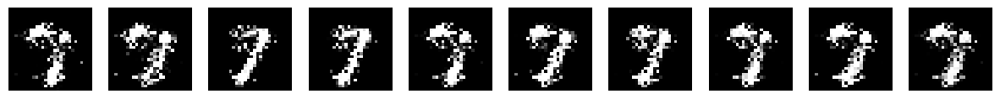

Epoch 81; Discriminator: 1.384, Generator: 0.749


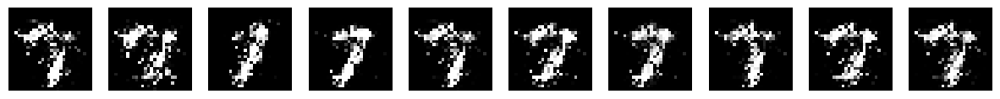

Epoch 82; Discriminator: 1.406, Generator: 0.733


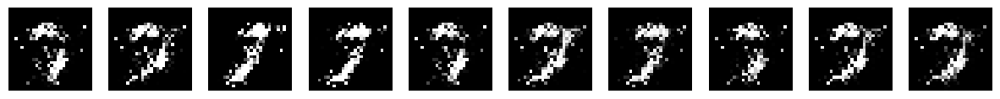

Epoch 83; Discriminator: 1.387, Generator: 0.731


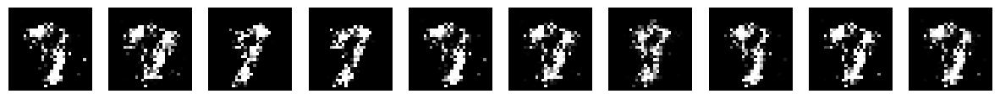

Epoch 84; Discriminator: 1.301, Generator: 0.828


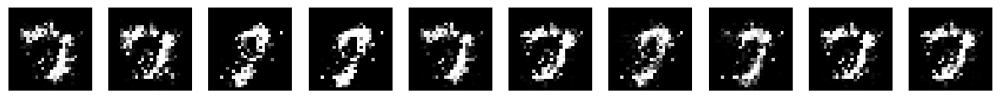

Epoch 85; Discriminator: 1.397, Generator: 0.779


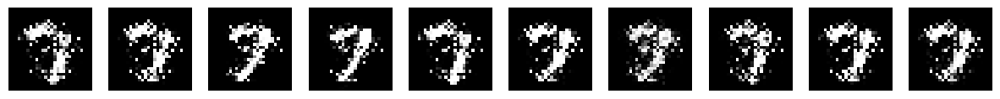

Epoch 86; Discriminator: 1.318, Generator: 0.726


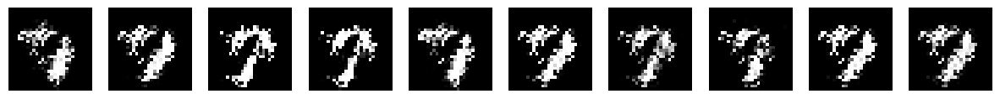

Epoch 87; Discriminator: 1.359, Generator: 0.657


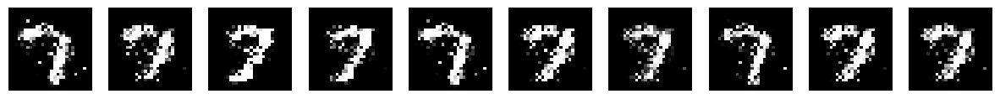

Epoch 88; Discriminator: 1.425, Generator: 0.701


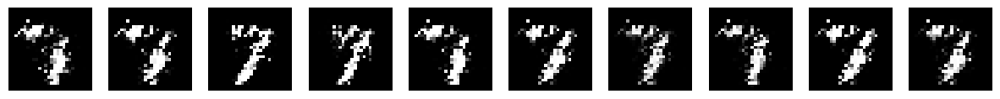

Epoch 89; Discriminator: 1.373, Generator: 0.746


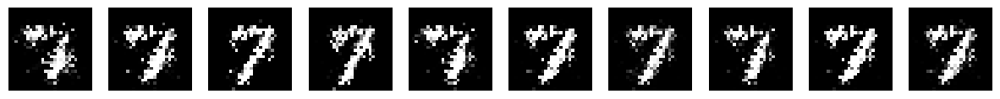

Epoch 90; Discriminator: 1.405, Generator: 0.762


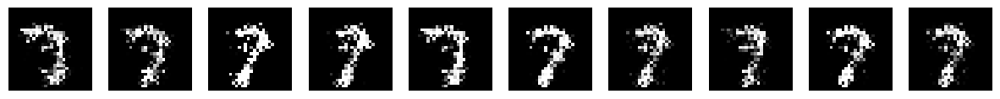

Epoch 91; Discriminator: 1.297, Generator: 0.798


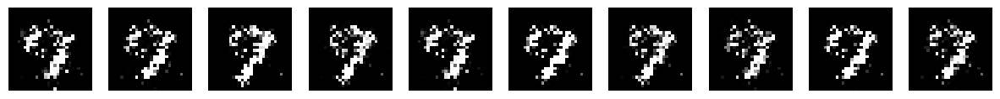

Epoch 92; Discriminator: 1.373, Generator: 0.731


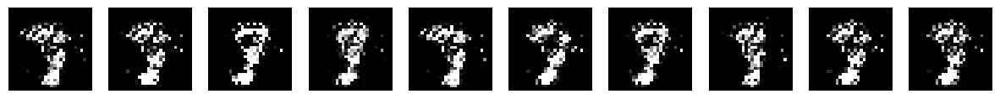

Epoch 93; Discriminator: 1.380, Generator: 0.692


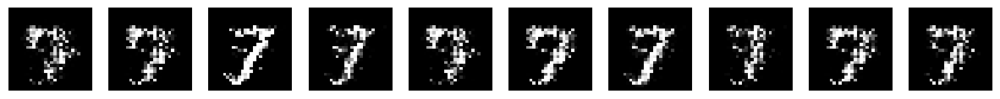

Epoch 94; Discriminator: 1.335, Generator: 0.750


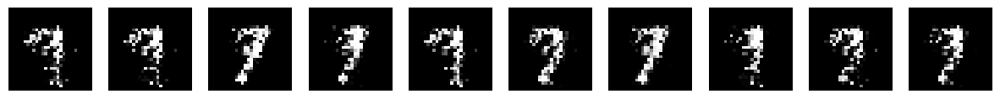

Epoch 95; Discriminator: 1.332, Generator: 0.693


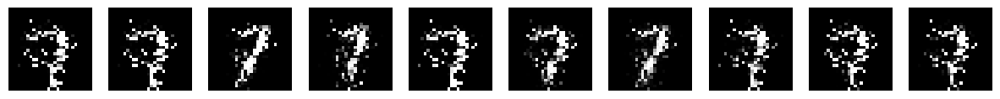

Epoch 96; Discriminator: 1.324, Generator: 0.731


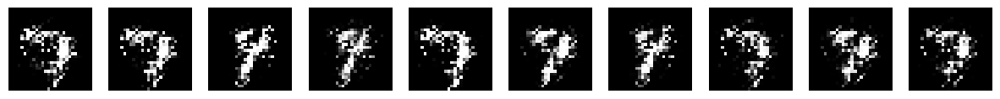

Epoch 97; Discriminator: 1.413, Generator: 0.717


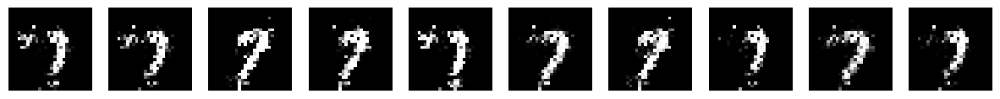

Epoch 98; Discriminator: 1.334, Generator: 0.753


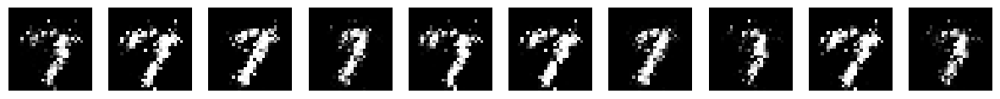

Epoch 99; Discriminator: 1.378, Generator: 0.688


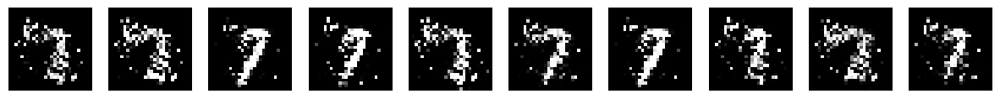

In [ ]:
# Chiffre 7

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=7)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.345, Generator: 0.733


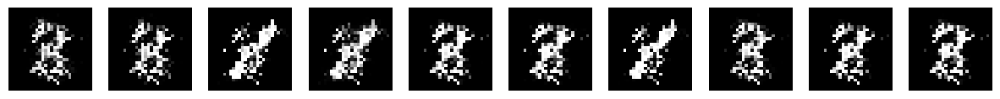

Epoch 1; Discriminator: 1.273, Generator: 0.946


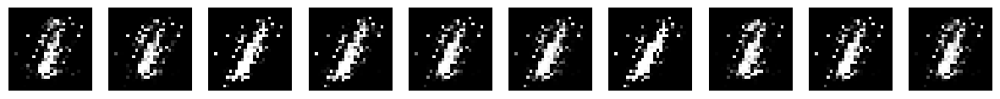

Epoch 2; Discriminator: 1.307, Generator: 0.742


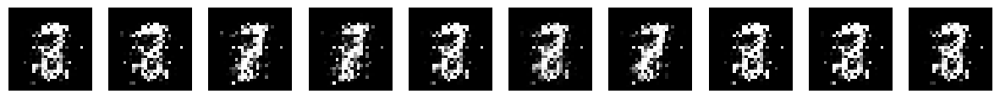

Epoch 3; Discriminator: 1.313, Generator: 0.853


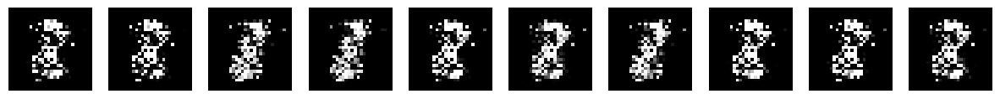

Epoch 4; Discriminator: 1.399, Generator: 0.723


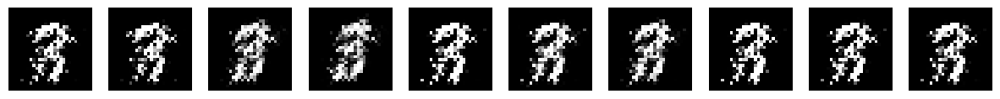

Epoch 5; Discriminator: 1.375, Generator: 0.679


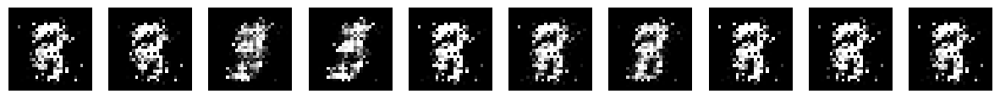

Epoch 6; Discriminator: 1.370, Generator: 0.736


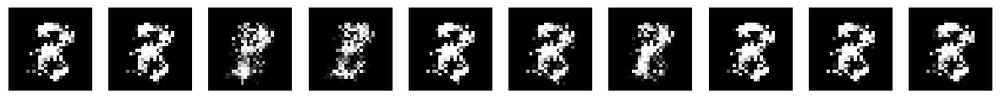

Epoch 7; Discriminator: 1.317, Generator: 0.699


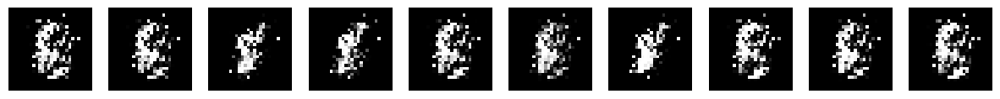

Epoch 8; Discriminator: 1.208, Generator: 0.758


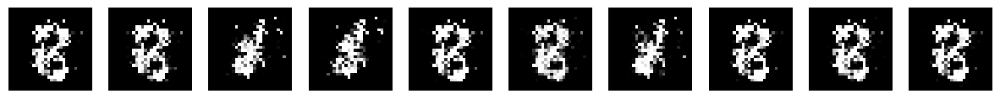

Epoch 9; Discriminator: 1.396, Generator: 0.736


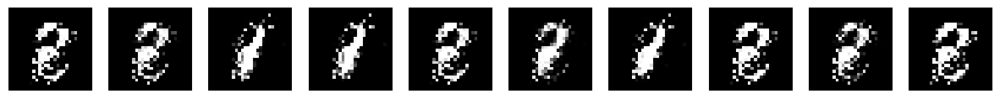

Epoch 10; Discriminator: 1.385, Generator: 0.730


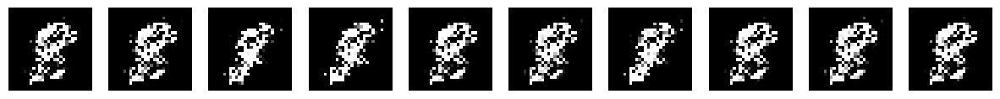

Epoch 11; Discriminator: 1.364, Generator: 0.804


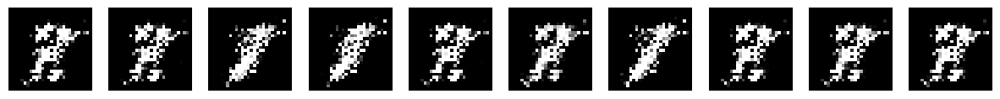

Epoch 12; Discriminator: 1.299, Generator: 0.869


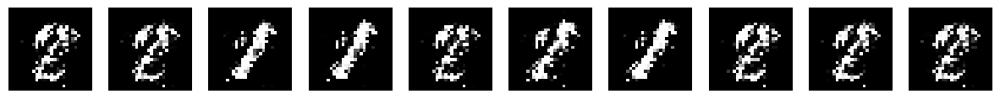

Epoch 13; Discriminator: 1.200, Generator: 0.788


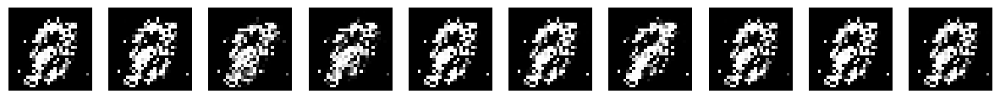

Epoch 14; Discriminator: 1.341, Generator: 0.749


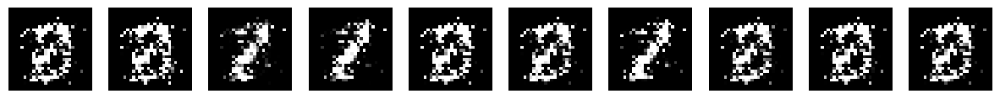

Epoch 15; Discriminator: 1.341, Generator: 0.756


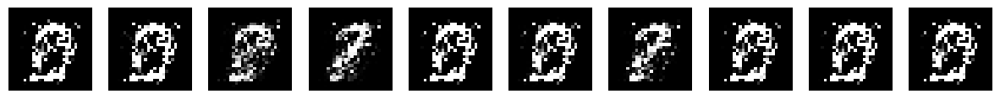

Epoch 16; Discriminator: 1.371, Generator: 0.764


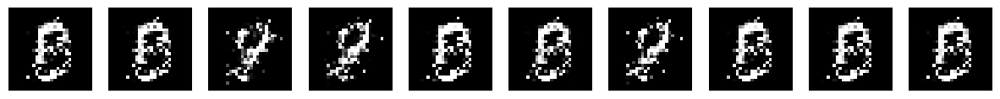

Epoch 17; Discriminator: 1.374, Generator: 0.750


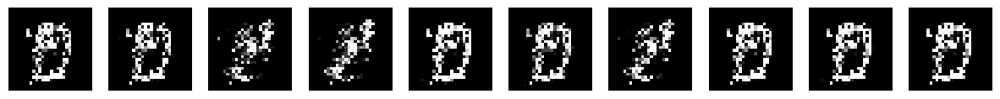

Epoch 18; Discriminator: 1.399, Generator: 0.721


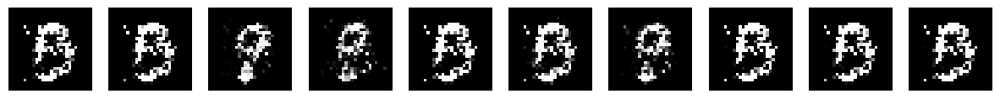

Epoch 19; Discriminator: 1.371, Generator: 0.714


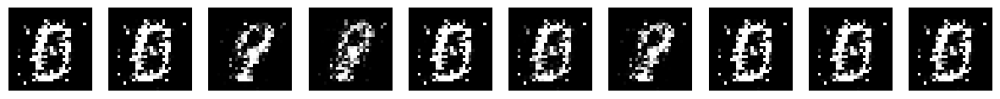

Epoch 20; Discriminator: 1.375, Generator: 0.727


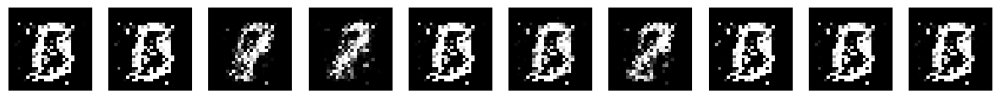

Epoch 21; Discriminator: 1.383, Generator: 0.716


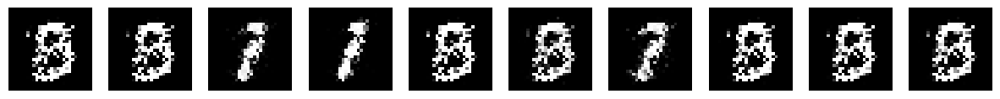

Epoch 22; Discriminator: 1.369, Generator: 0.676


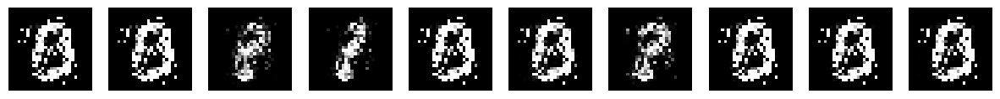

Epoch 23; Discriminator: 1.374, Generator: 0.680


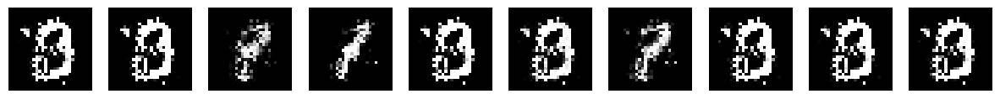

Epoch 24; Discriminator: 1.376, Generator: 0.701


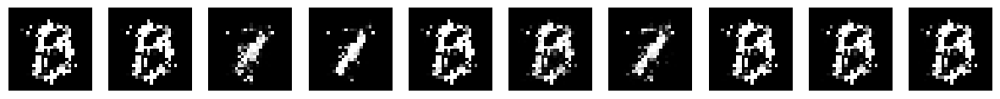

Epoch 25; Discriminator: 1.344, Generator: 0.759


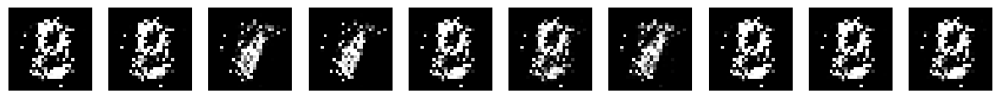

Epoch 26; Discriminator: 1.300, Generator: 0.773


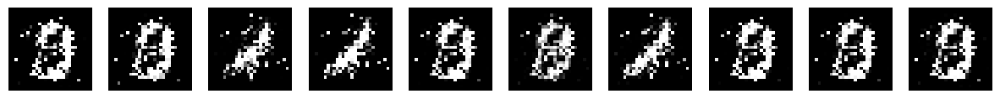

Epoch 27; Discriminator: 1.219, Generator: 0.866


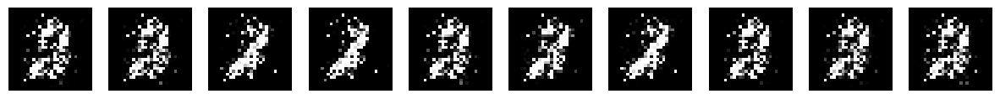

Epoch 28; Discriminator: 1.367, Generator: 0.794


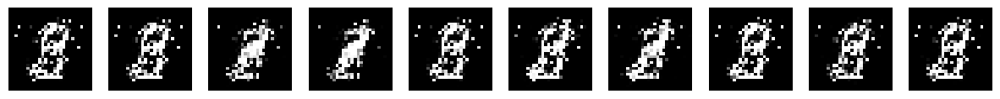

Epoch 29; Discriminator: 1.368, Generator: 0.771


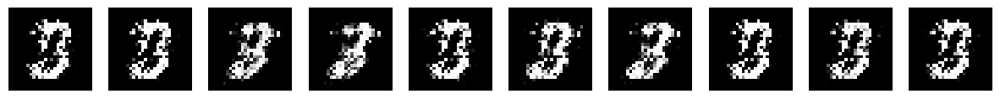

Epoch 30; Discriminator: 1.408, Generator: 0.723


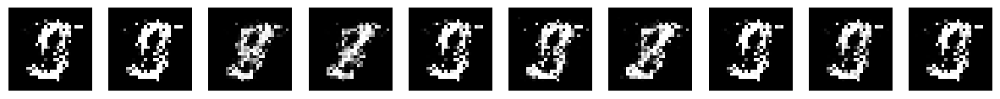

Epoch 31; Discriminator: 1.331, Generator: 0.752


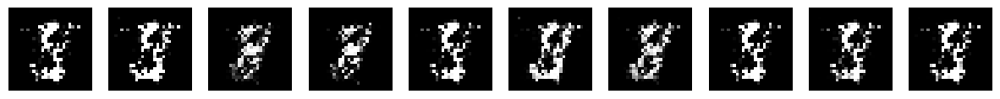

Epoch 32; Discriminator: 1.353, Generator: 0.721


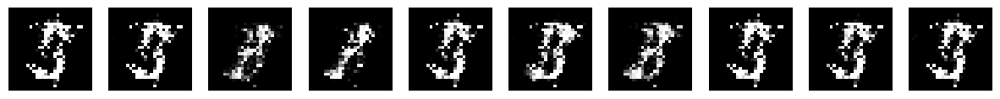

Epoch 33; Discriminator: 1.354, Generator: 0.701


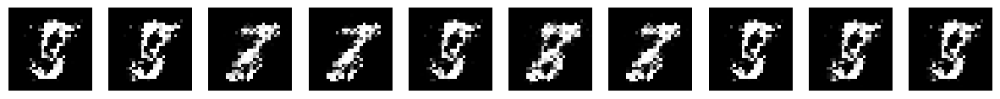

Epoch 34; Discriminator: 1.407, Generator: 0.713


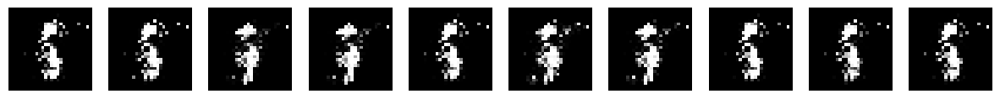

Epoch 35; Discriminator: 1.353, Generator: 0.719


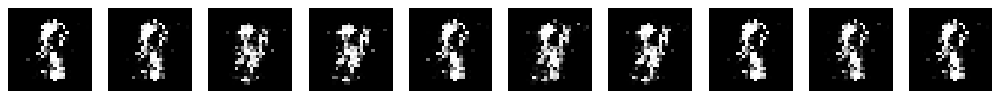

Epoch 36; Discriminator: 1.409, Generator: 0.745


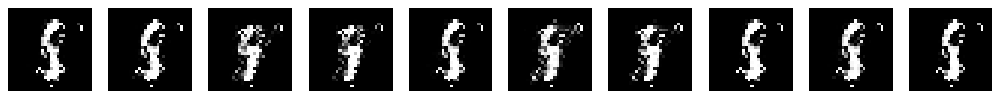

Epoch 37; Discriminator: 1.336, Generator: 0.753


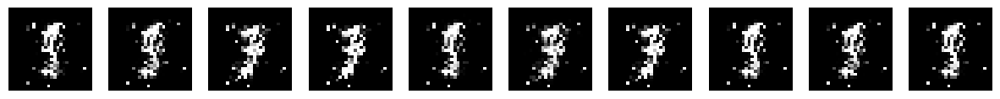

Epoch 38; Discriminator: 1.334, Generator: 0.740


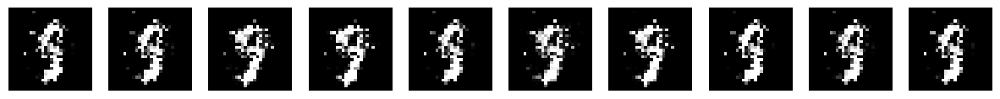

Epoch 39; Discriminator: 1.372, Generator: 0.738


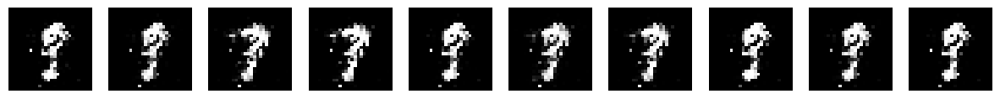

Epoch 40; Discriminator: 1.350, Generator: 0.748


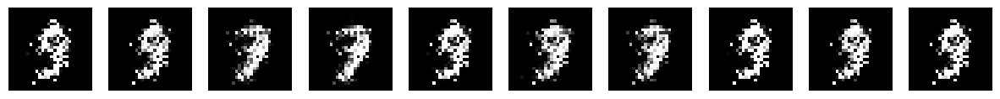

Epoch 41; Discriminator: 1.332, Generator: 0.685


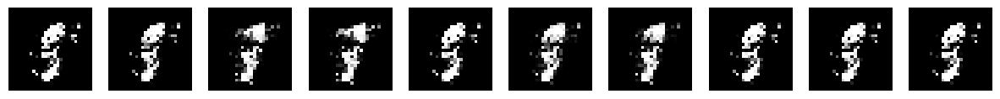

Epoch 42; Discriminator: 1.277, Generator: 0.749


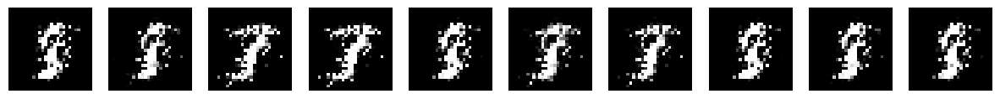

Epoch 43; Discriminator: 1.374, Generator: 0.743


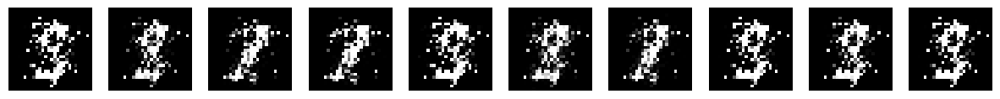

Epoch 44; Discriminator: 1.378, Generator: 0.695


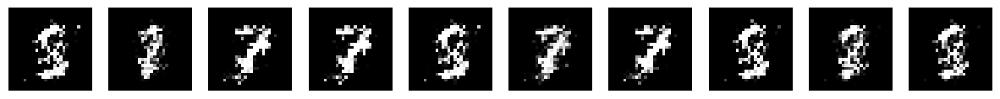

Epoch 45; Discriminator: 1.361, Generator: 0.725


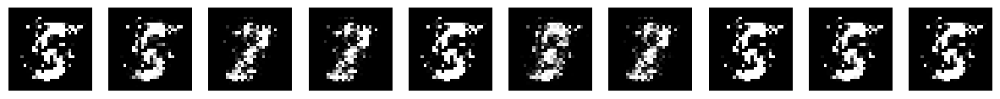

Epoch 46; Discriminator: 1.418, Generator: 0.717


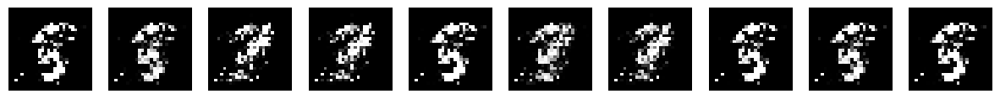

Epoch 47; Discriminator: 1.392, Generator: 0.718


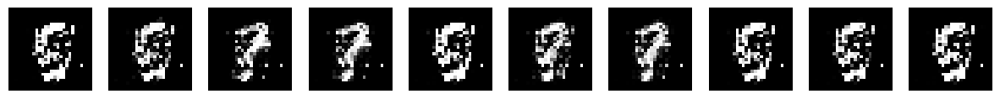

Epoch 48; Discriminator: 1.386, Generator: 0.728


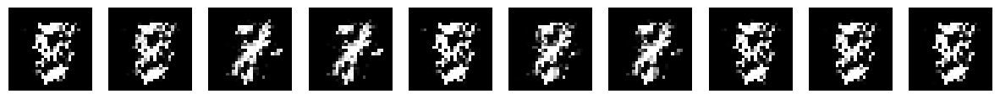

Epoch 49; Discriminator: 1.378, Generator: 0.716


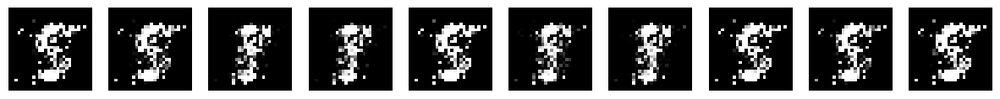

Epoch 50; Discriminator: 1.305, Generator: 0.711


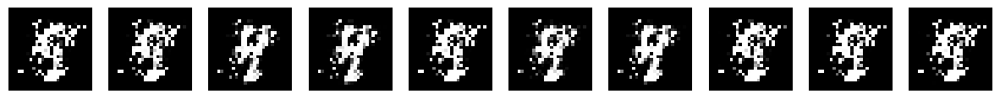

Epoch 51; Discriminator: 1.335, Generator: 0.849


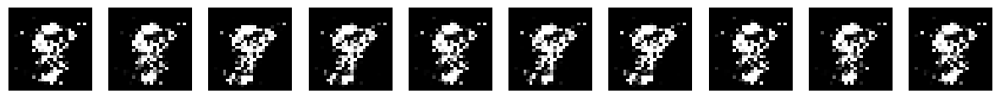

Epoch 52; Discriminator: 1.327, Generator: 0.730


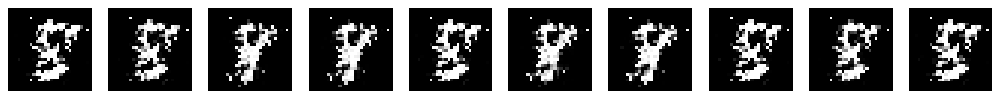

Epoch 53; Discriminator: 1.425, Generator: 0.737


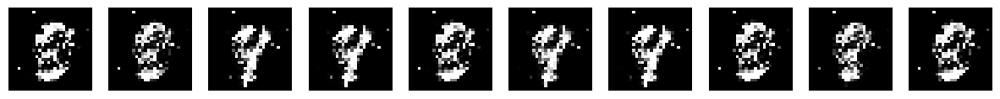

Epoch 54; Discriminator: 1.404, Generator: 0.748


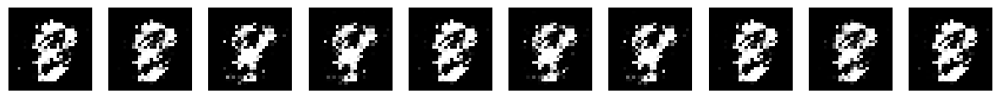

Epoch 55; Discriminator: 1.355, Generator: 0.766


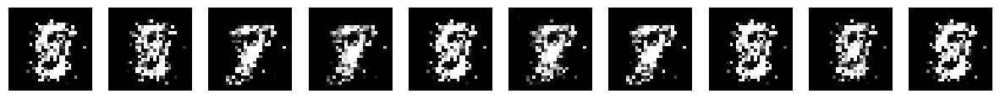

Epoch 56; Discriminator: 1.377, Generator: 0.724


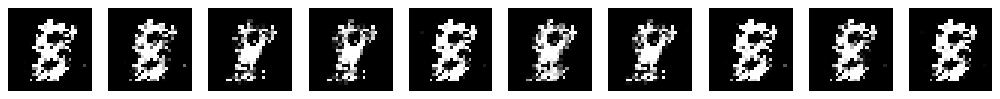

Epoch 57; Discriminator: 1.404, Generator: 0.695


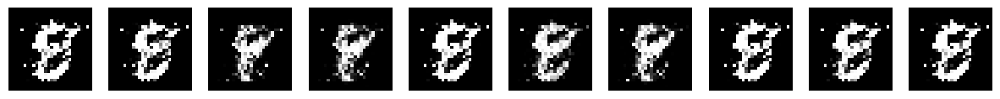

Epoch 58; Discriminator: 1.354, Generator: 0.682


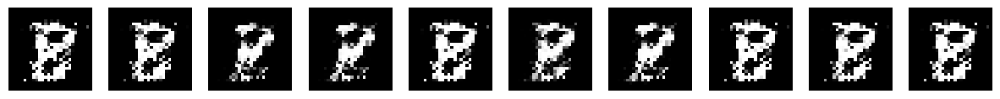

Epoch 59; Discriminator: 1.393, Generator: 0.693


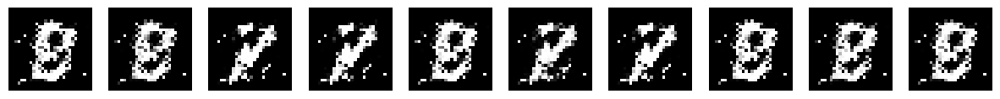

Epoch 60; Discriminator: 1.313, Generator: 0.740


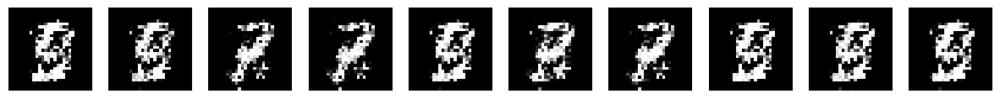

Epoch 61; Discriminator: 1.288, Generator: 0.775


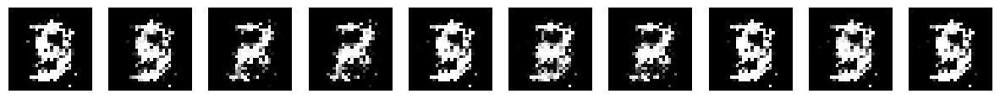

Epoch 62; Discriminator: 1.194, Generator: 0.788


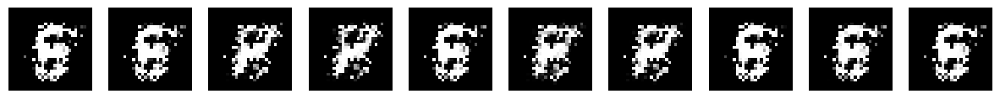

Epoch 63; Discriminator: 1.356, Generator: 0.772


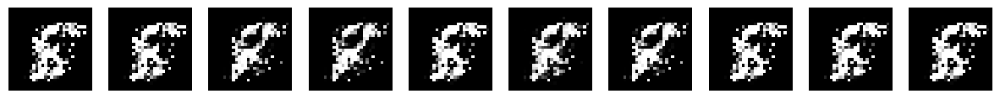

Epoch 64; Discriminator: 1.403, Generator: 0.766


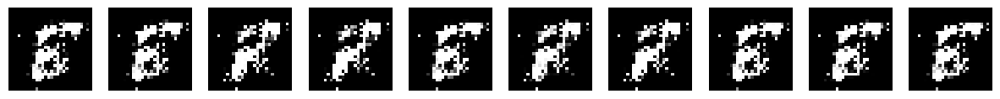

Epoch 65; Discriminator: 1.320, Generator: 0.738


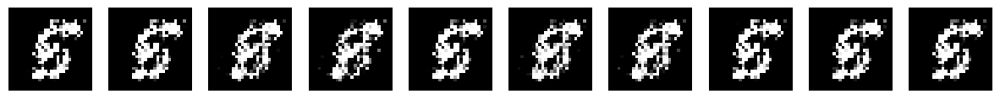

Epoch 66; Discriminator: 1.279, Generator: 0.754


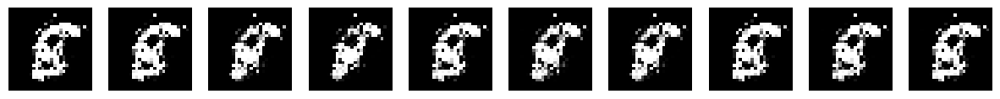

Epoch 67; Discriminator: 1.269, Generator: 0.734


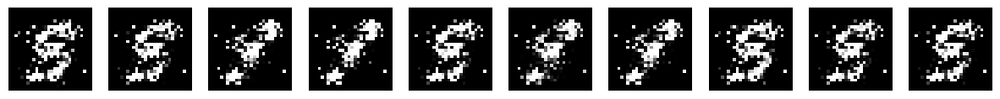

Epoch 68; Discriminator: 1.262, Generator: 0.756


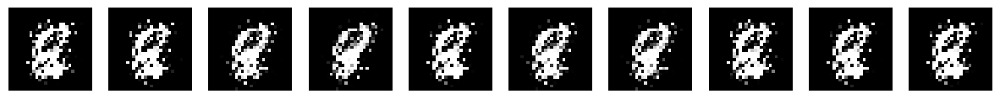

Epoch 69; Discriminator: 1.319, Generator: 0.786


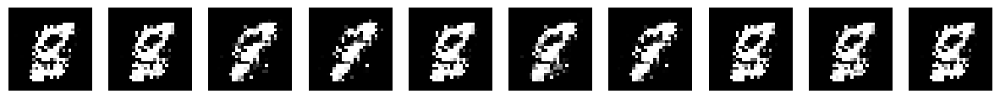

Epoch 70; Discriminator: 1.451, Generator: 0.745


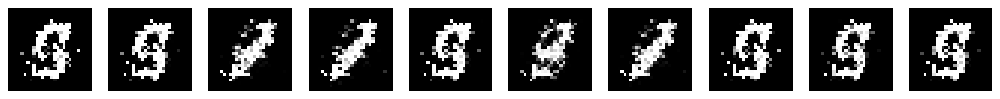

Epoch 71; Discriminator: 1.417, Generator: 0.770


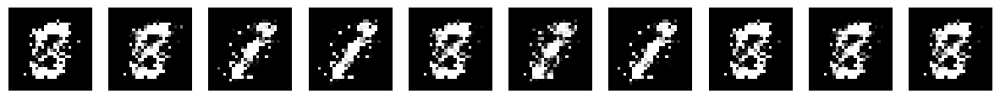

Epoch 72; Discriminator: 1.374, Generator: 0.720


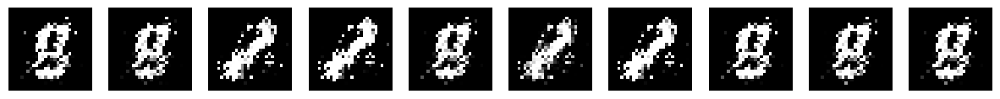

Epoch 73; Discriminator: 1.311, Generator: 0.747


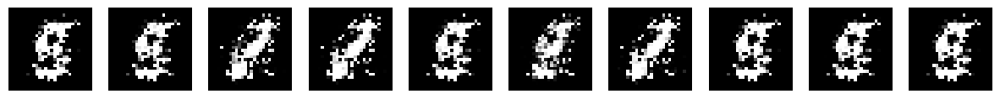

Epoch 74; Discriminator: 1.380, Generator: 0.715


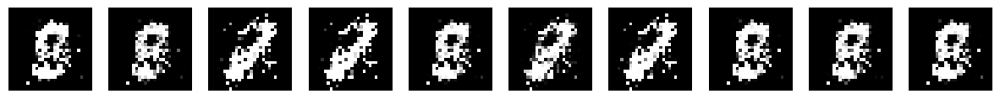

Epoch 75; Discriminator: 1.389, Generator: 0.768


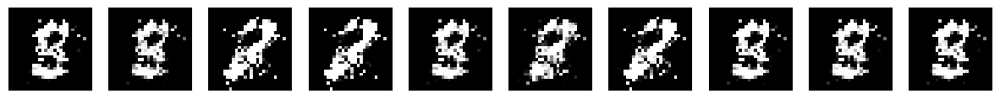

Epoch 76; Discriminator: 1.344, Generator: 0.698


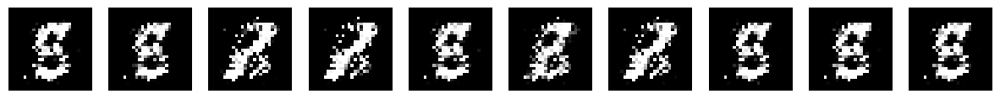

Epoch 77; Discriminator: 1.362, Generator: 0.732


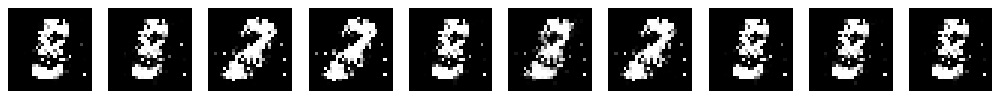

Epoch 78; Discriminator: 1.370, Generator: 0.741


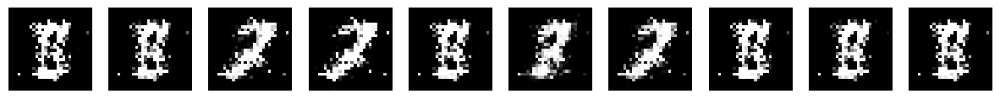

Epoch 79; Discriminator: 1.343, Generator: 0.761


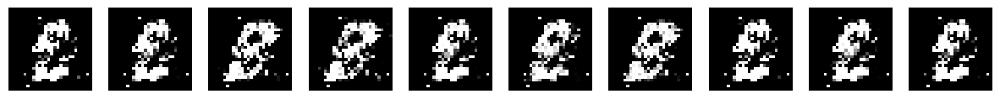

Epoch 80; Discriminator: 1.344, Generator: 0.683


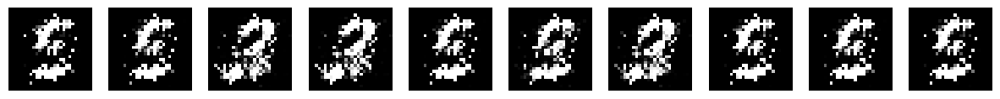

Epoch 81; Discriminator: 1.273, Generator: 0.786


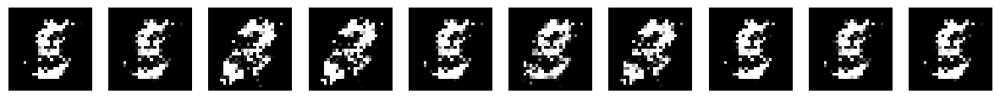

Epoch 82; Discriminator: 1.344, Generator: 0.804


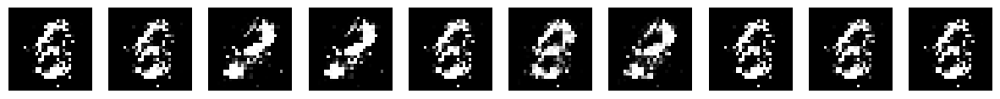

Epoch 83; Discriminator: 1.386, Generator: 0.806


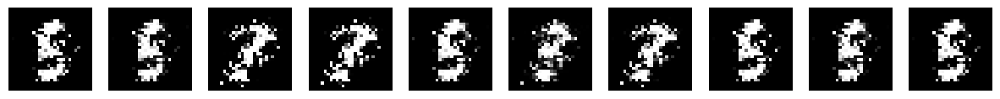

Epoch 84; Discriminator: 1.401, Generator: 0.751


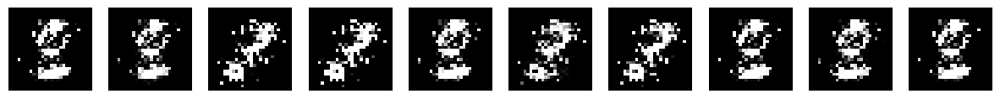

Epoch 85; Discriminator: 1.366, Generator: 0.710


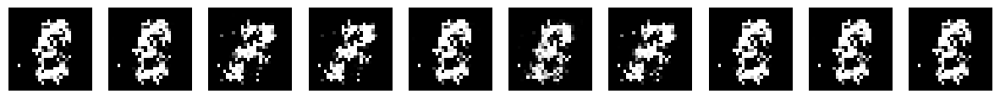

Epoch 86; Discriminator: 1.361, Generator: 0.731


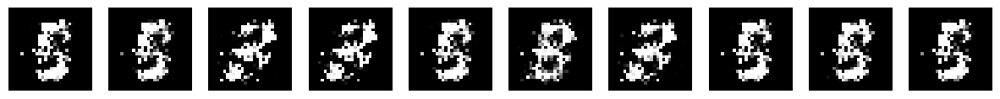

Epoch 87; Discriminator: 1.390, Generator: 0.739


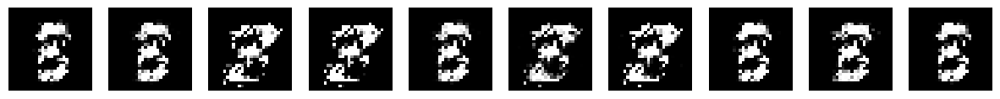

Epoch 88; Discriminator: 1.411, Generator: 0.742


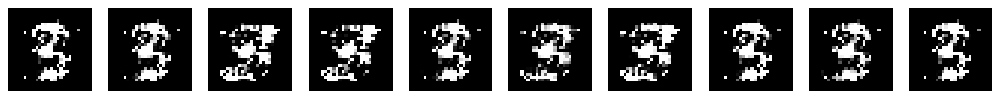

Epoch 89; Discriminator: 1.388, Generator: 0.709


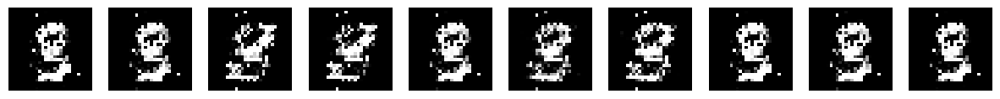

Epoch 90; Discriminator: 1.368, Generator: 0.746


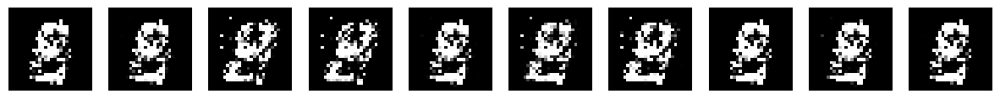

Epoch 91; Discriminator: 1.411, Generator: 0.710


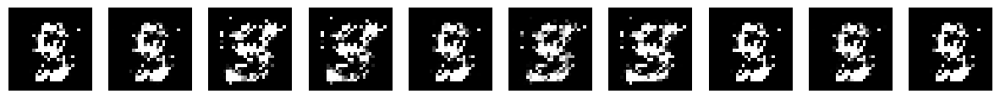

Epoch 92; Discriminator: 1.406, Generator: 0.729


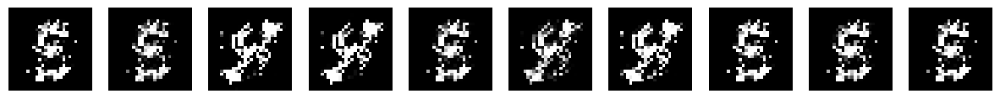

Epoch 93; Discriminator: 1.342, Generator: 0.689


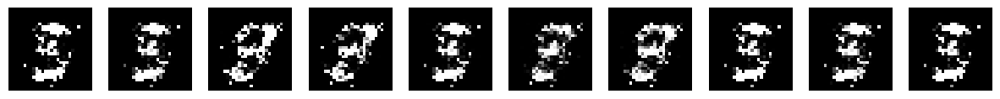

Epoch 94; Discriminator: 1.312, Generator: 0.779


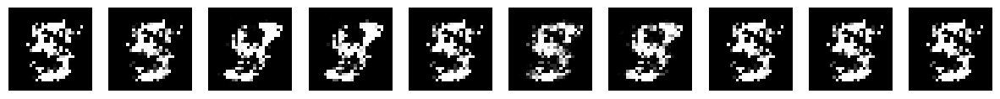

Epoch 95; Discriminator: 1.435, Generator: 0.685


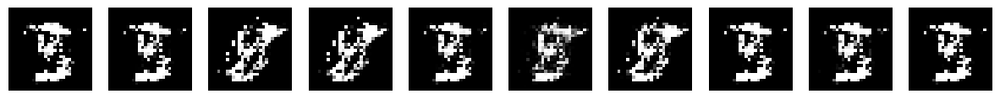

Epoch 96; Discriminator: 1.213, Generator: 0.771


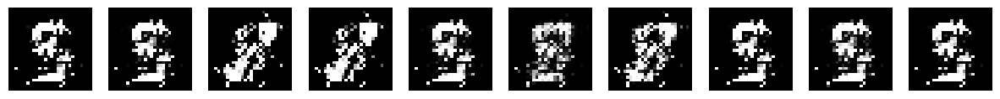

Epoch 97; Discriminator: 1.315, Generator: 0.753


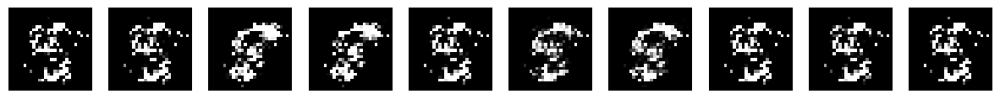

Epoch 98; Discriminator: 1.417, Generator: 0.852


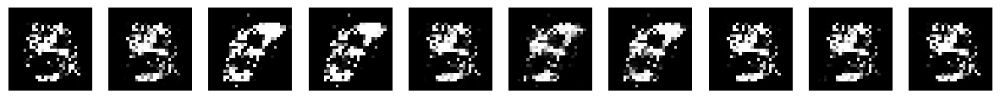

Epoch 99; Discriminator: 1.323, Generator: 0.757


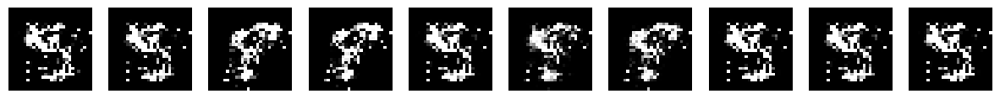

In [ ]:
# Chiffre 8

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=8)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0; Discriminator: 1.341, Generator: 0.791


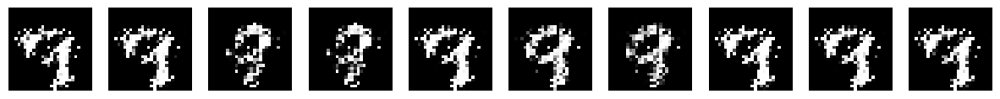

Epoch 1; Discriminator: 1.361, Generator: 0.775


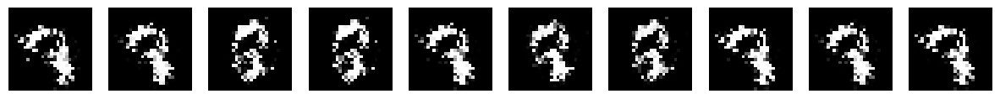

Epoch 2; Discriminator: 1.248, Generator: 0.761


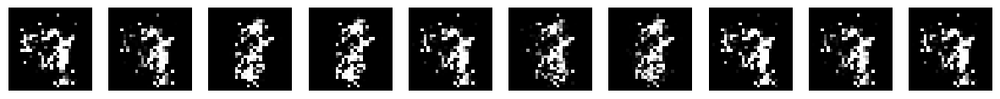

Epoch 3; Discriminator: 1.375, Generator: 0.814


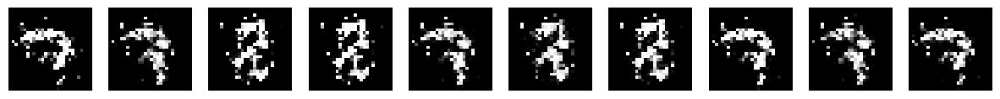

Epoch 4; Discriminator: 1.160, Generator: 0.906


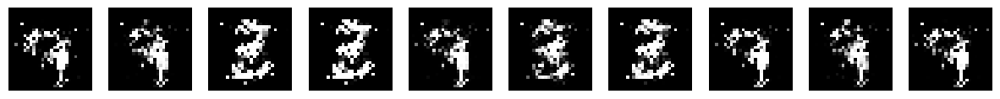

Epoch 5; Discriminator: 1.280, Generator: 0.844


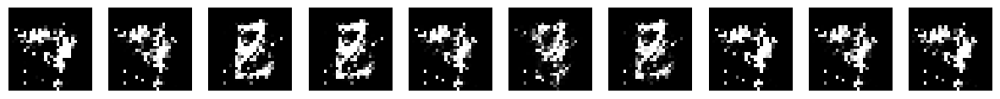

Epoch 6; Discriminator: 1.393, Generator: 0.842


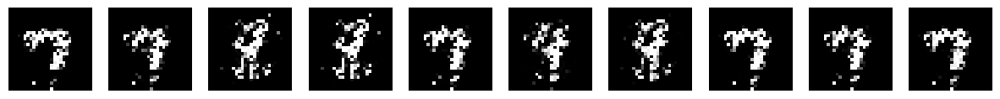

Epoch 7; Discriminator: 1.312, Generator: 0.808


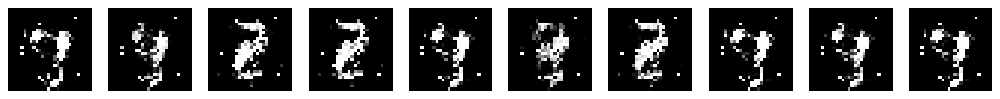

Epoch 8; Discriminator: 1.148, Generator: 0.832


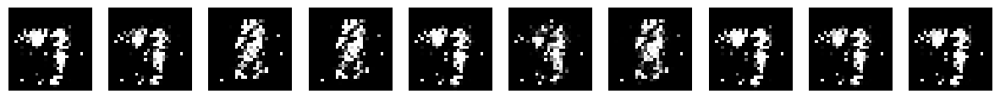

Epoch 9; Discriminator: 1.130, Generator: 0.890


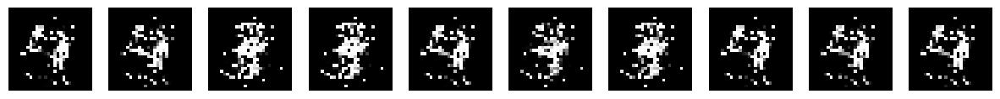

Epoch 10; Discriminator: 1.198, Generator: 0.927


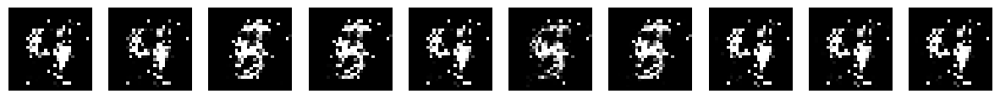

Epoch 11; Discriminator: 1.340, Generator: 0.820


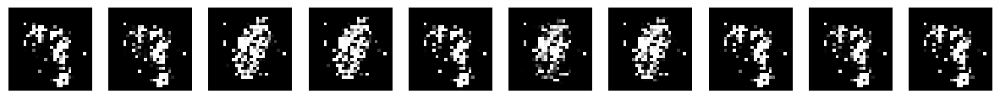

Epoch 12; Discriminator: 1.256, Generator: 0.825


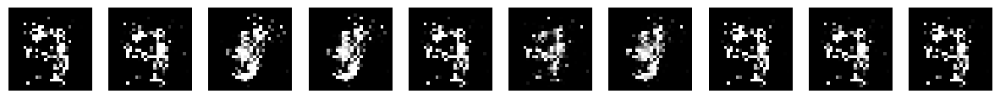

Epoch 13; Discriminator: 1.366, Generator: 0.830


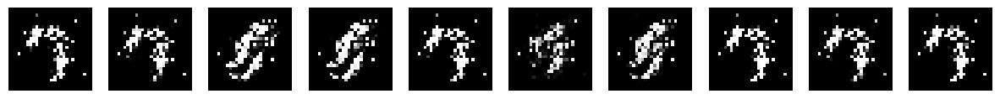

Epoch 14; Discriminator: 1.253, Generator: 0.826


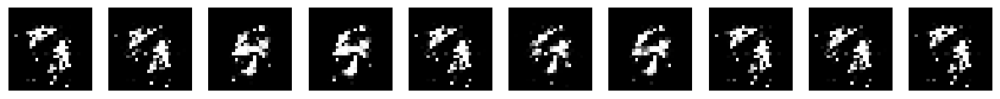

Epoch 15; Discriminator: 1.369, Generator: 0.813


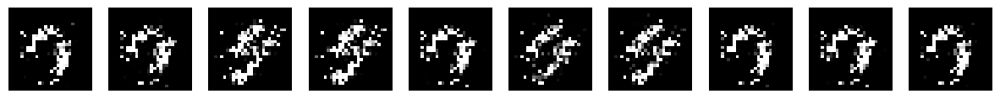

Epoch 16; Discriminator: 1.319, Generator: 0.732


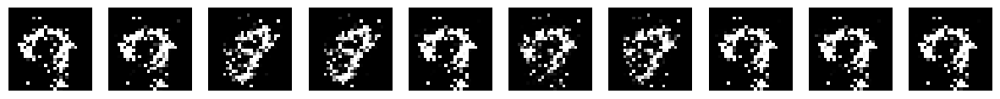

Epoch 17; Discriminator: 1.407, Generator: 0.770


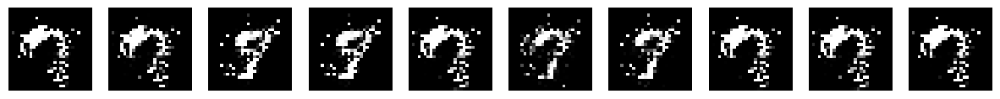

Epoch 18; Discriminator: 1.290, Generator: 0.747


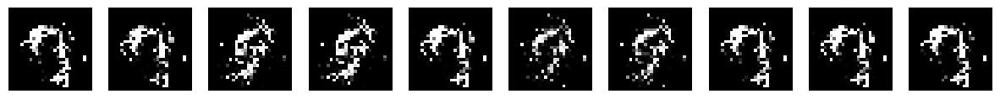

Epoch 19; Discriminator: 1.225, Generator: 0.856


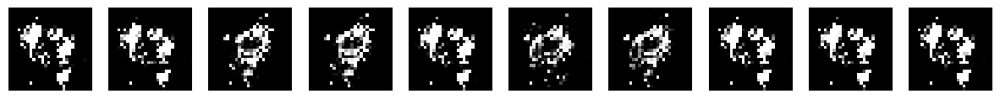

Epoch 20; Discriminator: 1.324, Generator: 0.734


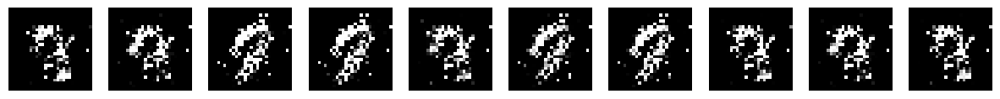

Epoch 21; Discriminator: 1.398, Generator: 0.744


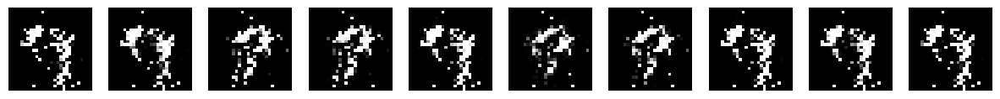

Epoch 22; Discriminator: 1.349, Generator: 0.698


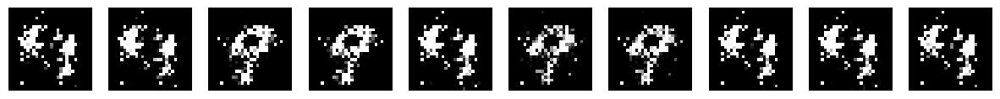

Epoch 23; Discriminator: 1.397, Generator: 0.724


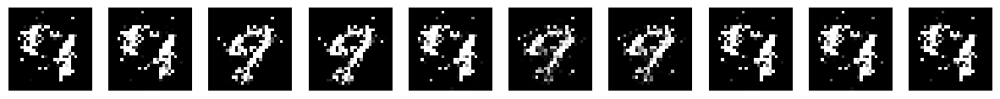

Epoch 24; Discriminator: 1.384, Generator: 0.777


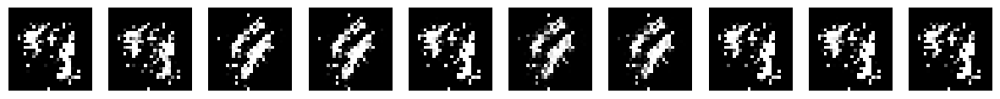

Epoch 25; Discriminator: 1.255, Generator: 0.759


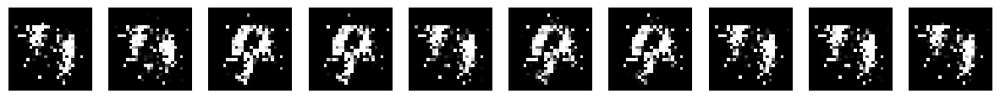

Epoch 26; Discriminator: 1.365, Generator: 0.801


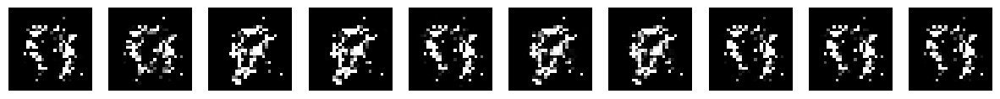

Epoch 27; Discriminator: 1.248, Generator: 0.786


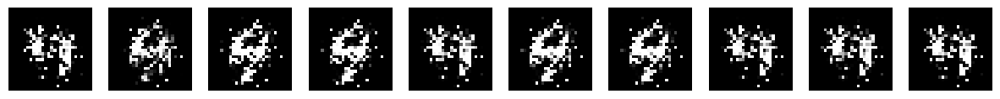

Epoch 28; Discriminator: 1.283, Generator: 0.733


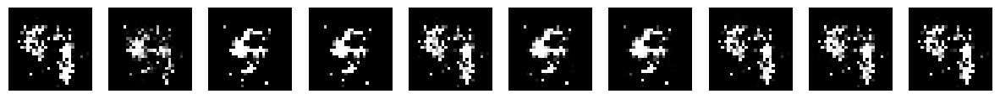

Epoch 29; Discriminator: 1.188, Generator: 0.827


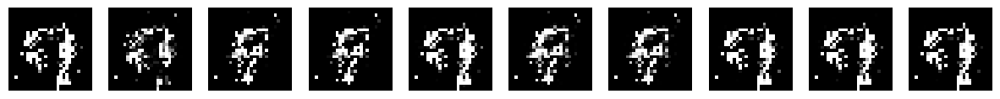

Epoch 30; Discriminator: 1.281, Generator: 0.862


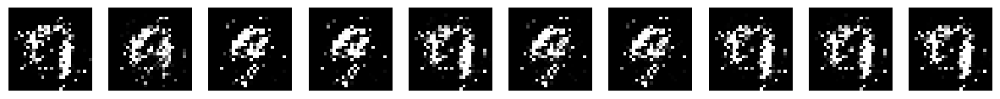

Epoch 31; Discriminator: 1.403, Generator: 0.855


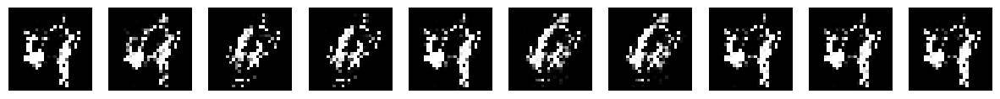

Epoch 32; Discriminator: 1.208, Generator: 0.824


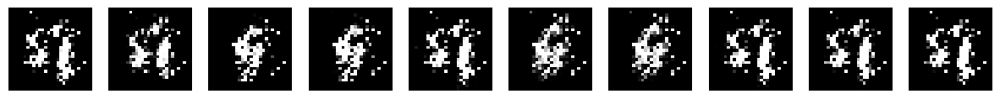

Epoch 33; Discriminator: 1.420, Generator: 0.824


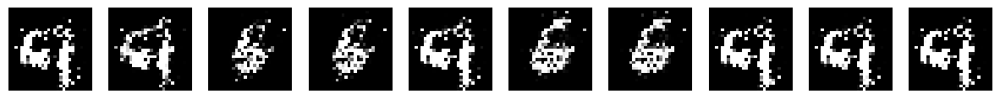

Epoch 34; Discriminator: 1.372, Generator: 0.730


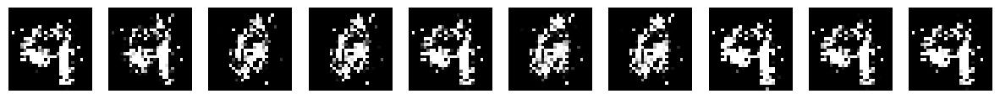

Epoch 35; Discriminator: 1.399, Generator: 0.744


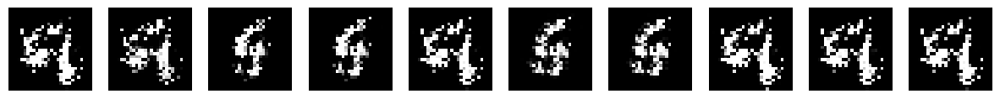

Epoch 36; Discriminator: 1.391, Generator: 0.751


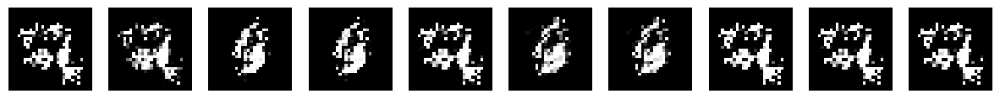

Epoch 37; Discriminator: 1.334, Generator: 0.720


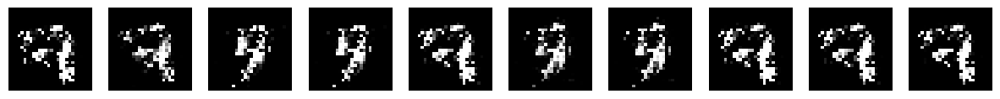

Epoch 38; Discriminator: 1.307, Generator: 0.703


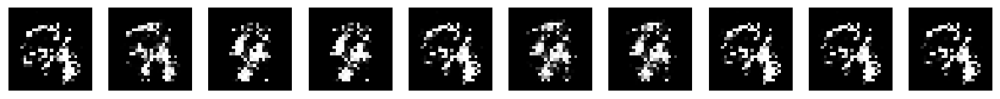

Epoch 39; Discriminator: 1.312, Generator: 0.802


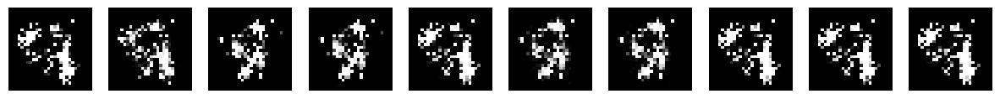

Epoch 40; Discriminator: 1.153, Generator: 0.791


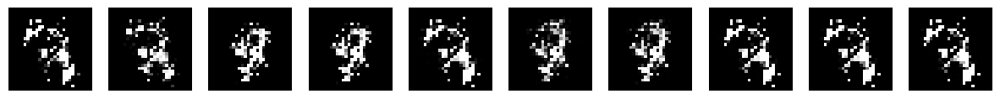

Epoch 41; Discriminator: 1.359, Generator: 0.794


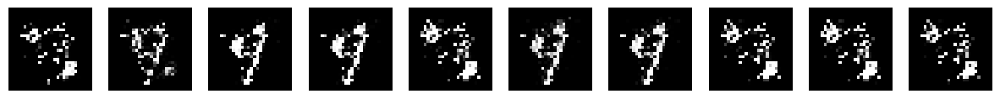

Epoch 42; Discriminator: 1.360, Generator: 0.769


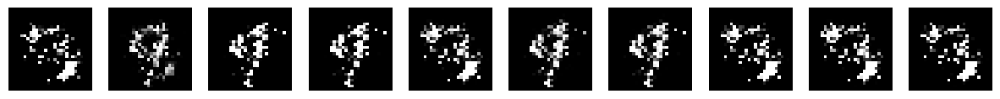

Epoch 43; Discriminator: 1.303, Generator: 0.743


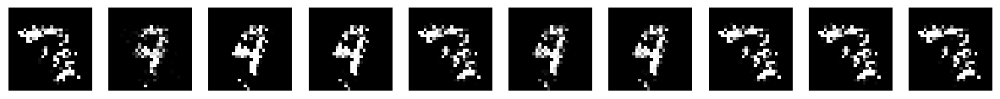

Epoch 44; Discriminator: 1.375, Generator: 0.724


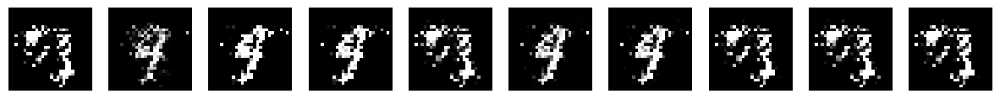

Epoch 45; Discriminator: 1.373, Generator: 0.725


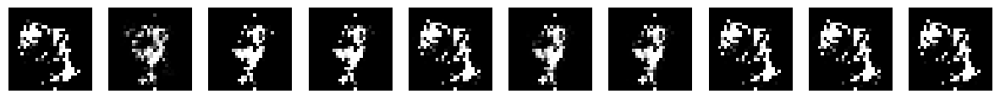

Epoch 46; Discriminator: 1.350, Generator: 0.742


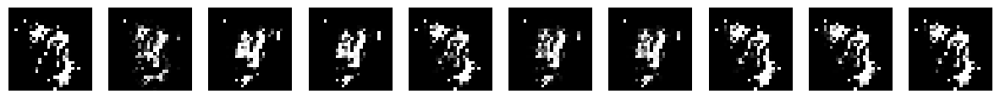

Epoch 47; Discriminator: 1.320, Generator: 0.824


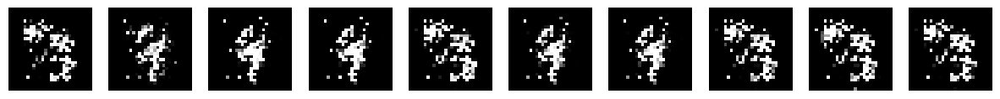

Epoch 48; Discriminator: 1.290, Generator: 0.866


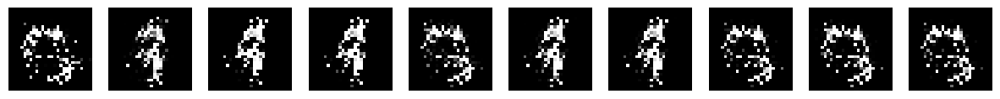

Epoch 49; Discriminator: 1.322, Generator: 0.769


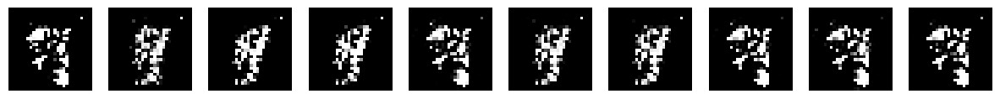

Epoch 50; Discriminator: 1.352, Generator: 0.770


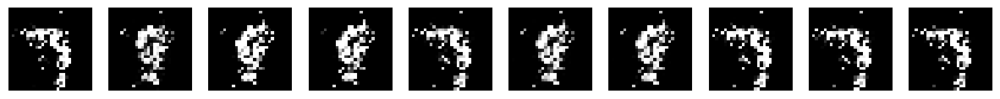

Epoch 51; Discriminator: 1.323, Generator: 0.769


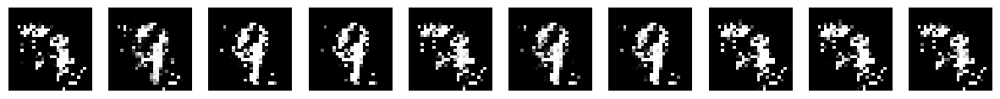

Epoch 52; Discriminator: 1.183, Generator: 0.798


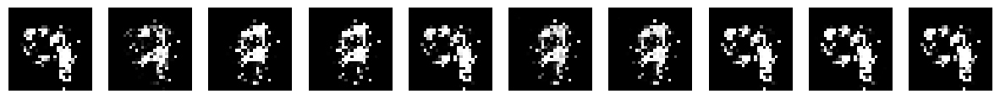

Epoch 53; Discriminator: 1.192, Generator: 0.821


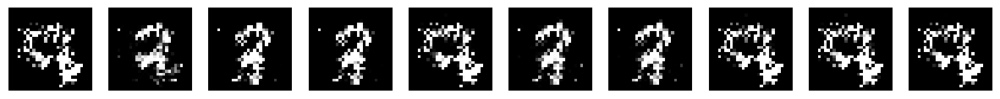

Epoch 54; Discriminator: 1.263, Generator: 0.784


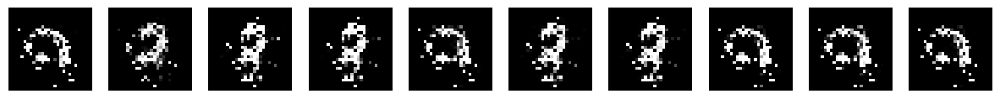

Epoch 55; Discriminator: 1.340, Generator: 0.792


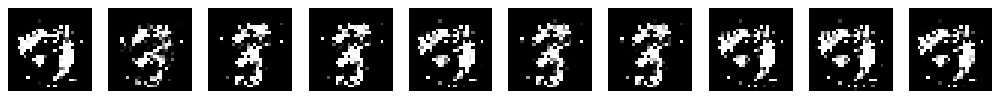

Epoch 56; Discriminator: 1.204, Generator: 0.813


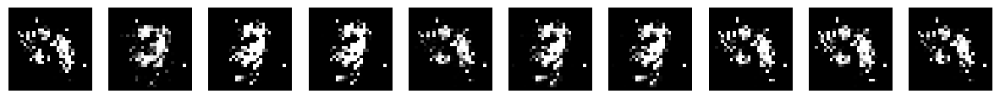

Epoch 57; Discriminator: 1.356, Generator: 0.862


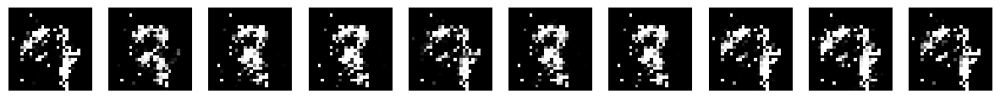

Epoch 58; Discriminator: 1.213, Generator: 0.799


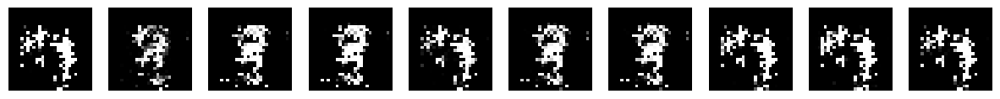

Epoch 59; Discriminator: 1.393, Generator: 0.836


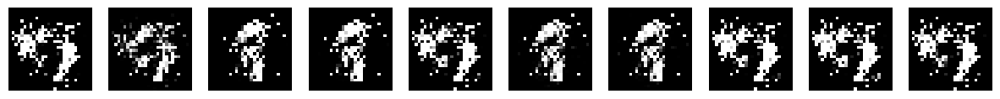

Epoch 60; Discriminator: 1.359, Generator: 0.775


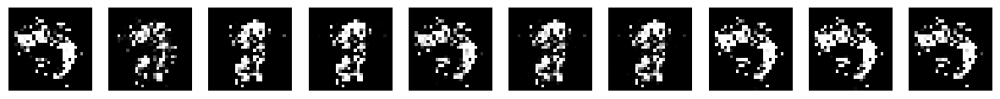

Epoch 61; Discriminator: 1.344, Generator: 0.798


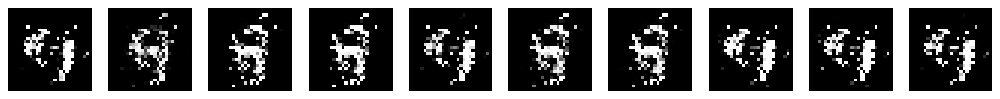

Epoch 62; Discriminator: 1.341, Generator: 0.795


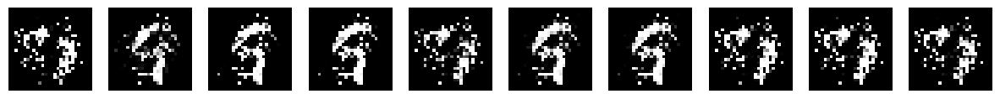

Epoch 63; Discriminator: 1.349, Generator: 0.773


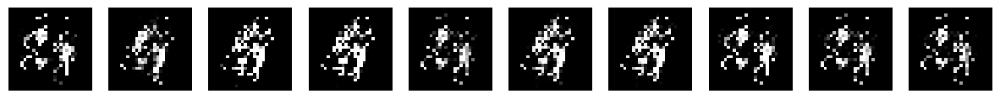

Epoch 64; Discriminator: 1.304, Generator: 0.748


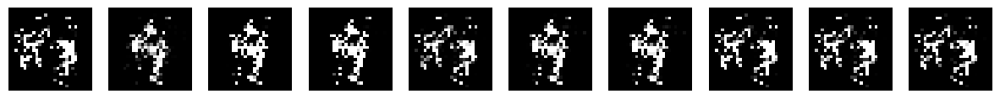

Epoch 65; Discriminator: 1.350, Generator: 0.723


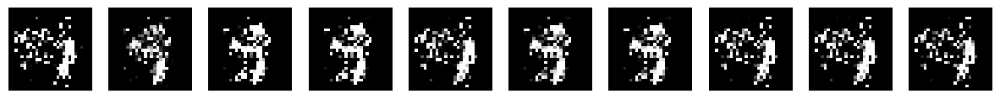

Epoch 66; Discriminator: 1.226, Generator: 0.768


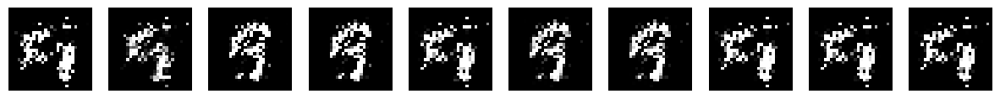

Epoch 67; Discriminator: 1.181, Generator: 0.790


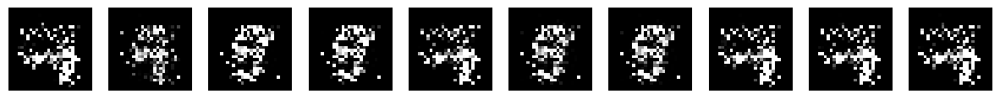

Epoch 68; Discriminator: 1.162, Generator: 0.816


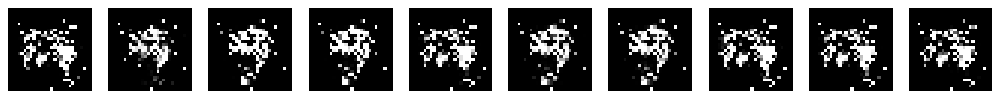

Epoch 69; Discriminator: 1.349, Generator: 0.789


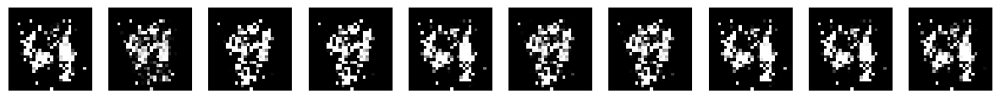

Epoch 70; Discriminator: 1.409, Generator: 0.724


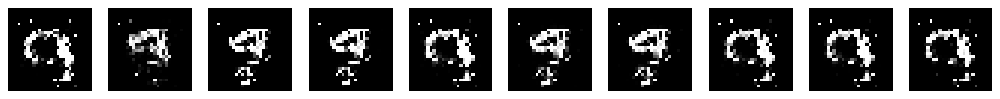

Epoch 71; Discriminator: 1.379, Generator: 0.734


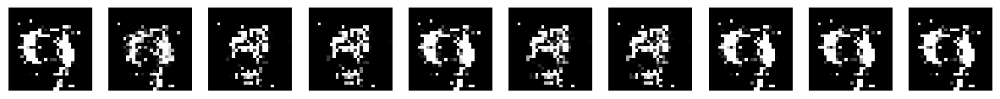

Epoch 72; Discriminator: 1.311, Generator: 0.723


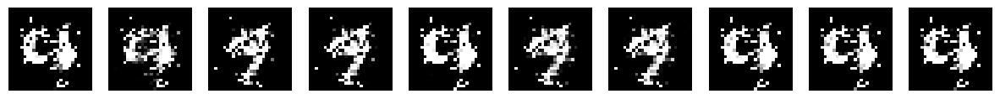

Epoch 73; Discriminator: 1.328, Generator: 0.739


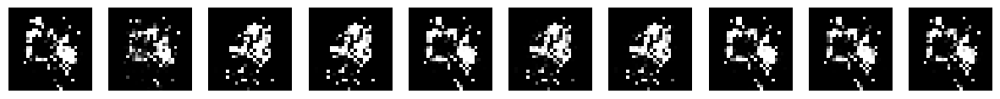

Epoch 74; Discriminator: 1.311, Generator: 0.769


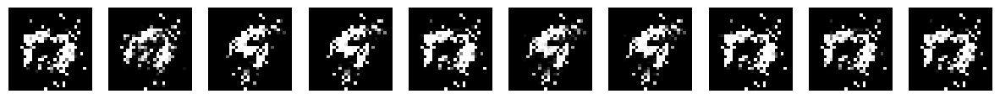

Epoch 75; Discriminator: 1.352, Generator: 0.763


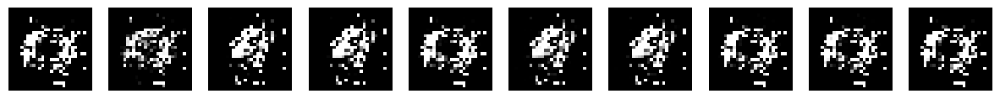

Epoch 76; Discriminator: 1.340, Generator: 0.748


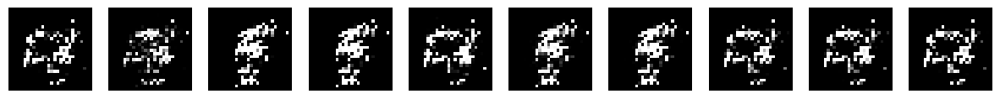

Epoch 77; Discriminator: 1.247, Generator: 0.731


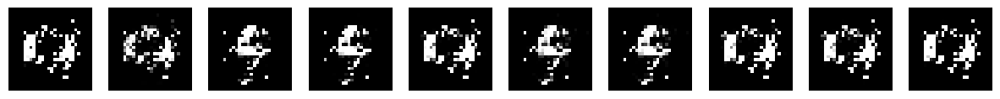

Epoch 78; Discriminator: 1.383, Generator: 0.749


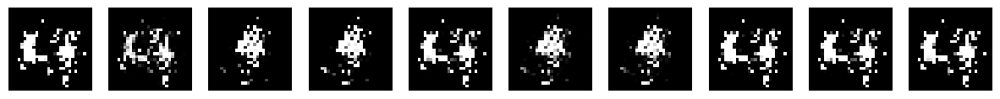

Epoch 79; Discriminator: 1.408, Generator: 0.794


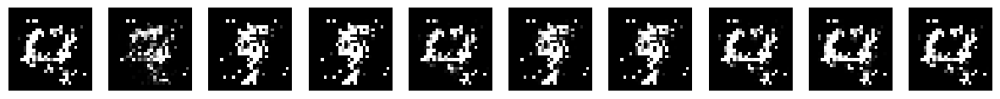

Epoch 80; Discriminator: 1.379, Generator: 0.743


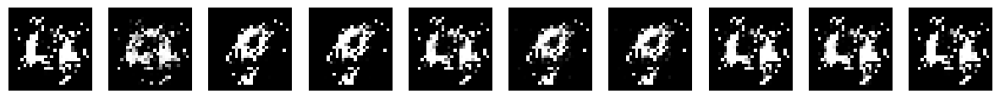

Epoch 81; Discriminator: 1.254, Generator: 0.802


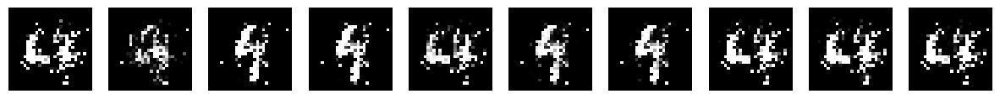

Epoch 82; Discriminator: 1.235, Generator: 0.844


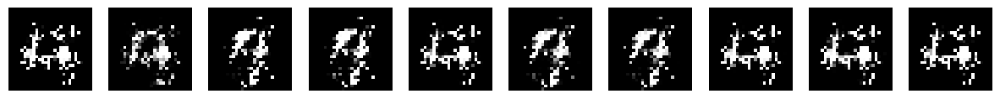

Epoch 83; Discriminator: 1.136, Generator: 0.830


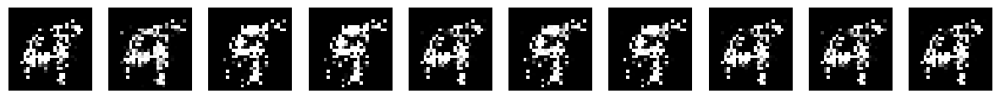

Epoch 84; Discriminator: 1.201, Generator: 0.860


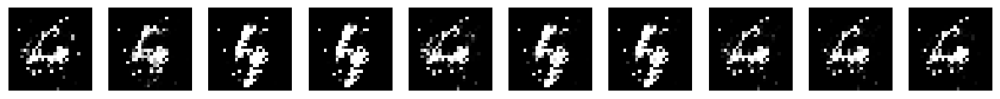

Epoch 85; Discriminator: 1.269, Generator: 0.825


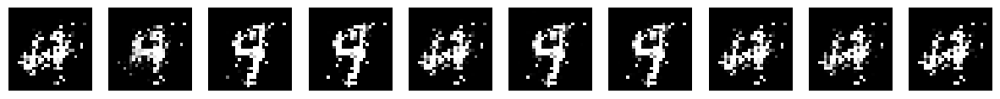

Epoch 86; Discriminator: 1.200, Generator: 0.824


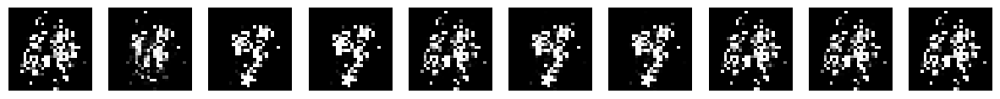

Epoch 87; Discriminator: 1.328, Generator: 0.841


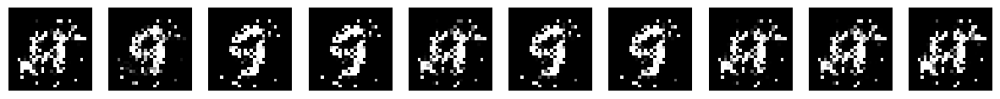

Epoch 88; Discriminator: 1.292, Generator: 0.819


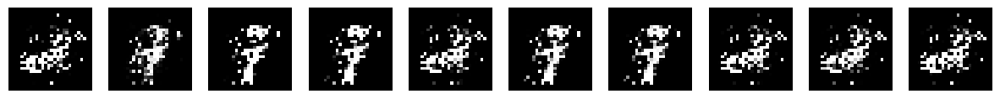

Epoch 89; Discriminator: 1.261, Generator: 0.869


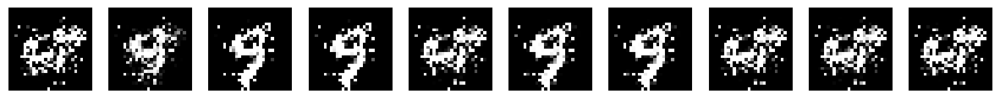

Epoch 90; Discriminator: 1.317, Generator: 0.917


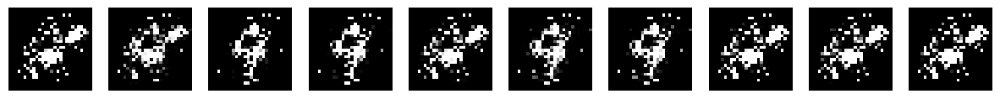

Epoch 91; Discriminator: 1.380, Generator: 0.786


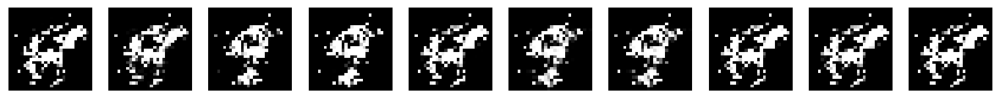

Epoch 92; Discriminator: 1.357, Generator: 0.775


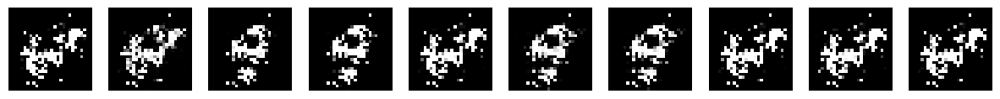

Epoch 93; Discriminator: 1.337, Generator: 0.740


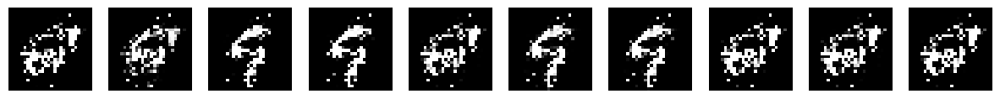

Epoch 94; Discriminator: 1.356, Generator: 0.745


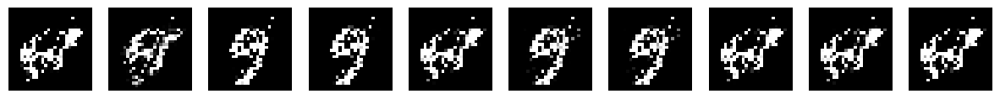

Epoch 95; Discriminator: 1.402, Generator: 0.790


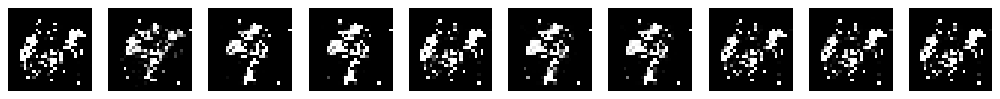

Epoch 96; Discriminator: 1.408, Generator: 0.797


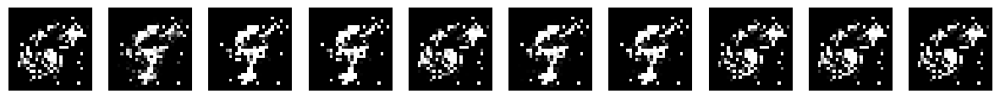

Epoch 97; Discriminator: 1.296, Generator: 0.821


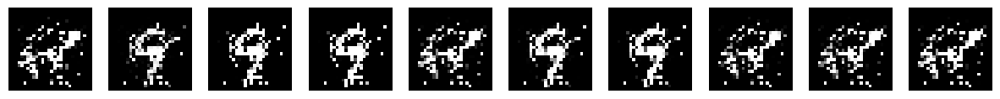

Epoch 98; Discriminator: 1.086, Generator: 0.787


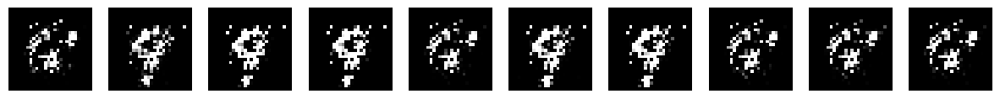

Epoch 99; Discriminator: 1.292, Generator: 0.951


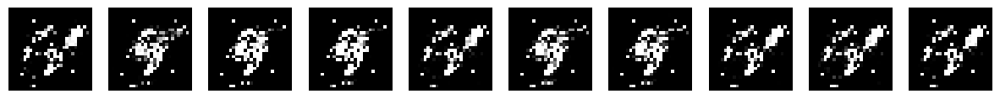

In [ ]:
# Chiffre 9

for epoch in trange(100):
    for real_data, labels in mnist_loader:

        ########### votre code ic ############
        real_data = real_data.view(-1, data_dim).to(device)
        labels_one_hot = F.one_hot(labels, num_classes=10).float().to(device)

        # Train the discriminator
        D_optimizer.zero_grad()
        z = torch.randn(real_data.size(0), hidden_dim).to(device)
        fake_labels = torch.zeros(real_data.size(0), 1).to(device)
        real_labels = torch.ones(real_data.size(0), 1).to(device)

        # Générer des données avec le générateur
        fake_data = generator(torch.cat([z, labels_one_hot], dim=1))

        # Calculer la perte du discriminateur
        output_real = discriminator(torch.cat([real_data, labels_one_hot], dim=1))
        loss_real = F.binary_cross_entropy(output_real, real_labels)
        output_fake = discriminator(torch.cat([fake_data.detach(), labels_one_hot], dim=1))
        loss_fake = F.binary_cross_entropy(output_fake, fake_labels)
        D_loss = loss_real + loss_fake

        # Rétropropagation et mise à jour des poids du discriminateur
        D_loss.backward()
        D_optimizer.step()

        # Train the generator
        G_optimizer.zero_grad()
        fake_labels = torch.ones(real_data.size(0), 1).to(device)

        # Calculer la perte du générateur
        output_fake = discriminator(torch.cat([fake_data, labels_one_hot], dim=1))
        G_loss = F.binary_cross_entropy(output_fake, fake_labels)

        # Rétropropagation et mise à jour des poids du générateur
        G_loss.backward()
        G_optimizer.step()

    tqdm.write(f"Epoch {epoch}; Discriminator: {D_loss.item():.3f}, Generator: {G_loss.item():.3f}")
    plot_images(generator, z_display, digit=9)